In [ ]:
#### A FAIRE pour présenter à Hervé
                                                                               
#   Le principe du chunking est présent dans la plupart des bouquins sur le NLP
#   exemple : "Oreilly chunking with Python"
# - diagnostic : cause des titres de produits pas du tout découpés ?
# - est-ce que les stopwords servent vraiment ?
# - les résultats obtenus 
# - bémol sur les résultats car ce modèle est évalué sur des titres qui ont eu la chance d'avoir un découpage
# parmi les propriétés des produits
# On voit que la plupart possède en fait une seule entité dans leurs titres


# BUT : améliorer le nombre de couples de produits qui matchent
# pour le BIO en utilisant en plus :
# - les entités en MAJUSCULES et celles entre guillemets
# - une métrique fonction de la proportion de mots retrouvés dans les titres
#   par l'extraction des entités. Ce qui permet potentiellement de trouver 
# plus de couples qui matchent

# Autre question : comment paramétrer :
#     - un titre particulier à découper
#     - l'ajout de corpus = ajout de descriptions ?

# - Pour l'instant, pas question d'utiliser des expressions régulières en NP, ADJP, ADVP et PP
# qui peuvent etre spécifiques au vin, BIO, smartphones, etc ...

# - Autres solutions :
#     modèle CRF
#     ou Deep learning : RNN cf mooc "named entity recognition"
# Par exemple: le modèle CRF ou DL pourrait prédire 
#     pour une description donnée, les entités présentes
# Et toutes les entités trouvées = vocabulaires d'entités qui servent à découper les titres plus finement que 
# la méthode "chunking" NLP 


# Autre perspective: matcher avec la CV des images de produits
# mais pour le vin = extraire les étiquettes
# appliquer un modèle de type DeepFace aux étiquettes

# Ou appliquer juste une méthode de Computer Vision 
# cf méthode de Serge mais l'efficacité dépendrait de la qualité
# des images qui peut différer entre les distributeurs

# Minhash lsh : pas utilisé pour le moment
# - échantillon vérité de titres tiré parmi 
# - les candidats en sortie de Minhash lsh : obtenir un découpage vérité 
# - Evaluer le modèle

#### step_0_import_data

In [1]:
# A faire au début, pour utiliser "%autoreload" : 
%load_ext autoreload
%autoreload

import pandas as pd
pd.set_option('display.max_colwidth',-1)

In [2]:
from functions import fun_create_df_cleansing_titles_find_ngrams as fc

# Renseigner le chemin des données source:
data_folder = "/home/hapax94/Documents/vincent/jupyter/carrefour_bio/fichiers_générés_par_Hervé"

orgc_crf_product = fc.create_df("orgc_crf_product",data_folder + "/crf/","utf8")
orgc_crf_product['distributeur'] = 'crf'

orgc_gwz_product = fc.create_df("orgc_gwz_product",data_folder + "/gwz/","utf8")
orgc_gwz_product['distributeur'] = 'gwz'

orgc_ntr_product = fc.create_df("orgc_ntr_product",data_folder + "/ntr/","utf8")
orgc_ntr_product['distributeur'] = 'ntr'

orgc_wbe_product = fc.create_df("orgc_wbe_product",data_folder + "/wbe/","utf8")
orgc_wbe_product['distributeur'] = 'wbe'

name_file: orgc_crf_product
which_file product
name_file: orgc_gwz_product
which_file product
name_file: orgc_ntr_product
which_file product
name_file: orgc_wbe_product
which_file product


In [3]:
# On rassemble tous les produits bio dans un dataframe
import pandas as pd
frames = [orgc_crf_product, orgc_gwz_product, orgc_ntr_product, orgc_wbe_product]
orgc_descriptions = pd.concat(frames)

del frames
del orgc_crf_product, orgc_gwz_product, orgc_ntr_product, orgc_wbe_product 

In [4]:
# orgc_descriptions.shape

(17123, 17)

In [5]:
# orgc_descriptions.describe()

On constate que le "xtitle" il y a 16754 titres distincts<br>
On peut regarder comment sont les "titles" en doublons : cf tout en bas du Notebook

On doit créer un titre plus précis avec xtitle + xbrand + xsubtitle<br>
Mais pour l'instant je ne prends que : xtitle + xbrand, car le "xsubtitle" est trop détaillé pour GREENWEEZ !

Ci-dessous : PAS DANS LE PIPELINE
Je cherche le nombre de mots total dans toutes les descriptions

In [43]:
# %%time
# from functions import fun_data_cleansing as fd

# number_of_words = 0
# for row in orgc_descriptions.itertuples():
#     description_temp = row.xdescription
#     number_temp = len(description_temp.split(' '))
    
#     number_of_words += number_temp
    
# print (number_of_words)

# Il y a 738338 mots avec split(' ') en tout parmi les 16646 descriptions distinctes de produits BIO
# J'ai .....  mots avec "word_tokenize"

# Donc les 100000 mots sont largement atteints afin d'appliquer (cf andrew Ng COURS 5 sur word embeddings)
# du "Transfer learning" pour faire du "word embeddings" 

738338
CPU times: user 67.2 ms, sys: 4.04 ms, total: 71.2 ms
Wall time: 70.1 ms


In [29]:
### ON VEUT TESTER si un titre peut etre découpé : "Domaine Anne Gros Clos-de-Vougeot Le Grand Maupertui"
# On va insérer une ligne dans "wine_descriptions" avec la colonne "title"
# cf http://avis-vin.lefigaro.fr/vins-champagne/bourgogne/cote-de-nuits/bourgogne/d11273-domaine-anne-gros/v11905-domaine-anne-gros-clos-de-vougeot-le-grand-maupertui/vin-rouge


# var_title = "Domaine Anne Gros Clos-de-Vougeot Le Grand Maupertui"
# wine_descriptions = wine_descriptions.append({'slug':'',
#                           'fil_ariane':'',
#                           'title':var_title,
#                           'url':'',
#                           'description':'',
#                           'image_url':'',
#                           'column_one':''}, ignore_index=True)

# wine_descriptions[wine_descriptions["title"] == "Domaine Anne Gros Clos-de-Vougeot Le Grand Maupertui"]

In [30]:
# On va regarder si il peut être découpé ?
# Est-ce des entités déjà trouvées grace au résultat n°2 peuvent découper ce titre ?

In [31]:
# Corpus = toutes les descriptions stocké dans une liste
# corpus = []
# for row in wine_descriptions.itertuples():
#     corpus.append(row.description)

#### step_1_data_cleansing
Ne concerne que les titres

Pour le BIO, on se demande quels caractères spéciaux sont présents dans les titres ?

In [54]:
# %%time

# all_special_characters_in_titles = []
# for row in orgc_descriptions.itertuples():
#     all_special_temp = re.sub('[A-Za-z0-9]+', '', unicodedata.normalize('NFD', row.xtitle).encode('ascii', 'ignore').decode('ascii')).strip()
#     if all_special_temp not in all_special_characters_in_titles:
#         all_special_characters_in_titles.append(all_special_temp)

CPU times: user 84.7 ms, sys: 3 µs, total: 84.7 ms
Wall time: 83.7 ms


CONCLUSION pour nettoyer les titres :
- pourquoi le '"' est remplacé par le '' pour le vin ?
- car pour le BIO, il est intéressant de garder ces " ", qui permettent de splitter les titres
afin d'extraire une entité 
- On va essayer de splitter les titres avec :
 les mots à l'intérieur des '"' 
 les mots séparés par ' - ' ou ' : '
 les mots en majuscule
Ensuite il faudra chercher les entités grace au Chunking
dans les parties splittées.

In [ ]:
********************************************************
******** PENSER A ENLEVER "bio" des stopwords **********
********************************************************

In [ ]:
1. Création de la colonne "titre sans stopwords" grace à : <br>
    Nettoyage des titres bruts :
    - suppression des pattern  " ' " et "''"
    - suppression des blancs inutiles de manière à ne garder qu'un seul blanc du type ' ' entre les mots
    - suppression des parenthèses "(" et ")"
    - suppression des accents

    Suppression des stopwords: on essaye en mettant 'bio'
    
2. Extraction des entités en majuscules grace aux titres sans stopwords

3. Extraction des entités comprises entre guillements grace aux titres sans stopwords

In [4]:
from functions import fun_data_cleansing as fd

orgc_descriptions["title_new"] = orgc_descriptions['xtitle'].map(fd.cleansing_titles)

# Suppression des stopwords
orgc_descriptions["title_without_stopwords"] = orgc_descriptions['title_new'].map(fd.remove_stopwords)

# Ajouter un split en mettant de coté les mots en MAJUSCULES
orgc_descriptions["title_splitted_uppercase"] = orgc_descriptions["title_without_stopwords"].map(fd.split_words_uppercase)
# Ajouter un split en mettant de coté les mots compris entre deux guillemets
orgc_descriptions["title_splitted_guillemets"] = orgc_descriptions["title_without_stopwords"].map(fd.split_words_guillemets)

In [5]:
# ATTENTION : pb avec :
# orgc_descriptions[orgc_descriptions['xslug'] == "cereales-bebe-biscuite-des-6-mois-bio-p-tite-cereale-nestle-7613036571135"]

,xid,xtitle,xbrand,xbreadcrumb,xsubtitle,xdescription,xslug,ximg,xmeta_title,xmeta_description,...,xapi,xweb,xcrawled_at,xurl,xru,distributeur,title_new,title_without_stopwords,title_splitted_uppercase,title_splitted_guillemets
232,cereales-bebe-biscuite-des-6-mois-bio-p-tite-cereale-nestle-7613036571135,Céréales bébé biscuité dès 6 mois bio P'tite Céréale NESTLÉ,Nestle,Accueil > Le Monde de Bébé > Céréales pour bébé > Céréales déshydratées,,"Acheter votre Céréales bébé biscuité dès 6 mois bio P'tite Céréale NESTLÉ en ligne au même prix qu'en magasin, profitez de nos promotions et faites vous livrer ou venez retirer vos courses rapidement dans votre magasin.",cereales-bebe-biscuite-des-6-mois-bio-p-tite-cereale-nestle-7613036571135,https://www.carrefour.fr/media/1500x1500/Photosite/PGC/EPICERIE/7613036571135_PHOTOSITE_20180804_044112_0.jpg?placeholder=1,Céréales bébé biscuité dès 6 mois bio P'tite Céréale NESTLÉ pas cher au Meilleur Prix,"Acheter votre Céréales bébé biscuité dès 6 mois bio P'tite Céréale NESTLÉ en ligne au même prix qu'en magasin, profitez de nos promotions et faites vous livrer ou venez retirer vos courses rapidement dans votre magasin.",...,v1.0,crf,2019-01-17 19:54:18,https://www.carrefour.fr/p/cereales-bebe-biscuite-des-6-mois-bio-p-tite-cereale-nestle-7613036571135,19-01-17\n,crf,Cereales bebe biscuite des 6 mois bio P'tite Cereale NESTLE,Cereales bebe biscuite 6 mois bio P'tite Cereale NESTLE,[NESTLE],[]


In [20]:
orgc_descriptions

,xid,xtitle,xbrand,xbreadcrumb,xsubtitle,xdescription,xslug,ximg,xmeta_title,xmeta_description,...,xapi,xweb,xcrawled_at,xurl,xru,distributeur,title_new,title_without_stopwords,title_splitted_uppercase,title_splitted_guillemets
0,fromage-bio-frais-carrefour-bio-3245413442420,Fromage bio frais CARREFOUR BIO,Carrefour Bio,"Accueil > Crémerie > Yaourts, desserts et spécialités végétales > Yaourts Nature et Fromages blancs",,"Acheter votre Fromage bio frais CARREFOUR BIO en ligne au même prix qu'en magasin, profitez de nos promotions et faites vous livrer ou venez retirer vos courses rapidement dans votre magasin.",fromage-bio-frais-carrefour-bio-3245413442420,https://www.carrefour.fr/media/1500x1500/Photosite/PGC/P.L.S./3245413442420_PHOTOSITE_20160922_080810_0.jpg?placeholder=1,Fromage bio frais CARREFOUR BIO pas cher au Meilleur Prix,"Acheter votre Fromage bio frais CARREFOUR BIO en ligne au même prix qu'en magasin, profitez de nos promotions et faites vous livrer ou venez retirer vos courses rapidement dans votre magasin.",...,v1.0,crf,2019-01-17 19:53:16,https://www.carrefour.fr/p/fromage-bio-frais-carrefour-bio-3245413442420,19-01-17\n,crf,Fromage bio frais CARREFOUR BIO,Fromage frais CARREFOUR BIO,[CARREFOUR BIO],[]
1,yaourts-bio-nature-carrefour-bio-3245413442338,Yaourts bio nature CARREFOUR BIO,Carrefour Bio,"Accueil > Crémerie > Yaourts, desserts et spécialités végétales > Yaourts Nature et Fromages blancs",,"Acheter votre Yaourts bio nature CARREFOUR BIO en ligne au même prix qu'en magasin, profitez de nos promotions et faites vous livrer ou venez retirer vos courses rapidement dans votre magasin.",yaourts-bio-nature-carrefour-bio-3245413442338,https://www.carrefour.fr/media/1500x1500/Photosite/PGC/P.L.S./3245413442338_PHOTOSITE_20161005_084045_0.jpg?placeholder=1,Yaourts bio nature CARREFOUR BIO pas cher au Meilleur Prix,"Acheter votre Yaourts bio nature CARREFOUR BIO en ligne au même prix qu'en magasin, profitez de nos promotions et faites vous livrer ou venez retirer vos courses rapidement dans votre magasin.",...,v1.0,crf,2019-01-17 19:53:22,https://www.carrefour.fr/p/yaourts-bio-nature-carrefour-bio-3245413442338,19-01-17\n,crf,Yaourts bio nature CARREFOUR BIO,Yaourts nature CARREFOUR BIO,[CARREFOUR BIO],[]
2,cafe-bio-equilibre-carrefour-bio-3560070712786,Café bio équilibré CARREFOUR BIO,Carrefour Bio,Accueil > Epicerie Sucrée > Boissons du matin et du soir > Cafés moulus et en grains,,"Acheter votre Café bio équilibré CARREFOUR BIO en ligne au même prix qu'en magasin, profitez de nos promotions et faites vous livrer ou venez retirer vos courses rapidement dans votre magasin.",cafe-bio-equilibre-carrefour-bio-3560070712786,https://www.carrefour.fr/media/1500x1500/Photosite/PGC/EPICERIE/3560070712786_PHOTOSITE_20181023_161553_0.jpg?placeholder=1,Café bio équilibré CARREFOUR BIO pas cher au Meilleur Prix,"Acheter votre Café bio équilibré CARREFOUR BIO en ligne au même prix qu'en magasin, profitez de nos promotions et faites vous livrer ou venez retirer vos courses rapidement dans votre magasin.",...,v1.0,crf,2019-01-17 19:53:22,https://www.carrefour.fr/p/cafe-bio-equilibre-carrefour-bio-3560070712786,19-01-17\n,crf,Cafe bio equilibre CARREFOUR BIO,Cafe equilibre CARREFOUR BIO,[CARREFOUR BIO],[]
3,pain-bio-cereales-carrefour-bio-3523680347823,Pain bio céréales CARREFOUR BIO,Carrefour Bio,Accueil > Pains et Pâtisseries > Mon boulanger > Pain,,"Acheter votre Pain bio céréales CARREFOUR BIO en ligne au même prix qu'en magasin, profitez de nos promotions et faites vous livrer ou venez retirer vos courses rapidement dans votre magasin.",pain-bio-cereales-carrefour-bio-3523680347823,https://www.carrefour.fr/media/1500x1500/Photosite/PRODUITS_FRAIS_TRANSFORMATION/BOULANGERIE_PATISSERIE/3523680347823_PHOTOSITE_20171021_043559_0.jpg?placeholder=1,Pain bio céréales CARREFOUR BIO pas cher au Meilleur Prix,"Acheter votre Pain bio céréales CARREFOUR BIO en ligne au même prix qu'en magasin, profitez de nos promotions et faites vous

In [ ]:
# 05/03/2019 : ATTENTION 
# ON EXTRAIT QUE SI IL S'AGIT D'UNE ENTITE ENTRE MAJUSCULES 
# DIFFERENTE DE "xbrand" 

In [ ]:
JE N'UTILISE PAS POUR L'INSTANT la colonne "title_splitted_uppercase_not_brand"

In [26]:
def extract_title_splitted_uppercase_not_brand(df):
    
    temp_brand = fd.remove_stopwords(fd.cleansing_titles(df['xbrand']).upper())
    if temp_brand != '':
        if df['title_splitted_uppercase'] != []:
            if temp_brand != df['title_splitted_uppercase'][0]:
                resultat = df['title_splitted_uppercase']
            else:
                resultat =  []
        else:
            resultat = df['title_splitted_uppercase']
    else :
        resultat = df['title_splitted_uppercase']
    return resultat

orgc_descriptions["title_splitted_uppercase_not_brand"] = orgc_descriptions.apply(extract_title_splitted_uppercase_not_brand, axis = 1)

In [5]:
# orgc_descriptions[orgc_descriptions['title_without_stopwords'].str.contains("'")]

,xid,xtitle,xbrand,xbreadcrumb,xsubtitle,xdescription,xslug,ximg,xmeta_title,xmeta_description,...,xapi,xweb,xcrawled_at,xurl,xru,distributeur,title_new,title_without_stopwords,title_splitted_uppercase,title_splitted_guillemets
76,plat-cuisine-bio-cereales-et-lentilles-sans-gluten-jardin-bio-logique-3760020508067,"Plat cuisiné bio céréales et lentilles, sans gluten JARDIN BIO'LOGIQUE",Jardin Biologique,Accueil > Epicerie Salée > Les Plats cuisinés > Plats individuels,,"Acheter votre Plat cuisiné bio céréales et lentilles, sans gluten JARDIN BIO'LOGIQUE en ligne au même prix qu'en magasin, profitez de nos promotions et faites vous livrer ou venez retirer vos courses rapidement dans votre magasin.",plat-cuisine-bio-cereales-et-lentilles-sans-gluten-jardin-bio-logique-3760020508067,https://www.carrefour.fr/media/1500x1500/Photosite/PGC/EPICERIE/3760020508067_PHOTOSITE_20170623_161604_0.jpg?placeholder=1,"Plat cuisiné bio céréales et lentilles, sans gluten JARDIN BIO'LOGIQUE pas cher au Meilleur Prix","Acheter votre Plat cuisiné bio céréales et lentilles, sans gluten JARDIN BIO'LOGIQUE en ligne au même prix qu'en magasin, profitez de nos promotions et faites vous livrer ou venez retirer vos courses rapidement dans votre magasin.",...,v1.0,crf,2019-01-17 19:53:40,https://www.carrefour.fr/p/plat-cuisine-bio-cereales-et-lentilles-sans-gluten-jardin-bio-logique-3760020508067,19-01-17\n,crf,"Plat cuisine bio cereales et lentilles, sans gluten JARDIN BIO'LOGIQUE","Plat cuisine bio cereales lentilles, gluten JARDIN BIO'LOGIQUE",[JARDIN BIO'LOGIQUE],[]
82,tapenade-d-olives-vertes-divin-bio-3760273430139,Tapenade d'olives vertes Divin Bio,Divin Bio,"Accueil > Epicerie Salée > Huiles, vinaigres, condiments et sauces > Béchamels et autres sauces",,"Acheter votre Tapenade d'olives vertes Divin Bio en ligne au même prix qu'en magasin, profitez de nos promotions et faites vous livrer ou venez retirer vos courses rapidement dans votre magasin.",tapenade-d-olives-vertes-divin-bio-3760273430139,https://www.carrefour.fr/media/1500x1500/Photosite/PGC/EPICERIE/3760273430139_PHOTOSITE_20180922_051809_0.jpg?placeholder=1,Tapenade d'olives vertes Divin Bio pas cher au Meilleur Prix,"Acheter votre Tapenade d'olives vertes Divin Bio en ligne au même prix qu'en magasin, profitez de nos promotions et faites vous livrer ou venez retirer vos courses rapidement dans votre magasin.",...,v1.0,crf,2019-01-17 19:53:40,https://www.carrefour.fr/p/tapenade-d-olives-vertes-divin-bio-3760273430139,19-01-17\n,crf,Tapenade d'olives vertes Divin Bio,Tapenade d'olives vertes Divin Bio,[],[]
83,nettoyant-menager-creme-a-recurer-l-arbre-vert-3450601026096,Nettoyant ménager crème à récurer L'ARBRE VERT,Arbre Vert,Accueil > Entretien et nettoyage > Produits nettoyants > Multi-usages,,"Acheter votre Nettoyant ménager crème à récurer L'ARBRE VERT en ligne au même prix qu'en magasin, profitez de nos promotions et faites vous livrer ou venez retirer vos courses rapidement dans votre magasin.",nettoyant-menager-creme-a-recurer-l-arbre-vert-3450601026096,https://www.carrefour.fr/media/1500x1500/Photosite/PGC/DROGUERIE/3450601026096_PHOTOSITE_20170623_162303_0.jpg?placeholder=1,Nettoyant ménager crème à récurer L'ARBRE VERT pas cher au Meilleur Prix,"Acheter votre Nettoyant ménager crème à récurer L'ARBRE VERT en ligne au même prix qu'en magasin, profitez de nos promotions et faites vous livrer ou venez retirer vos courses rapidement dans votre magasin.",...,v1.0,crf,2019-01-17 19:53:41,https://www.carrefour.fr/p/nettoyant-menager-creme-a-recurer-l-arbre-vert-3450601026096,19-01-17\n,crf,Nettoyant menager creme a recurer L'ARBRE VERT,Nettoyant menager creme a recurer L'ARBRE VERT,[L'ARBRE VERT],[]
84,nettoyant-menager-multi-surfaces-romarin-l-arbre-vert-3450601026171,Nettoyant ménager multi-surfaces romarin L'ARBRE VERT,Arbre Vert,Accueil > Entretien et nettoyage > Produits nettoyants > Multi-usages,,"Acheter votre Nettoyant ménager multi-surfaces romarin L'ARBRE VERT en ligne au mêm

In [39]:
orgc_descriptions.sample(n=20)

,xid,xtitle,xbrand,xbreadcrumb,xsubtitle,xdescription,xslug,ximg,xmeta_title,xmeta_description,...,xweb,xcrawled_at,xurl,xru,distributeur,title_new,title_without_stopwords,title_splitted_uppercase,title_splitted_guillemets,title_splitted_uppercase_not_brand
2927,boisson-vegetale-choco-noisettes-bio-bjorg-3229820789927,Boisson végétale choco noisettes bio BJORG,Bjorg,"Accueil > Crémerie > Lait, boissons lactées et végétales > Boissons végétales",,"Acheter votre Boisson végétale choco noisettes bio BJORG en ligne au même prix qu'en magasin, profitez de nos promotions et faites vous livrer ou venez retirer vos courses rapidement dans votre magasin.",boisson-vegetale-choco-noisettes-bio-bjorg-3229820789927,https://www.carrefour.fr/media/1500x1500/Photosite/PGC/EPICERIE/3229820789927_PHOTOSITE_20180116_125904_0.jpg?placeholder=1,Boisson végétale choco noisettes bio BJORG pas cher au Meilleur Prix,"Acheter votre Boisson végétale choco noisettes bio BJORG en ligne au même prix qu'en magasin, profitez de nos promotions et faites vous livrer ou venez retirer vos courses rapidement dans votre magasin.",...,crf,2019-01-17 20:05:16,https://www.carrefour.fr/p/boisson-vegetale-choco-noisettes-bio-bjorg-3229820789927,19-01-17\n,crf,Boisson vegetale choco noisettes bio BJORG,Boisson vegetale choco noisettes BJORG,[BJORG],[],[]
5304,primeal-avoine-decortiquee-500-g-p5491,Avoine décortiquée 500 g,Priméal,"Accueil > Epicerie > Céréales, graines, pâtes, riz > Flocons de Céréales > Flocons d'Avoine",Céréales grains d'Avoine décortiquée Bio - Sachet de 500 grammes. Céréales grains d'Avoine décortiquée Bio - Sachet de 500 grammes.,Céréales grains d'Avoine décortiquée Bio - Sachet de 500 grammes.Céréales grains d'Avoine décortiquée Bio - Sachet de 500 grammes.,primeal-avoine-decortiquee-500-g-p5491,https://static.greenweez.com/images/products/5000/600/primeal-avoine-decortiquee-500-g.jpg,,Avoine décortiquée 500 g Priméal - Flocons d'Avoine - Flocons de Céréales - Céréales grains d'Avoine décortiquée Bio - Sachet de 500 grammes.,...,gwz,2019-01-17 19:33:45,https://www.greenweez.com/primeal-avoine-decortiquee-500-g-p5491,19-01-17\n,gwz,Avoine decortiquee 500 g,Avoine decortiquee 500 g,[],[],[]
1677,puree-pomme-fruits-exo-4x100g,Purée De Pomme Fruits Exotiques Sans Sucres Ajoutés 4x100g Bio,Danival,"Accueil > Epicerie sucrée > Compotes et purées de fruits > Coupelles, Fruits au sirop",Kilos,"Purée de pomme fruits exotiques 4x100G Bio.La tendance est à l'exotisme! C'est pourquoi, les cuisiniers deDanivalont créé pour vous cette nouvelle recette fruitée. Un doux mélange de plusieurs fruits tropicaux : banane, mangue, fruits de la passion, associés à une pomme bio ""Qualité supérieure & locale"".Depuis 25 ans,Danivalprépare des produits BIO dans le cadre protégé du Moulin d'Andiran, dans le Lot-et-Garonne.100% fruit, sans sucres ajoutés.",puree-pomme-fruits-exo-4x100g,https://naturalia.fr/media/catalog/product/cache/image/265x265/beff4985b56e3afdbeabfc89641a4582/d/a/danival-pommes-fruits-exotiques.jpg,Purée De Pomme Fruits Exotiques Sans Sucres Ajoutés 4x100g Bio,"<p><strong>Purée de pomme fruits exotiques 4x100G Bio.</strong></p><p>La tendance est à l'exotisme! C'est pourquoi, les cuisiniers de <strong>Danival</strong> ont créé pour vous cette nouvelle recette fruitée. Un doux mélange de plusieurs fruits tropica",...,ntr,2019-01-17 18:59:41,https://naturalia.fr/puree-pomme-fruits-exo-4x100g,19-01-17\n,ntr,Puree De Pomme Fruits Exotiques Sans Sucres Ajoutes 4x100g Bio,Puree De Pomme Fruits Exotiques Sans Sucres Ajoutes 4x100g Bio,[],[],[]
2191,9852-les-pansements-en-coton-bio-3760138837301,Les Pansements Coton Bio,Anaé,Accueil > Hygiène Soins Bio > Hygiène bio > Accessoires hygiène bio,,"Les Pansements Anaé réalisés en coton bio et à partir d'adhésif naturels, micro-poreux pour laisser respirer la peau et ne contiennent pas de PVC.",9852-les-pansements-en-coton-bio-3760138837301,https://www.webecologie.com/21795-large_default/les-pansements-en-coton-bio.jp

Création d'une colonne des titres splittés par les séparateurs : {' , ';' : ',' - '} <br>
Y-a-t-il d'autres séparateurs possibles ?


In [5]:
orgc_descriptions["title_splitted"] = orgc_descriptions["title_without_stopwords"].map(fd.split_title)

In [33]:
# Vérification de l'extraction des entités en majuscules :

# df_add_uppercase = orgc_descriptions[['xtitle','title_splitted_uppercase']]
# df_add_uppercase['len_uppercase'] = df_add_uppercase['title_splitted_uppercase'].map(lambda x: len(x))
# df_add_uppercase[df_add_uppercase['len_uppercase'] > 0]

/home/hapax94/.pyenv/versions/my_env_new/lib/python3.6/site-packages/ipykernel/__main__.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  from ipykernel import kernelapp as app


,xtitle,title_splitted_uppercase,len_uppercase
0,Fromage bio frais CARREFOUR BIO,[CARREFOUR BIO],1
1,Yaourts bio nature CARREFOUR BIO,[CARREFOUR BIO],1
2,Café bio équilibré CARREFOUR BIO,[CARREFOUR BIO],1
3,Pain bio céréales CARREFOUR BIO,[CARREFOUR BIO],1
5,Fromage bio frais CARREFOUR BIO,[CARREFOUR BIO],1
6,Fromage bio féta CARREFOUR BIO,[CARREFOUR BIO],1
7,Origan bio déshydraté CARREFOUR BIO,[CARREFOUR BIO],1
9,Pâtes bio Spaghetti CARREFOUR BIO,[CARREFOUR BIO],1
10,Yaourts bio vanille CARREFOUR BIO,[CARREFOUR BIO],1
11,Emmental bio râpé CARREFOUR BIO,[CARREFOUR BIO],1


In [24]:
# On regarde quels titres bruts contiennent des guillemets
# orgc_descriptions[orgc_descriptions["xtitle"].str.contains('"')]

,xid,xtitle,xbrand,xbreadcrumb,xsubtitle,xdescription,xslug,ximg,xmeta_title,xmeta_description,...,xcrawled_at,xurl,xru,distributeur,title_new,title_without_stopwords,title_splitted_uppercase,title_splitted_guillemets,title_splitted,title_splitted_uppercase_new
3009,vin-rouge-bio-cotes-du-rhone-vin-gourmand-dauvergne-ranvier-3700689906552,"Vin rouge bio Côtes-du-Rhône ""Vin Gourmand"" DAUVERGNE RANVIER",Refs.Sans Marque,Accueil > Boissons et Cave à vins > Cave à vins > Vins Rouges > Vallée du Rhône,,"Acheter votre Vin rouge bio Côtes-du-Rhône ""Vin Gourmand"" DAUVERGNE RANVIER en ligne au même prix qu'en magasin, profitez de nos promotions et faites vous livrer ou venez retirer vos courses rapidement dans votre magasin.",vin-rouge-bio-cotes-du-rhone-vin-gourmand-dauvergne-ranvier-3700689906552,https://www.carrefour.fr/media/1500x1500/Photosite/PGC/BOISSONS/3700689906552_PHOTOSITE_20180725_153720_0.jpg?placeholder=1,"Vin rouge bio Côtes-du-Rhône ""Vin Gourmand"" DAUVERGNE RANVIER pas cher au Meilleur Prix","Acheter votre Vin rouge bio Côtes-du-Rhône ""Vin Gourmand"" DAUVERGNE RANVIER en ligne au même prix qu'en magasin, profitez de nos promotions et faites vous livrer ou venez retirer vos courses rapidement dans votre magasin.",...,2019-01-17 20:05:35,https://www.carrefour.fr/p/vin-rouge-bio-cotes-du-rhone-vin-gourmand-dauvergne-ranvier-3700689906552,19-01-17\n,crf,"Vin rouge bio Cotes-du-Rhone ""Vin Gourmand"" DAUVERGNE RANVIER","Vin rouge bio Cotes-du-Rhone ""Vin Gourmand"" DAUVERGNE RANVIER",[DAUVERGNE RANVIER],[Vin Gourmand],"Vin rouge bio Cotes-du-Rhone ""Vin Gourmand"" DAUVERGNE RANVIER",[DAUVERGNE RANVIER]
692,destination-the-vert-earl-grey-100g-p48643,"Thé vert ""Earl Grey"" 100g",Destination,Accueil > Epicerie > Thés bio et infusions > Thé Vert > Thé vert vrac,"Thé vert ""Earl Grey"" : Thé délicat et légèrement corsé, associé à la fraîcheur de bergamote d'Italie. Aromatisé à la bergamote biologique -Tasse fruitée, fraîche. A déguster à tout moment de la journée sans modération. Sachet de 100g. Thé vert ""Earl Grey"" : Thé délicat et légèrement corsé, associé à la fraîcheur de bergamote d'Italie. Aromatisé à la bergamote biologique -Tasse fruitée, fraîche. A déguster à tout moment de la journée sans modération. Sachet de 100g.","Thé vert ""Earl Grey"" : Thé délicat et légèrement corsé, associé à la fraîcheur de bergamote d'Italie. Aromatisé à la bergamote biologique -Tasse fruitée, fraîche. A déguster à tout moment de la journée sans modération. Sachet de 100g.Thé vert ""Earl Grey"" : Thé délicat et légèrement corsé, associé à la fraîcheur de bergamote d'Italie. Aromatisé à la bergamote biologique -Tasse fruitée, fraîche. A déguster à tout moment de la journée sans modération. Sachet de 100g.",destination-the-vert-earl-grey-100g-p48643,https://static.greenweez.com/images/products/48000/600/destination-the-vert-earl-grey-100g.jpg,,Thé vert,...,2019-01-17 19:12:46,https://www.greenweez.com/destination-the-vert-earl-grey-100g-p48643,19-01-17\n,gwz,"The vert ""Earl Grey"" 100g","The vert ""Earl Grey"" 100g",[],[Earl Grey],"The vert ""Earl Grey"" 100g",[]
817,destination-the-noir-bio-earl-grey-ceylan-100g-p19843,"Thé Noir BIO ""Earl Grey Ceylan"" 100g",Destination,Accueil > Epicerie > Thés bio et infusions > Thé Noir,"Doux et fruité, le thé noir BIO Earl Grey vous offre une tasse pétillante de fraîcheur. Sachet de 100g. Doux et fruité, le thé noir BIO Earl Grey vous offre une tasse pétillante de fraîcheur. Sachet de 100g.","Doux et fruité, le thé noir BIO Earl Grey vous offre une tasse pétillante de fraîcheur. Sachet de 100g.Doux et fruité, le thé noir BIO Earl Grey vous offre une tasse pétillante de fraîcheur. Sachet de 100g.",destination-the-noir-bio-earl-grey-ceylan-100g-p19843,https://static.greenweez.com/images/products/19000/600/destination-the-noir-bio-earl-grey-ceylan-100g.jpg,,Thé Noir BIO,...,2019-01-17 19:13:20,https://www.greenweez.com/destination-the-noir-bio-earl-grey-ceylan-100g-p19843,19-01-17\n,gwz,"The Noir

In [21]:
# Extraction de l'année = millésime présent dans les titres SERT SEULEMENT AU VIN
# MEME SI IL Y A DU VIN dans les produits BIO, je m'en sers pas 
# EST CE QUE C'EST POSSIBLE DE S'EN SERVIR ?
# orgc_descriptions['year_in_title'] = orgc_descriptions["title_without_stopwords"].map(fd.year_in_title)

Création du dataframe "title_et_ngrams"<br>
- on utilise les slugs(appelés "xslug"), les noms de ditributeurs, les titres sans stopwords et les descriptions
- on nettoie un peu plus les titres sans stopwords en enlevant les blancs<br>
  qui peuvent etre autour des titres et en mettant en minuscules
- on renomme la colonne "xslug" en "slug"
- on enlève dans les titres sans stopwords les séparateurs du type virgule "," et deux-points ":"<br>
  On garde les tirets "-" (cf mots composés avec des "-")
- On remplace dans les titres sans stopwords, les séparateurs du type ' - ' par un espace du type ' '

In [6]:
# title_et_ngrams = orgc_descriptions[['xtitle','xbrand','xbreadcrumb','xsubtitle','xdescription']]
# Ou 
title_et_ngrams = orgc_descriptions[['xslug','distributeur','title_without_stopwords','xdescription']]

# On met en minuscules la colonne ''title_without_stopwords'
title_et_ngrams["title_temp"] = title_et_ngrams['title_without_stopwords'].map(lambda x: (x.strip()).lower())
title_et_ngrams = title_et_ngrams.drop("title_without_stopwords", axis =1)
title_et_ngrams.rename(columns={'title_temp': 'title_without_stopwords'}, inplace=True)

title_et_ngrams.rename(columns={'xslug': 'slug'}, inplace=True)

# Suppression de séparateurs présents dans les titres de type : '\s*[,:]\s*' 
title_et_ngrams['title_temp'] = title_et_ngrams['title_without_stopwords'].map(fd.remove_separateurs)

title_et_ngrams['title_without_stopwords_new'] = title_et_ngrams['title_temp'].str.replace(' - ',' ')
title_et_ngrams = title_et_ngrams.drop("title_temp", axis =1)

/home/hapax94/.pyenv/versions/my_env_new/lib/python3.6/site-packages/ipykernel/__main__.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


#### step_1_ngrams_frequences
Ne concerne que les titres

Ajout de nouvelles colonnes dans le dataframe "title_et_ngrams"<br>
- création à partir des titres sans stopwords, de la colonne des titres sans le pattern "année" du type AAAA
- on enlève dans les titres sans stopwords et sans année les séparateurs du type virgule "," et deux-points ":"<br>
  On garde les tirets "-" (cf mots composés avec des "-")
- On remplace dans les titres sans stopwords et sans année, les séparateurs du type ' - ' par un espace du type ' '
- on extrait la liste des mots qui composent les titres sans stopwords et sans année
- on nettoie la liste des mots qui composent les titres sans stopwords et sans année<br>
  en enlevant les blancs qui peuvent etre autour des mots, en mettant en minuscules<br>
  et en enlevant au début des mots, le pattern du type "' "<br>
  et en enlevant à la fin des mots, le pattern du type " '"<br>

In [7]:
from functions import fun_data_cleansing as fd

# Suppression de l'année dans les titres
title_et_ngrams["title_without_year"] = title_et_ngrams['title_without_stopwords'].map(fd.remove_year)

title_et_ngrams['title_temp'] = title_et_ngrams['title_without_year'].map(fd.remove_separateurs)

title_et_ngrams['title_without_year_for_words_title'] = title_et_ngrams['title_temp'].str.replace(' - ',' ')

title_et_ngrams = title_et_ngrams.drop("title_temp", axis =1)

 # 10/11/2018 : problème avec les "d'", extrait : "d'" et "''"
# title_et_ngrams['words_title'] = title_et_ngrams['title_without_year_for_words_title'].map(fd.word_tokenize)
title_et_ngrams['words_title'] = title_et_ngrams['title_without_year_for_words_title'].map(lambda x: x.split(' '))

# Sert surtout pour enlever les "' " qui peuvent être présents
title_et_ngrams['words_title_cleansed'] =  title_et_ngrams['words_title'].map(fd.cleansing_words_after_split)

In [26]:
# title_et_ngrams[title_et_ngrams['title_without_year'].str.contains("' ")][['title_new','title_without_stopwords','title_splitted','year_in_title','title_without_stopwords_new','title_without_year','title_without_year_for_words_title','words_title','words_title_cleansed']]

Ci-dessous : PAS DANS LE PIPELINE<br>
On crée un .csv pour le donner à R en vue de lancer éventuellement "Minhash-lsh"

In [421]:
# path_and_file = "/home/hapax94/Documents/vincent/R/minhash_lsh/data/bio_before_lsh.csv"
# title_et_ngrams[['distributeur','slug','title_without_stopwords_new']].to_csv(path_and_file,index= False)

In [29]:
# title_et_ngrams[title_et_ngrams['title_without_stopwords'].str.contains(" d'")]

,slug,distributeur,xdescription,title_without_stopwords,title_without_stopwords_new,title_without_year,title_without_year_for_words_title,words_title,words_title_cleansed
82,tapenade-d-olives-vertes-divin-bio-3760273430139,crf,"Acheter votre Tapenade d'olives vertes Divin Bio en ligne au même prix qu'en magasin, profitez de nos promotions et faites vous livrer ou venez retirer vos courses rapidement dans votre magasin.",tapenade d'olives vertes divin bio,tapenade d'olives vertes divin bio,tapenade d'olives vertes divin bio,tapenade d'olives vertes divin bio,"[tapenade, d'olives, vertes, divin, bio]","[tapenade, d'olives, vertes, divin, bio]"
95,deodorant-pierre-d-alun-fleur-d-alun-biopha-3286010012500,crf,"Acheter votre Déodorant pierre d'alun fleur d'alun BIOPHA en ligne au même prix qu'en magasin, profitez de nos promotions et faites vous livrer ou venez retirer vos courses rapidement dans votre magasin.",deodorant pierre d'alun fleur d'alun biopha,deodorant pierre d'alun fleur d'alun biopha,deodorant pierre d'alun fleur d'alun biopha,deodorant pierre d'alun fleur d'alun biopha,"[deodorant, pierre, d'alun, fleur, d'alun, biopha]","[deodorant, pierre, d'alun, fleur, d'alun, biopha]"
97,tapenade-d-olives-noires-divin-bio-3760273430122,crf,"Acheter votre Tapenade d'olives noires DIVIN BIO en ligne au même prix qu'en magasin, profitez de nos promotions et faites vous livrer ou venez retirer vos courses rapidement dans votre magasin.",tapenade d'olives noires divin bio,tapenade d'olives noires divin bio,tapenade d'olives noires divin bio,tapenade d'olives noires divin bio,"[tapenade, d'olives, noires, divin, bio]","[tapenade, d'olives, noires, divin, bio]"
121,huile-essentielle-d-orange-biologique-relaxante-so-bio-etic-3478820086424,crf,"Acheter votre Huile essentielle d'orange biologique relaxante SO'BIO ETIC en ligne au même prix qu'en magasin, profitez de nos promotions et faites vous livrer ou venez retirer vos courses rapidement dans votre magasin.",huile essentielle d'orange biologique relaxante so'bio etic,huile essentielle d'orange biologique relaxante so'bio etic,huile essentielle d'orange biologique relaxante so'bio etic,huile essentielle d'orange biologique relaxante so'bio etic,"[huile, essentielle, d'orange, biologique, relaxante, so'bio, etic]","[huile, essentielle, d'orange, biologique, relaxante, so'bio, etic]"
135,huile-essentielle-d-eucalyptus-radiata-bio-so-bio-etic-3517360000757,crf,"Acheter votre Huile essentielle d'eucalyptus radiata bio SO'BIO ÉTIC en ligne au même prix qu'en magasin, profitez de nos promotions et faites vous livrer ou venez retirer vos courses rapidement dans votre magasin.",huile essentielle d'eucalyptus radiata bio so'bio etic,huile essentielle d'eucalyptus radiata bio so'bio etic,huile essentielle d'eucalyptus radiata bio so'bio etic,huile essentielle d'eucalyptus radiata bio so'bio etic,"[huile, essentielle, d'eucalyptus, radiata, bio, so'bio, etic]","[huile, essentielle, d'eucalyptus, radiata, bio, so'bio, etic]"
154,diffuseur-prise-d-huiles-essentiels-chaleur-douce-so-bio-3517360013436,crf,"Acheter votre Diffuseur prise d'huiles essentiels chaleur douce SO'BIO en ligne au même prix qu'en magasin, profitez de nos promotions et faites vous livrer ou venez retirer vos courses rapidement dans votre magasin.",diffuseur prise d'huiles essentiels chaleur douce so'bio,diffuseur prise d'huiles essentiels chaleur douce so'bio,diffuseur prise d'huiles essentiels chaleur douce so'bio,diffuseur prise d'huiles essentiels chaleur douce so'bio,"[diffuseur, prise, d'huiles, essentiels, chaleur, douce, so'bio]","[diffuseur, prise, d'huiles, essentiels, chaleur, douce, so'bio]"
207,plat-bebe-bio-des-6-mois-courges-saute-d-agneau-good-gout-3770002327050,crf,"Acheter votre Plat bébé bio dès 6 mois, courges/sauté d'agneau GOOD GOÛT en ligne au même prix qu'en magasin, profitez de nos promotions et faites vous livrer ou venez retirer vos courses rapidement dans votre magasin.","plat bebe bio 6 mois, courge

Création des dictionnaires de 1-grams, 2-grams, 4-grams et 5-grams<br>
grâce à la colonne 'words_title_cleansed' du dataframe "title_et_ngrams"<br>
<br>
Ces dictionnaires ont leurs :<br>
    - clés égales aux n-grams présents dans les titres des produits
    - valeurs égales au nombre de fois qu'un n-gram est présent dans tous les titres des produits 

In [ ]:
# Parser
# A parser identifies sentences, words and word types in a string of text. 
# This involves tokenization (distinguishing between abbreviations and sentence breaks), 
# part-of-speech tagging (annotating words with their type, e.g., is
# can a NOUN or a VERB?) and chunking (grouping consecutive words that belong together).
# Parsing can be used to answer questions such as who did what and why and is useful in a wide range 
# of text mining applications. The pattern.en parser uses a lexicon of a 100,000 known words and their part-of-speech
# tag, along with rules for unknown words based on word suffix (e.g., -ly = ADVERB) and context (surrounding words).
# This approach is fast but not always accurate, since many words are ambiguous and hard to capture
# with simple rules. The overall accuracy is about 95% (95.8% on WSJ portions 22-24). 
# It is lower for informal language use (e.g., chat lang

In [8]:
print("\n On traite le dictionnaire des 1-grams !")

dict_all_1_grams = dict()

# 16/02/2018 : on utilise "words_title_cleansed" à la place de "words_title"

for row in title_et_ngrams.itertuples():
    flag_update_dict = False
    
#     ngram_presents = row.words_title
    ngram_presents = row.words_title_cleansed   
    
    for i in range(len(ngram_presents)):
          
        if ngram_presents[i] not in dict_all_1_grams :
            dict_all_1_grams[ngram_presents[i]] = 0
            
            if ngram_presents[i] in row.title_without_year_for_words_title:
                dict_all_1_grams[ngram_presents[i]] = 1
                flag_update_dict = True

        # Si on traite un nouveau "title" de vin
        # et que le ngram en question est déjà dans le dico,
        # On peut incrémenter le compteur 
        if ngram_presents[i] in dict_all_1_grams and flag_update_dict == False:
            if ngram_presents[i] in row.title_without_year_for_words_title:
                 dict_all_1_grams[ngram_presents[i]] = dict_all_1_grams[ngram_presents[i]] + 1

print("\n On traite le dictionnaire des 2-grams !")
dict_all_2_grams = dict()

for row in title_et_ngrams.itertuples():
    flag_update_dict = False
    
#     if find_ngrams(row.words_title,2) != []:
#         ngram_presents = find_ngrams(row.words_title,2)
    if fc.find_ngrams(row.words_title_cleansed,2) != []:
        ngram_presents = fc.find_ngrams(row.words_title_cleansed,2)
        
    for i in range(len(ngram_presents)):
          
        if ngram_presents[i] not in dict_all_2_grams :
            dict_all_2_grams[ngram_presents[i]] = 0 
            
            if ngram_presents[i] in row.title_without_year_for_words_title:
                dict_all_2_grams[ngram_presents[i]] = 1
                flag_update_dict = True

        # Si on traite un nouveau "title" de vin
        # et que le ngram en question est déjà dans le dico,
        # On peut incrémenter le compteur 
        if ngram_presents[i] in dict_all_2_grams and flag_update_dict == False:
            if ngram_presents[i] in row.title_without_year_for_words_title:
                 dict_all_2_grams[ngram_presents[i]] = dict_all_2_grams[ngram_presents[i]] + 1


print("\n On traite le dictionnaire des 3-grams !")
dict_all_3_grams = dict()

for row in title_et_ngrams.itertuples(): 
    flag_update_dict = False
    
#     if find_ngrams(row.words_title,3) != []:
#         ngram_presents = find_ngrams(row.words_title,3)
    if fc.find_ngrams(row.words_title_cleansed,3) != []:
        ngram_presents = fc.find_ngrams(row.words_title_cleansed,3)

    for i in range(len(ngram_presents)):
          
        if ngram_presents[i] not in dict_all_3_grams :
            dict_all_3_grams[ngram_presents[i]] = 0 
            
            if ngram_presents[i] in row.title_without_year_for_words_title:
                dict_all_3_grams[ngram_presents[i]] = 1
                flag_update_dict = True

        # Si on traite un nouveau "title" de vin
        # et que le ngram en question est déjà dans le dico,
        # On peut incrémenter le compteur 
        if ngram_presents[i] in dict_all_3_grams and flag_update_dict == False:
            if ngram_presents[i] in row.title_without_year_for_words_title:
                 dict_all_3_grams[ngram_presents[i]] = dict_all_3_grams[ngram_presents[i]] + 1

print("\n On traite le dictionnaire des 4-grams !")                
dict_all_4_grams = dict()

for row in title_et_ngrams.itertuples():
    flag_update_dict = False
    
    
#     if find_ngrams(row.words_title,4) != []:
#         ngram_presents = find_ngrams(row.words_title,4)
    if fc.find_ngrams(row.words_title_cleansed,4) != []:
        ngram_presents = fc.find_ngrams(row.words_title_cleansed,4)

    for i in range(len(ngram_presents)):
          
        if ngram_presents[i] not in dict_all_4_grams :
            dict_all_4_grams[ngram_presents[i]] = 0 
            
            if ngram_presents[i] in row.title_without_year_for_words_title:
                dict_all_4_grams[ngram_presents[i]] = 1
                flag_update_dict = True

        # Si on traite un nouveau "title" de vin
        # et que le ngram en question est déjà dans le dico,
        # On peut incrémenter le compteur 
        if ngram_presents[i] in dict_all_4_grams and flag_update_dict == False:
            if ngram_presents[i] in row.title_without_year_for_words_title:
                 dict_all_4_grams[ngram_presents[i]] = dict_all_4_grams[ngram_presents[i]] + 1
    
print("\n On traite le dictionnaire des 5-grams !")
dict_all_5_grams = dict()

for row in title_et_ngrams.itertuples():
    flag_update_dict = False
    
#     if find_ngrams(row.words_title,5) != []:
#         ngram_presents = find_ngrams(row.words_title,5)
    if fc.find_ngrams(row.words_title_cleansed,5) != []:
        ngram_presents = fc.find_ngrams(row.words_title_cleansed,5)


    for i in range(len(ngram_presents)):
          
        if ngram_presents[i] not in dict_all_5_grams :
            dict_all_5_grams[ngram_presents[i]] = 0 
            
            if ngram_presents[i] in row.title_without_year_for_words_title:
                dict_all_5_grams[ngram_presents[i]] = 1
                flag_update_dict = True

        # Si on traite un nouveau "title" de vin
        # et que le ngram en question est déjà dans le dico,
        # On peut incrémenter le compteur 
        if ngram_presents[i] in dict_all_5_grams and flag_update_dict == False:
            if ngram_presents[i] in row.title_without_year_for_words_title:
                 dict_all_5_grams[ngram_presents[i]] = dict_all_5_grams[ngram_presents[i]] + 1

del ngram_presents, row, i


 On traite le dictionnaire des 1-grams !

 On traite le dictionnaire des 2-grams !

 On traite le dictionnaire des 3-grams !

 On traite le dictionnaire des 4-grams !

 On traite le dictionnaire des 5-grams !


Nouvelle étape : création de nouveaux dictionnaires avec seulement clés ayant des comptages > 1<br>
Cela veut dire qu'on va s'intéresser que aux n-grams qui sont présents dans au moins 2 produits

In [9]:
dict_all_1_grams_to_update = dict()
for key in dict_all_1_grams.keys():
    if dict_all_1_grams[key] > 1: 
        dict_all_1_grams_to_update[key] = dict_all_1_grams[key] 

dict_all_2_grams_to_update = dict()
for key in dict_all_2_grams.keys():
    if dict_all_2_grams[key] > 1: 
        dict_all_2_grams_to_update[key] = dict_all_2_grams[key] 
        
dict_all_3_grams_to_update = dict()
for key in dict_all_3_grams.keys():
    if dict_all_3_grams[key] > 1: 
        dict_all_3_grams_to_update[key] = dict_all_3_grams[key] 

dict_all_4_grams_to_update = dict()
for key in dict_all_4_grams.keys():
    if dict_all_4_grams[key] > 1: 
        dict_all_4_grams_to_update[key] = dict_all_4_grams[key] 

dict_all_5_grams_to_update = dict()
for key in dict_all_5_grams.keys():
    if dict_all_5_grams[key] > 1: 
        dict_all_5_grams_to_update[key] = dict_all_5_grams[key] 

In [ ]:
import operator

df_all_1_grams = pd.DataFrame(sorted(dict_all_1_grams_to_update.items(),key = operator.itemgetter(1),reverse = True),columns = ['un_grams','fréquence'])
df_all_2_grams = pd.DataFrame(sorted(dict_all_2_grams_to_update.items(),key = operator.itemgetter(1),reverse = True),columns = ['deux_grams','frequence'])
df_all_3_grams = pd.DataFrame(sorted(dict_all_3_grams_to_update.items(),key = operator.itemgetter(1),reverse = True),columns = ['trois_grams','frequence'])
df_all_4_grams = pd.DataFrame(sorted(dict_all_4_grams_to_update.items(),key = operator.itemgetter(1),reverse = True),columns = ['quatre_grams','frequence'])

In [36]:
# df_all_2_grams[df_all_2_grams['deux_grams'].str.contains("' ")].head()
# df_all_3_grams[df_all_3_grams['trois_grams'].str.contains("' ")].head()
# df_all_4_grams[df_all_4_grams['quatre_grams'].str.contains("d' ")].head()

REMARQUE:<br>
<br>
si on extrait tous les n-grams des titres bruts<br>
qu'on sélectionne que les n-grams contenant les séparateurs du type ' : ', ' - '<br>
Puis qu'on les nettoie, on obtient des faux n-grams<br> 
<br>
On peut alors à partir des n-grams déjà extraits grace à l'étape "........"<br>
une liste de n-grams plus propre.

#### step_2_extract_xphrases_using_pattern
Ne concerne que les descriptions

Création du dataframe "df_descriptions_all_retailers" qui ne contient que les descriptions des produits

In [11]:
df_descriptions_all_retailers = title_et_ngrams[['xdescription']]

In [12]:
from pattern.fr import parsetree

def X_phrases_extraction(x):
    resultat = []
    s = parsetree(x)
    for sentence in s:
        for chunk in sentence.chunks:
#             print (chunk.words)
            resultat.append([chunk.type, ' '.join([w.string for w in chunk.words])])
    return resultat

Grace à la fonction "parsetree" du package Pattern, extraction de :<br>
    - de la liste de tous les couples "tag" x "entité" présents dans toutes les descriptions des produits
    - de la liste de toutes les entités présentes dans toutes les descriptions des produits

In [13]:
%%time
X_phrases_descriptions = []
liste_entities_already_extracted = []

for each_text in list(df_descriptions_all_retailers['xdescription']):
    if each_text != "" and each_text != '#':
#         print ("texte vide ! avec:", each_text)
        couples_tag_entity = X_phrases_extraction(each_text)
#         print (couple_tag_entity)
        if couples_tag_entity != []:
#             print (couple_tag_entity)
            for each in couples_tag_entity:
#                 if each not in X_phrases_descriptions:
                X_phrases_descriptions.append(each)
#                 if each[1] not in liste_entities_already_extracted:
                liste_entities_already_extracted.append(each[1])

CPU times: user 1min 16s, sys: 88.2 ms, total: 1min 16s
Wall time: 1min 16s


On dédoublonne la liste de tous les couples "tag" x "entité" présents dans toutes les descriptions des produits

In [14]:
%%time
k = X_phrases_descriptions
import itertools
k.sort()
nodup_X_phrases_descriptions = list(k for k,_ in itertools.groupby(k))

CPU times: user 826 ms, sys: 0 ns, total: 826 ms
Wall time: 822 ms


On dédoublonne la liste de toutes les entités présentes dans toutes les descriptions des produits

In [15]:
%%time
k = liste_entities_already_extracted
import itertools
k.sort()
nodup_entities_already_extracted = list(k for k,_ in itertools.groupby(k))

CPU times: user 268 ms, sys: 21 µs, total: 268 ms
Wall time: 266 ms


In [33]:
# %%time
# for i, each in enumerate(nodup_X_phrases_descriptions,1):
#     if each != []:
#         print (each)
    
# ['ADJP', '%,bière blonde']
# ['ADJP', '&']
# ['ADJP', '& légumineuses']
# ['ADJP', ',']
# ['ADJP', ', active']
# ['ADJP', ', apéritives et toniques']
# ['ADJP', ', artisanale']
# ['ADJP', ', bienfaisantes']
# ['ADJP', ', biologique']
# ['ADJP', ', biologiques']
# ['ADJP', ', blanc']
# ['ADJP', ', blanche']
# ['ADJP', ', brut']
# ['ADJP', ', calmante et apaisante']
# ...
# ['ADJP', 'Assez riche']
# ['ADJP', 'Astucieux']
# ['ADJP', 'Attentive']
# ['ADJP', 'Aussi sain']
# ['ADJP', 'Authentique']
# ['ADJP', 'Authentique , végétale']
# ['ADJP', 'Açai,énergétique et tonifiante']
# ['ADJP', 'Beaucoup plus riche']
# ['ADJP', 'Blanc']
# ['ADJP', 'Bleu']
# ['ADJP', 'Bon']
# ['ADJP', 'Calme']
# ['ADJP', 'Charnue et fruitée']
# ['ADJP', 'Compatible']
# ['ADJP', 'Complet']
# ...
# ['NP', '2 pots Haricots Verts']
# ['NP', '2 pots Légumes Pâtes Jambon']
# ['NP', '2 pots Légumes Pâtes Poulet Bio']
# ['NP', '2 pots Petites pennes/Tomates/Courgettes']
# ['NP', '2 pots Petites pâtes']
# ['NP', '2 pots Pommes']
# ['NP', '2 pots Risotto']
# ['NP', '2 pots Tagliatelles/Epinards/Fromage']
# ['NP', '2 pots Tomates Pâtes Veau Bio']
# ...
# ['NP', 'un miel doux']
# ['NP', 'un miel typé']
# ['NP', 'un milieu']
# ['NP', 'un minimum']
# ['NP', 'un minéral']
# ['NP', 'un miso blanc très jeune']
# ['NP', 'un miso facile']
# ['NP', 'un mix']
# ['NP', 'un mix original']
# ['NP', 'un mode']
# ['NP', 'un moelleux']
# ...
# ['VP', 'vient compléter']
# ['VP', 'vient enrichir']
# ['VP', 'vient pas']
# ['VP', 'vient remplacer']
# ['VP', 'vient renforcer']
# ['VP', 'vient stimuler']
# ['VP', 'vignerons']
# ['VP', 'violacé']
# ['VP', 'violacée']
# ['VP', 'violacées']
# ['VP', 'violacés']

Ci-dessus: illustre bien que si on enlève les stopwords :<br>
On trouve en sortie les entités :<br>
    .......<br>
    .......<br>
    ...<br>

In [ ]:
# df_descriptions_all_retailers[df_descriptions_all_retailers['description'].str.contains("’")]
# df_descriptions_all_retailers[df_descriptions_all_retailers['description'].str.contains("'")]

On récupère toutes les entités présentes dans toutes les descriptions des produits<br>
dans une liste, sans leurs TAGS

ATTENTION : ON AVAIT DEJA CETTE LISTE avec "nodup_entities_already_extracted"

In [16]:
%%time

liste_all = []
for each in nodup_X_phrases_descriptions:  
    liste_all.append(each[1])

CPU times: user 22 ms, sys: 3.93 ms, total: 25.9 ms
Wall time: 25.4 ms


In [20]:
# len(liste_all)

65729

In [28]:
# liste_all

['%,bière blonde',
 '&',
 '& légumineuses',
 ',',
 ', active',
 ', apéritives et toniques',
 ', artisanale',
 ', bienfaisantes',
 ', biologique',
 ', biologiques',
 ', blanc',
 ', blanche',
 ', brut',
 ', calmante et apaisante',
 ', chaude',
 ', complexe et harmonieuse',
 ', complète',
 ', confortable',
 ', confortables',
 ', craquantes et savoureuses',
 ', croquants',
 ', croustillante',
 ', croustillantes',
 ', céréales',
 ', disponibles',
 ', diurétiques , sédatives',
 ', diurétiques , sédatives et antispasmodiques',
 ', douce',
 ', douce , chaude',
 ', douce et agréable',
 ', douce et fraîche',
 ', délicat',
 ', délicieuse',
 ', délicieuses , douces , gourmandes',
 ', efficace',
 ', européenne , indienne , iranienne',
 ', faciles',
 ', faciles et rapides',
 ', faible',
 ', fraîche',
 ', fraîches',
 ', fruitée',
 ', gourmand',
 ', généreux',
 ', idéale',
 ', idéales',
 ', impensable',
 ', indispensables',
 ', intense',
 ', intense et savoureux',
 ', intolérantes ou allergiques',
 ',

In [26]:
# len(nodup_entities_already_extracted)

65522

In [27]:
# nodup_entities_already_extracted

['%,bière blonde',
 '&',
 '& légumineuses',
 '*)',
 '*) , pruneaux',
 ',',
 ', active',
 ', apéritives et toniques',
 ', artisanale',
 ', bienfaisantes',
 ', biologique',
 ', biologiques',
 ', blanc',
 ', blanche',
 ', brut',
 ', calmante et apaisante',
 ', chaude',
 ', complexe et harmonieuse',
 ', complète',
 ', confortable',
 ', confortables',
 ', craquantes et savoureuses',
 ', croquants',
 ', croustillante',
 ', croustillantes',
 ', céréales',
 ', disponibles',
 ', diurétiques , sédatives',
 ', diurétiques , sédatives et antispasmodiques',
 ', douce',
 ', douce , chaude',
 ', douce et agréable',
 ', douce et fraîche',
 ', délicat',
 ', délicieuse',
 ', délicieuses , douces , gourmandes',
 ', efficace',
 ', européenne , indienne , iranienne',
 ', faciles',
 ', faciles et rapides',
 ', faible',
 ', fraîche',
 ', fraîches',
 ', fruitée',
 ', gourmand',
 ', généreux',
 ', idéale',
 ', idéales',
 ', impensable',
 ', indispensables',
 ', intense',
 ', intense et savoureux',
 ', intoléra

Par la suite, la liste "nodup_entities_already_extracted" n'est pas utilisée<br>
On utilise maintenant "nodup_entities_already_extracted" à la place de "liste_all"

#### NB) J'enlève "d'" du fichier des stopwords !
On avait avant modifification dans le fichier :<br>
187 completement<br>
188 d'<br>
189 d'abord<br>

In [ ]:
# import random
# test = random.sample(liste_all, 50)

In [17]:
%%time
##### Avant d'appliquer : nettoyer la liste dedup_X_phrases_titles avec cleansin_titles + remove stopwords
dedup_X_phrases_descriptions_to_use = []
# for each in liste_all:
for each in nodup_entities_already_extracted:
    dedup_X_phrases_descriptions_to_use.append(fd.remove_stopwords(fd.cleansing_titles(each)))

CPU times: user 2min 35s, sys: 2.47 s, total: 2min 38s
Wall time: 2min 38s


In [45]:
# %%time
# for i, each in enumerate(dedup_X_phrases_descriptions_to_use,1):
#     if each != []:
# #         if "&RSQUO" in each[0][1]:
#         print (each)
    
# , linoleique alpha-linolenique
# , leger , recyclable
# , legumineuses
# , legere
# , legere , ronde
# , legere rafraichissante
# , macrobiotiques
# , mental
# ...
# 100g.Tonique
# 110gTartinable
# 125gMendiants
# 130gPointes
# 150gMendiants
# 160gOlives vertes
# 190gJardiniere
# 190gOlives vertes entieres biologique
# 230gPratique
# 250gCereales
# 25clBiere
# ...
# l' association cereale
# l' association cereales
# l' association nutritionnelle cereale
# l' assurance
# l' astuce
# l' astuce ideale
# l' atelier
# l' atelier Vitamont
# l' atlantique
# l' atlantique Gros Danival
# ...
# pommes bio TROPICANA
# pommes bio concentrees.Poir'et pomme
# pommes bio francaise
# pommes bio100% fruit
# pommes bioGaz carbonique
# pommes biologiques
# pommes entieres
# pommes entieres issues
# pommes entieres.Il
# pommes framboises
# ...
# potager & Dinde 12M 230G Bio.Pour
# potager 1L Bio.L
# potager 50Cl Bio.Les chefs cuisiniers
# potager Dinde Romarinest
# potages
# potages , galette
# potages , galettes
# potages , gratins
# potages , pates vegetaux...).LesBioBisa
# potages , salades
# potages Hildegarde
# potages sauces.On
# ...
# poudre 125 g
# poudre 125G Bio.Moringa
# poudre 15G.D&RSQUO
# poudre 1er age BABYBIO
# poudre 1er age Bio CELIA LABORATOIRES
# poudre 1er age bio GUIGOZ
# poudre 1eme age HIPP BIOLOGIQUE
# poudre 2eme age bio HIPP BIOLOGIQUE
# poudre 2eme age BABYBIO
# poudre 2eme age Bio CELIA LABORATOIRES
# poudre 2eme age HIPP BIOLOGIQUE
# poudre 2eme age bio GUIGOZ

In [26]:
# for each in dedup_X_phrases_descriptions_to_use:
#     if "&" in each:
#         print (each)

In [18]:
%%time

import numpy as np
array_X_phrases_descriptions = np.array(dedup_X_phrases_descriptions_to_use,dtype=list)

liste_X_phrases_found_in_1_grams_descriptions = []

for row in df_all_1_grams.itertuples():
    
    for X_phrases in array_X_phrases_descriptions :
        if X_phrases == row.un_grams and X_phrases not in liste_X_phrases_found_in_1_grams_descriptions:
            liste_X_phrases_found_in_1_grams_descriptions.append(X_phrases)

CPU times: user 26.5 s, sys: 28 µs, total: 26.5 s
Wall time: 26.5 s


In [19]:
%%time

import numpy as np
array_X_phrases_descriptions = np.array(dedup_X_phrases_descriptions_to_use,dtype=list)

liste_X_phrases_found_in_2_grams_descriptions = []

for row in df_all_2_grams.itertuples():
    
    for X_phrases in array_X_phrases_descriptions :
        if X_phrases == row.deux_grams and X_phrases not in liste_X_phrases_found_in_2_grams_descriptions:
            liste_X_phrases_found_in_2_grams_descriptions.append(X_phrases)

CPU times: user 49.5 s, sys: 4 ms, total: 49.5 s
Wall time: 49.5 s


In [31]:
# for each in liste_X_phrases_found_in_2_grams_descriptions:
#     if "l'" in each:
#         print (each)

In [20]:
%%time
liste_X_phrases_found_in_3_grams_descriptions = []

for row in df_all_3_grams.itertuples():   
    for X_phrases in array_X_phrases_descriptions:
        if  X_phrases == row.trois_grams  and X_phrases not in liste_X_phrases_found_in_3_grams_descriptions:
            liste_X_phrases_found_in_3_grams_descriptions.append(X_phrases)

CPU times: user 33.3 s, sys: 0 ns, total: 33.3 s
Wall time: 33.3 s


In [21]:
%%time
liste_X_phrases_found_in_4_grams_descriptions = []

for row in df_all_4_grams.itertuples():   
    for X_phrases in array_X_phrases_descriptions:
        if X_phrases == row.quatre_grams  and X_phrases not in liste_X_phrases_found_in_4_grams_descriptions:
            liste_X_phrases_found_in_4_grams_descriptions.append(X_phrases)

CPU times: user 14.6 s, sys: 11.9 ms, total: 14.6 s
Wall time: 14.6 s


#### step_3_find_xphrases_in_titles
Ici on trouve les entités présentes dans les titres

In [22]:
%%time
import numpy as np
array_X_phrases_1_grams_descriptions = np.array(liste_X_phrases_found_in_1_grams_descriptions,dtype=list)

import re
dict_result_1_grams = dict()

for i, row in enumerate(title_et_ngrams.itertuples(),1):
    liste_X_phrases_found = []
    X_phrases_found = dict()
    
    for X_phrases in array_X_phrases_1_grams_descriptions:
        if (np.char.rfind(np.array(row.title_without_stopwords_new,dtype=str),X_phrases) != -1 and re.search("(^|\s)" + re.escape(X_phrases) + "($|\s)",row.title_without_stopwords_new)):
           
            if X_phrases not in liste_X_phrases_found:
                liste_X_phrases_found.append(X_phrases)
                X_phrases_found[(row.slug, row.distributeur, row.title_without_stopwords_new)] = liste_X_phrases_found
                 
    if i == 1:
        dict_result_1_grams = X_phrases_found
    else:
        dict_result_1_grams = {**dict_result_1_grams, **X_phrases_found}
        
del liste_X_phrases_found, X_phrases_found, X_phrases
df_entites_X_phrases_1_grams_found = pd.DataFrame(list(dict_result_1_grams.items()), columns = ['id','entity_X_phrases_1_grams_found'])

CPU times: user 2min 52s, sys: 3.93 ms, total: 2min 52s
Wall time: 2min 52s


In [59]:
# df_entites_X_phrases_1_grams_found[df_entites_X_phrases_1_grams_found['slug'].str.contains('blanches')]

,id,entity_X_phrases_1_grams_found,slug
810,"(pommes-de-terre-de-consommation-blanches-monalisa-bio-carrefour-bio-3276559762066, crf, pommes terre consommation blanches monalisa bio carrefour bio)","[bio, pommes, terre, blanches]",pommes-de-terre-de-consommation-blanches-monalisa-bio-carrefour-bio-3276559762066
812,"(pommes-de-terre-blanches-monalisa-bio-carrefour-bio-3276552704940, crf, pommes terre blanches monalisa bio carrefour bio)","[bio, pommes, terre, blanches]",pommes-de-terre-blanches-monalisa-bio-carrefour-bio-3276552704940
813,"(pommes-de-terre-blanches-monalisa-bio-carrefour-bio-3276552704971, crf, pommes terre blanches monalisa bio carrefour bio)","[bio, pommes, terre, blanches]",pommes-de-terre-blanches-monalisa-bio-carrefour-bio-3276552704971
816,"(pommes-de-terre-bio-blanches-puree-potage-nicola-carrefour-bio-3276550047711, crf, pommes terre bio blanches puree/potage nicola carrefour bio)","[bio, pommes, terre, blanches]",pommes-de-terre-bio-blanches-puree-potage-nicola-carrefour-bio-3276550047711
2677,"(asperges-bio-blanches-moyennes-rochefontaine-3255691008201, crf, asperges bio blanches moyennes rochefontaine)","[bio, blanches, asperges]",asperges-bio-blanches-moyennes-rochefontaine-3255691008201
2679,"(asperges-blanches-bio-rochefontaine-3255691008348, crf, asperges blanches bio rochefontaine)","[bio, blanches, asperges]",asperges-blanches-bio-rochefontaine-3255691008348
4302,"(perlamande-puree-d-amandes-blanches-1kg-p27634, gwz, puree d'amandes blanches 1kg)","[puree, 1kg, blanches]",perlamande-puree-d-amandes-blanches-1kg-p27634
5222,"(les-accents-du-soleil-amandes-blanches-mondees-bio-125g-p44706, gwz, amandes blanches mondees bio 125g)","[bio, 125g, amandes, blanches]",les-accents-du-soleil-amandes-blanches-mondees-bio-125g-p44706
5318,"(markal-nouilles-blanches-500g-p76666, gwz, nouilles blanches 500g)","[500g, blanches, nouilles]",markal-nouilles-blanches-500g-p76666
5740,"(madia-bio-melange-goji-physalis-mures-blanches-x-150g-p94055, gwz, melange goji physalis mures blanches x 150g)","[x, melange, 150g, blanches, goji, physalis, mures]",madia-bio-melange-goji-physalis-mures-blanches-x-150g-p94055


In [23]:
%%time
import numpy as np
array_X_phrases_2_grams_descriptions = np.array(liste_X_phrases_found_in_2_grams_descriptions,dtype=list)

import re
dict_result_2_grams = dict()

for i, row in enumerate(title_et_ngrams.itertuples(),1):
    liste_X_phrases_found = []
    X_phrases_found = dict()
    
    for X_phrases in array_X_phrases_2_grams_descriptions:
        if (np.char.rfind(np.array(row.title_without_stopwords_new,dtype=str),X_phrases) != -1 and re.search("(^|\s)" + re.escape(X_phrases) + "($|\s)",row.title_without_stopwords_new)):
           
            if X_phrases not in liste_X_phrases_found:
                liste_X_phrases_found.append(X_phrases)
                X_phrases_found[(row.slug, row.distributeur, row.title_without_stopwords_new)] = liste_X_phrases_found
                 
    if i == 1:
        dict_result_2_grams = X_phrases_found
    else:
        dict_result_2_grams = {**dict_result_2_grams, **X_phrases_found}
        
del liste_X_phrases_found, X_phrases_found, X_phrases
df_entites_X_phrases_2_grams_found = pd.DataFrame(list(dict_result_2_grams.items()), columns = ['id','entity_X_phrases_2_grams_found'])

CPU times: user 51.1 s, sys: 12 ms, total: 51.1 s
Wall time: 51.1 s


In [74]:
# Ou est Château Cos d'Estournel => n'est pas dans "liste_X_phrases_found_in_3_grams_descriptions"
# sorted(liste_X_phrases_found_in_3_grams_descriptions)

In [24]:
%%time
import numpy as np
array_X_phrases_3_grams_descriptions = np.array(liste_X_phrases_found_in_3_grams_descriptions,dtype=list)

import re
dict_result_3_grams = dict()

for i, row in enumerate(title_et_ngrams.itertuples(),1):
    
    liste_X_phrases_found = []
    X_phrases_found = dict()

    for X_phrases in array_X_phrases_3_grams_descriptions:
        if (np.char.rfind(np.array(row.title_without_stopwords_new,dtype=str),X_phrases) != -1 and re.search("(^|\s)" + re.escape(X_phrases) + "($|\s)",row.title_without_stopwords_new)):
            
            if X_phrases not in liste_X_phrases_found:
                liste_X_phrases_found.append(X_phrases)
                X_phrases_found[(row.slug, row.distributeur, row.title_without_stopwords_new)] = liste_X_phrases_found
                 
    if i == 1:
        dict_result_3_grams = X_phrases_found
    else:
        dict_result_3_grams = {**dict_result_3_grams, **X_phrases_found}
        
del liste_X_phrases_found, X_phrases_found, X_phrases 

df_entites_X_phrases_3_grams_found = pd.DataFrame(list(dict_result_3_grams.items()), columns = ['id','entity_X_phrases_3_grams_found'])

CPU times: user 5.61 s, sys: 6 µs, total: 5.61 s
Wall time: 5.61 s


In [77]:
# Ou est Château Cos d'Estournel
# df_entites_X_phrases_3_grams_found.sample(n=5)
# df_entites_X_phrases_3_grams_found[df_entites_X_phrases_3_grams_found['slug'].str.contains('cos')]

In [25]:
%%time
# import numpy as np
array_X_phrases_4_grams_descriptions = np.array(liste_X_phrases_found_in_4_grams_descriptions,dtype=list)

# import re
dict_result_4_grams = {}
for i, row in enumerate(title_et_ngrams.itertuples(),1):

    liste_X_phrases_found = []
    X_phrases_found = {}
    for X_phrases in array_X_phrases_4_grams_descriptions:
 
        if (np.char.rfind(np.array(row.title_without_stopwords_new,dtype=str),X_phrases) != -1 and re.search("(^|\s)" + re.escape(X_phrases) + "($|\s)",row.title_without_stopwords_new)):
            if X_phrases not in liste_X_phrases_found:
                liste_X_phrases_found.append(X_phrases)
                X_phrases_found[(row.slug, row.distributeur, row.title_without_stopwords_new)] = liste_X_phrases_found
                 
    if i == 1:
        dict_result_4_grams = X_phrases_found
    else:
        dict_result_4_grams = {**dict_result_4_grams, **X_phrases_found}
        
del liste_X_phrases_found, X_phrases_found, X_phrases 

df_entites_X_phrases_4_grams_found = pd.DataFrame(list(dict_result_4_grams.items()), columns = ['id','entity_X_phrases_4_grams_found'])

CPU times: user 657 ms, sys: 7 µs, total: 657 ms
Wall time: 656 ms


#### step_4_join_entities_extracted

In [26]:
df_entites_X_phrases_1_grams_found['slug'] = df_entites_X_phrases_1_grams_found['id'].map(lambda x: x[0])

In [27]:
df_entites_X_phrases_2_grams_found['slug'] = df_entites_X_phrases_2_grams_found['id'].map(lambda x: x[0])
df_entites_X_phrases_3_grams_found['slug'] = df_entites_X_phrases_3_grams_found['id'].map(lambda x: x[0])
df_entites_X_phrases_4_grams_found['slug'] = df_entites_X_phrases_4_grams_found['id'].map(lambda x: x[0])

In [28]:
merged_results = pd.merge(df_entites_X_phrases_1_grams_found, df_entites_X_phrases_2_grams_found[['slug','entity_X_phrases_2_grams_found']], on = 'slug', how = 'left') 

In [29]:
# merged_results = pd.merge(df_entites_X_phrases_2_grams_found, df_entites_X_phrases_3_grams_found[['slug','entity_X_phrases_3_grams_found']], on = 'slug', how = 'left')
# merged_results = pd.merge(merged_results, df_entites_X_phrases_3_grams_found[['slug','entity_X_phrases_3_grams_found']], on = 'slug', how = 'left')

merged_results = pd.merge(merged_results, df_entites_X_phrases_3_grams_found[['slug','entity_X_phrases_3_grams_found']], on = 'slug', how = 'left')
merged_results = pd.merge(merged_results, df_entites_X_phrases_4_grams_found[['slug','entity_X_phrases_4_grams_found']], on = 'slug', how = 'left')
# all_results = merged_results[['id','slug','entity_X_phrases_1_grams_found','entity_X_phrases_2_grams_found','entity_X_phrases_3_grams_found','entity_X_phrases_4_grams_found']]
# all_results = merged_results[['id','slug','entity_X_phrases_2_grams_found','entity_X_phrases_3_grams_found','entity_X_phrases_4_grams_found']]
all_results = merged_results[['id','slug','entity_X_phrases_1_grams_found', 'entity_X_phrases_2_grams_found','entity_X_phrases_3_grams_found','entity_X_phrases_4_grams_found']]

In [30]:
all_results = all_results.fillna("NA")

In [104]:
# all_results.shape

In [31]:
# A faire au début, pour utiliser "%autoreload" : 
%load_ext autoreload
%autoreload

import pandas as pd
pd.set_option('display.max_colwidth',-1)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [61]:
# list(all_results)

['id',
 'slug',
 'entity_X_phrases_2_grams_found',
 'entity_X_phrases_3_grams_found',
 'entity_X_phrases_4_grams_found']

#### step_5_ngrams_overlapped_and_not_overlapped

In [32]:
from functions import fun_step_5_ngrams_overlapped_and_not_overlapped as fng

# On crée une colonne avec toutes les "entity_X trouvées"
all_results['all_entity_X_phrases']= all_results.apply(fng.all_ngrams_X_phrases, axis = 1)

In [89]:
# 10/09/2018
# 1. combinaison des plus ngrams qui ne s'overlappent pas
#  1.1 possibilité de favoriser les ngrams les plus longs
#  1.2 possibilité de favoriser les ngrams plus cours
# 2. si que des inclusions, on prend le plus long ngrams

# 3. Choix des combinaisons avec somme des fréquences maximum = vraiment appliqué ?

In [32]:
# all_results[all_results['slug'].str.contains('pur-jus')]

,id,slug,entity_X_phrases_1_grams_found,entity_X_phrases_2_grams_found,entity_X_phrases_3_grams_found,entity_X_phrases_4_grams_found,all_entity_X_phrases
2094,"(jus-de-citron-bio-pur-jus-carrefour-bio-3560070483471, crf, jus citron pur jus carrefour bio)",jus-de-citron-bio-pur-jus-carrefour-bio-3560070483471,"[jus, citron, pur]",[pur jus],NA,NA,"[jus, citron, pur, pur jus]"
2282,"(pur-jus-citron-vert-bio-jardin-bio-logique-3478820088879, crf, pur jus citron vert jardin bio'logique)",pur-jus-citron-vert-bio-jardin-bio-logique-3478820088879,"[jus, vert, citron, pur, jardin]","[pur jus, citron vert]",NA,NA,"[jus, vert, citron, pur, jardin, pur jus, citron vert]"
2761,"(jus-d-orange-bio-pur-jus-jardin-bio-3289196040503, crf, jus d'orange pur jus jardin bio)",jus-d-orange-bio-pur-jus-jardin-bio-3289196040503,"[jus, pur, jardin]",[pur jus],NA,NA,"[jus, pur, jardin, pur jus]"
2773,"(jus-d-orange-sanguine-100-pur-jus-force-bio-3760186970104, crf, jus d'orange sanguine 100% pur jus force bio)",jus-d-orange-sanguine-100-pur-jus-force-bio-3760186970104,"[jus, pur, 100%]",[pur jus],[100% pur jus],NA,"[jus, pur, 100%, pur jus, 100% pur jus]"
2775,"(jus-de-pomme-100-pur-jus-force-bio-3760186970029, crf, jus pomme 100% pur jus force bio)",jus-de-pomme-100-pur-jus-force-bio-3760186970029,"[pomme, jus, pur, 100%]",[pur jus],[100% pur jus],NA,"[pomme, jus, pur, 100%, pur jus, 100% pur jus]"
2776,"(jus-de-pamplemousse-100-pur-jus-force-bio-3760186970050, crf, jus pamplemousse 100% pur jus force bio)",jus-de-pamplemousse-100-pur-jus-force-bio-3760186970050,"[jus, pur, 100%, pamplemousse]",[pur jus],[100% pur jus],NA,"[jus, pur, 100%, pamplemousse, pur jus, 100% pur jus]"
2777,"(jus-de-grenade-100-pur-jus-force-bio-3760186970067, crf, jus grenade 100% pur jus force bio)",jus-de-grenade-100-pur-jus-force-bio-3760186970067,"[jus, pur, 100%, grenade]",[pur jus],[100% pur jus],NA,"[jus, pur, 100%, grenade, pur jus, 100% pur jus]"
2779,"(jus-de-fruits-multifruits-100-pur-jus-force-bio-3760186970043, crf, jus fruits multifruits 100% pur jus force bio)",jus-de-fruits-multifruits-100-pur-jus-force-bio-3760186970043,"[fruits, jus, pur, 100%]",[pur jus],[100% pur jus],NA,"[fruits, jus, pur, 100%, pur jus, 100% pur jus]"
2783,"(jus-de-raisin-100-pur-jus-force-bio-3760186970036, crf, jus raisin 100% pur jus force bio)",jus-de-raisin-100-pur-jus-force-bio-3760186970036,"[jus, pur, 100%, raisin]",[pur jus],[100% pur jus],NA,"[jus, pur, 100%, raisin, pur jus, 100% pur jus]"
2790,"(jus-d-orange-bio-pur-jus-sans-pulpe-carrefour-bio-3560070820542, crf, jus d'orange pur jus pulpe carrefour bio)",jus-d-orange-bio-pur-jus-sans-pulpe-carrefour-bio-3560070820542,"[jus, pur, pulpe]",[pur jus],NA,NA,"[jus, pur, pulpe, pur jus]"


In [90]:
# all_results.sample(n=10)[['all_entity_X_phrases']]

In [33]:
all_results['not_overlapped_entity_X_phrases']= all_results['all_entity_X_phrases'].map(fng.not_overlap_ngrams)

In [107]:
# import nltk
# nltk.download('punkt')

In [34]:
all_results['before_overlaped']= all_results.apply(fng.remove_ngrams_with_no_overlap, axis = 1)

In [35]:
all_results['overlapped_entity_X_phrases']= all_results['before_overlaped'].map(fng.overlap_ngrams)

In [110]:
# all_results.sample(n=1)

In [36]:
# On prend le ngrams qui contient tous les autres à partir de "overlapped_entity_X_phrases"
# pour chaque ngrams de la la liste des ngrams :
#     si un ngrams donné contient tous les autres ngrams alors je le garde !!!           
all_results['keep_overlapped_entity_X_phrases']= all_results['overlapped_entity_X_phrases'].map(fng.keep_ngrams_which_contains_others)                                           

#### step_6_get_results

In [37]:
from functions import fun_step_6_get_results as fg

all_results['final_result_X_phrases'] = all_results.apply(fg.final_result, axis = 1)

In [273]:
# all_results.sample(n=1)

In [38]:
# Ajout de la colonne "title" sans l'année
import re

all_results["title_temp"] = all_results['id'].map(lambda x: x[2] if x != 'NA' else x)
all_results["title"] = all_results['title_temp'].map(lambda x: re.sub('\d{4}','',x))
all_results = all_results.drop(['title_temp'], axis =1)

In [39]:
# Calcul de la différence "title" - "final_result_X_phrases" :
all_results["difference_title_vs_final_result_X_phrases"] = all_results.apply(fg.difference_title_vs_final_result_X_phrases, axis = 1)

In [40]:
# Ajout de l'entité 1_grams si on en a trouvé une 
all_results["final_result_X_phrases_bis"] = all_results.apply(fg.add_entity_1_grams, axis = 1)

In [41]:
# all_results[all_results['slug'].str.contains('pur-jus')]

,id,slug,entity_X_phrases_1_grams_found,entity_X_phrases_2_grams_found,entity_X_phrases_3_grams_found,entity_X_phrases_4_grams_found,all_entity_X_phrases,not_overlapped_entity_X_phrases,before_overlaped,overlapped_entity_X_phrases,keep_overlapped_entity_X_phrases,final_result_X_phrases,title,difference_title_vs_final_result_X_phrases,final_result_X_phrases_bis
2094,"(jus-de-citron-bio-pur-jus-carrefour-bio-3560070483471, crf, jus citron pur jus carrefour bio)",jus-de-citron-bio-pur-jus-carrefour-bio-3560070483471,"[jus, citron, pur]",[pur jus],NA,NA,"[jus, citron, pur, pur jus]",[citron],"[jus, pur, pur jus]","[jus, pur, pur jus]",[pur jus],"[citron, pur jus]",jus citron pur jus carrefour bio,jus - - carrefour bio,"[citron, pur jus, jus, carrefour, bio]"
2282,"(pur-jus-citron-vert-bio-jardin-bio-logique-3478820088879, crf, pur jus citron vert jardin bio'logique)",pur-jus-citron-vert-bio-jardin-bio-logique-3478820088879,"[jus, vert, citron, pur, jardin]","[pur jus, citron vert]",NA,NA,"[jus, vert, citron, pur, jardin, pur jus, citron vert]",[jardin],"[jus, vert, citron, pur, pur jus, citron vert]","[jus, vert, citron, pur, pur jus, citron vert]",[],[jardin],pur jus citron vert jardin bio'logique,pur jus citron vert - bio'logique,"[jardin, pur, jus, citron, vert, bio'logique]"
2761,"(jus-d-orange-bio-pur-jus-jardin-bio-3289196040503, crf, jus d'orange pur jus jardin bio)",jus-d-orange-bio-pur-jus-jardin-bio-3289196040503,"[jus, pur, jardin]",[pur jus],NA,NA,"[jus, pur, jardin, pur jus]",[jardin],"[jus, pur, pur jus]","[jus, pur, pur jus]",[pur jus],"[jardin, pur jus]",jus d'orange pur jus jardin bio,jus d'orange - - bio,"[jardin, pur jus, jus, d'orange, bio]"
2773,"(jus-d-orange-sanguine-100-pur-jus-force-bio-3760186970104, crf, jus d'orange sanguine 100% pur jus force bio)",jus-d-orange-sanguine-100-pur-jus-force-bio-3760186970104,"[jus, pur, 100%]",[pur jus],[100% pur jus],NA,"[jus, pur, 100%, pur jus, 100% pur jus]",[100%],"[jus, pur, pur jus, 100% pur jus]","[jus, pur, pur jus, 100% pur jus]",[100% pur jus],"[100%, 100% pur jus]",jus d'orange sanguine 100% pur jus force bio,jus d'orange sanguine - pur jus force bio,"[100%, 100% pur jus, jus, d'orange, sanguine, pur, jus, force, bio]"
2775,"(jus-de-pomme-100-pur-jus-force-bio-3760186970029, crf, jus pomme 100% pur jus force bio)",jus-de-pomme-100-pur-jus-force-bio-3760186970029,"[pomme, jus, pur, 100%]",[pur jus],[100% pur jus],NA,"[pomme, jus, pur, 100%, pur jus, 100% pur jus]","[pomme, 100%]","[jus, pur, pur jus, 100% pur jus]","[jus, pur, pur jus, 100% pur jus]",[100% pur jus],"[pomme, 100% pur jus, 100%, 100% pur jus]",jus pomme 100% pur jus force bio,jus - - force bio,"[pomme, 100% pur jus, 100%, 100% pur jus, jus, force, bio]"
2776,"(jus-de-pamplemousse-100-pur-jus-force-bio-3760186970050, crf, jus pamplemousse 100% pur jus force bio)",jus-de-pamplemousse-100-pur-jus-force-bio-3760186970050,"[jus, pur, 100%, pamplemousse]",[pur jus],[100% pur jus],NA,"[jus, pur, 100%, pamplemousse, pur jus, 100% pur jus]","[100%, pamplemousse]","[jus, pur, pur jus, 100% pur jus]","[jus, pur, pur jus, 100% pur jus]",[100% pur jus],"[100%, 100% pur jus, pamplemousse, 100% pur jus]",jus pamplemousse 100% pur jus force bio,jus - - pur jus force bio,"[100%, 100% pur jus, pamplemousse, 100% pur jus, jus, pur, jus, force, bio]"
2777,"(jus-de-grenade-100-pur-jus-force-bio-3760186970067, crf, jus grenade 100% pur jus force bio)",jus-de-grenade-100-pur-jus-force-bio-3760186970067,"[jus, pur, 100%, grenade]",[pur jus],[100% pur jus],NA,"[jus, pur, 100%, grenade, pur jus, 100% pur jus]","[100%, grenade]","[jus, pur, pur jus, 100% pur jus]","[jus, pur, pur jus, 100% pur jus]",[100% pur jus],"[100%, 100% pur jus, grenade, 100% pur jus]",jus grenade 100% pur jus force bio,jus - - pur jus force bio,"[100%, 100% pur jus, grenade, 100% pur jus, jus, pur, jus, force, bio]"
2779,"(jus-de-fruits-multifruits-100-pur-jus-force-bio-3760186970043, crf, jus fruits multifruits 100% pur jus force bio)",jus-de-frui

In [42]:
%load_ext autoreload
%autoreload

import pandas as pd
pd.set_option('display.max_colwidth',-1)

import pickle
import pandas as pd
data_folder = '/home/hapax94/Documents/vincent/jupyter/carrefour_bio/output'
# all_results.to_pickle(data_folder + '/all_results_final_result_X_phrases_bis_050319.pkl')
# all_results =  pd.read_pickle(data_folder + "/all_results_final_result_X_phrases_bis_050319.pkl")

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


#### step_7_comparing_with_truth_from_properties

In [ ]:
# Je lance le dernier code cette fois avec pour périmètre tout le dataset des résultats<br>
# Soit 17015 produits BIO :

In [42]:
all_results.shape
# orgc_descriptions.shape

(16895, 15)

In [93]:
# all_results[all_results['slug'].str.contains('blanches')]

,id,slug,entity_X_phrases_1_grams_found,entity_X_phrases_2_grams_found,entity_X_phrases_3_grams_found,entity_X_phrases_4_grams_found,all_entity_X_phrases,not_overlapped_entity_X_phrases,before_overlaped,overlapped_entity_X_phrases,keep_overlapped_entity_X_phrases,final_result_X_phrases,title,difference_title_vs_final_result_X_phrases,final_result_X_phrases_bis
810,"(pommes-de-terre-de-consommation-blanches-monalisa-bio-carrefour-bio-3276559762066, crf, pommes terre consommation blanches monalisa bio carrefour bio)",pommes-de-terre-de-consommation-blanches-monalisa-bio-carrefour-bio-3276559762066,"[bio, pommes, terre, blanches]",NA,NA,NA,[],[],[],[],[],[],pommes terre consommation blanches monalisa bio carrefour bio,pommes terre consommation blanches monalisa bio carrefour bio,[]
812,"(pommes-de-terre-blanches-monalisa-bio-carrefour-bio-3276552704940, crf, pommes terre blanches monalisa bio carrefour bio)",pommes-de-terre-blanches-monalisa-bio-carrefour-bio-3276552704940,"[bio, pommes, terre, blanches]",NA,NA,NA,[],[],[],[],[],[],pommes terre blanches monalisa bio carrefour bio,pommes terre blanches monalisa bio carrefour bio,[]
813,"(pommes-de-terre-blanches-monalisa-bio-carrefour-bio-3276552704971, crf, pommes terre blanches monalisa bio carrefour bio)",pommes-de-terre-blanches-monalisa-bio-carrefour-bio-3276552704971,"[bio, pommes, terre, blanches]",NA,NA,NA,[],[],[],[],[],[],pommes terre blanches monalisa bio carrefour bio,pommes terre blanches monalisa bio carrefour bio,[]
816,"(pommes-de-terre-bio-blanches-puree-potage-nicola-carrefour-bio-3276550047711, crf, pommes terre bio blanches puree/potage nicola carrefour bio)",pommes-de-terre-bio-blanches-puree-potage-nicola-carrefour-bio-3276550047711,"[bio, pommes, terre, blanches]",NA,NA,NA,[],[],[],[],[],[],pommes terre bio blanches puree/potage nicola carrefour bio,pommes terre bio blanches puree/potage nicola carrefour bio,[]
2677,"(asperges-bio-blanches-moyennes-rochefontaine-3255691008201, crf, asperges bio blanches moyennes rochefontaine)",asperges-bio-blanches-moyennes-rochefontaine-3255691008201,"[bio, blanches, asperges]",NA,NA,NA,[],[],[],[],[],[],asperges bio blanches moyennes rochefontaine,asperges bio blanches moyennes rochefontaine,[]
2679,"(asperges-blanches-bio-rochefontaine-3255691008348, crf, asperges blanches bio rochefontaine)",asperges-blanches-bio-rochefontaine-3255691008348,"[bio, blanches, asperges]",NA,NA,NA,[],[],[],[],[],[],asperges blanches bio rochefontaine,asperges blanches bio rochefontaine,[]
4302,"(perlamande-puree-d-amandes-blanches-1kg-p27634, gwz, puree d'amandes blanches 1kg)",perlamande-puree-d-amandes-blanches-1kg-p27634,"[puree, 1kg, blanches]",NA,NA,NA,[],[],[],[],[],[],puree d'amandes blanches 1kg,puree d'amandes blanches 1kg,[]
5222,"(les-accents-du-soleil-amandes-blanches-mondees-bio-125g-p44706, gwz, amandes blanches mondees bio 125g)",les-accents-du-soleil-amandes-blanches-mondees-bio-125g-p44706,"[bio, 125g, amandes, blanches]",[amandes blanches],NA,NA,[amandes blanches],[amandes blanches],[],[],[],[amandes blanches],amandes blanches mondees bio 125g,mondees bio 125g,[amandes blanches]
5318,"(markal-nouilles-blanches-500g-p76666, gwz, nouilles blanches 500g)",markal-nouilles-blanches-500g-p76666,"[500g, blanches, nouilles]",NA,NA,NA,[],[],[],[],[],[],nouilles blanches 500g,nouilles blanches 500g,[]
5740,"(madia-bio-melange-goji-physalis-mures-blanches-x-150g-p94055, gwz, melange goji physalis mures blanches x 150g)",madia-bio-melange-goji-physalis-mures-blanches-x-150g-p94055,"[x, melange, 150g, blanches, goji, physalis, mures]",NA,NA,NA,[],[],[],[],[],[],melange goji physalis mures blanches x 150g,melange goji physalis mures blanches x 150g,[]


07/02/2019 : AJOUTER l'étape si il existe une entité dans "title_splitted_uppercase_new" qui mappe complètement
une ou plusieurs entités de la colonne "final_result_X_phrases_bis" alors
- remplacer ces entités de "final_result_X_phrases_bis" par celle de "title_splitted_uppercase_new"
- sinon ajouter l'entité de "title_splitted_uppercase_new" à la liste "final_result_X_phrases_bis"

In [3]:
# all_results

,id,slug,entity_X_phrases_1_grams_found,entity_X_phrases_2_grams_found,entity_X_phrases_3_grams_found,entity_X_phrases_4_grams_found,all_entity_X_phrases,not_overlapped_entity_X_phrases,before_overlaped,overlapped_entity_X_phrases,keep_overlapped_entity_X_phrases,final_result_X_phrases,title,difference_title_vs_final_result_X_phrases,final_result_X_phrases_bis
0,"(fromage-bio-frais-carrefour-bio-3245413442420, crf, fromage frais carrefour bio)",fromage-bio-frais-carrefour-bio-3245413442420,"[fromage, frais]",NA,NA,NA,"[fromage, frais]","[fromage, frais]",[],[],[],"[fromage, frais]",fromage frais carrefour bio,carrefour bio,"[fromage, frais]"
1,"(yaourts-bio-nature-carrefour-bio-3245413442338, crf, yaourts nature carrefour bio)",yaourts-bio-nature-carrefour-bio-3245413442338,"[nature, yaourts]",NA,NA,NA,"[nature, yaourts]","[nature, yaourts]",[],[],[],"[nature, yaourts]",yaourts nature carrefour bio,- carrefour bio,"[nature, yaourts, carrefour, bio]"
2,"(cafe-bio-equilibre-carrefour-bio-3560070712786, crf, cafe equilibre carrefour bio)",cafe-bio-equilibre-carrefour-bio-3560070712786,"[cafe, equilibre]",NA,NA,NA,"[cafe, equilibre]","[cafe, equilibre]",[],[],[],"[cafe, equilibre]",cafe equilibre carrefour bio,carrefour bio,"[cafe, equilibre]"
3,"(pain-bio-cereales-carrefour-bio-3523680347823, crf, pain cereales carrefour bio)",pain-bio-cereales-carrefour-bio-3523680347823,"[cereales, pain]",NA,NA,NA,"[cereales, pain]","[cereales, pain]",[],[],[],"[cereales, pain]",pain cereales carrefour bio,- carrefour bio,"[cereales, pain, carrefour, bio]"
4,"(fromage-bio-frais-carrefour-bio-3560070542611, crf, fromage frais carrefour bio)",fromage-bio-frais-carrefour-bio-3560070542611,"[fromage, frais]",NA,NA,NA,"[fromage, frais]","[fromage, frais]",[],[],[],"[fromage, frais]",fromage frais carrefour bio,carrefour bio,"[fromage, frais]"
5,"(fromage-bio-feta-carrefour-bio-3560070530595, crf, fromage feta carrefour bio)",fromage-bio-feta-carrefour-bio-3560070530595,"[fromage, feta]",NA,NA,NA,"[fromage, feta]","[fromage, feta]",[],[],[],"[fromage, feta]",fromage feta carrefour bio,carrefour bio,"[fromage, feta]"
6,"(origan-bio-deshydrate-carrefour-bio-5400101260658, crf, origan deshydrate carrefour bio)",origan-bio-deshydrate-carrefour-bio-5400101260658,"[origan, deshydrate]",NA,NA,NA,"[origan, deshydrate]","[origan, deshydrate]",[],[],[],"[origan, deshydrate]",origan deshydrate carrefour bio,carrefour bio,"[origan, deshydrate]"
7,"(yaourts-bio-vanille-carrefour-bio-3560070936847, crf, yaourts vanille carrefour bio)",yaourts-bio-vanille-carrefour-bio-3560070936847,"[vanille, yaourts]",NA,NA,NA,"[vanille, yaourts]","[vanille, yaourts]",[],[],[],"[vanille, yaourts]",yaourts vanille carrefour bio,- carrefour bio,"[vanille, yaourts, carrefour, bio]"
8,"(pates-bio-spaghetti-carrefour-bio-3270190127833, crf, pates spaghetti carrefour bio)",pates-bio-spaghetti-carrefour-bio-3270190127833,[pates],NA,NA,NA,[pates],[pates],[],[],[],[pates],pates spaghetti carrefour bio,spaghetti carrefour bio,[pates]
9,"(yaourts-bio-vanille-carrefour-bio-3560070372591, crf, yaourts vanille carrefour bio)",yaourts-bio-vanille-carrefour-bio-3560070372591,"[vanille, yaourts]",NA,NA,NA,"[vanille, yaourts]","[vanille, yaourts]",[],[],[],"[vanille, yaourts]",yaourts vanille carrefour bio,- carrefour bio,"[vanille, yaourts, carrefour, bio]"


In [118]:
# list(orgc_descriptions)

['xid',
 'xtitle',
 'xbrand',
 'xbreadcrumb',
 'xsubtitle',
 'xdescription',
 'xslug',
 'ximg',
 'xmeta_title',
 'xmeta_description',
 'xmeta_keywords',
 'xapi',
 'xweb',
 'xcrawled_at',
 'xurl',
 'xru',
 'distributeur',
 'title_new',
 'title_without_stopwords',
 'title_splitted_uppercase',
 'title_splitted_guillemets',
 'title_splitted']

On ajoute les deux colonnes "title_splitted_uppercase" et "title_splitted_guillemets"<br>
dans le dataframe "all_results"

In [43]:
# On part de "all_results" à merger avec orgc_descriptions[['xslug','xtitle','title_splitted_uppercase_new','title_splitted_guillemets']]
# a "slug" égal "left join"
df_orgc_descriptions_temp = orgc_descriptions[['xslug','xtitle','xbrand','title_splitted_uppercase','title_splitted_guillemets']]
df_orgc_descriptions_temp.rename(columns={'xslug': 'slug'}, inplace=True)
all_results = pd.merge(all_results,df_orgc_descriptions_temp, how = "left", on = "slug")

/home/hapax94/.pyenv/versions/my_env_new/lib/python3.6/site-packages/pandas/core/frame.py:4015: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  return super(DataFrame, self).rename(**kwargs)


In [120]:
# all_results[all_results['xbrand'] != '']
# all_results[all_results['xbrand'] == '']

,id,slug,entity_X_phrases_1_grams_found,entity_X_phrases_2_grams_found,entity_X_phrases_3_grams_found,entity_X_phrases_4_grams_found,all_entity_X_phrases,not_overlapped_entity_X_phrases,before_overlaped,overlapped_entity_X_phrases,keep_overlapped_entity_X_phrases,final_result_X_phrases,title,difference_title_vs_final_result_X_phrases,final_result_X_phrases_bis,xtitle,xbrand,title_splitted_uppercase,title_splitted_guillemets
0,"(fromage-bio-frais-carrefour-bio-3245413442420, crf, fromage bio frais carrefour bio)",fromage-bio-frais-carrefour-bio-3245413442420,"[bio, fromage, frais]",[fromage bio],NA,NA,[fromage bio],[fromage bio],[],[],[],[fromage bio],fromage bio frais carrefour bio,frais carrefour bio,[fromage bio],Fromage bio frais CARREFOUR BIO,Carrefour Bio,[CARREFOUR BIO],[]
1,"(yaourts-bio-nature-carrefour-bio-3245413442338, crf, yaourts bio nature carrefour bio)",yaourts-bio-nature-carrefour-bio-3245413442338,"[bio, nature, yaourts]",NA,NA,NA,[],[],[],[],[],[],yaourts bio nature carrefour bio,yaourts bio nature carrefour bio,[],Yaourts bio nature CARREFOUR BIO,Carrefour Bio,[CARREFOUR BIO],[]
2,"(cafe-bio-equilibre-carrefour-bio-3560070712786, crf, cafe bio equilibre carrefour bio)",cafe-bio-equilibre-carrefour-bio-3560070712786,"[bio, cafe, equilibre]",[cafe bio],NA,NA,[cafe bio],[cafe bio],[],[],[],[cafe bio],cafe bio equilibre carrefour bio,equilibre carrefour bio,[cafe bio],Café bio équilibré CARREFOUR BIO,Carrefour Bio,[CARREFOUR BIO],[]
3,"(pain-bio-cereales-carrefour-bio-3523680347823, crf, pain bio cereales carrefour bio)",pain-bio-cereales-carrefour-bio-3523680347823,"[bio, cereales, pain]","[pain bio, bio cereales]",NA,NA,"[pain bio, bio cereales]",[],"[pain bio, bio cereales]","[pain bio, bio cereales]",[],[],pain bio cereales carrefour bio,pain bio cereales carrefour bio,[],Pain bio céréales CARREFOUR BIO,Carrefour Bio,[CARREFOUR BIO],[]
4,"(croissant-bio-3276550592037, crf, croissant bio)",croissant-bio-3276550592037,[bio],NA,NA,NA,[],[],[],[],[],[],croissant bio,croissant bio,[],Croissant bio,Carrefour Bio,[],[]
5,"(fromage-bio-frais-carrefour-bio-3560070542611, crf, fromage bio frais carrefour bio)",fromage-bio-frais-carrefour-bio-3560070542611,"[bio, fromage, frais]",[fromage bio],NA,NA,[fromage bio],[fromage bio],[],[],[],[fromage bio],fromage bio frais carrefour bio,frais carrefour bio,[fromage bio],Fromage bio frais CARREFOUR BIO,Carrefour Bio,[CARREFOUR BIO],[]
6,"(fromage-bio-feta-carrefour-bio-3560070530595, crf, fromage bio feta carrefour bio)",fromage-bio-feta-carrefour-bio-3560070530595,"[bio, fromage, feta]",[fromage bio],NA,NA,[fromage bio],[fromage bio],[],[],[],[fromage bio],fromage bio feta carrefour bio,feta carrefour bio,[fromage bio],Fromage bio féta CARREFOUR BIO,Carrefour Bio,[CARREFOUR BIO],[]
7,"(origan-bio-deshydrate-carrefour-bio-5400101260658, crf, origan bio deshydrate carrefour bio)",origan-bio-deshydrate-carrefour-bio-5400101260658,"[bio, origan, deshydrate]",NA,NA,NA,[],[],[],[],[],[],origan bio deshydrate carrefour bio,origan bio deshydrate carrefour bio,[],Origan bio déshydraté CARREFOUR BIO,Carrefour Bio,[CARREFOUR BIO],[]
8,"(yaourts-bio-vanille-carrefour-bio-3560070936847, crf, yaourts bio vanille carrefour bio)",yaourts-bio-vanille-carrefour-bio-3560070936847,"[bio, vanille, yaourts]",NA,NA,NA,[],[],[],[],[],[],yaourts bio vanille carrefour bio,yaourts bio vanille carrefour bio,[],Yaourts bio vanille Carrefour Bio,Carrefour Bio,[],[]
9,"(pates-bio-spaghetti-carrefour-bio-3270190127833, crf, pates bio spaghetti carrefour bio)",pates-bio-spaghetti-carrefour-bio-3270190127833,"[bio, pates]",[pates bio],NA,NA,[pates bio],[pates bio],[],[],[],[pates bio],pates bio spaghetti carrefour bio,spaghetti carrefour bio,[pates bio],Pâtes bio Spaghetti CARREFOUR BIO,Carrefour Bio,[CARREFOUR BIO],[]


In [44]:
all_results['xbrand_temp'] = all_results['xbrand'].map(lambda x: x if x != ''  else "NA")
all_results = all_results.drop(['xbrand'], axis =1)
all_results.rename(columns={'xbrand_temp': 'brand'}, inplace=True)

07/02/2019 : AJOUTER l'étape si il existe une entité dans "title_splitted_uppercase" qui mappe complètement
une ou plusieurs entités de la colonne "final_result_X_phrases_bis" alors
- remplacer ces entités de "final_result_X_phrases_bis" par celle de "title_splitted_uppercase"
- sinon ajouter l'entité de "title_splitted_uppercase" à la liste "final_result_X_phrases_bis"

SAUVEGARDE

In [34]:
# A faire au début, pour utiliser "%autoreload" : 
# %load_ext autoreload
# %autoreload

# import pandas as pd
# pd.set_option('display.max_colwidth',-1)

# data_folder = "/home/hapax94/Documents/vincent/jupyter/carrefour_bio/output"

# # all_results.to_pickle(data_folder + '/all_results_BIO_310119_17h.pkl')
# # all_results_new.to_pickle(data_folder + '/all_results_new_BIO_080219.pkl')
# orgc_descriptions.to_pickle(data_folder + '/orgc_descriptions_BIO_080219.pkl')
# all_results = pd.read_pickle(data_folder + '/all_results_BIO_310119.pkl')
# all_results = pd.read_pickle(data_folder + '/all_results_BIO_310119_17h.pkl')
# all_results = pd.read_pickle(data_folder + '/all_results_new_BIO_080219.pkl')

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [58]:
# all_results.head()

In [11]:
# list(all_results)

['id',
 'slug',
 'entity_X_phrases_1_grams_found',
 'entity_X_phrases_2_grams_found',
 'entity_X_phrases_3_grams_found',
 'entity_X_phrases_4_grams_found',
 'all_entity_X_phrases',
 'not_overlapped_entity_X_phrases',
 'before_overlaped',
 'overlapped_entity_X_phrases',
 'keep_overlapped_entity_X_phrases',
 'final_result_X_phrases',
 'title',
 'difference_title_vs_final_result_X_phrases',
 'final_result_X_phrases_bis',
 'xtitle',
 'title_splitted_uppercase',
 'title_splitted_guillemets',
 'brand']

In [45]:
def strip_and_lower_title_splitted_uppercase(x):
    resultat = []
    for each in x:
        resultat.append((each.strip()).lower())
    
    return resultat

# On met en minuscules la colonne ''title_splitted_uppercase'
all_results["title_temp"] = all_results['title_splitted_uppercase'].map(strip_and_lower_title_splitted_uppercase)

all_results = all_results.drop("title_splitted_uppercase", axis =1)
all_results.rename(columns={'title_temp': 'title_splitted_uppercase'}, inplace=True)

In [46]:
def split_title_splitted_uppercase(x):
    resultat = []
    for each in x:
        list_of_words = each.split(' ')
        for word in list_of_words:
            resultat.append(word)
        
    return resultat
all_results["words_title_uppercase"] = all_results['title_splitted_uppercase'].map(split_title_splitted_uppercase)

In [47]:
# all_results.sample(n=20)

,id,slug,entity_X_phrases_1_grams_found,entity_X_phrases_2_grams_found,entity_X_phrases_3_grams_found,entity_X_phrases_4_grams_found,all_entity_X_phrases,not_overlapped_entity_X_phrases,before_overlaped,overlapped_entity_X_phrases,keep_overlapped_entity_X_phrases,final_result_X_phrases,title,difference_title_vs_final_result_X_phrases,final_result_X_phrases_bis,xtitle,title_splitted_guillemets,brand,title_splitted_uppercase,words_title_uppercase
2545,"(plat-cuisine-ravioli-epinard-ricotta-bio-jardin-bio-logique-3760020507800, crf, plat cuisine ravioli epinard ricotta jardin bio'logique)",plat-cuisine-ravioli-epinard-ricotta-bio-jardin-bio-logique-3760020507800,"[plat, cuisine, jardin, ravioli, epinard, ricotta]",[plat cuisine],NA,NA,"[plat, cuisine, jardin, ravioli, epinard, ricotta, plat cuisine]","[jardin, ravioli, epinard, ricotta]","[plat, cuisine, plat cuisine]","[plat, cuisine, plat cuisine]",[plat cuisine],"[jardin, plat cuisine, ravioli, plat cuisine, epinard, plat cuisine, ricotta, plat cuisine]",plat cuisine ravioli epinard ricotta jardin bio'logique,- bio'logique,"[jardin, plat cuisine, ravioli, plat cuisine, epinard, plat cuisine, ricotta, plat cuisine, bio'logique]",Plat cuisiné ravioli épinard ricotta bio JARDIN BIO'LOGIQUE,[],Jardin Biologique,[jardin bio'logique],"[jardin, bio'logique]"
10674,"(soto-samosas-x4-250g-p85952, gwz, samosas x4 250g)",soto-samosas-x4-250g-p85952,[250g],NA,NA,NA,[250g],[250g],[],[],[],[250g],samosas x4 250g,samosas x4,[250g],Samosas x4 - 250g,[],Soto,[],[]
8464,"(primeal-soupe-a-l-ortie-sauvage-d-ardeche-10-g-p58759, gwz, soupe a l'ortie sauvage d'ardeche 10 g)",primeal-soupe-a-l-ortie-sauvage-d-ardeche-10-g-p58759,"[a, soupe, sauvage]",NA,NA,NA,"[a, soupe, sauvage]","[a, soupe, sauvage]",[],[],[],"[a, soupe, sauvage]",soupe a l'ortie sauvage d'ardeche 10 g,- l'ortie s-uv-ge d'-rdeche 10 g,"[a, soupe, sauvage, l'ortie, s-uv-ge, d'-rdeche, 10, g]","Soupe à l'ortie sauvage d'Ardèche, 10 g",[],Priméal,[],[]
815,"(cereales-pop-s-choc-miel-terres-et-cereales-bio-3421557501555, crf, cereales pop's choc & miel terres et cereales bio)",cereales-pop-s-choc-miel-terres-et-cereales-bio-3421557501555,"[&, miel, cereales, terres, choc]",NA,NA,NA,"[&, miel, cereales, terres, choc]","[&, miel, cereales, terres, choc]",[],[],[],"[&, miel, cereales, terres, choc]",cereales pop's choc & miel terres et cereales bio,pop's - - - - et bio,"[&, miel, cereales, terres, choc, pop's, et, , bio]",Céréales Pop's Choc & miel TERRES ET CÉRÉALES BIO,[],Terres&Cereales Bio,[terres et cereales bio],"[terres, et, cereales, bio]"
2027,"(quinoa-sans-gluten-jardin-bio-logique-3760020509040, crf, quinoa gluten jardin bio'logique)",quinoa-sans-gluten-jardin-bio-logique-3760020509040,"[gluten, quinoa, jardin]",NA,NA,NA,"[gluten, quinoa, jardin]","[gluten, quinoa, jardin]",[],[],[],"[gluten, quinoa, jardin]",quinoa gluten jardin bio'logique,- - bio'logique,"[gluten, quinoa, jardin, bio'logique]",Quinoa sans gluten JARDIN BIO'LOGIQUE,[],Jardin Biologique,[jardin bio'logique],"[jardin, bio'logique]"
6103,"(primeal-riz-rond-blanc-d-italie-1kg-p5508, gwz, riz rond blanc d'italie 1kg)",primeal-riz-rond-blanc-d-italie-1kg-p5508,"[riz, blanc, 1kg, rond]",NA,[riz rond blanc],NA,"[riz, blanc, 1kg, rond, riz rond blanc]",[1kg],"[riz, blanc, rond, riz rond blanc]","[riz, blanc, rond, riz rond blanc]",[riz rond blanc],"[1kg, riz rond blanc]",riz rond blanc d'italie 1kg,d'italie,"[1kg, riz rond blanc, d'italie]",Riz Rond Blanc d'Italie 1kg,[],Priméal,[],[]
16037,"(9899-the-vert-spicy-lemon-3700111084711, wbe, the vert spicy lemon)",9899-the-vert-spicy-lemon-3700111084711,[vert],NA,NA,NA,[vert],[vert],[],[],[],[vert],the vert spicy lemon,the - spicy lemon,"[vert, the, spicy, lemon]",Thé Vert Spicy Lemon,[],Destination,[],[]
16059,"(2673-encens-ayurvedique-harmonie-3560461030604, wbe, encens ayurvedique harmonie)",2673-encens-ayurvedique-harmonie-3560461030604,[harmonie],NA,NA,NA,[harmonie],[harmonie],[],[],[],[harmonie],encens ayurvedique 

In [79]:
# ['meme', 'georgette'] in ['pommes bio', 'choux', 'rouges', '&', 'meme', 'georgette']

In [82]:
# verif_temp_words[verif_temp_words['slug'].str.contains("madeleines-bio-la-vie-3423720012257")]

,id,slug,final_result_X_phrases_bis,title_splitted_uppercase,words_title_uppercase,temp_words,len_temp_words,final_result_X_phrases_with_uppercase_entity
1180,"(madeleines-bio-la-vie-3423720012257, crf, madeleines bio la vie)",madeleines-bio-la-vie-3423720012257,[madeleines bio],[bio la vie],"[bio, la, vie]",[],0,"[madeleines bio, bio la vie]"


In [85]:
# test = verif_temp_words[verif_temp_words['slug'] == "madeleines-bio-la-vie-3423720012257"]

In [100]:
# test["temp_words"] = test.apply(test_presence_words, axis = 1)
# test

['madeleines bio']
bio
['madeleines bio']
['madeleines bio']


/home/hapax94/.pyenv/versions/my_env_new/lib/python3.6/site-packages/ipykernel/__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


,id,slug,final_result_X_phrases_bis,title_splitted_uppercase,words_title_uppercase,temp_words,len_temp_words,final_result_X_phrases_with_uppercase_entity
1180,"(madeleines-bio-la-vie-3423720012257, crf, madeleines bio la vie)",madeleines-bio-la-vie-3423720012257,[madeleines bio],[bio la vie],"[bio, la, vie]",[bio],0,"[madeleines bio, bio la vie]"


In [96]:
# 'bio' in ['madeleines bio']

False

In [47]:
def test_presence_words(df):
    words_to_remove = []
    flag_presence_word = False
    # Nb de mots présents dans "words_title_uppercase_without_stopwords"
#     nb_words_in_words_title_uppercase_without_stopwords = len(df['words_title_uppercase_without_stopwords'])
    nb_words_in_words_title_uppercase_without_stopwords = len(df['words_title_uppercase'])
    words_count = 0
#     for word in df['words_title_uppercase_without_stopwords']:
    for word in df['words_title_uppercase']:
#         print (df['final_result_X_phrases_bis'])
#         if word in df['final_result_X_phrases_bis']:
        for entity in df['final_result_X_phrases_bis']:
            if word in entity.split(' '):
#                 print(word)
                words_count += 1
                words_to_remove.append(word)
#             elif word in df['final_result_X_phrases_bis'] and words_count == nb_words_in_words_title_uppercase_without_stopwords:
#                 words_to_remove.append(word)
            elif  word in entity.split(' ') and words_count == nb_words_in_words_title_uppercase_without_stopwords:
                words_to_remove.append(word)
    
    return words_to_remove
all_results["temp_words"] = all_results.apply(test_presence_words, axis = 1)

In [58]:
# all_results[['id','slug','final_result_X_phrases_bis','title_splitted_uppercase','words_title_uppercase','temp_words']]

In [52]:
# verif_temp_words = all_results[['id','slug','final_result_X_phrases_bis','title_splitted_uppercase','words_title_uppercase','temp_words']]

In [53]:
# verif_temp_words["len_temp_words"] = verif_temp_words["temp_words"].map(lambda x: len(x))

/home/hapax94/.pyenv/versions/my_env_new/lib/python3.6/site-packages/ipykernel/__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


In [95]:
# 'vergers' in ['pomme bio', 'jus', 'les', 'vergers', 'de', 'ducy']

True

In [103]:
# verif_temp_words[verif_temp_words["len_temp_words"] >  1]

,id,slug,final_result_X_phrases_bis,title_splitted_uppercase,words_title_uppercase,temp_words,len_temp_words,final_result_X_phrases_with_uppercase_entity
91,"(jus-de-pomme-bio-les-vergers-de-ducy-3760067850501, crf, jus pomme bio les vergers de ducy)",jus-de-pomme-bio-les-vergers-de-ducy-3760067850501,"[pomme bio, jus, les, vergers, de, ducy]",[les vergers de ducy],"[les, vergers, de, ducy]","[les, vergers, de, ducy]",4,"[pomme bio, jus, les vergers de ducy]"
105,"(cereales-muesli-chocolat-et-quinoa-bio-carrefour-bio-3270190198611, crf, cereales muesli chocolat quinoa bio carrefour bio)",cereales-muesli-chocolat-et-quinoa-bio-carrefour-bio-3270190198611,"[quinoa bio, cereales, muesli, chocolat, carrefour, bio]",[carrefour bio],"[carrefour, bio]","[carrefour, bio]",2,"[cereales, muesli, chocolat, carrefour bio]"
109,"(plat-bebe-bio-des-18-mois-legumes-boeuf-hipp-biologique-4062300081680, crf, plat bebe bio 18 mois legumes buf hipp biologique)",plat-bebe-bio-des-18-mois-legumes-boeuf-hipp-biologique-4062300081680,"[18 mois, plat, bebe, bio, legumes, buf, hipp, biologique]",[hipp biologique],"[hipp, biologique]","[hipp, biologique]",2,"[18 mois, plat, bebe, bio, legumes, buf, hipp biologique]"
114,"(assiette-bebe-des-12-mois-spaghetti-bolo-hipp-biologique-4062300163720, crf, assiette bebe 12 mois spaghetti bolo hipp biologique)",assiette-bebe-des-12-mois-spaghetti-bolo-hipp-biologique-4062300163720,"[12 mois, assiette, bebe, spaghetti, bolo, hipp, biologique]",[hipp biologique],"[hipp, biologique]","[hipp, biologique]",2,"[12 mois, assiette, bebe, spaghetti, bolo, hipp biologique]"
115,"(purifiant-respiratoire-eau-florale-habitat-21-heures-so-bio-etic-3517360010640, crf, purifiant respiratoire eau florale habitat 21 heures so'bio etic)",purifiant-respiratoire-eau-florale-habitat-21-heures-so-bio-etic-3517360010640,"[eau florale, purifiant, respiratoire, habitat, 21, heures, so'bio, etic]",[so'bio etic],"[so'bio, etic]","[so'bio, etic]",2,"[eau florale, purifiant, respiratoire, habitat, 21, heures, so'bio etic]"
122,"(huile-synergie-purifiante-pour-diffuseur-7-huiles-essentielles-bio-so-bio-etic-3517360010275, crf, huile synergie purifiante diffuseur 7 huiles essentielles bio so'bio etic)",huile-synergie-purifiante-pour-diffuseur-7-huiles-essentielles-bio-so-bio-etic-3517360010275,"[huiles essentielles, huile, synergie, purifiante, diffuseur, 7, bio, so'bio, etic]",[so'bio etic],"[so'bio, etic]","[so'bio, etic]",2,"[huiles essentielles, huile, synergie, purifiante, diffuseur, 7, bio, so'bio etic]"
127,"(huile-synergie-relaxante-pour-diffuseur-7-huiles-essentielles-bio-so-bio-etic-3517360010268, crf, huile synergie relaxante diffuseur 7 huiles essentielles bio so' bio etic)",huile-synergie-relaxante-pour-diffuseur-7-huiles-essentielles-bio-so-bio-etic-3517360010268,"[huiles essentielles, huile, synergie, relaxante, diffuseur, 7, bio, so', bio, etic]",[so' bio etic],"[so', bio, etic]","[so', bio, etic]",3,"[huiles essentielles, huile, synergie, relaxante, diffuseur, 7, bio, so' bio etic]"
139,"(diffuseur-orange-douce-bio-so-bio-etic-3517360013955, crf, diffuseur orange douce bio so' bio etic)",diffuseur-orange-douce-bio-so-bio-etic-3517360013955,"[orange douce, diffuseur, bio, so', bio, etic]",[so' bio etic],"[so', bio, etic]","[so', bio, etic]",3,"[orange douce, diffuseur, bio, so' bio etic]"
145,"(brume-sommeil-calme-et-apaise-aux-6-huiles-essentielles-bio-so-bio-etic-3517360011937, crf, brume sommeil calme apaise 6 huiles essentielles bio so' bio etic)",brume-sommeil-calme-et-apaise-aux-6-huiles-essentielles-bio-so-bio-etic-3517360011937,"[huiles essentielles, brume, sommeil, calme, apaise, 6, bio, so', bio, etic]",[so' bio etic],"[so', bio, etic]","[so', bio, etic]",3,"[huiles essentielles, brume, sommeil, calme, apaise, 6, bio, so' bio etic]"
146,"(baume-respiratoire-enfant-aux-6-huiles-essentielles-bio-so-bio-etic-3517360011920, crf, baume respiratoire enfant 6 huiles essentielles bio so' bio etic)",baume-respiratoire-enfant-a

In [48]:
def add_real_entity_uppercase(df):

    if df['title_splitted_uppercase'] !=  [] :
        
        if df['temp_words'] !=  []:
        
            if df['final_result_X_phrases_bis']  !=  []:
                
                 # Enlever dans "final_result_X_phrases_bis" les mots contenus dans les entités à ajouter
                temp = [entity for entity in df['final_result_X_phrases_bis']]
                for each in df['temp_words']:
                    for element in temp:
#                         24/02/2019 : correction
#                         if each == element:
#                         if each in element:
                        if each in element.split(' '):
#                             24/02/2019 : correction
#                             temp.remove(each)
#                             print ("each", each, "et element", element)
                            temp.remove(element)
            
                # Ajouter les entités
#                 print (temp)
                resultat = temp

                for each in df['title_splitted_uppercase']:
#                     print ("CAS 1 : ajout de ", each,"a ",resultat,"\n")
                    resultat.append(each)
                
#             else:
#                 for each in df['title_uppercase_without_stopwords']:
#                     resultat = []
#                     print ("CAS 2 : ajout de ", each,"a ",resultat,"\n")
#                     resultat.append(each)
                
        else:
            temp = [entity for entity in df['final_result_X_phrases_bis']]
            resultat = temp
            for each in df['title_splitted_uppercase']:
#                 print ("CAS 3 : ajout de ", each,"a ",resultat,"\n")
                resultat.append(each)
                   
    else:
#         resultat = [word for word in df['final_result_X_phrases_bis']]
#         print(df['title_splitted_uppercase'], "et", df['final_result_X_phrases_bis'])
        resultat = df['final_result_X_phrases_bis']
#     print ("resultat: ", resultat)
        
    return resultat

In [105]:
# all_results.shape

(17015, 26)

In [49]:
all_results["final_result_X_phrases_with_uppercase_entity"] = all_results.apply(add_real_entity_uppercase, axis = 1)

In [107]:
# list(all_results)

['id',
 'slug',
 'entity_X_phrases_1_grams_found',
 'entity_X_phrases_2_grams_found',
 'entity_X_phrases_3_grams_found',
 'entity_X_phrases_4_grams_found',
 'all_entity_X_phrases',
 'not_overlapped_entity_X_phrases',
 'before_overlaped',
 'overlapped_entity_X_phrases',
 'keep_overlapped_entity_X_phrases',
 'final_result_X_phrases',
 'title',
 'difference_title_vs_final_result_X_phrases',
 'final_result_X_phrases_bis',
 'xtitle',
 'brand',
 'title_splitted_uppercase',
 'words_title_uppercase',
 'temp_words',
 'final_result_X_phrases_with_uppercase_entity',
 'temp_entity_without_guillemets',
 'title_splitted_guillemets',
 'words_title_guillemets',
 'temp_words_guillemets',
 'final_result_X_phrases_with_uppercase_and_guillemets_entity']

In [ ]:
# JE SUIS LA

In [59]:
# test = all_results[all_results['xtitle'] == 'Céréales chocolat noisettes TERRES ET CÉRÉALES BIO']

In [60]:
# test["final_result_X_phrases_with_uppercase_entity"] = test.apply(add_real_entity_uppercase, axis = 1)

each terres et element terres
each et et element et
each cereales et element cereales bio
each cereales et element cereales


/home/hapax94/.pyenv/versions/my_env_new/lib/python3.6/site-packages/ipykernel/__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


In [61]:
# test

,id,slug,entity_X_phrases_1_grams_found,entity_X_phrases_2_grams_found,entity_X_phrases_3_grams_found,entity_X_phrases_4_grams_found,all_entity_X_phrases,not_overlapped_entity_X_phrases,before_overlaped,overlapped_entity_X_phrases,...,title,difference_title_vs_final_result_X_phrases,final_result_X_phrases_bis,xtitle,title_splitted_guillemets,brand,title_splitted_uppercase,words_title_uppercase,temp_words,final_result_X_phrases_with_uppercase_entity
839,"(cereales-chocolat-noisettes-terres-et-cereales-bio-3421557502422, crf, cereales chocolat noisettes terres et cereales bio)",cereales-chocolat-noisettes-terres-et-cereales-bio-3421557502422,"[bio, chocolat, cereales, noisettes, terres]","[cereales bio, chocolat noisettes]",NA,NA,"[cereales bio, chocolat noisettes]","[cereales bio, chocolat noisettes]",[],[],...,cereales chocolat noisettes terres et cereales bio,cereales - terres et,"[cereales bio, chocolat noisettes, cereales, terres, et]",Céréales chocolat noisettes TERRES ET CÉRÉALES BIO,[],Terres&Cereales Bio,[terres et cereales bio],"[terres, et, cereales, bio]","[terres, et, cereales]","[chocolat noisettes, terres et cereales bio]"


In [62]:
# verif_temp_words["final_result_X_phrases_with_uppercase_entity"] = verif_temp_words.apply(add_real_entity_uppercase, axis = 1)

each les et element les
each vergers et element vergers
each de et element de
each ducy et element ducy
each ethiquable et element ethiquable
each babybio et element babybio
each carrefour et element carrefour
each bio et element quinoa bio
each bio et element bio
each joker et element joker
each hipp et element hipp
each biologique et element biologique
each joker et element joker
each hipp et element hipp
each biologique et element biologique
each so'bio et element so'bio
each etic et element etic
each so'bio et element so'bio
each etic et element etic
each so' et element so'
each bio et element bio
each etic et element etic
each so' et element so'
each bio et element bio
each etic et element etic
each so' et element so'
each bio et element bio
each etic et element etic
each so' et element so'
each bio et element bio
each etic et element etic
each lea et element lea
each nature et element nature
each so'bio et element so'bio
each etic et element etic
each lea et element lea
each natu

each bio et element bio
each mg et element mg
each elivia et element elivia
each mg et element mg
each carrefour et element carrefour
each bio et element bio
each mg et element mg
each carrefour et element carrefour
each bio et element bio
each bio et element bio
each sourires et element sourires
each de et element de
each campagne et element campagne
each mg et element mg
each carrefour et element carrefour
each bio et element bio
each mg et element mg
each carrefour et element carrefour
each bio et element bio
each mg et element mg
each carrefour et element carrefour
each bio et element bio
each carrefour et element carrefour
each bio et element bio
each carrefour et element carrefour
each bio et element bio porc
each bio et element bio
each carrefour et element carrefour
each bio et element poulet bio
each bio et element bio
each fruit et element fruit
each d'or et element d'or
each clipper et element clipper
each clipper et element clipper
each clipper et element clipper
each clipp

each bio et element bio
each alter et element alter
each eco et element eco
each carrefour et element carrefour
each bio et element lin bio
each bio et element bio
each bjorg et element bjorg
each alpina et element alpina
each savoie et element savoie
each liebig et element liebig
each royco et element royco
each alaya et element alaya
each liebig et element liebig
each liebig et element liebig
each knorr et element knorr
each liebig et element liebig
each royco et element royco
each knorr et element knorr
each knorr et element knorr
each knorr et element knorr
each les et element les
each recettes et element recettes
each ferme et element ferme
each d'anchin et element d'anchin
each la et element la
each potagere et element potagere
each crealine et element crealine
each crealine et element crealine
each carrefour et element carrefour
each bio et element bio
each terres et element terres
each et et element et
each cereales et element cereales
each terres et element terres
each et et e

each l'arbre et element l'arbre
each vert et element vert
each l'arbre et element l'arbre
each vert et element vert
each briochin et element briochin
each briochin et element briochin
each biovie et element biovie
each jardin et element jardin
each bio et element bio
each jardin et element jardin
each bio'logique et element bio'logique
each biovie et element biovie
each force et element force
each bio et element bio
each force et element force
each bio et element bio
each force et element force
each bio et element bio
each force et element force
each bio et element bio
each ethiquable et element ethiquable
each force et element force
each bio et element bio
each carrefour et element carrefour
each kids et element kids
each carrefour et element carrefour
each bio et element bio
each bio et element bio
each carrefour et element carrefour
each bio et element bio
each bio et element bio
each carrefour et element carrefour
each bio et element pomme bio
each bio et element bio
each carrefour

/home/hapax94/.pyenv/versions/my_env_new/lib/python3.6/site-packages/ipykernel/__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


In [63]:
# verif_temp_words[verif_temp_words['len_temp_words'] > 1].sample(n=20)

,id,slug,final_result_X_phrases_bis,title_splitted_uppercase,words_title_uppercase,temp_words,len_temp_words,final_result_X_phrases_with_uppercase_entity
255,"(biscuits-bio-cereales-pepites-choco-carrefour-bio-3560070510108, crf, biscuits bio cereales pepites choco carrefour bio)",biscuits-bio-cereales-pepites-choco-carrefour-bio-3560070510108,"[bio cereales, biscuits, pepites, choco, carrefour, bio]",[carrefour bio],"[carrefour, bio]","[carrefour, bio]",2,"[biscuits, pepites, choco, carrefour bio]"
950,"(viande-bovine-2x-steaks-haches-bio-15-mg-carrefour-bio-3245415313186, crf, viande bovine 2x steaks haches bio 15% mg carrefour bio)",viande-bovine-2x-steaks-haches-bio-15-mg-carrefour-bio-3245415313186,"[2x steaks, viande, bovine, haches, bio, 15%, mg, carrefour, bio]",[mg carrefour bio],"[mg, carrefour, bio]","[mg, carrefour, bio]",3,"[2x steaks, viande, bovine, haches, 15%, mg carrefour bio]"
1650,"(the-bio-vert-earl-grey-alter-eco-3700214613443, crf, the bio vert earl grey alter eco)",the-bio-vert-earl-grey-alter-eco-3700214613443,"[earl grey, the, bio, vert, alter, eco]",[alter eco],"[alter, eco]","[alter, eco]",2,"[earl grey, the, bio, vert, alter eco]"
1608,"(chocolat-noir-fruit-de-la-passion-bio-alter-eco-3700214617632, crf, chocolat noir fruit passion bio alter eco)",chocolat-noir-fruit-de-la-passion-bio-alter-eco-3700214617632,"[chocolat noir, passion bio, fruit, alter, eco]",[alter eco],"[alter, eco]","[alter, eco]",2,"[chocolat noir, passion bio, fruit, alter eco]"
1183,"(gateaux-mini-cake-marbre-chocolat-bio-la-vie-3423720012455, crf, gateaux mini cake marbre chocolat bio la vie)",gateaux-mini-cake-marbre-chocolat-bio-la-vie-3423720012455,"[chocolat bio, gateaux, mini, cake, marbre, la, vie]",[bio la vie],"[bio, la, vie]","[la, vie]",2,"[chocolat bio, gateaux, mini, cake, marbre, bio la vie]"
2905,"(boisson-vegetale-bio-au-soja-saveur-chocolat-carrefour-bio-3560070553471, crf, boisson vegetale bio soja saveur chocolat carrefour bio)",boisson-vegetale-bio-au-soja-saveur-chocolat-carrefour-bio-3560070553471,"[boisson vegetale, saveur chocolat, bio, soja, carrefour, bio]",[carrefour bio],"[carrefour, bio]","[carrefour, bio]",2,"[boisson vegetale, saveur chocolat, soja, carrefour bio]"
771,"(miel-de-tilleul-bio-le-manoir-des-abeilles-3335440136802, crf, miel tilleul bio le manoir des abeilles)",miel-de-tilleul-bio-le-manoir-des-abeilles-3335440136802,"[tilleul bio, miel, le, manoir, des, abeilles]",[le manoir des abeilles],"[le, manoir, des, abeilles]","[le, manoir, des, abeilles]",4,"[tilleul bio, miel, le manoir des abeilles]"
2581,"(plat-bebe-des-12-mois-pates-potiron-hipp-biologique-4062300259980, crf, plat bebe 12 mois pates potiron hipp biologique)",plat-bebe-des-12-mois-pates-potiron-hipp-biologique-4062300259980,"[12 mois pates, plat, bebe, potiron, hipp, biologique]",[hipp biologique],"[hipp, biologique]","[hipp, biologique]",2,"[12 mois pates, plat, bebe, potiron, hipp biologique]"
2453,"(sauce-bio-pesto-olives-vertes-sans-gluten-san-cassiano-8015312774091, crf, sauce bio pesto olives vertes gluten san cassiano)",sauce-bio-pesto-olives-vertes-sans-gluten-san-cassiano-8015312774091,"[sauce bio, olives vertes, pesto, gluten, san, cassiano]",[san cassiano],"[san, cassiano]","[san, cassiano]",2,"[sauce bio, olives vertes, pesto, gluten, san cassiano]"
2722,"(creme-visage-bio-aloe-vera-et-huile-d-argan-nectar-of-nature-3560070629275, crf, creme visage bio aloe vera huile d'argan nectar of nature)",creme-visage-bio-aloe-vera-et-huile-d-argan-nectar-of-nature-3560070629275,"[aloe vera, creme, visage, bio, huile, d'argan, nectar, of, nature]",[nectar of nature],"[nectar, of, nature]","[nectar, of, nature]",3,"[aloe vera, creme, visage, bio, huile, d'argan, nectar of nature]"


In [64]:
# verif_temp_words[verif_temp_words['slug'].str.contains("cereales-bebe-biscuite-des-6-mois-bio-p-tite-cereale-nestle-7613036571135")]

,id,slug,final_result_X_phrases_bis,title_splitted_uppercase,words_title_uppercase,temp_words,len_temp_words,final_result_X_phrases_with_uppercase_entity
232,"(cereales-bebe-biscuite-des-6-mois-bio-p-tite-cereale-nestle-7613036571135, crf, cereales bebe biscuite 6 mois bio p'tite cereale nestle)",cereales-bebe-biscuite-des-6-mois-bio-p-tite-cereale-nestle-7613036571135,"[6 mois, cereales, bebe, biscuite, bio, p'tite, cereale, nestle]",[nestle],[nestle],[nestle],1,"[6 mois, cereales, bebe, biscuite, bio, p'tite, cereale, nestle]"


In [81]:
# verif_temp_words[verif_temp_words['slug'].str.contains("madeleines-bio-la-vie-3423720012257")]

,id,slug,final_result_X_phrases_bis,title_splitted_uppercase,words_title_uppercase,temp_words,len_temp_words,final_result_X_phrases_with_uppercase_entity
1180,"(madeleines-bio-la-vie-3423720012257, crf, madeleines bio la vie)",madeleines-bio-la-vie-3423720012257,[madeleines bio],[bio la vie],"[bio, la, vie]",[],0,"[madeleines bio, bio la vie]"


In [65]:
# all_results[['id','slug','final_result_X_phrases_bis','title_splitted_uppercase','words_title_uppercase','temp_words','final_result_X_phrases_with_uppercase_entity']].sample(n=20)

,id,slug,final_result_X_phrases_bis,title_splitted_uppercase,words_title_uppercase,temp_words,final_result_X_phrases_with_uppercase_entity
13787,"(lentilles-vert-500g-frce, ntr, lentilles vertes 500g bio)",lentilles-vert-500g-frce,[lentilles vertes],[],[],[],[lentilles vertes]
5849,"(senfas-sucre-de-fleur-de-coco-4x5kg-p108437, gwz, sucre fleur coco 4x5kg)",senfas-sucre-de-fleur-de-coco-4x5kg-p108437,[],[],[],[],[]
963,"(cotes-de-porc-sans-os-carrefour-bio-3245415698849, crf, cotes porc carrefour bio)",cotes-de-porc-sans-os-carrefour-bio-3245415698849,[],[carrefour bio],"[carrefour, bio]",[],[carrefour bio]
1889,"(pates-bio-les-tournettes-ble-complet-alpina-savoie-3252970009515, crf, pates bio tournettes ble complet alpina savoie)",pates-bio-les-tournettes-ble-complet-alpina-savoie-3252970009515,"[pates bio, ble complet, tournettes, alpina, savoie]",[],[],[],"[pates bio, ble complet, tournettes, alpina, savoie]"
9678,"(porto-muinos-agar-agar-100g-p47652, gwz, agar-agar 100g)",porto-muinos-agar-agar-100g-p47652,[],[],[],[],[]
281,"(porridge-super-chataigne-bio-sans-gluten-biodyne-3258260024046, crf, porridge super chataigne bio gluten biodyne)",porridge-super-chataigne-bio-sans-gluten-biodyne-3258260024046,"[chataigne bio, porridge, super, gluten, biodyne]",[biodyne],[biodyne],[biodyne],"[chataigne bio, porridge, super, gluten, biodyne]"
16866,"(3877-vinaigre-de-riz-bio-genmai-su-43-5411788040129?PageSpeed=noscript, wbe, genmai su 4 3 vinaigre riz complet fermente)",3877-vinaigre-de-riz-bio-genmai-su-43-5411788040129?PageSpeed=noscript,"[riz complet, genmai, su, 4, 3, vinaigre, fermente]",[],[],[],"[riz complet, genmai, su, 4, 3, vinaigre, fermente]"
16146,"(11195-the-vert-sencha-zhejiang-3582810342121, wbe, the vert sencha zhejiang)",11195-the-vert-sencha-zhejiang-3582810342121,[],[],[],[],[]
13389,"(yogi-tea-bonne-nuit-17inf, ntr, infusion bonne nuit 17 sachets bio)",yogi-tea-bonne-nuit-17inf,"[bonne nuit, 17 sachets, infusion, bio]",[],[],[],"[bonne nuit, 17 sachets, infusion, bio]"
5489,"(biorganica-nuova-cornichons-au-vinaigre-de-cidre-de-pomme-280g-p44448, gwz, cornichons vinaigre cidre pomme 280g)",biorganica-nuova-cornichons-au-vinaigre-de-cidre-de-pomme-280g-p44448,[],[],[],[],[]


** ATTENTION **<br>
On voit cf exemple "lucien georgelin" qu'on peut encore améliorer la colonne "final_result_X_phrases_with_uppercase_entity"<br>
en considérant toutes les entités distinctes de "title_splitted_uppercase"<br> 
afin de remplacer les mots contenus dans ces entités par les entités de "title_splitted_uppercase"

In [290]:
# all_results[all_results['slug'].str.contains('lucien')]

,id,slug,entity_X_phrases_1_grams_found,entity_X_phrases_2_grams_found,entity_X_phrases_3_grams_found,entity_X_phrases_4_grams_found,all_entity_X_phrases,not_overlapped_entity_X_phrases,before_overlaped,overlapped_entity_X_phrases,...,final_result_X_phrases,title,difference_title_vs_final_result_X_phrases,final_result_X_phrases_bis,xbrand,title_splitted_guillemets,title_splitted_uppercase,words_title_uppercase,temp_words,final_result_X_phrases_with_uppercase_entity
736,"(pate-a-tartiner-noisettes-et-cacao-bio-lucien-georgelin-3330720237798, crf, pate a tartiner noisettes cacao bio lucien georgelin)",pate-a-tartiner-noisettes-et-cacao-bio-lucien-georgelin-3330720237798,"[bio, a, pate, cacao, noisettes, tartiner]","[a tartiner, cacao bio]",NA,NA,"[a tartiner, cacao bio]","[a tartiner, cacao bio]",[],[],...,"[a tartiner, cacao bio]",pate a tartiner noisettes cacao bio lucien georgelin,pate - noisettes - lucien georgelin,"[a tartiner, cacao bio, pate, noisettes, lucien, georgelin]",Lucien Georgelin,[],[lucien georgelin],"[lucien, georgelin]","[lucien, georgelin]","[a tartiner, cacao bio, pate, noisettes, lucien georgelin]"
744,"(pate-a-tartiner-bio-noisette-cacao-lucien-georgelin-3330720237255, crf, pate a tartiner bio noisette cacao lucien georgelin)",pate-a-tartiner-bio-noisette-cacao-lucien-georgelin-3330720237255,"[bio, a, pate, cacao, tartiner, noisette]",[a tartiner],NA,NA,[a tartiner],[a tartiner],[],[],...,[a tartiner],pate a tartiner bio noisette cacao lucien georgelin,pate - bio noisette cacao lucien georgelin,"[a tartiner, pate, bio, noisette, cacao, lucien, georgelin]",,[],[],[],[],"[a tartiner, pate, bio, noisette, cacao, lucien, georgelin]"
745,"(pate-a-tartiner-bio-noisette-cacao-lucien-georgelin-3330720237378, crf, pate a tartiner bio noisette cacao lucien georgelin)",pate-a-tartiner-bio-noisette-cacao-lucien-georgelin-3330720237378,"[bio, a, pate, cacao, tartiner, noisette]",[a tartiner],NA,NA,[a tartiner],[a tartiner],[],[],...,[a tartiner],pate a tartiner bio noisette cacao lucien georgelin,pate - bio noisette cacao lucien georgelin,"[a tartiner, pate, bio, noisette, cacao, lucien, georgelin]",Recettes Chaudron,[],[],[],[],"[a tartiner, pate, bio, noisette, cacao, lucien, georgelin]"
752,"(confiture-bio-fraise-lucien-georgelin-3330720258090, crf, confiture bio fraise lucien georgelin)",confiture-bio-fraise-lucien-georgelin-3330720258090,"[bio, confiture, fraise]",[confiture bio],NA,NA,[confiture bio],[confiture bio],[],[],...,[confiture bio],confiture bio fraise lucien georgelin,fraise lucien georgelin,[confiture bio],Recettes Chaudron,[],[lucien georgelin],"[lucien, georgelin]",[],"[confiture bio, lucien georgelin]"
757,"(confiture-bio-abricot-lucien-georgelin-3330720258106, crf, confiture bio abricot lucien georgelin)",confiture-bio-abricot-lucien-georgelin-3330720258106,"[bio, confiture, abricot]",[confiture bio],NA,NA,[confiture bio],[confiture bio],[],[],...,[confiture bio],confiture bio abricot lucien georgelin,abricot lucien georgelin,[confiture bio],Recettes Chaudron,[],[],[],[],[confiture bio]
760,"(confiture-bio-orange-citron-pamplemousse-lucien-georgelin-3330720258083, crf, confiture bio orange citron pamplemousse lucien georgelin)",confiture-bio-orange-citron-pamplemousse-lucien-georgelin-3330720258083,"[bio, citron, confiture, orange, pamplemousse]",[confiture bio],NA,NA,[confiture bio],[confiture bio],[],[],...,[confiture bio],confiture bio orange citron pamplemousse lucien georgelin,orange citron pamplemousse lucien georgelin,[confiture bio],,[],[lucien georgelin],"[lucien, georgelin]",[],"[confiture bio, lucien georgelin]"
765,"(confiture-bio-figue-rouge-lucien-georgelin-3330720258069, crf, confiture bio figue rouge lucien georgelin)",confiture-bio-figue-rouge-lucien-georgelin-3330720258069,"[bio, confiture, rouge, figue]",[confiture bio],NA,NA,[confiture bio],[confiture bio],[],[],...,[confiture bio],confiture bio figue rouge lucien georgelin,figue rouge lucien georgelin,[confiture bio],Recettes

In [114]:
# NB : IL FAUT AJOUTER l'EXTRACTION de la "brand" dans les titres 
#     - cf le titre : "yaourts bio nature carrefour bio" qui contient la marque "carrefour bio" "kiwis hayward bio"
#     - cf le titre : "kiwis hayward bio" qui contient la marque "hayward"

On s'occupe ici des entités extraites entre guillemets

In [118]:
# df_guillemets = all_results[['slug','title','final_result_X_phrases_with_uppercase_entity', 'title_splitted_guillemets']]
# df_guillemets['len_guillemets'] = df_guillemets['title_splitted_guillemets'].map(lambda x: len(x))
# df_guillemets[df_guillemets['len_guillemets'] > 0]
# df_guillemets[df_guillemets['len_guillemets'] > 0].shape

/home/hapax94/.pyenv/versions/my_env_new/lib/python3.6/site-packages/ipykernel/__main__.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  from ipykernel import kernelapp as app


,slug,title,final_result_X_phrases_with_uppercase_entity,title_splitted_guillemets,len_guillemets
3005,vin-rouge-bio-cotes-du-rhone-vin-gourmand-dauvergne-ranvier-3700689906552,"vin rouge bio cotes-du-rhone ""vin gourmand"" dauvergne ranvier","[vin rouge bio, dauvergne ranvier]",[Vin Gourmand],1
3988,destination-the-vert-earl-grey-100g-p48643,"the vert ""earl grey"" 100g",[],[Earl Grey],1
4113,destination-the-noir-bio-earl-grey-ceylan-100g-p19843,"the noir bio ""earl grey ceylan"" 100g",[bio],[Earl Grey Ceylan],1
4268,lima-mu-sachets-epice-et-doux-10x1-5g-p18088,"mu sachets ""epice doux"" 10x1.5g",[],[epice doux],1
4404,destination-the-vert-sencha-premium-p48645,"the vert ""sencha premium"" 80g",[],[Sencha Premium],1
4542,destination-the-noir-bio-breakfast-petit-dej-ceylan-100g-p19835,"the noir bio ""breakfast petit dej'"" ceylan 100g",[bio],[Breakfast petit dej'],1
4562,destination-the-vert-bio-nature-gunpowder-chine-100g-p19848,"the vert bio nature ""gunpowder"" chine 100g","[vert bio, the, nature, ""gunpowder"", chine, 100g, bio]",[Gunpowder],1
4835,destination-the-noir-bio-gout-russe-chine-100g-p19845,"the noir bio ""gout russe"" chine 100g",[bio],[Gout Russe],1
5024,herbaria-epices-marocaines-tajine-marrakech-100g-p13869,"epices marocaines ""tajine marrakech"" 100g",[],[Tajine Marrakech],1
5220,les-accents-du-soleil-noix-de-cajou-excellence-bio-125g-p44724,"noix cajou ""excellence"" bio 125g",[],[excellence],1


Si "title_splitted_guillemets" !=  [] alors <br>
    Si "final_result_X_phrases_with_uppercase_entity" est différent !=  [] alors<br>
        - enlever les entités de "final_result_X_phrases_with_uppercase_entity" dont les mots sont contenus dans "title_splitted_guillemets"
        - ajouter la ou les entités de "title_splitted_guillemets" à "final_result_X_phrases_with_uppercase_entity"
    Sinon ajouter la ou les entités de "title_splitted_guillemets" à "final_result_X_phrases_with_uppercase_entity"

On extrait d'abord l'entité entre guillemets de la colonne "final_result_X_phrases_with_uppercase_entity"

In [50]:
# from functions import fun_data_cleansing as fd
import re
def extract_remove_guillemets(x):
    resultat = []
#     pattern_guillemets = r'(\"[a-z]+\")|(\"[a-z]+)|([a-z]+\")'
#     for each in x:
#         temp = re.findall(pattern_guillemets,each)
        
#         if temp != []:
#             for each in temp:
#                 for element in each:
#                     if element != '':
#                         print (element)
#                         resultat.append(element)

#     finalement on enlève les guillemets
    for each in x:
#         print (each)
        each_without_guillemet =  re.sub('"','',each)
        resultat.append(each_without_guillemet)
    return resultat
# extract_entity_guillemets_current_result(['chocolat lait', 'riz complet', 'galettes', '"rice, choc"', '100g'])
all_results['temp_entity_without_guillemets'] = all_results['final_result_X_phrases_with_uppercase_entity'].map(extract_remove_guillemets)

In [132]:
# all_results[['slug','title','final_result_X_phrases_with_uppercase_entity', 'temp_entity_without_guillemets','title_splitted_guillemets']]

,slug,title,final_result_X_phrases_with_uppercase_entity,temp_entity_without_guillemets,title_splitted_guillemets
0,fromage-bio-frais-carrefour-bio-3245413442420,fromage bio frais carrefour bio,"[fromage bio, carrefour bio]","[fromage bio, carrefour bio]",[]
1,yaourts-bio-nature-carrefour-bio-3245413442338,yaourts bio nature carrefour bio,[carrefour bio],[carrefour bio],[]
2,cafe-bio-equilibre-carrefour-bio-3560070712786,cafe bio equilibre carrefour bio,"[cafe bio, carrefour bio]","[cafe bio, carrefour bio]",[]
3,pain-bio-cereales-carrefour-bio-3523680347823,pain bio cereales carrefour bio,[carrefour bio],[carrefour bio],[]
4,croissant-bio-3276550592037,croissant bio,[],[],[]
5,fromage-bio-frais-carrefour-bio-3560070542611,fromage bio frais carrefour bio,"[fromage bio, carrefour bio]","[fromage bio, carrefour bio]",[]
6,fromage-bio-feta-carrefour-bio-3560070530595,fromage bio feta carrefour bio,"[fromage bio, carrefour bio]","[fromage bio, carrefour bio]",[]
7,origan-bio-deshydrate-carrefour-bio-5400101260658,origan bio deshydrate carrefour bio,[carrefour bio],[carrefour bio],[]
8,yaourts-bio-vanille-carrefour-bio-3560070936847,yaourts bio vanille carrefour bio,[],[],[]
9,pates-bio-spaghetti-carrefour-bio-3270190127833,pates bio spaghetti carrefour bio,"[pates bio, carrefour bio]","[pates bio, carrefour bio]",[]


In [88]:
# all_results[all_results['slug']  == 'destination-sucre-de-canne-roux-gros-cristal-1kg-p19871'][['slug','xtitle','title','final_result_X_phrases_with_uppercase_entity', 'temp_entity_without_guillemets','title_splitted_guillemets']]

,slug,xtitle,title,final_result_X_phrases_with_uppercase_entity,temp_entity_without_guillemets,title_splitted_guillemets
7452,destination-sucre-de-canne-roux-gros-cristal-1kg-p19871,"Sucre de canne Roux ""gros cristal"" 1kg","sucre canne roux ""gros cristal"" 1kg","[canne roux, sucre, ""gros, cristal"", 1kg]","[canne roux, sucre, gros, cristal, 1kg]",[gros cristal]


On utilise maintenant les colonnes
- temp_entity_without_guillemets
- title_splitted_guillemets

** ATTENTION **<br>
On applique maintenant le meme process que pour les entités en majuscules<br>

In [51]:
# On met en minuscules la colonne ''title_splitted_guillemets'
all_results["title_temp"] = all_results['title_splitted_guillemets'].map(strip_and_lower_title_splitted_uppercase)
all_results = all_results.drop("title_splitted_guillemets", axis =1)
all_results.rename(columns={'title_temp': 'title_splitted_guillemets'}, inplace=True)

all_results["words_title_guillemets"] = all_results['title_splitted_guillemets'].map(split_title_splitted_uppercase)

In [139]:
# all_results = all_results.drop("temp_words_guillemets", axis =1)
# all_results = all_results.drop("final_result_X_phrases_with_uppercase_and_guillemets_entity", axis =1)

In [90]:
# list(all_results)

['id',
 'slug',
 'entity_X_phrases_1_grams_found',
 'entity_X_phrases_2_grams_found',
 'entity_X_phrases_3_grams_found',
 'entity_X_phrases_4_grams_found',
 'all_entity_X_phrases',
 'not_overlapped_entity_X_phrases',
 'before_overlaped',
 'overlapped_entity_X_phrases',
 'keep_overlapped_entity_X_phrases',
 'final_result_X_phrases',
 'title',
 'difference_title_vs_final_result_X_phrases',
 'final_result_X_phrases_bis',
 'xtitle',
 'brand',
 'title_splitted_uppercase',
 'words_title_uppercase',
 'temp_words',
 'final_result_X_phrases_with_uppercase_entity',
 'temp_entity_without_guillemets',
 'title_splitted_guillemets',
 'words_title_guillemets']

In [143]:
# df_guillemets = all_results[['slug','title','final_result_X_phrases_with_uppercase_entity','temp_entity_without_guillemets', 'title_splitted_guillemets','words_title_guillemets']]
# df_guillemets['len_guillemets'] = df_guillemets['title_splitted_guillemets'].map(lambda x: len(x))
# df_guillemets[df_guillemets['len_guillemets'] > 0]

/home/hapax94/.pyenv/versions/my_env_new/lib/python3.6/site-packages/ipykernel/__main__.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  from ipykernel import kernelapp as app


,slug,title,final_result_X_phrases_with_uppercase_entity,temp_entity_without_guillemets,title_splitted_guillemets,words_title_guillemets,len_guillemets
3005,vin-rouge-bio-cotes-du-rhone-vin-gourmand-dauvergne-ranvier-3700689906552,"vin rouge bio cotes-du-rhone ""vin gourmand"" dauvergne ranvier","[vin rouge bio, dauvergne ranvier]","[vin rouge bio, dauvergne ranvier]",[vin gourmand],"[vin, gourmand]",1
3988,destination-the-vert-earl-grey-100g-p48643,"the vert ""earl grey"" 100g",[],[],[earl grey],"[earl, grey]",1
4113,destination-the-noir-bio-earl-grey-ceylan-100g-p19843,"the noir bio ""earl grey ceylan"" 100g",[bio],[bio],[earl grey ceylan],"[earl, grey, ceylan]",1
4268,lima-mu-sachets-epice-et-doux-10x1-5g-p18088,"mu sachets ""epice doux"" 10x1.5g",[],[],[epice doux],"[epice, doux]",1
4404,destination-the-vert-sencha-premium-p48645,"the vert ""sencha premium"" 80g",[],[],[sencha premium],"[sencha, premium]",1
4542,destination-the-noir-bio-breakfast-petit-dej-ceylan-100g-p19835,"the noir bio ""breakfast petit dej'"" ceylan 100g",[bio],[bio],[breakfast petit dej'],"[breakfast, petit, dej']",1
4562,destination-the-vert-bio-nature-gunpowder-chine-100g-p19848,"the vert bio nature ""gunpowder"" chine 100g","[vert bio, the, nature, ""gunpowder"", chine, 100g, bio]","[vert bio, the, nature, gunpowder, chine, 100g, bio]",[gunpowder],[gunpowder],1
4835,destination-the-noir-bio-gout-russe-chine-100g-p19845,"the noir bio ""gout russe"" chine 100g",[bio],[bio],[gout russe],"[gout, russe]",1
5024,herbaria-epices-marocaines-tajine-marrakech-100g-p13869,"epices marocaines ""tajine marrakech"" 100g",[],[],[tajine marrakech],"[tajine, marrakech]",1
5220,les-accents-du-soleil-noix-de-cajou-excellence-bio-125g-p44724,"noix cajou ""excellence"" bio 125g",[],[],[excellence],[excellence],1


In [52]:
def test_presence_words_guillemets(df):
    words_to_remove = []
    flag_presence_word = False
    # Nb de mots présents dans "words_title_uppercase_without_stopwords"
#     nb_words_in_words_title_uppercase_without_stopwords = len(df['words_title_uppercase_without_stopwords'])
    nb_words_in_words_title_uppercase_without_stopwords = len(df['title_splitted_guillemets'])
    words_count = 0
#     for word in df['words_title_uppercase_without_stopwords']:
    for word in df['words_title_guillemets']:
#         print (word)
        if word in df['temp_entity_without_guillemets']:
            words_count += 1
            print (word)
            words_to_remove.append(word)
        elif word in df['temp_entity_without_guillemets'] and words_count == nb_words_in_words_title_uppercase_without_stopwords:
            print (word)
            print ("\n")
            words_to_remove.append(word)
        
    return words_to_remove
all_results["temp_words_guillemets"] = all_results.apply(test_presence_words_guillemets, axis = 1)

earl
grey
earl
grey
ceylan
epice
doux
sencha
premium
breakfast
petit
dej'
gunpowder
gout
russe
excellence
gros
cristal
fleur
sucre
chili
cuvee
st
vincent
cuvee
st
vincent
india
dosage
zero
merlot
pierres
chaudes
cuvee
equinoxe
sauvignon
comete
blanc
de
noir
brut
cuvee
volte
face
oneiros
l'atypic
de
peybonhomme
alsace
a
deriva
pioch
de
l'oule
la
seigneurie
penser
nature
metamorfose
avec
les
anges
biscotti
wafers
bon
matin
mix
patisserie
wafer


In [133]:
# all_results = all_results.drop("final_result_X_phrases_with_uppercase_and_guillemets_entity", axis =1)

In [53]:
def add_real_entity_guillemets(df):

    if df['title_splitted_guillemets'] !=  [] :
        
        if df['temp_words_guillemets'] !=  []:
        
            if df['temp_entity_without_guillemets']  !=  []:
                
                 # Enlever dans "final_result_X_phrases_bis" les mots contenus dans les entités à ajouter
                temp = [word for word in df['temp_entity_without_guillemets']]
                for each in df['temp_words_guillemets']:
                    
                    for element in temp:
                        if each == element:
                            print ("Suppression de :",each, "dans :",temp)
                            temp.remove(each)
            
                # Ajouter les entités
#                 print (temp)
                resultat = temp

                for each in df['title_splitted_guillemets']:
#                     print ("CAS 1 : ajout de ", each,"a ",resultat,"\n")
                    resultat.append(each)
                
#             else:
#                 for each in df['title_uppercase_without_stopwords']:
#                     resultat = []
#                     print ("CAS 2 : ajout de ", each,"a ",resultat,"\n")
#                     resultat.append(each)
                
        else:
            temp = [word for word in df['temp_entity_without_guillemets']]
            resultat = temp
            for each in df['title_splitted_guillemets']:
#                 print ("CAS 3 : ajout de ", each,"a ",resultat,"\n")
                resultat.append(each)
                   
    else:
#         resultat = [word for word in df['final_result_X_phrases_bis']]
#         print(df['title_splitted_guillemets'], "et", df['temp_entity_without_guillemets'])
        resultat = df['temp_entity_without_guillemets']
#     print ("resultat: ", resultat)
        
    return resultat

all_results["final_result_X_phrases_with_uppercase_and_guillemets_entity"] = all_results.apply(add_real_entity_guillemets, axis = 1)

Suppression de : earl dans : ['100g', 'vert', 'the', 'earl', 'grey']
Suppression de : grey dans : ['100g', 'vert', 'the', 'grey']
Suppression de : earl dans : ['noir', '100g', 'the', 'bio', 'earl', 'grey', 'ceylan']
Suppression de : grey dans : ['noir', '100g', 'the', 'bio', 'grey', 'ceylan']
Suppression de : ceylan dans : ['noir', '100g', 'the', 'bio', 'ceylan']
Suppression de : epice dans : ['sachets', 'mu', 'epice', 'doux', '10x1.5g']
Suppression de : doux dans : ['sachets', 'mu', 'doux', '10x1.5g']
Suppression de : sencha dans : ['vert', '80g', 'the', 'sencha', 'premium']
Suppression de : premium dans : ['vert', '80g', 'the', 'premium']
Suppression de : breakfast dans : ['noir', '100g', 'petit', 'the', 'bio', 'breakfast', "dej'", 'ceylan']
Suppression de : petit dans : ['noir', '100g', 'petit', 'the', 'bio', "dej'", 'ceylan']
Suppression de : dej' dans : ['noir', '100g', 'the', 'bio', "dej'", 'ceylan']
Suppression de : gunpowder dans : ['100g', 'vert', 'nature', 'the', 'gunpowder',

In [140]:
# list(all_results)

In [153]:
# df_guillemets = all_results[['slug','title','final_result_X_phrases_with_uppercase_entity','temp_entity_without_guillemets', 'title_splitted_guillemets','words_title_guillemets','temp_words_guillemets','final_result_X_phrases_with_uppercase_and_guillemets_entity']]
# df_guillemets['len_guillemets'] = df_guillemets['title_splitted_guillemets'].map(lambda x: len(x))
# df_guillemets[df_guillemets['len_guillemets'] > 0]

/home/hapax94/.pyenv/versions/my_env_new/lib/python3.6/site-packages/ipykernel/__main__.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  from ipykernel import kernelapp as app


,slug,title,final_result_X_phrases_with_uppercase_entity,temp_entity_without_guillemets,title_splitted_guillemets,words_title_guillemets,temp_words_guillemets,final_result_X_phrases_with_uppercase_and_guillemets_entity,len_guillemets
3005,vin-rouge-bio-cotes-du-rhone-vin-gourmand-dauvergne-ranvier-3700689906552,"vin rouge bio cotes-du-rhone ""vin gourmand"" dauvergne ranvier","[vin rouge bio, dauvergne ranvier]","[vin rouge bio, dauvergne ranvier]",[vin gourmand],"[vin, gourmand]",[],"[vin rouge bio, dauvergne ranvier, vin gourmand]",1
3988,destination-the-vert-earl-grey-100g-p48643,"the vert ""earl grey"" 100g",[],[],[earl grey],"[earl, grey]",[],[earl grey],1
4113,destination-the-noir-bio-earl-grey-ceylan-100g-p19843,"the noir bio ""earl grey ceylan"" 100g",[bio],[bio],[earl grey ceylan],"[earl, grey, ceylan]",[],"[bio, earl grey ceylan]",1
4268,lima-mu-sachets-epice-et-doux-10x1-5g-p18088,"mu sachets ""epice doux"" 10x1.5g",[],[],[epice doux],"[epice, doux]",[],[epice doux],1
4404,destination-the-vert-sencha-premium-p48645,"the vert ""sencha premium"" 80g",[],[],[sencha premium],"[sencha, premium]",[],[sencha premium],1
4542,destination-the-noir-bio-breakfast-petit-dej-ceylan-100g-p19835,"the noir bio ""breakfast petit dej'"" ceylan 100g",[bio],[bio],[breakfast petit dej'],"[breakfast, petit, dej']",[],"[bio, breakfast petit dej']",1
4562,destination-the-vert-bio-nature-gunpowder-chine-100g-p19848,"the vert bio nature ""gunpowder"" chine 100g","[vert bio, the, nature, ""gunpowder"", chine, 100g, bio]","[vert bio, the, nature, gunpowder, chine, 100g, bio]",[gunpowder],[gunpowder],[gunpowder],"[vert bio, the, nature, chine, 100g, bio, gunpowder]",1
4835,destination-the-noir-bio-gout-russe-chine-100g-p19845,"the noir bio ""gout russe"" chine 100g",[bio],[bio],[gout russe],"[gout, russe]",[],"[bio, gout russe]",1
5024,herbaria-epices-marocaines-tajine-marrakech-100g-p13869,"epices marocaines ""tajine marrakech"" 100g",[],[],[tajine marrakech],"[tajine, marrakech]",[],[tajine marrakech],1
5220,les-accents-du-soleil-noix-de-cajou-excellence-bio-125g-p44724,"noix cajou ""excellence"" bio 125g",[],[],[excellence],[excellence],[],[excellence],1


In [141]:
# all_results[['xtitle']].head()

,xtitle
0,Fromage bio frais CARREFOUR BIO
1,Yaourts bio nature CARREFOUR BIO
2,Café bio équilibré CARREFOUR BIO
3,Pain bio céréales CARREFOUR BIO
4,Croissant bio


In [ ]:
SAUVEGARDE LA PLUS COMPLETE ET LA PLUS RECENTE du dataframe "all_results"

In [13]:
# %load_ext autoreload
# %autoreload

# import pandas as pd
# pd.set_option('display.max_colwidth',-1)

# data_folder = "/home/hapax94/Documents/vincent/jupyter/carrefour_bio/output"
# # all_results.to_pickle(data_folder + '/all_results_new_BIO_240219.pkl')
# all_results = pd.read_pickle(data_folder + '/all_results_new_BIO_240219.pkl')

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [34]:
# list(all_results)

['id',
 'slug',
 'entity_X_phrases_1_grams_found',
 'entity_X_phrases_2_grams_found',
 'entity_X_phrases_3_grams_found',
 'entity_X_phrases_4_grams_found',
 'all_entity_X_phrases',
 'not_overlapped_entity_X_phrases',
 'before_overlaped',
 'overlapped_entity_X_phrases',
 'keep_overlapped_entity_X_phrases',
 'final_result_X_phrases',
 'title',
 'difference_title_vs_final_result_X_phrases',
 'final_result_X_phrases_bis',
 'xtitle',
 'brand',
 'title_splitted_uppercase',
 'words_title_uppercase',
 'temp_words',
 'final_result_X_phrases_with_uppercase_entity',
 'temp_entity_without_guillemets',
 'title_splitted_guillemets',
 'words_title_guillemets',
 'temp_words_guillemets',
 'final_result_X_phrases_with_uppercase_and_guillemets_entity']

In [54]:
import re

# On regarde le % de titres, parmi les ... produits, dont le découpage en entités permet de mapper complètement tous les mots des titres dans les millésimes
df_temp = all_results[['id','slug','xtitle','brand','final_result_X_phrases_with_uppercase_and_guillemets_entity']]

In [55]:
df_temp['title_without_year'] = all_results['id'].map(lambda x: x[2]).map(lambda x: re.sub('\d{4}','',x))
df_temp = df_temp.fillna("NA")

/home/hapax94/.pyenv/versions/my_env_new/lib/python3.6/site-packages/ipykernel/__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


In [146]:
# df_temp[df_temp['slug'].str.contains('coquillettes')]

,id,slug,xtitle,brand,final_result_X_phrases_with_uppercase_and_guillemets_entity,title_without_year
1596,"(plat-cuisine-coquillettes-jambon-et-emmental-bio-fleury-michon-3302749613020, crf, plat cuisine coquillettes jambon emmental bio fleury michon)",plat-cuisine-coquillettes-jambon-et-emmental-bio-fleury-michon-3302749613020,Plat cuisiné Coquillettes jambon et emmental bio FLEURY MICHON,Fleury Michon,"[plat cuisine, fleury michon]",plat cuisine coquillettes jambon emmental bio fleury michon
1879,"(pates-bio-coquillettes-barilla-8076809570664, crf, pates bio coquillettes barilla)",pates-bio-coquillettes-barilla-8076809570664,Pâtes bio coquillettes BARILLA,Barilla,"[pates bio, barilla]",pates bio coquillettes barilla
1880,"(pates-bio-coquillettes-ble-complet-alpina-savoie-3252970009522, crf, pates bio coquillettes ble complet alpina savoie)",pates-bio-coquillettes-ble-complet-alpina-savoie-3252970009522,Pâtes bio coquillettes blé complet ALPINA SAVOIE,Alpina Savoie,"[pates bio, ble complet, coquillettes, alpina savoie]",pates bio coquillettes ble complet alpina savoie
1887,"(pates-bio-coquillettes-alpina-savoie-3252970009492, crf, pates bio coquillettes alpina savoie)",pates-bio-coquillettes-alpina-savoie-3252970009492,Pâtes bio coquillettes ALPINA SAVOIE,Alpina Savoie,"[pates bio, alpina savoie]",pates bio coquillettes alpina savoie
1961,"(pates-coquillettes-jardin-bio-logique-3760020509293, crf, pates coquillettes jardin bio'logique)",pates-coquillettes-jardin-bio-logique-3760020509293,Pâtes coquillettes JARDIN BIO'LOGIQUE,Jardin Biologique,[jardin bio'logique],pates coquillettes jardin bio'logique
1999,"(pates-bio-coquillettes-carrefour-bio-3560071082710, crf, pates bio coquillettes carrefour bio)",pates-bio-coquillettes-carrefour-bio-3560071082710,Pâtes bio coquillettes CARREFOUR BIO,Carrefour Bio,"[pates bio, carrefour bio]",pates bio coquillettes carrefour bio
2051,"(pates-bio-coquillettes-panzani-3038359005305, crf, pates bio coquillettes panzani)",pates-bio-coquillettes-panzani-3038359005305,Pâtes bio Coquillettes PANZANI,Panzani,"[pates bio, panzani]",pates bio coquillettes panzani
3726,"(primeal-coquillettes-ble-quinoa-et-carottes-250g-p5680, gwz, coquillettes ble quinoa carottes 250g)",primeal-coquillettes-ble-quinoa-et-carottes-250g-p5680,"Coquillettes Blé, Quinoa et Carottes 250g",Priméal,[],coquillettes ble quinoa carottes 250g
5858,"(primeal-coquillettes-demi-completes-5kg-p108288, gwz, coquillettes demi-completes 5kg)",primeal-coquillettes-demi-completes-5kg-p108288,Coquillettes demi-complètes 5kg,Priméal,[],coquillettes demi-completes 5kg
5862,"(primeal-coquillettes-completes-5kg-p108292, gwz, coquillettes completes 5kg)",primeal-coquillettes-completes-5kg-p108292,Coquillettes complètes 5kg,Priméal,[],coquillettes completes 5kg


In [ ]:
# madeleines-bio-la-vie-3423720012257
# ATTENTION, on a besoin des fonctions :
# - flag_result_decoupage_entier
# - list_entity_to_str
# - nodup_liste
# - extract_wines_final

In [145]:
# def flag_result_decoupage_entier(df):
    
#     nb_words_final_result = 0
# #     for each in df['final_result_X_phrases_bis']:
#     for each in df['final_result_X_phrases_with_uppercase_entity']:
#         words_each = each.split(' ')
#         nb_words_final_result += len(words_each)
# #     print ("Pour", df['final_result_X_phrases_bis'],"on a", nb_words_final_result)
     
#     nb_words_title = 0
#     words_title = df['title_without_year'].split(' ')
#     for each in words_title:
#         if re.sub('\s+',' ',each):
# #             print (each)
#             nb_words_title += 1      
# #     print ("Pour", df['title_without_year'],"on a", nb_words_title)
        
#     if nb_words_final_result == nb_words_title: 
#         resultat = 'Yes'
#     else:
#         resultat = 'No'

#     return resultat

In [ ]:
# 12/02/2019 : On remplace l'indicateur "découpage entier"
par un score de confiance ayant la déf suivante :
  soit N le nombre de mots présents dans un titre donné
  taux de confiance = 100 % si (nombre de mots total présents dans les entités extraite/N)*100 = 100
  et si les entités extraites sont partagées par au moins 2 produits
  Et: 
  taux de confiance = x % si (nombre de mots total présents dans les entités extraites/N)*100 = x
  et si les entités extraites sont partagées par au moins 2 produits

In [ ]:
"len_title_without_year" ne sert plus a rien

In [8]:
# df_temp['len_title_without_year'] = df_temp['title_without_year'].map(lambda x: x.split(' ')).map(lambda x: len(x))

In [ ]:
"len_result_with_entities" ne sert plus a rien

In [9]:
# def len_result_with_entities(x):
#     total_len = 0
#     for each in x:
#         total_len = total_len + len(each.split(' '))
    
#     return total_len
# df_temp['len_result_with_entities'] = df_temp['final_result_X_phrases_with_uppercase_and_guillemets_entity'].map(len_result_with_entities)

In [10]:
# df_temp[df_temp['slug']  == 'le-moulin-du-pivert-p-tiwi-bio-chocolat-noir-125g-p47294']

,id,slug,xtitle,brand,final_result_X_phrases_with_uppercase_and_guillemets_entity,title_without_year,len_title_without_year,len_result_with_entities
3516,"(le-moulin-du-pivert-p-tiwi-bio-chocolat-noir-125g-p47294, gwz, p'tiwi bio chocolat noir 125g)",le-moulin-du-pivert-p-tiwi-bio-chocolat-noir-125g-p47294,P'tiwi Bio Chocolat Noir 125g,Le Moulin du Pivert,"[chocolat noir, p'tiwi, bio, 125g]",p'tiwi bio chocolat noir 125g,5,5


In [ ]:
On ne calcule plus le confidence score ici<br>
Mais plus bas avec les dictionnaire

In [151]:
# def confidence_score(df):
#     resultat = (df['len_result_with_entities']/df['len_title_without_year'])*100
    
#     # ATTENTION : PATCH pour l'instant
#     if resultat > 100:
# #         print (resultat)
#         resultat = 100
#     else:
# #         print (resultat)
        
#     return resultat

# df_temp['confidence_score'] = df_temp.apply(confidence_score, axis = 1)

40.0
40.0
40.0
40.0
0.0
40.0
40.0
40.0
0.0
40.0
40.0
40.0
0.0
40.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
100.0
0.0
0.0
0.0
100.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
50.0
100.0
0.0
0.0
50.0
0.0
40.0
50.0
100.0
100.0
40.0
100.0
0.0
0.0
100.0
100.0
0.0
0.0
100.0
0.0
0.0
0.0
0.0
0.0
0.0
40.0
0.0
0.0
100.0
0.0
0.0
100.0
100.0
100.0
100.0
50.0
0.0
0.0
50.0
75.0
40.0
50.0
40.0
0.0
100.0
0.0
28.57142857142857
33.33333333333333
28.57142857142857
33.33333333333333
28.57142857142857
33.33333333333333
50.0
33.33333333333333
100.0
25.0
100.0
100.0
16.666666666666664
25.0
40.0
100.0
100.0
100.0
100.0
100.0
100.0
40.0
71.42857142857143
100.0
33.33333333333333
33.33333333333333
100.0
100.0
25.0
50.0
25.0
100.0
100.0
85.71428571428571
28.57142857142857
42.857142857142854
57.14285714285714
62.5
57.14285714285714
100.0
57.14285714285714
55.55555555555556
55.55555555555556
62.5
90.9090909090909
22.22222222222222
28.57142857142857
33.33333333333333
62.5
50.0
71.42857142857143
50.0
57.14285714285714
50.0
57.1

50.0
60.0
50.0
100.0
40.0
100.0
100.0
100.0
83.33333333333334
100.0
20.0
100.0
100.0
100.0
100.0
100.0
100.0
22.22222222222222
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
40.0
100.0
33.33333333333333
33.33333333333333
40.0
40.0
0.0
40.0
0.0
66.66666666666666
100.0
66.66666666666666
66.66666666666666
60.0
33.33333333333333
100.0
0.0
50.0
33.33333333333333
33.33333333333333
100.0
100.0
0.0
20.0
100.0
60.0
83.33333333333334
33.33333333333333
25.0
25.0
33.33333333333333
25.0
100.0
33.33333333333333
25.0
100.0
25.0
80.0
0.0
25.0
100.0
66.66666666666666
20.0
40.0
0.0
66.66666666666666
100.0
100.0
16.666666666666664
100.0
100.0
0.0
75.0
75.0
60.0
60.0
75.0
60.0
60.0
60.0
75.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
50.0
75.0
16.666666666666664
100.0
100.0
20.0
40.0
71.42857142857143
57.142857142857

33.33333333333333
0.0
0.0
0.0
0.0
0.0
33.33333333333333
0.0
0.0
12.5
0.0
0.0
0.0
0.0
100.0
0.0
50.0
100.0
100.0
40.0
100.0
100.0
100.0
0.0
0.0
0.0
40.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
100.0
0.0
0.0
100.0
0.0
0.0
0.0
0.0
0.0
100.0
0.0
0.0
81.81818181818183
0.0
100.0
100.0
100.0
100.0
0.0
100.0
0.0
0.0
0.0
0.0
0.0
40.0
100.0
40.0
100.0
0.0
100.0
0.0
33.33333333333333
33.33333333333333
40.0
33.33333333333333
33.33333333333333
0.0
33.33333333333333
40.0
40.0
40.0
100.0
40.0
33.33333333333333
33.33333333333333
33.33333333333333
40.0
100.0
40.0
0.0
33.33333333333333
0.0
33.33333333333333
33.33333333333333
33.33333333333333
40.0
40.0
12.5
0.0
40.0
40.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
33.33333333333333
40.0
0.0
100.0
0.0
40.0
0.0
0.0
66.66666666666666
0.0
28.57142857142857
0.0
100.0
33.33333333333333
0.0
100.0
0.0
0.0
0.0
40.0
100.0
100.0
0.0
16.666666666666664
100.0
0.0
0.0
100.0
100.0
0.0
0.0
100.0
0.0
100.0
40.0
33.33333333333333
0.0
0.0
28.57142857142857
100.0
100.0
100.0
28.571428

100.0
50.0
0.0
100.0
100.0
100.0
0.0
100.0
100.0
100.0
50.0
100.0
0.0
0.0
40.0
100.0
50.0
0.0
100.0
100.0
50.0
50.0
50.0
0.0
0.0
100.0
0.0
0.0
40.0
0.0
66.66666666666666
50.0
100.0
0.0
100.0
0.0
100.0
100.0
100.0
0.0
40.0
0.0
100.0
100.0
0.0
0.0
0.0
100.0
0.0
100.0
57.14285714285714
22.22222222222222
87.5
0.0
20.0
33.33333333333333
0.0
100.0
100.0
44.44444444444444
50.0
0.0
22.22222222222222
0.0
0.0
100.0
100.0
0.0
0.0
50.0
0.0
100.0
33.33333333333333
0.0
100.0
50.0
0.0
28.57142857142857
0.0
0.0
0.0
100.0
33.33333333333333
0.0
0.0
0.0
0.0
100.0
0.0
50.0
100.0
0.0
40.0
0.0
0.0
100.0
100.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
28.57142857142857
0.0
0.0
0.0
100.0
100.0
0.0
0.0
50.0
0.0
50.0
0.0
0.0
0.0
0.0
40.0
0.0
0.0
0.0
0.0
0.0
100.0
0.0
0.0
0.0
40.0
0.0
100.0
0.0
100.0
28.57142857142857
0.0
0.0
33.33333333333333
100.0
0.0
100.0
50.0
100.0
0.0
100.0
100.0
40.0
40.0
25.0
28.57142857142857
0.0
0.0
0.0
0.0
0.0
0.0
100.0
0.0
0.0
0.0
33.33333333333333
100.0
28.57142857142857
40.0
0.0
0.0
40.0
100

28.57142857142857
0.0
0.0
100.0
100.0
0.0
40.0
50.0
0.0
50.0
100.0
100.0
0.0
50.0
0.0
0.0
40.0
100.0
40.0
0.0
100.0
33.33333333333333
0.0
0.0
100.0
71.42857142857143
100.0
0.0
0.0
0.0
50.0
0.0
0.0
100.0
33.33333333333333
100.0
100.0
100.0
0.0
0.0
0.0
0.0
100.0
100.0
50.0
0.0
100.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
100.0
100.0
0.0
33.33333333333333
100.0
100.0
33.33333333333333
0.0
71.42857142857143
0.0
100.0
0.0
0.0
100.0
0.0
0.0
40.0
100.0
66.66666666666666
50.0
33.33333333333333
33.33333333333333
0.0
0.0
0.0
0.0
0.0
100.0
50.0
0.0
60.0
100.0
66.66666666666666
100.0
100.0
33.33333333333333
100.0
0.0
100.0
0.0
0.0
0.0
100.0
60.0
100.0
100.0
100.0
100.0
100.0
0.0
60.0
100.0
0.0
100.0
0.0
60.0
0.0
0.0
0.0
40.0
100.0
0.0
0.0
0.0
0.0
100.0
40.0
100.0
0.0
0.0
50.0
25.0
100.0
100.0
0.0
0.0
50.0
0.0
28.57142857142857
28.57142857142857
50.0
100.0
100.0
28.57142857142857
100.0
50.0
0.0
100.0
28.57142857142857
75.0
0.0
100.0
0.0
57.14285714285714
22.22222222222222
100.0
0.0
100.0
100.0
0.0
28.57142857

100.0
100.0
100.0
100.0
40.0
0.0
0.0
0.0
0.0
0.0
100.0
44.44444444444444
100.0
0.0
0.0
40.0
20.0
0.0
100.0
50.0
0.0
0.0
0.0
100.0
0.0
0.0
0.0
100.0
0.0
0.0
0.0
0.0
100.0
0.0
0.0
0.0
0.0
50.0
50.0
100.0
0.0
50.0
0.0
50.0
0.0
0.0
0.0
0.0
50.0
0.0
0.0
100.0
0.0
0.0
0.0
0.0
40.0
100.0
0.0
100.0
100.0
40.0
0.0
0.0
40.0
0.0
40.0
100.0
0.0
0.0
100.0
0.0
0.0
40.0
0.0
0.0
100.0
0.0
0.0
0.0
0.0
0.0
0.0
100.0
0.0
0.0
33.33333333333333
0.0
0.0
0.0
100.0
0.0
0.0
100.0
0.0
0.0
100.0
0.0
0.0
0.0
0.0
33.33333333333333
100.0
0.0
100.0
100.0
100.0
40.0
50.0
100.0
0.0
0.0
28.57142857142857
100.0
100.0
100.0
100.0
100.0
100.0
100.0
0.0
0.0
0.0
100.0
0.0
0.0
0.0
100.0
0.0
0.0
0.0
0.0
100.0
0.0
0.0
100.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
50.0
0.0
0.0
0.0
50.0
0.0
100.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
100.0
25.0
0.0
33.33333333333333
0.0
0.0
0.0
50.0
100.0
40.0
100.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
33.33333333333333
0.0
0.0
0.0
0.0
0.0
100.0
0.0
0.0
22.22222222222222
16.666666666666664
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
33.33333333333333
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
100.0
0.0
0.0
0.0
0.0
100.0
0.0
0.0
0.0
0.0
66.66666666666666
0.0
0.0
100.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
28.57142857142857
42.857142857142854
33.33333333333333
0.0
0.0
0.0
42.857142857142854
0.0
40.0
0.0
50.0
50.0
50.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
100.0
100.0
0.0
0.0
0.0
0.0
100.0
0.0
100.0
0.0
100.0
0.0
0.0
0.0
0.0
0.0
28.57142857142857
100.0
0.0
100.0
0.0
100.0
0.0
100.0
0.0
0.0
0.0
0.0
28.57142857142857
0.0
0.0
0.0
0.0
50.0
0.0
0.0
40.0
100.0
0.0
0.0
0.0
0.0
0.0
0.0
40.0
0.0
0.0
25.0
50.0
40.0
40.0
0.0
60.0
25.0
40.0
20.0
0.0
0.0
28.57142857142857
20.0
0.0
0.0
0.0
25.0
60.0
0.0
60.0
0.0
40.0
0.0
0.0
100.0
0.0
0.0
50.0
40.0
0.0
40.0
60.0
50.0
0.0
100.0
100.0
50.0
0.0
0.0
0.0
0.0
0.0
0.0
100.0
0.0
100.0
50.0
100.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
100.0
28.57142857142857
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
100.0
100.0
100.0
0.0
50.0
0.0
100.0
100.0
0.0
100.0
0.0
0.0
100.0
0.0
0.0
0.0
0.0
100.

0.0
100.0
50.0
0.0
0.0
50.0
50.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
33.33333333333333
0.0
0.0
0.0
0.0
33.33333333333333
0.0
100.0
100.0
0.0
0.0
0.0
0.0
100.0
100.0
50.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
100.0
0.0
100.0
50.0
0.0
0.0
0.0
100.0
33.33333333333333
0.0
0.0
100.0
100.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
50.0
0.0
0.0
0.0
0.0
0.0
50.0
100.0
0.0
50.0
100.0
100.0
0.0
0.0
0.0
0.0
0.0
100.0
0.0
0.0
0.0
100.0
50.0
0.0
0.0
0.0
0.0
0.0
0.0
100.0
0.0
100.0
50.0
0.0
100.0
0.0
0.0
0.0
100.0
0.0
0.0
0.0
0.0
0.0
50.0
100.0
0.0
0.0
100.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
50.0
100.0
0.0
0.0
0.0
40.0
0.0
0.0
0.0
0.0
100.0
0.0
0.0
0.0
33.33333333333333
0.0
0.0
100.0
100.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
100.0
0.0
40.0
100.0
0.0
0.0
0.0
0.0
0.0
100.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
42.857142857142854
0.0
0.0
0.0
100.0
0.0
0.0
0.0
0.0
100.0
0.0
0.0
0.0
0.0
0.0
100.0
0.0
0.0
50.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
100.0
0.0
0.0
0.0
100.0
100.0
100.0
100.0
0.0
0.0
100.0
0.0
100.0
0.0
100.0
100.0
0.

In [ ]:
[cereales bio, chocolat noisettes, terres et cereales bio] vs cereales chocolat noisettes terres et cereales bio
avec : Céréales chocolat noisettes TERRES ET CÉRÉALES BIO
[6 mois, cereales, bebe, biscuite, bio, p'tite, cereale, p', nestle] vs cereales bebe biscuite 6 mois bio p'tite cereale nestle
NONNE I.P.A. BIO

In [43]:
# df_temp[df_temp['confidence_score'] > 100] 

In [ ]:
A LA PLACE du filtre avec indicateur Oui/Non des titres entièrement découpés<br>
On peut maintenant choisir une valeur du score de confiance afin d'avoir des chances<br>
de tomber sur des couples qui matchent.

In [ ]:
Filtrons par exemple les produits avec score >= 80 
le score est trop élevé encore : on obtient encore le memes couples qui matchent
Essayons maintenant >= 50

In [129]:
# pattern_year = re.compile('\d{4}')
# def add_year(x):
#     resultat = []
    
#     for each in x:
        
#         if pattern_year.findall(each[2]) != []:
#             # On crée une liste "each_new" qui est une copie indépendante de "each"
#             each_new = each[:]
#             each_new.append(pattern_year.findall(each[2])[0])
#         else:
#             if pattern_year.findall(each[0]) != []:
#                 # On crée une liste "each_new" qui est une copie indépendante de "each"
#                 each_new = each[:]
#                 each_new.append(pattern_year.findall(each[0])[0])
#             else:
#                 each_new = each[:]
#                 each_new.append('')
        
#         resultat.append(each_new)
        
#     return resultat

# df_resultat['RESULTAT_with_year_added'] = df_resultat['RESULTAT'].map(add_year)

In [7]:
# list(df_temp)

['id',
 'slug',
 'xtitle',
 'brand',
 'final_result_X_phrases_with_uppercase_and_guillemets_entity',
 'title_without_year',
 'len_title_without_year',
 'len_result_with_entities']

SAUVEGARDE de df_temp

In [1]:
# %load_ext autoreload
# %autoreload

# import pandas as pd
# pd.set_option('display.max_colwidth',-1)

# data_folder = "/home/hapax94/Documents/vincent/jupyter/carrefour_bio/output"

# df_temp.to_pickle(data_folder + '/df_temp_BIO_240219.pkl')
# df_temp = pd.read_pickle(data_folder + '/df_temp_BIO_240219.pkl')

ATTENTION : on n'a plus les titres bruts : les récupérer<br>
pour les mapper jusqu'au résultat final

In [8]:
# df_temp[df_temp['slug']  == 'le-moulin-du-pivert-p-tiwi-bio-chocolat-noir-125g-p47294']

,id,slug,xtitle,brand,final_result_X_phrases_with_uppercase_and_guillemets_entity,title_without_year,len_title_without_year,len_result_with_entities
3516,"(le-moulin-du-pivert-p-tiwi-bio-chocolat-noir-125g-p47294, gwz, p'tiwi bio chocolat noir 125g)",le-moulin-du-pivert-p-tiwi-bio-chocolat-noir-125g-p47294,P'tiwi Bio Chocolat Noir 125g,Le Moulin du Pivert,"[chocolat noir, p'tiwi, bio, 125g]",p'tiwi bio chocolat noir 125g,5,5


In [418]:
# liste_brands = list(df_temp['brand'].unique())

In [419]:
# len(liste_brands)

In [420]:
# liste_brands

Les marques sont intéressantes à visualiser avec t-sne
On pourrait aussi :
    - les utiliser comme "words" afin de calculer leurs embeddings
    - les utiliser afin de réaliser un modèle "Brand Entity Recognition" avec 
      un RNN (LSTM) à partir des titres
    - peut se généraliser aussi au vin avec les Producteurs équivalents aux brands du BIO

In [421]:
# %%time
# entities_extracted = []
# for each in df_temp['final_result_X_phrases_with_uppercase_and_guillemets_entity']:
#     for entity in each:
#         if entity not in entities_extracted:
#             entities_extracted.append(entity)

In [422]:
# len(entities_extracted)

Liste des entités incluses dans une autre ?
Ca doit etre mieux de considérer ces entités pour la suite

NB) La "brand" va etre restituée à la fin, car le group by avec la "brand" en plus renseignée<br>
fait perdre des couples de produits qui matchent<br>
cf les couples qui partagent les entités "lentilles vertes|petits legumes|cuisinees"

In [423]:
# df_with_x_confidence_rate  = df_temp_bis[df_temp_bis['confidence_score'] >= 100]

# df_with_x_confidence_rate['str_result'] = df_with_x_confidence_rate['final_result_X_phrases_with_uppercase_and_guillemets_entity'].map(list_entity_to_str)
# df_with_x_confidence_rate['liste_id'] = df_with_x_confidence_rate['id'].apply(list)
# df_get_matching_bio = df_with_x_confidence_rate.groupby(['str_result','confidence_score','brand'])['liste_id'].apply(list).to_frame()

# df_get_matching_bio['len_id'] = df_get_matching_bio['liste_id'].map(len)
# df_get_matching_bio = df_get_matching_bio[df_get_matching_bio['len_id'] > 1]
# df_get_matching_bio['nodup_liste_id'] = df_get_matching_bio['liste_id'].map(nodup_liste)
# df_get_matching_bio

100

In [424]:
# NB - Exemple de requete en utilisant l'index "str_result" du dataframe "df_get_matching_bio"
# df_get_matching_bio.query("str_result == 'lentilles vertes|petits legumes|cuisinees'")

In [56]:
# pattern_year = re.compile('\d{4}')
def list_entity_to_str(x):
    i = 0
#     print (x)
    if x != []:
        for each in x:
            i += 1
            if i == 1:
                resultat = each
            else:
                resultat = resultat + '|' + each
    else:
        resultat = ''
    return resultat

*** x = paramètre en entrée pour avoir les couples qui matchent avec un score de confiance >= x ***

In [59]:
# df_temp = df_temp.drop("nodup_final_result_X_phrases_with_uppercase_and_guillemets_entity", axis =1)

In [57]:
# On dédoublonne les entités dans la liste "final_result_X_phrases_with_uppercase_and_guillemets_entity"
# et on enlève la valeur ''
# 05/03/2019 : on en profite pour enlever le mot "bio" parmi les entités trouvées
def nodup_entities(x):
    resultat = []
    for each in x:
#         if each not in resultat and each != '':
        if each not in resultat and each != '' and each != 'bio':
            resultat.append(each)
    return resultat
df_temp['nodup_final_result_X_phrases_with_uppercase_and_guillemets_entity'] = df_temp['final_result_X_phrases_with_uppercase_and_guillemets_entity'].map(nodup_entities)

In [63]:
df_temp

,id,slug,xtitle,brand,final_result_X_phrases_with_uppercase_and_guillemets_entity,title_without_year,nodup_final_result_X_phrases_with_uppercase_and_guillemets_entity
0,"(fromage-bio-frais-carrefour-bio-3245413442420, crf, fromage frais carrefour bio)",fromage-bio-frais-carrefour-bio-3245413442420,Fromage bio frais CARREFOUR BIO,Carrefour Bio,"[fromage, frais, carrefour bio]",fromage frais carrefour bio,"[fromage, frais, carrefour bio]"
1,"(yaourts-bio-nature-carrefour-bio-3245413442338, crf, yaourts nature carrefour bio)",yaourts-bio-nature-carrefour-bio-3245413442338,Yaourts bio nature CARREFOUR BIO,Carrefour Bio,"[nature, yaourts, carrefour bio]",yaourts nature carrefour bio,"[nature, yaourts, carrefour bio]"
2,"(cafe-bio-equilibre-carrefour-bio-3560070712786, crf, cafe equilibre carrefour bio)",cafe-bio-equilibre-carrefour-bio-3560070712786,Café bio équilibré CARREFOUR BIO,Carrefour Bio,"[cafe, equilibre, carrefour bio]",cafe equilibre carrefour bio,"[cafe, equilibre, carrefour bio]"
3,"(pain-bio-cereales-carrefour-bio-3523680347823, crf, pain cereales carrefour bio)",pain-bio-cereales-carrefour-bio-3523680347823,Pain bio céréales CARREFOUR BIO,Carrefour Bio,"[cereales, pain, carrefour bio]",pain cereales carrefour bio,"[cereales, pain, carrefour bio]"
4,"(fromage-bio-frais-carrefour-bio-3560070542611, crf, fromage frais carrefour bio)",fromage-bio-frais-carrefour-bio-3560070542611,Fromage bio frais CARREFOUR BIO,Carrefour Bio,"[fromage, frais, carrefour bio]",fromage frais carrefour bio,"[fromage, frais, carrefour bio]"
5,"(fromage-bio-feta-carrefour-bio-3560070530595, crf, fromage feta carrefour bio)",fromage-bio-feta-carrefour-bio-3560070530595,Fromage bio féta CARREFOUR BIO,Carrefour Bio,"[fromage, feta, carrefour bio]",fromage feta carrefour bio,"[fromage, feta, carrefour bio]"
6,"(origan-bio-deshydrate-carrefour-bio-5400101260658, crf, origan deshydrate carrefour bio)",origan-bio-deshydrate-carrefour-bio-5400101260658,Origan bio déshydraté CARREFOUR BIO,Carrefour Bio,"[origan, deshydrate, carrefour bio]",origan deshydrate carrefour bio,"[origan, deshydrate, carrefour bio]"
7,"(yaourts-bio-vanille-carrefour-bio-3560070936847, crf, yaourts vanille carrefour bio)",yaourts-bio-vanille-carrefour-bio-3560070936847,Yaourts bio vanille Carrefour Bio,Carrefour Bio,"[vanille, yaourts, carrefour, bio]",yaourts vanille carrefour bio,"[vanille, yaourts, carrefour]"
8,"(pates-bio-spaghetti-carrefour-bio-3270190127833, crf, pates spaghetti carrefour bio)",pates-bio-spaghetti-carrefour-bio-3270190127833,Pâtes bio Spaghetti CARREFOUR BIO,Carrefour Bio,"[pates, carrefour bio]",pates spaghetti carrefour bio,"[pates, carrefour bio]"
9,"(yaourts-bio-vanille-carrefour-bio-3560070372591, crf, yaourts vanille carrefour bio)",yaourts-bio-vanille-carrefour-bio-3560070372591,Yaourts bio vanille CARREFOUR BIO,Carrefour Bio,"[vanille, yaourts, carrefour bio]",yaourts vanille carrefour bio,"[vanille, yaourts, carrefour bio]"


In [ ]:
Pourquoi les entités peuvent s'overlapper dans "nodup_final_result_X_phrases_with_uppercase_and_guillemets_entity":
[pur jus, pulpe, jus, d'orange, carrefour bio]

In [58]:
# df_temp[df_temp['slug'].str.contains('pur-jus')]

,id,slug,xtitle,brand,final_result_X_phrases_with_uppercase_and_guillemets_entity,title_without_year,nodup_final_result_X_phrases_with_uppercase_and_guillemets_entity
2094,"(jus-de-citron-bio-pur-jus-carrefour-bio-3560070483471, crf, jus citron pur jus carrefour bio)",jus-de-citron-bio-pur-jus-carrefour-bio-3560070483471,Jus de citron bio pur jus CARREFOUR BIO,Carrefour Bio,"[citron, pur jus, jus, carrefour bio]",jus citron pur jus carrefour bio,"[citron, pur jus, jus, carrefour bio]"
2282,"(pur-jus-citron-vert-bio-jardin-bio-logique-3478820088879, crf, pur jus citron vert jardin bio'logique)",pur-jus-citron-vert-bio-jardin-bio-logique-3478820088879,Pur Jus citron vert bio JARDIN BIO'LOGIQUE,Jardin Biologique,"[pur, jus, citron, vert, jardin bio'logique]",pur jus citron vert jardin bio'logique,"[pur, jus, citron, vert, jardin bio'logique]"
2761,"(jus-d-orange-bio-pur-jus-jardin-bio-3289196040503, crf, jus d'orange pur jus jardin bio)",jus-d-orange-bio-pur-jus-jardin-bio-3289196040503,Jus d'orange bio pur jus JARDIN BIO,Vergers Bio,"[pur jus, jus, d'orange, jardin bio]",jus d'orange pur jus jardin bio,"[pur jus, jus, d'orange, jardin bio]"
2773,"(jus-d-orange-sanguine-100-pur-jus-force-bio-3760186970104, crf, jus d'orange sanguine 100% pur jus force bio)",jus-d-orange-sanguine-100-pur-jus-force-bio-3760186970104,Jus d'orange sanguine 100% pur jus FORCE BIO,Force Bio,"[100%, 100% pur jus, jus, d'orange, sanguine, pur, jus, force bio]",jus d'orange sanguine 100% pur jus force bio,"[100%, 100% pur jus, jus, d'orange, sanguine, pur, force bio]"
2775,"(jus-de-pomme-100-pur-jus-force-bio-3760186970029, crf, jus pomme 100% pur jus force bio)",jus-de-pomme-100-pur-jus-force-bio-3760186970029,Jus de pomme 100% pur jus Force Bio,Force Bio,"[pomme, 100% pur jus, 100%, 100% pur jus, jus, force, bio]",jus pomme 100% pur jus force bio,"[pomme, 100% pur jus, 100%, jus, force]"
2776,"(jus-de-pamplemousse-100-pur-jus-force-bio-3760186970050, crf, jus pamplemousse 100% pur jus force bio)",jus-de-pamplemousse-100-pur-jus-force-bio-3760186970050,Jus de pamplemousse 100% pur jus FORCE BIO,Force Bio,"[100%, 100% pur jus, pamplemousse, 100% pur jus, jus, pur, jus, force bio]",jus pamplemousse 100% pur jus force bio,"[100%, 100% pur jus, pamplemousse, jus, pur, force bio]"
2777,"(jus-de-grenade-100-pur-jus-force-bio-3760186970067, crf, jus grenade 100% pur jus force bio)",jus-de-grenade-100-pur-jus-force-bio-3760186970067,Jus de grenade 100% pur jus FORCE BIO,Force Bio,"[100%, 100% pur jus, grenade, 100% pur jus, jus, pur, jus, force bio]",jus grenade 100% pur jus force bio,"[100%, 100% pur jus, grenade, jus, pur, force bio]"
2779,"(jus-de-fruits-multifruits-100-pur-jus-force-bio-3760186970043, crf, jus fruits multifruits 100% pur jus force bio)",jus-de-fruits-multifruits-100-pur-jus-force-bio-3760186970043,Jus de fruits multifruits 100% pur jus FORCE BIO,Force Bio,"[fruits, 100% pur jus, 100%, 100% pur jus, jus, multi-, force bio]",jus fruits multifruits 100% pur jus force bio,"[fruits, 100% pur jus, 100%, jus, multi-, force bio]"
2783,"(jus-de-raisin-100-pur-jus-force-bio-3760186970036, crf, jus raisin 100% pur jus force bio)",jus-de-raisin-100-pur-jus-force-bio-3760186970036,Jus de raisin 100% pur jus FORCE BIO,Force Bio,"[100%, 100% pur jus, raisin, 100% pur jus, jus, pur, jus, force bio]",jus raisin 100% pur jus force bio,"[100%, 100% pur jus, raisin, jus, pur, force bio]"
2790,"(jus-d-orange-bio-pur-jus-sans-pulpe-carrefour-bio-3560070820542, crf, jus d'orange pur jus pulpe carrefour bio)",jus-d-orange-bio-pur-jus-sans-pulpe-carrefour-bio-3560070820542,Jus d'orange bio pur jus sans pulpe CARREFOUR BIO,Carrefour Bio,"[pulpe, pur jus, jus, d'orange, carrefour bio]",jus d'orange pur jus pulpe carrefour bio,"[pulpe, pur jus, jus, d'orange, carrefour bio]"


In [59]:
# def filter_confidence_score(x):
def no_filter_confidence_score():
    global df_with_x_confidence_rate
#     df_with_x_confidence_rate  = df_temp[df_temp['confidence_score'] >= x]
    df_with_x_confidence_rate  = df_temp

    df_with_x_confidence_rate['str_result'] = df_with_x_confidence_rate['nodup_final_result_X_phrases_with_uppercase_and_guillemets_entity'].map(list_entity_to_str)
    df_with_x_confidence_rate['liste_id'] = df_with_x_confidence_rate['id'].apply(list)
    
    return df_with_x_confidence_rate

In [60]:
# df_with_x_confidence_rate = filter_confidence_score(60)
df_with_x_no_confidence_rate = no_filter_confidence_score()
# df_with_x_confidence_rate['confidence_score'].describe()

In [ ]:
Ce n'est pas fini : extraire les "slugs" qui n'ont pas de group by suivant "str_result"<br>
a partir de leur "str_result", extraire toutes les combinaisons d'entités possibles<br>
Puis faire un group by suivant chaque autre découpage possible des titres<br>
Cette méthode a l'air très lourde en calculs:<br>
il vaut mieux extraire la liste des "entités" à partir de "str_result" ? <br>

Autre méthode :
- On boucle sur chaque entité de la colonne "str_result"
- On extrait les slugs/titres de distributeurs différents et de meme marque, qui contiennent cette entité

exemple : fromage bio|carrefour bio
On extrait les slugs/titres de distributeurs différents et de meme marque, qui contiennent :
    
    - fromage bio|carrefour bio
    - fromage bio
    - carrefour bio
    
On ajoute le résultat dans une liste ou dictionnaire sous la forme [['entité',[[slug,titre,distributeur], ...,]]
{'entité',[[slug,titre,distributeur], ...,]
 
AFIN d'obtenir la totalité des résultats

In [ ]:
On définit la liste des entités

In [ ]:
Création du dictionnaire temporaire qui contient  <br>
- comme clé = l'entité
- comme valeur la liste : [['slug','titre qui contient l'entité','distributeur','brand'], ...,['titre qui contient l'entité','distributeur','brand']]

In [ ]:
# all_entities = []
# for each in list(df_with_x_confidence_rate['str_result']):
#     for entity in each.split('|'):
#         if entity not in all_entities:
#             all_entities.append(entity)
# len(all_entities)

In [83]:
# dict_results_by_entity_temp = {}
# %%time
# for entity in all_entities:
#     temp = []
#     # Pour chaque produit
#     for row in df_with_x_confidence_rate.itertuples():
#         temp_slug_xtitle_distrib_brand = []
#         if entity in row.liste_id[2]:
#             temp_slug_xtitle_distrib_brand.append(row.slug)
#             temp_slug_xtitle_distrib_brand.append(row.xtitle)
#             temp_slug_xtitle_distrib_brand.append(row.liste_id[1])
#             temp_slug_xtitle_distrib_brand.append(row.brand)
#             temp.append(temp_slug_xtitle_distrib_brand)
#             dict_results_by_entity_temp[entity] = temp

In [50]:
# df_with_x_confidence_rate[df_with_x_confidence_rate['confidence_score'] == 100]

In [ ]:
On travaille seulement avec les colonnes 

In [61]:
# df_extraction_variant_nb_entities = df_with_x_confidence_rate[['slug','xtitle','brand','str_result','liste_id','confidence_score']]
df_extraction_variant_nb_entities = df_with_x_no_confidence_rate[['slug','xtitle','brand','str_result','liste_id']]

In [62]:
# df_extraction_variant_nb_entities

,slug,xtitle,brand,str_result,liste_id
0,fromage-bio-frais-carrefour-bio-3245413442420,Fromage bio frais CARREFOUR BIO,Carrefour Bio,fromage|frais|carrefour bio,"[fromage-bio-frais-carrefour-bio-3245413442420, crf, fromage frais carrefour bio]"
1,yaourts-bio-nature-carrefour-bio-3245413442338,Yaourts bio nature CARREFOUR BIO,Carrefour Bio,nature|yaourts|carrefour bio,"[yaourts-bio-nature-carrefour-bio-3245413442338, crf, yaourts nature carrefour bio]"
2,cafe-bio-equilibre-carrefour-bio-3560070712786,Café bio équilibré CARREFOUR BIO,Carrefour Bio,cafe|equilibre|carrefour bio,"[cafe-bio-equilibre-carrefour-bio-3560070712786, crf, cafe equilibre carrefour bio]"
3,pain-bio-cereales-carrefour-bio-3523680347823,Pain bio céréales CARREFOUR BIO,Carrefour Bio,cereales|pain|carrefour bio,"[pain-bio-cereales-carrefour-bio-3523680347823, crf, pain cereales carrefour bio]"
4,fromage-bio-frais-carrefour-bio-3560070542611,Fromage bio frais CARREFOUR BIO,Carrefour Bio,fromage|frais|carrefour bio,"[fromage-bio-frais-carrefour-bio-3560070542611, crf, fromage frais carrefour bio]"
5,fromage-bio-feta-carrefour-bio-3560070530595,Fromage bio féta CARREFOUR BIO,Carrefour Bio,fromage|feta|carrefour bio,"[fromage-bio-feta-carrefour-bio-3560070530595, crf, fromage feta carrefour bio]"
6,origan-bio-deshydrate-carrefour-bio-5400101260658,Origan bio déshydraté CARREFOUR BIO,Carrefour Bio,origan|deshydrate|carrefour bio,"[origan-bio-deshydrate-carrefour-bio-5400101260658, crf, origan deshydrate carrefour bio]"
7,yaourts-bio-vanille-carrefour-bio-3560070936847,Yaourts bio vanille Carrefour Bio,Carrefour Bio,vanille|yaourts|carrefour,"[yaourts-bio-vanille-carrefour-bio-3560070936847, crf, yaourts vanille carrefour bio]"
8,pates-bio-spaghetti-carrefour-bio-3270190127833,Pâtes bio Spaghetti CARREFOUR BIO,Carrefour Bio,pates|carrefour bio,"[pates-bio-spaghetti-carrefour-bio-3270190127833, crf, pates spaghetti carrefour bio]"
9,yaourts-bio-vanille-carrefour-bio-3560070372591,Yaourts bio vanille CARREFOUR BIO,Carrefour Bio,vanille|yaourts|carrefour bio,"[yaourts-bio-vanille-carrefour-bio-3560070372591, crf, yaourts vanille carrefour bio]"


In [63]:
# df_extraction_variant_nb_entities[df_extraction_variant_nb_entities['slug'].str.contains('pur-jus')]

,slug,xtitle,brand,str_result,liste_id
2094,jus-de-citron-bio-pur-jus-carrefour-bio-3560070483471,Jus de citron bio pur jus CARREFOUR BIO,Carrefour Bio,citron|pur jus|jus|carrefour bio,"[jus-de-citron-bio-pur-jus-carrefour-bio-3560070483471, crf, jus citron pur jus carrefour bio]"
2282,pur-jus-citron-vert-bio-jardin-bio-logique-3478820088879,Pur Jus citron vert bio JARDIN BIO'LOGIQUE,Jardin Biologique,pur|jus|citron|vert|jardin bio'logique,"[pur-jus-citron-vert-bio-jardin-bio-logique-3478820088879, crf, pur jus citron vert jardin bio'logique]"
2761,jus-d-orange-bio-pur-jus-jardin-bio-3289196040503,Jus d'orange bio pur jus JARDIN BIO,Vergers Bio,pur jus|jus|d'orange|jardin bio,"[jus-d-orange-bio-pur-jus-jardin-bio-3289196040503, crf, jus d'orange pur jus jardin bio]"
2773,jus-d-orange-sanguine-100-pur-jus-force-bio-3760186970104,Jus d'orange sanguine 100% pur jus FORCE BIO,Force Bio,100%|100% pur jus|jus|d'orange|sanguine|pur|force bio,"[jus-d-orange-sanguine-100-pur-jus-force-bio-3760186970104, crf, jus d'orange sanguine 100% pur jus force bio]"
2775,jus-de-pomme-100-pur-jus-force-bio-3760186970029,Jus de pomme 100% pur jus Force Bio,Force Bio,pomme|100% pur jus|100%|jus|force,"[jus-de-pomme-100-pur-jus-force-bio-3760186970029, crf, jus pomme 100% pur jus force bio]"
2776,jus-de-pamplemousse-100-pur-jus-force-bio-3760186970050,Jus de pamplemousse 100% pur jus FORCE BIO,Force Bio,100%|100% pur jus|pamplemousse|jus|pur|force bio,"[jus-de-pamplemousse-100-pur-jus-force-bio-3760186970050, crf, jus pamplemousse 100% pur jus force bio]"
2777,jus-de-grenade-100-pur-jus-force-bio-3760186970067,Jus de grenade 100% pur jus FORCE BIO,Force Bio,100%|100% pur jus|grenade|jus|pur|force bio,"[jus-de-grenade-100-pur-jus-force-bio-3760186970067, crf, jus grenade 100% pur jus force bio]"
2779,jus-de-fruits-multifruits-100-pur-jus-force-bio-3760186970043,Jus de fruits multifruits 100% pur jus FORCE BIO,Force Bio,fruits|100% pur jus|100%|jus|multi-|force bio,"[jus-de-fruits-multifruits-100-pur-jus-force-bio-3760186970043, crf, jus fruits multifruits 100% pur jus force bio]"
2783,jus-de-raisin-100-pur-jus-force-bio-3760186970036,Jus de raisin 100% pur jus FORCE BIO,Force Bio,100%|100% pur jus|raisin|jus|pur|force bio,"[jus-de-raisin-100-pur-jus-force-bio-3760186970036, crf, jus raisin 100% pur jus force bio]"
2790,jus-d-orange-bio-pur-jus-sans-pulpe-carrefour-bio-3560070820542,Jus d'orange bio pur jus sans pulpe CARREFOUR BIO,Carrefour Bio,pulpe|pur jus|jus|d'orange|carrefour bio,"[jus-d-orange-bio-pur-jus-sans-pulpe-carrefour-bio-3560070820542, crf, jus d'orange pur jus pulpe carrefour bio]"


In [1]:
%load_ext autoreload
%autoreload

import pandas as pd
pd.set_option('display.max_colwidth',-1)

data_folder = "/home/hapax94/Documents/vincent/jupyter/carrefour_bio/output"
# df_extraction_variant_nb_entities.to_pickle(data_folder + '/df_extraction_variant_nb_entities_020319.pkl')
df_extraction_variant_nb_entities = pd.read_pickle(data_folder + '/df_extraction_variant_nb_entities_020319.pkl')

In [ ]:
Extraction des combinaison de une seule entité, présentes dans les titres 

In [64]:
def extraction_one_entity(x):
    resultat = []
    for each in x.split('|'):
        if each != []:
            resultat.append(each)
    return resultat
df_extraction_variant_nb_entities['str_result_one_entity'] = df_extraction_variant_nb_entities['str_result'].map(extraction_one_entity)

/home/hapax94/.pyenv/versions/my_env_new/lib/python3.6/site-packages/ipykernel/__main__.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


In [65]:
# df_extraction_variant_nb_entities[df_extraction_variant_nb_entities['slug'].str.contains('pur-jus')]

,slug,xtitle,brand,str_result,liste_id,str_result_one_entity
2094,jus-de-citron-bio-pur-jus-carrefour-bio-3560070483471,Jus de citron bio pur jus CARREFOUR BIO,Carrefour Bio,citron|pur jus|jus|carrefour bio,"[jus-de-citron-bio-pur-jus-carrefour-bio-3560070483471, crf, jus citron pur jus carrefour bio]","[citron, pur jus, jus, carrefour bio]"
2282,pur-jus-citron-vert-bio-jardin-bio-logique-3478820088879,Pur Jus citron vert bio JARDIN BIO'LOGIQUE,Jardin Biologique,pur|jus|citron|vert|jardin bio'logique,"[pur-jus-citron-vert-bio-jardin-bio-logique-3478820088879, crf, pur jus citron vert jardin bio'logique]","[pur, jus, citron, vert, jardin bio'logique]"
2761,jus-d-orange-bio-pur-jus-jardin-bio-3289196040503,Jus d'orange bio pur jus JARDIN BIO,Vergers Bio,pur jus|jus|d'orange|jardin bio,"[jus-d-orange-bio-pur-jus-jardin-bio-3289196040503, crf, jus d'orange pur jus jardin bio]","[pur jus, jus, d'orange, jardin bio]"
2773,jus-d-orange-sanguine-100-pur-jus-force-bio-3760186970104,Jus d'orange sanguine 100% pur jus FORCE BIO,Force Bio,100%|100% pur jus|jus|d'orange|sanguine|pur|force bio,"[jus-d-orange-sanguine-100-pur-jus-force-bio-3760186970104, crf, jus d'orange sanguine 100% pur jus force bio]","[100%, 100% pur jus, jus, d'orange, sanguine, pur, force bio]"
2775,jus-de-pomme-100-pur-jus-force-bio-3760186970029,Jus de pomme 100% pur jus Force Bio,Force Bio,pomme|100% pur jus|100%|jus|force,"[jus-de-pomme-100-pur-jus-force-bio-3760186970029, crf, jus pomme 100% pur jus force bio]","[pomme, 100% pur jus, 100%, jus, force]"
2776,jus-de-pamplemousse-100-pur-jus-force-bio-3760186970050,Jus de pamplemousse 100% pur jus FORCE BIO,Force Bio,100%|100% pur jus|pamplemousse|jus|pur|force bio,"[jus-de-pamplemousse-100-pur-jus-force-bio-3760186970050, crf, jus pamplemousse 100% pur jus force bio]","[100%, 100% pur jus, pamplemousse, jus, pur, force bio]"
2777,jus-de-grenade-100-pur-jus-force-bio-3760186970067,Jus de grenade 100% pur jus FORCE BIO,Force Bio,100%|100% pur jus|grenade|jus|pur|force bio,"[jus-de-grenade-100-pur-jus-force-bio-3760186970067, crf, jus grenade 100% pur jus force bio]","[100%, 100% pur jus, grenade, jus, pur, force bio]"
2779,jus-de-fruits-multifruits-100-pur-jus-force-bio-3760186970043,Jus de fruits multifruits 100% pur jus FORCE BIO,Force Bio,fruits|100% pur jus|100%|jus|multi-|force bio,"[jus-de-fruits-multifruits-100-pur-jus-force-bio-3760186970043, crf, jus fruits multifruits 100% pur jus force bio]","[fruits, 100% pur jus, 100%, jus, multi-, force bio]"
2783,jus-de-raisin-100-pur-jus-force-bio-3760186970036,Jus de raisin 100% pur jus FORCE BIO,Force Bio,100%|100% pur jus|raisin|jus|pur|force bio,"[jus-de-raisin-100-pur-jus-force-bio-3760186970036, crf, jus raisin 100% pur jus force bio]","[100%, 100% pur jus, raisin, jus, pur, force bio]"
2790,jus-d-orange-bio-pur-jus-sans-pulpe-carrefour-bio-3560070820542,Jus d'orange bio pur jus sans pulpe CARREFOUR BIO,Carrefour Bio,pulpe|pur jus|jus|d'orange|carrefour bio,"[jus-d-orange-bio-pur-jus-sans-pulpe-carrefour-bio-3560070820542, crf, jus d'orange pur jus pulpe carrefour bio]","[pulpe, pur jus, jus, d'orange, carrefour bio]"


In [14]:
# df_extraction_variant_nb_entities[df_extraction_variant_nb_entities['slug']  == 'le-moulin-du-pivert-p-tiwi-bio-chocolat-noir-125g-p47294']
# df_extraction_variant_nb_entities[df_extraction_variant_nb_entities['slug']  == 'chocolat-noir-cafe-amande-bio-ethiquable-3760091727619']

,slug,xtitle,brand,str_result,liste_id,str_result_one_entity
447,chocolat-noir-cafe-amande-bio-ethiquable-3760091727619,Chocolat noir café amande bio ETHIQUABLE,Ethiquable,chocolat noir|amande bio|cafe|ethiquable,"[chocolat-noir-cafe-amande-bio-ethiquable-3760091727619, crf, chocolat noir cafe amande bio ethiquable]","[chocolat noir, amande bio, cafe, ethiquable]"


In [ ]:
ATTENTION : les confidence score sont en fait a calculer par entité
On les calcule maintenant pour chaque produit

In [ ]:
Alimentation du dictionnaire "dict_results_by_one_entity_temp"

In [66]:
%%time

dict_results_by_one_entity_temp = {}

for row in df_extraction_variant_nb_entities.itertuples():
# for entity in df_extraction_variant_nb_entities['str_result_one_entity']:
#     temp = []
    for each in row.str_result_one_entity:
#         print (each)
        if each not in dict_results_by_one_entity_temp.keys() and each in row.liste_id[2]:
            temp_slug_xtitle_distrib_brand = []
            dict_results_by_one_entity_temp[each] = []
#             print (row.slug,"\n")  
            temp_slug_xtitle_distrib_brand.append(row.slug)
            temp_slug_xtitle_distrib_brand.append(row.xtitle)

            temp_slug_xtitle_distrib_brand.append(row.liste_id[1])
            temp_slug_xtitle_distrib_brand.append(row.brand)
            temp_slug_xtitle_distrib_brand.append(row.liste_id[2])
#             temp_slug_xtitle_distrib_brand.append(row.confidence_score)
#             print ("1ère alim du dico avec la clé:", each, "avec valeur :", temp_slug_xtitle_distrib_brand,"\n")
            # Ajout du "confidence_score"
            temp_slug_xtitle_distrib_brand.append(len(each.split(' '))/len(row.liste_id[2].split(' ')))
            dict_results_by_one_entity_temp[each].append(temp_slug_xtitle_distrib_brand)
        
        elif each in dict_results_by_one_entity_temp.keys() and each in row.liste_id[2]:
            temp_slug_xtitle_distrib_brand = []
            #             print (row.slug,"\n")
            temp_slug_xtitle_distrib_brand.append(row.slug)
            temp_slug_xtitle_distrib_brand.append(row.xtitle)
            temp_slug_xtitle_distrib_brand.append(row.liste_id[1])
            temp_slug_xtitle_distrib_brand.append(row.brand)
            temp_slug_xtitle_distrib_brand.append(row.liste_id[2])
#             temp_slug_xtitle_distrib_brand.append(row.confidence_score)
#             print ("Nouvelle alim dico avec la clé:", each, "avec valeur :", dict_temp[each],"\n")
            # Ajout du "confidence_score"
            temp_slug_xtitle_distrib_brand.append(len(each.split(' '))/len(row.liste_id[2].split(' ')))
            dict_results_by_one_entity_temp[each].append(temp_slug_xtitle_distrib_brand) 

CPU times: user 192 ms, sys: 2 µs, total: 192 ms
Wall time: 191 ms


In [17]:
# dict_results_by_one_entity_temp['chocolat noir']

[['galettes-bio-de-riz-nappees-chocolat-noir-carrefour-bio-3245412997952',
  'Galettes bio de riz nappées chocolat noir CARREFOUR BIO',
  'crf',
  'Carrefour Bio',
  'galettes bio riz nappees chocolat noir carrefour bio',
  0.25],
 ['galettes-bio-de-mais-chocolat-noir-carrefour-bio-3560070725618',
  'Galettes bio de maïs chocolat noir CARREFOUR BIO',
  'crf',
  'Carrefour Bio',
  'galettes bio chocolat noir carrefour bio',
  0.3333333333333333],
 ['galettes-bio-riz-nappees-chocolat-noir-oran-carrefour-bio-3560070600977',
  'Galettes bio riz nappées chocolat noir oran CARREFOUR BIO',
  'crf',
  'Carrefour Bio',
  'galettes bio riz nappees chocolat noir oran carrefour bio',
  0.2222222222222222],
 ['biscuits-bio-chocolat-noir-carrefour-bio-3270190128519',
  'Biscuits bio chocolat noir CARREFOUR BIO',
  'crf',
  'Carrefour Bio',
  'biscuits bio chocolat noir carrefour bio',
  0.3333333333333333],
 ['biscuits-bio-tartelettes-chocolat-noir-carrefour-bio-3560070421428',
  'Biscuits bio tarte

In [ ]:
On ne garde dans le dictionnaire que les produits de distributeurs différents et de meme marque

In [115]:
# Avant on met le dictionnaire dans un dataframe
# df_results_by_one_entity_temp = pd.DataFrame.from_dict(dict_results_by_one_entity_temp,orient='index')
# df_results_by_one_entity_temp.T
# PAS FACILE APRES

,fromage bio,carrefour bio,cafe bio,pates bio,sauce bio,haricots verts bio,fins,curcuma bio,myrtilles bio,framboises bio,...,andes,couscous riz,ventreche,genmai,su,persil,28%,moins,raisins sultanines,multi-cereales
0,"[fromage-bio-frais-carrefour-bio-3245413442420, Fromage bio frais CARREFOUR BIO, crf, Carrefour Bio]","[fromage-bio-frais-carrefour-bio-3245413442420, Fromage bio frais CARREFOUR BIO, crf, Carrefour Bio]","[cafe-bio-equilibre-carrefour-bio-3560070712786, Café bio équilibré CARREFOUR BIO, crf, Carrefour Bio]","[pates-bio-spaghetti-carrefour-bio-3270190127833, Pâtes bio Spaghetti CARREFOUR BIO, crf, Carrefour Bio]","[sauce-bio-mayonnaise-carrefour-bio-3560070503445, Sauce bio mayonnaise CARREFOUR BIO, crf, Carrefour Bio]","[haricots-verts-bio-tres-fins-3760013350536, Haricots verts bio très fins, crf, Refs.Sans Marque]","[haricots-verts-bio-tres-fins-3760013350536, Haricots verts bio très fins, crf, Refs.Sans Marque]","[curcuma-bio-3523680366954, Curcuma bio, crf, Sans]","[myrtilles-bio-3276552314224, Myrtilles bio, crf, NA]","[framboises-bio-3276552314262, Framboises bio, crf, NA]",...,"[4651-galettes-bio-des-andes-riz-quinoa-amaranthe-3329480131064?PageSpeed=noscript, Galettes des Andes Riz Quinoa Amaranthe, wbe, Markal]","[9591-couscous-de-riz-3259011182381, Couscous de Riz, wbe, ValpiBio]","[11238-ventreche-de-thon-germon-huile-d-olive-bio-3760164640067, Ventrèche de Thon Germon Huile d'Olive Bio, wbe, Jean de Luz]","[3877-vinaigre-de-riz-bio-genmai-su-43-5411788040129?PageSpeed=noscript, Genmai Su 4,3° Vinaigre de Riz Complet Fermenté, wbe, Lima]","[3877-vinaigre-de-riz-bio-genmai-su-43-5411788040129?PageSpeed=noscript, Genmai Su 4,3° Vinaigre de Riz Complet Fermenté, wbe, Lima]","[3906-persil-3417960022916, Persil, wbe, Cook]","[9393-sauce-de-soja-et-froment-bio-shoyu-28-de-sels-en-moins-5411788046237?PageSpeed=noscript, Sauce Soja & Froment Shoyu 28% de Sel en Moins, wbe, Lima]","[9393-sauce-de-soja-et-froment-bio-shoyu-28-de-sels-en-moins-5411788046237?PageSpeed=noscript, Sauce Soja & Froment Shoyu 28% de Sel en Moins, wbe, Lima]","[10027-raisins-sultanines-3760149995915, Raisins Sultanines, wbe, Les accents du soleil]","[8641-tartines-craquantes-multi-cereales-150-g-3380380068539?PageSpeed=noscript, Tartines Craquantes Multi-Céréales, wbe, Le Pain des Fleurs]"
1,"[fromage-bio-frais-carrefour-bio-3560070542611, Fromage bio frais CARREFOUR BIO, crf, Carrefour Bio]","[cafe-bio-equilibre-carrefour-bio-3560070712786, Café bio équilibré CARREFOUR BIO, crf, Carrefour Bio]","[cafe-bio-moulu-corse-carrefour-bio-3560070712816, Café bio moulu corsé CARREFOUR BIO, crf, Carrefour Bio]","[pates-bio-fusilli-lentilles-corail-carrefour-veggie-3560071177850, Pâtes bio Fusilli lentilles corail CARREFOUR VEGGIE, crf, Carrefour Veggie]","[sauce-bio-bolognaise-carrefour-bio-3560070420254, Sauce bio bolognaise CARREFOUR BIO, crf, Carrefour Bio]","[haricots-verts-bio-tres-fins-carrefour-bio-3270190207337, Haricots verts bio très fins CARREFOUR BIO, crf, Carrefour Bio]","[petits-pois-tres-fins-jeunes-carottes-bio-carrefour-bio-5400101181007, Petits pois très fins jeunes carottes bio CARREFOUR BIO, crf, Carrefour Bio]","[the-chai-curcuma-bio-jardin-bio-3760020508821, Thé Chaï Curcuma bio JARDIN BIO, crf, Jardin Biologique]","[myrtilles-bio-3276553699115, Myrtilles bio, crf, NA]","[biscuits-fourres-framboises-bio-bjorg-3229820791074, Biscuits fourrés framboises bio BJORG, crf, Bjorg]",...,None,None,"[7374-ventreche-de-thon-albacore-huile-d-olive-bio-3760164640050?PageSpeed=noscript, Ventrèche de Thon Albacore Huile d'Olive Bio, wbe, Jean de Luz]",None,None,"[3939-persil-bio-35-g-3417960038016, Persil, wbe, Cook]","[9394-sauce-de-soja-et-froment-bio-shoyu-28-de-sels-en-moins-5411788046244?PageSpeed=noscript, Sauce Soja & Froment Shoyu 28% de Sel en Moins, wbe, Lima]","[9394-sauce-de-soja-et-froment-bio-shoyu-28-de-sels-en-moins-5411788046244?PageSpeed=noscript, Sauce Soja & Froment Shoyu 28% de Sel en Moins, wbe, Lima]",None,None
2,"

In [ ]:
On ne garde dans le dictionnaire que les produits de distributeurs différents et de meme marque
cette fois, on travaille avec le dictionnaire

In [67]:
%%time
dict_results_by_one_entity = {}
for k in dict_results_by_one_entity_temp.keys():
    dict_results_by_one_entity[k] = []
    # boucle sur chaque produit
    for l in range(0,len(dict_results_by_one_entity_temp[k])):
        for m in range(0,len(dict_results_by_one_entity_temp[k])):
            # Si on a 2 produits de distributeurs différents et de meme marque
            if l != m and dict_results_by_one_entity_temp[k][l][2] != dict_results_by_one_entity_temp[k][m][2] and dict_results_by_one_entity_temp[k][l][3] == dict_results_by_one_entity_temp[k][m][3]:
#                 Ajout des 2 produits dans le dictionnaire
                dict_results_by_one_entity[k].append([dict_results_by_one_entity_temp[k][l],dict_results_by_one_entity_temp[k][m]])

CPU times: user 3.7 s, sys: 3.99 ms, total: 3.71 s
Wall time: 3.71 s


In [19]:
# dict_results_by_one_entity['chocolat noir']

[[['chocolat-noir-cafe-amande-bio-ethiquable-3760091727619',
   'Chocolat noir café amande bio ETHIQUABLE',
   'crf',
   'Ethiquable',
   'chocolat noir cafe amande bio ethiquable',
   0.3333333333333333],
  ['ethiquable-chocolat-noir-74-cacao-cote-d-ivoire-bio-100-g-p97536',
   "Chocolat noir 74 % cacao Côte d'Ivoire bio - 100 g",
   'gwz',
   'Ethiquable',
   "chocolat noir 74 % cacao cote d'ivoire bio 100 g",
   0.2]],
 [['chocolat-noir-cafe-amande-bio-ethiquable-3760091727619',
   'Chocolat noir café amande bio ETHIQUABLE',
   'crf',
   'Ethiquable',
   'chocolat noir cafe amande bio ethiquable',
   0.3333333333333333],
  ['ethiquable-chocolat-noir-88-cacao-perou-bio-100g-p83770',
   'Chocolat noir 88% cacao Pérou BIO 100g',
   'gwz',
   'Ethiquable',
   'chocolat noir 88% cacao perou bio 100g',
   0.2857142857142857]],
 [['chocolat-noir-cafe-amande-bio-ethiquable-3760091727619',
   'Chocolat noir café amande bio ETHIQUABLE',
   'crf',
   'Ethiquable',
   'chocolat noir cafe amande

In [22]:
# for each in dict_results_by_one_entity['chocolat noir']:
#     print ("moyenne pour : ",each[0], "et", each[1])
#     print((each[0][5] + each[1][5])/2)

Il manque le score = moyenne des scores 

In [ ]:
On supprime les entrées du dictionnaire avec valeurs == []

In [68]:
for key in [ k for (k,v) in dict_results_by_one_entity.items() if not v ]:
    del dict_results_by_one_entity[key]
# ou 
# dict_results_by_one_entity = dict( [ (k,v) for (k,v) in dict_results_by_one_entity.items() if v] 

In [ ]:
On calcule le score moyen par couple de produits
ATTENTION: il y a une erreur dans le calcul des scores de chaque produit
C'EST A CORRIGER en amont

In [25]:
# %%time
# dict_results_by_one_entity_with_scores_computed = {}
# for k in dict_results_by_one_entity.keys():
#     dict_results_by_one_entity_with_scores_computed[k] = []
#     # Boucle sur chaque couple de produits
#     for each_couple in dict_results_by_one_entity[k]:
#         print (each_couple)

In [ ]:
Maintenant on calcule les scores pour chaque produit de chaque couple de produits

In [26]:
# %%time

# for k in dict_results_by_one_entity.keys():
# #     dict_results_by_one_entity_with_scores_computed[k] = []
#     # Boucle sur chaque couple de produits
#     print (k)

In [ ]:
ON FAIT QUOI avec cette entité '' ?
On la supprime du dictionnaire

In [69]:
del dict_results_by_one_entity['']

In [32]:
# %%time
# dict_results_by_one_entity_with_scores_computed = {}
# for k in dict_results_by_one_entity.keys():
# #     print (k)
#     dict_results_by_one_entity_with_scores_computed[k] = []
#     # Boucle sur chaque couple de produits
#     for each_couple in dict_results_by_one_entity[k]:
# #         print (each_couple)
# #         print ("Moyenne des scores pour : ",each_couple[0], "et", each_couple[1])
# #         print((each_couple[0][5] + each_couple[1][5])/2)
#         each_couple.append((each_couple[0][5] + each_couple[1][5])/2)
#         dict_results_by_one_entity_with_scores_computed[k].append(each_couple)

CPU times: user 10.1 ms, sys: 0 ns, total: 10.1 ms
Wall time: 9.89 ms


In [ ]:
Comment restituer proprement ? <br>
Comment mettre tous les couples de produits à plat cad faire une ligne  <br>
pour chaque couple de produits  <br>
pour chaque entité qui est présente dans les titres "nettoyés" <br>
On veut donc autant de lignes par entité, qu'il y a de couples de produits

In [71]:
df_temp = pd.DataFrame.from_dict(dict_results_by_one_entity,orient='index')
df_results_by_one_entity = df_temp.stack().to_frame()

In [90]:
# dict_results_by_one_entity_with_scores_computed = dict_results_by_one_entity_with_scores_computed.reset_index()

In [72]:
df_results_by_one_entity.rename(columns={0: 'couples'}, inplace=True)

In [10]:
# df_results_by_one_entity

In [ ]:
Extraction des combinaisons de 2 entités, présentes dans les titres 

In [73]:
import itertools

def extraction_two_entities(x):
    resultat = list(itertools.combinations(x, 2))
    return resultat
df_extraction_variant_nb_entities['str_result_two_entities'] = df_extraction_variant_nb_entities['str_result_one_entity'].map(extraction_two_entities)

/home/hapax94/.pyenv/versions/my_env_new/lib/python3.6/site-packages/ipykernel/__main__.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


In [79]:
# df_extraction_variant_nb_entities[df_extraction_variant_nb_entities['slug']  == 'chocolat-noir-cafe-amande-bio-ethiquable-3760091727619']

,slug,xtitle,brand,str_result,liste_id,str_result_one_entity,str_result_two_entities
447,chocolat-noir-cafe-amande-bio-ethiquable-3760091727619,Chocolat noir café amande bio ETHIQUABLE,Ethiquable,cafe|chocolat|noir|amande|bio|ethiquable,"[chocolat-noir-cafe-amande-bio-ethiquable-3760091727619, crf, chocolat noir cafe amande bio ethiquable]","[cafe, chocolat, noir, amande, bio, ethiquable]","[(cafe, chocolat), (cafe, noir), (cafe, amande), (cafe, bio), (cafe, ethiquable), (chocolat, noir), (chocolat, amande), (chocolat, bio), (chocolat, ethiquable), (noir, amande), (noir, bio), (noir, ethiquable), (amande, bio), (amande, ethiquable), (bio, ethiquable)]"


In [28]:
# %%time

# for row in df_extraction_variant_nb_entities.itertuples():
#     for each in row.str_result_two_entities:
#         for entity in each:
#             if entity in row.liste_id[2]:
#                 print (entity,"présente dans",row.liste_id[2])

fromage bio présente dans fromage bio frais carrefour bio
carrefour bio présente dans fromage bio frais carrefour bio
cafe bio présente dans cafe bio equilibre carrefour bio
carrefour bio présente dans cafe bio equilibre carrefour bio
fromage bio présente dans fromage bio frais carrefour bio
carrefour bio présente dans fromage bio frais carrefour bio
fromage bio présente dans fromage bio feta carrefour bio
carrefour bio présente dans fromage bio feta carrefour bio
pates bio présente dans pates bio spaghetti carrefour bio
carrefour bio présente dans pates bio spaghetti carrefour bio
sauce bio présente dans sauce bio mayonnaise carrefour bio
carrefour bio présente dans sauce bio mayonnaise carrefour bio
haricots verts bio présente dans haricots verts bio fins
fins présente dans haricots verts bio fins
sauce bio présente dans sauce bio bolognaise carrefour bio
carrefour bio présente dans sauce bio bolognaise carrefour bio
lentilles bio présente dans lentilles bio vertes carrefour bio
carr

apaisante présente dans mousse nettoyante apaisante peaux sensibles aloe vera bio so'bio etic
mousse présente dans mousse nettoyante apaisante peaux sensibles aloe vera bio so'bio etic
bio présente dans mousse nettoyante apaisante peaux sensibles aloe vera bio so'bio etic
mousse présente dans mousse nettoyante apaisante peaux sensibles aloe vera bio so'bio etic
so'bio etic présente dans mousse nettoyante apaisante peaux sensibles aloe vera bio so'bio etic
nettoyante présente dans mousse nettoyante apaisante peaux sensibles aloe vera bio so'bio etic
apaisante présente dans mousse nettoyante apaisante peaux sensibles aloe vera bio so'bio etic
nettoyante présente dans mousse nettoyante apaisante peaux sensibles aloe vera bio so'bio etic
bio présente dans mousse nettoyante apaisante peaux sensibles aloe vera bio so'bio etic
nettoyante présente dans mousse nettoyante apaisante peaux sensibles aloe vera bio so'bio etic
so'bio etic présente dans mousse nettoyante apaisante peaux sensibles alo

bio présente dans lait bebe poudre 2eme age bio hipp biologique
2eme age présente dans lait bebe poudre 2eme age bio hipp biologique
hipp biologique présente dans lait bebe poudre 2eme age bio hipp biologique
lait présente dans lait bebe poudre 2eme age bio hipp biologique
bebe présente dans lait bebe poudre 2eme age bio hipp biologique
lait présente dans lait bebe poudre 2eme age bio hipp biologique
poudre présente dans lait bebe poudre 2eme age bio hipp biologique
lait présente dans lait bebe poudre 2eme age bio hipp biologique
bio présente dans lait bebe poudre 2eme age bio hipp biologique
lait présente dans lait bebe poudre 2eme age bio hipp biologique
hipp biologique présente dans lait bebe poudre 2eme age bio hipp biologique
bebe présente dans lait bebe poudre 2eme age bio hipp biologique
poudre présente dans lait bebe poudre 2eme age bio hipp biologique
bebe présente dans lait bebe poudre 2eme age bio hipp biologique
bio présente dans lait bebe poudre 2eme age bio hipp biologiqu

sel présente dans confiture caramel bio beurre sale sel guerande brieuc
confiture présente dans confiture caramel bio beurre sale sel guerande brieuc
guerande présente dans confiture caramel bio beurre sale sel guerande brieuc
confiture présente dans confiture caramel bio beurre sale sel guerande brieuc
brieuc présente dans confiture caramel bio beurre sale sel guerande brieuc
caramel présente dans confiture caramel bio beurre sale sel guerande brieuc
sale présente dans confiture caramel bio beurre sale sel guerande brieuc
caramel présente dans confiture caramel bio beurre sale sel guerande brieuc
sel présente dans confiture caramel bio beurre sale sel guerande brieuc
caramel présente dans confiture caramel bio beurre sale sel guerande brieuc
guerande présente dans confiture caramel bio beurre sale sel guerande brieuc
caramel présente dans confiture caramel bio beurre sale sel guerande brieuc
brieuc présente dans confiture caramel bio beurre sale sel guerande brieuc
sale présente dans 

bjorg présente dans sable vanille gluten bio bjorg
chocolat bio présente dans cereales chocolat bio bjorg
cereales présente dans cereales chocolat bio bjorg
chocolat bio présente dans cereales chocolat bio bjorg
bjorg présente dans cereales chocolat bio bjorg
cereales présente dans cereales chocolat bio bjorg
bjorg présente dans cereales chocolat bio bjorg
chocolat bio présente dans biscuits sable sarrasin chocolat bio gluten bjorg
biscuits présente dans biscuits sable sarrasin chocolat bio gluten bjorg
chocolat bio présente dans biscuits sable sarrasin chocolat bio gluten bjorg
sable présente dans biscuits sable sarrasin chocolat bio gluten bjorg
chocolat bio présente dans biscuits sable sarrasin chocolat bio gluten bjorg
sarrasin présente dans biscuits sable sarrasin chocolat bio gluten bjorg
chocolat bio présente dans biscuits sable sarrasin chocolat bio gluten bjorg
gluten présente dans biscuits sable sarrasin chocolat bio gluten bjorg
chocolat bio présente dans biscuits sable sarr

bjorg présente dans galettes chocolat noir bio bjorg
sesame bio présente dans galettes riz sesame bio bjorg
galettes présente dans galettes riz sesame bio bjorg
sesame bio présente dans galettes riz sesame bio bjorg
riz présente dans galettes riz sesame bio bjorg
sesame bio présente dans galettes riz sesame bio bjorg
bjorg présente dans galettes riz sesame bio bjorg
galettes présente dans galettes riz sesame bio bjorg
riz présente dans galettes riz sesame bio bjorg
galettes présente dans galettes riz sesame bio bjorg
bjorg présente dans galettes riz sesame bio bjorg
riz présente dans galettes riz sesame bio bjorg
bjorg présente dans galettes riz sesame bio bjorg
bio galettes présente dans biscuits bio galettes riz caramel gluten bjorg
biscuits présente dans biscuits bio galettes riz caramel gluten bjorg
bio galettes présente dans biscuits bio galettes riz caramel gluten bjorg
riz présente dans biscuits bio galettes riz caramel gluten bjorg
bio galettes présente dans biscuits bio galett

ronde présente dans tomate ronde grappe bio carrefour bio
bio présente dans tomate ronde grappe bio carrefour bio
carrefour présente dans tomate ronde grappe bio carrefour bio
bio présente dans tomate ronde grappe bio carrefour bio
raisins secs présente dans raisins secs sultanines carrefour bio
carrefour bio présente dans raisins secs sultanines carrefour bio
carottes bio présente dans carottes bio rapees florette
florette présente dans carottes bio rapees florette
poivrons présente dans poivrons rouge vert bio carrefour bio
rouge présente dans poivrons rouge vert bio carrefour bio
poivrons présente dans poivrons rouge vert bio carrefour bio
carrefour bio présente dans poivrons rouge vert bio carrefour bio
rouge présente dans poivrons rouge vert bio carrefour bio
carrefour bio présente dans poivrons rouge vert bio carrefour bio
pepites chocolat présente dans cereales muesli pepites chocolat noir/lait terres et cereales bio
muesli présente dans cereales muesli pepites chocolat noir/lai

a présente dans fromage a raclette bio lait cru
lait présente dans fromage a raclette bio lait cru
a présente dans fromage a raclette bio lait cru
cru présente dans fromage a raclette bio lait cru
lait présente dans fromage a raclette bio lait cru
cru présente dans fromage a raclette bio lait cru
beurre bio présente dans beurre bio doux vrai
vrai présente dans beurre bio doux vrai
creme liquide présente dans creme liquide bio entiere 30% mg president
mg president présente dans creme liquide bio entiere 30% mg president
beurre bio présente dans beurre bio doux president
president présente dans beurre bio doux president
creme fraiche présente dans creme fraiche 30% mg bio president
president présente dans creme fraiche 30% mg bio president
beurre bio présente dans beurre bio demi-sel president
president présente dans beurre bio demi-sel president
creme fraiche présente dans creme fraiche bio entiere president
president présente dans creme fraiche bio entiere president
thym menthe présent

vaches présente dans yaourt a boire vanille bio les 2 vaches
yaourt présente dans yaourt a boire vanille bio les 2 vaches
a présente dans yaourt a boire vanille bio les 2 vaches
yaourt présente dans yaourt a boire vanille bio les 2 vaches
boire présente dans yaourt a boire vanille bio les 2 vaches
yaourt présente dans yaourt a boire vanille bio les 2 vaches
les présente dans yaourt a boire vanille bio les 2 vaches
yaourt présente dans yaourt a boire vanille bio les 2 vaches
2 présente dans yaourt a boire vanille bio les 2 vaches
yaourt présente dans yaourt a boire vanille bio les 2 vaches
vaches présente dans yaourt a boire vanille bio les 2 vaches
a présente dans yaourt a boire vanille bio les 2 vaches
boire présente dans yaourt a boire vanille bio les 2 vaches
a présente dans yaourt a boire vanille bio les 2 vaches
les présente dans yaourt a boire vanille bio les 2 vaches
a présente dans yaourt a boire vanille bio les 2 vaches
2 présente dans yaourt a boire vanille bio les 2 vaches
a

puree présente dans puree bebe bio 9 mois ratatouille gluten yooji
9 mois présente dans puree bebe bio 9 mois ratatouille gluten yooji
bebe présente dans puree bebe bio 9 mois ratatouille gluten yooji
9 mois présente dans puree bebe bio 9 mois ratatouille gluten yooji
bio présente dans puree bebe bio 9 mois ratatouille gluten yooji
9 mois présente dans puree bebe bio 9 mois ratatouille gluten yooji
ratatouille présente dans puree bebe bio 9 mois ratatouille gluten yooji
9 mois présente dans puree bebe bio 9 mois ratatouille gluten yooji
gluten présente dans puree bebe bio 9 mois ratatouille gluten yooji
9 mois présente dans puree bebe bio 9 mois ratatouille gluten yooji
yooji présente dans puree bebe bio 9 mois ratatouille gluten yooji
puree présente dans puree bebe bio 9 mois ratatouille gluten yooji
bebe présente dans puree bebe bio 9 mois ratatouille gluten yooji
puree présente dans puree bebe bio 9 mois ratatouille gluten yooji
bio présente dans puree bebe bio 9 mois ratatouille gl

petit pois présente dans soupe bio petit pois brocoli courgette ferme d'anchin
ferme d'anchin présente dans soupe bio petit pois brocoli courgette ferme d'anchin
soupe présente dans soupe bio petit pois brocoli courgette ferme d'anchin
bio présente dans soupe bio petit pois brocoli courgette ferme d'anchin
soupe présente dans soupe bio petit pois brocoli courgette ferme d'anchin
brocoli présente dans soupe bio petit pois brocoli courgette ferme d'anchin
soupe présente dans soupe bio petit pois brocoli courgette ferme d'anchin
courgette présente dans soupe bio petit pois brocoli courgette ferme d'anchin
soupe présente dans soupe bio petit pois brocoli courgette ferme d'anchin
ferme d'anchin présente dans soupe bio petit pois brocoli courgette ferme d'anchin
bio présente dans soupe bio petit pois brocoli courgette ferme d'anchin
brocoli présente dans soupe bio petit pois brocoli courgette ferme d'anchin
bio présente dans soupe bio petit pois brocoli courgette ferme d'anchin
courgette pré

4 mois présente dans compotes bebe 4 mois mirabelle pomme babybio
babybio présente dans compotes bebe 4 mois mirabelle pomme babybio
compotes présente dans compotes bebe 4 mois mirabelle pomme babybio
bebe présente dans compotes bebe 4 mois mirabelle pomme babybio
compotes présente dans compotes bebe 4 mois mirabelle pomme babybio
mirabelle présente dans compotes bebe 4 mois mirabelle pomme babybio
compotes présente dans compotes bebe 4 mois mirabelle pomme babybio
pomme présente dans compotes bebe 4 mois mirabelle pomme babybio
compotes présente dans compotes bebe 4 mois mirabelle pomme babybio
babybio présente dans compotes bebe 4 mois mirabelle pomme babybio
bebe présente dans compotes bebe 4 mois mirabelle pomme babybio
mirabelle présente dans compotes bebe 4 mois mirabelle pomme babybio
bebe présente dans compotes bebe 4 mois mirabelle pomme babybio
pomme présente dans compotes bebe 4 mois mirabelle pomme babybio
bebe présente dans compotes bebe 4 mois mirabelle pomme babybio
baby

banane présente dans dessert bebe bio 6 mois banane citron good gout
citron présente dans dessert bebe bio 6 mois banane citron good gout
banane présente dans dessert bebe bio 6 mois banane citron good gout
good gout présente dans dessert bebe bio 6 mois banane citron good gout
citron présente dans dessert bebe bio 6 mois banane citron good gout
good gout présente dans dessert bebe bio 6 mois banane citron good gout
4/6 mois présente dans compote bebe bio 4/6 mois pomme naturnes
compote présente dans compote bebe bio 4/6 mois pomme naturnes
4/6 mois présente dans compote bebe bio 4/6 mois pomme naturnes
bebe présente dans compote bebe bio 4/6 mois pomme naturnes
4/6 mois présente dans compote bebe bio 4/6 mois pomme naturnes
bio présente dans compote bebe bio 4/6 mois pomme naturnes
4/6 mois présente dans compote bebe bio 4/6 mois pomme naturnes
pomme présente dans compote bebe bio 4/6 mois pomme naturnes
4/6 mois présente dans compote bebe bio 4/6 mois pomme naturnes
naturnes présente

bio présente dans plats bebe bio 8 mois mousseline legumes verts bledina
bledina présente dans plats bebe bio 8 mois mousseline legumes verts bledina
mousseline présente dans plats bebe bio 8 mois mousseline legumes verts bledina
bledina présente dans plats bebe bio 8 mois mousseline legumes verts bledina
8 mois présente dans plats bebe bio 8 mois ratatouille provencale semoule bledina
plats présente dans plats bebe bio 8 mois ratatouille provencale semoule bledina
8 mois présente dans plats bebe bio 8 mois ratatouille provencale semoule bledina
bebe présente dans plats bebe bio 8 mois ratatouille provencale semoule bledina
8 mois présente dans plats bebe bio 8 mois ratatouille provencale semoule bledina
bio présente dans plats bebe bio 8 mois ratatouille provencale semoule bledina
8 mois présente dans plats bebe bio 8 mois ratatouille provencale semoule bledina
ratatouille présente dans plats bebe bio 8 mois ratatouille provencale semoule bledina
8 mois présente dans plats bebe bio 8 

noir présente dans fonds sauce bio creme gingembre le coq noir
creme présente dans fonds sauce bio creme gingembre le coq noir
gingembre présente dans fonds sauce bio creme gingembre le coq noir
creme présente dans fonds sauce bio creme gingembre le coq noir
le présente dans fonds sauce bio creme gingembre le coq noir
creme présente dans fonds sauce bio creme gingembre le coq noir
coq présente dans fonds sauce bio creme gingembre le coq noir
creme présente dans fonds sauce bio creme gingembre le coq noir
noir présente dans fonds sauce bio creme gingembre le coq noir
gingembre présente dans fonds sauce bio creme gingembre le coq noir
le présente dans fonds sauce bio creme gingembre le coq noir
gingembre présente dans fonds sauce bio creme gingembre le coq noir
coq présente dans fonds sauce bio creme gingembre le coq noir
gingembre présente dans fonds sauce bio creme gingembre le coq noir
noir présente dans fonds sauce bio creme gingembre le coq noir
le présente dans fonds sauce bio crem

cacao présente dans desserts bebe 6 mois cacao hipp biologique
bebe présente dans desserts bebe 6 mois cacao hipp biologique
hipp biologique présente dans desserts bebe 6 mois cacao hipp biologique
cacao présente dans desserts bebe 6 mois cacao hipp biologique
hipp biologique présente dans desserts bebe 6 mois cacao hipp biologique
6 mois présente dans compotes bebe bio pomme peche 6 mois sucres ajoutes carrefour baby
sucres ajoutes présente dans compotes bebe bio pomme peche 6 mois sucres ajoutes carrefour baby
6 mois présente dans compotes bebe bio pomme peche 6 mois sucres ajoutes carrefour baby
compotes présente dans compotes bebe bio pomme peche 6 mois sucres ajoutes carrefour baby
6 mois présente dans compotes bebe bio pomme peche 6 mois sucres ajoutes carrefour baby
bebe présente dans compotes bebe bio pomme peche 6 mois sucres ajoutes carrefour baby
6 mois présente dans compotes bebe bio pomme peche 6 mois sucres ajoutes carrefour baby
bio présente dans compotes bebe bio pomme 

plat présente dans plat bebe 12 mois ratatouille/riz babybio
babybio présente dans plat bebe 12 mois ratatouille/riz babybio
bebe présente dans plat bebe 12 mois ratatouille/riz babybio
ratatouille/riz présente dans plat bebe 12 mois ratatouille/riz babybio
bebe présente dans plat bebe 12 mois ratatouille/riz babybio
babybio présente dans plat bebe 12 mois ratatouille/riz babybio
ratatouille/riz présente dans plat bebe 12 mois ratatouille/riz babybio
babybio présente dans plat bebe 12 mois ratatouille/riz babybio
15 mois présente dans plat bebe 15 mois poulet basquaise babybio
plat présente dans plat bebe 15 mois poulet basquaise babybio
15 mois présente dans plat bebe 15 mois poulet basquaise babybio
bebe présente dans plat bebe 15 mois poulet basquaise babybio
15 mois présente dans plat bebe 15 mois poulet basquaise babybio
poulet présente dans plat bebe 15 mois poulet basquaise babybio
15 mois présente dans plat bebe 15 mois poulet basquaise babybio
basquaise présente dans plat bebe

plats cuisines présente dans plats cuisines riz soja sesame bio cereal
sesame bio présente dans plats cuisines riz soja sesame bio cereal
plats cuisines présente dans plats cuisines riz soja sesame bio cereal
riz présente dans plats cuisines riz soja sesame bio cereal
plats cuisines présente dans plats cuisines riz soja sesame bio cereal
soja présente dans plats cuisines riz soja sesame bio cereal
plats cuisines présente dans plats cuisines riz soja sesame bio cereal
cereal présente dans plats cuisines riz soja sesame bio cereal
sesame bio présente dans plats cuisines riz soja sesame bio cereal
riz présente dans plats cuisines riz soja sesame bio cereal
sesame bio présente dans plats cuisines riz soja sesame bio cereal
soja présente dans plats cuisines riz soja sesame bio cereal
sesame bio présente dans plats cuisines riz soja sesame bio cereal
cereal présente dans plats cuisines riz soja sesame bio cereal
riz présente dans plats cuisines riz soja sesame bio cereal
soja présente dans p

rouges présente dans choux rouges & pommes bio meme georgette
meme georgette présente dans choux rouges & pommes bio meme georgette
& présente dans choux rouges & pommes bio meme georgette
meme georgette présente dans choux rouges & pommes bio meme georgette
epinards bio présente dans epinards bio meme georgette
meme georgette présente dans epinards bio meme georgette
saumon bio présente dans saumon bio les mouettes d'arvor
les mouettes d'arvor présente dans saumon bio les mouettes d'arvor
betterave rouge présente dans betterave rouge bio meme georgette
meme georgette présente dans betterave rouge bio meme georgette
sauce bio présente dans sauce bio teriyaki le coq noir
le coq noir présente dans sauce bio teriyaki le coq noir
sauce bio présente dans fonds sauce bio tikka masala doux le coq noir
fonds présente dans fonds sauce bio tikka masala doux le coq noir
sauce bio présente dans fonds sauce bio tikka masala doux le coq noir
tikka présente dans fonds sauce bio tikka masala doux le c

mangue présente dans jus fruits bio orange mangue bjorg
jus présente dans jus fruits bio orange mangue bjorg
bjorg présente dans jus fruits bio orange mangue bjorg
orange présente dans jus fruits bio orange mangue bjorg
mangue présente dans jus fruits bio orange mangue bjorg
orange présente dans jus fruits bio orange mangue bjorg
bjorg présente dans jus fruits bio orange mangue bjorg
mangue présente dans jus fruits bio orange mangue bjorg
bjorg présente dans jus fruits bio orange mangue bjorg
sucres ajoutes présente dans boisson coco pomme peche chia bio sucres ajoutes biofrutti
chia bio présente dans boisson coco pomme peche chia bio sucres ajoutes biofrutti
sucres ajoutes présente dans boisson coco pomme peche chia bio sucres ajoutes biofrutti
boisson présente dans boisson coco pomme peche chia bio sucres ajoutes biofrutti
sucres ajoutes présente dans boisson coco pomme peche chia bio sucres ajoutes biofrutti
coco présente dans boisson coco pomme peche chia bio sucres ajoutes biofrut

liquide vaisselle présente dans liquide vaisselle 0% peaux sensibles maison verte
0% présente dans liquide vaisselle 0% peaux sensibles maison verte
liquide vaisselle présente dans liquide vaisselle 0% peaux sensibles maison verte
maison verte présente dans liquide vaisselle 0% peaux sensibles maison verte
peaux sensibles présente dans liquide vaisselle 0% peaux sensibles maison verte
0% présente dans liquide vaisselle 0% peaux sensibles maison verte
peaux sensibles présente dans liquide vaisselle 0% peaux sensibles maison verte
maison verte présente dans liquide vaisselle 0% peaux sensibles maison verte
0% présente dans liquide vaisselle 0% peaux sensibles maison verte
maison verte présente dans liquide vaisselle 0% peaux sensibles maison verte
acide citrique présente dans acide citrique super detartrant lea nature
lea nature présente dans acide citrique super detartrant lea nature
vin rouge bio présente dans vin rouge bio pays cotes catalanes 2014 le canon du marechal
le canon du mar

seitan présente dans bloc seitan froment shoyu 550g
550g présente dans bloc seitan froment shoyu 550g
4 x présente dans dessert soja cafe 4 x 100g
dessert présente dans dessert soja cafe 4 x 100g
4 x présente dans dessert soja cafe 4 x 100g
soja présente dans dessert soja cafe 4 x 100g
4 x présente dans dessert soja cafe 4 x 100g
cafe présente dans dessert soja cafe 4 x 100g
4 x présente dans dessert soja cafe 4 x 100g
100g présente dans dessert soja cafe 4 x 100g
dessert présente dans dessert soja cafe 4 x 100g
soja présente dans dessert soja cafe 4 x 100g
dessert présente dans dessert soja cafe 4 x 100g
cafe présente dans dessert soja cafe 4 x 100g
dessert présente dans dessert soja cafe 4 x 100g
100g présente dans dessert soja cafe 4 x 100g
soja présente dans dessert soja cafe 4 x 100g
cafe présente dans dessert soja cafe 4 x 100g
soja présente dans dessert soja cafe 4 x 100g
100g présente dans dessert soja cafe 4 x 100g
cafe présente dans dessert soja cafe 4 x 100g
100g présente da

riz présente dans galettes grinioc boulgour riz fruits secs 2x100g
2x100g présente dans galettes grinioc boulgour riz fruits secs 2x100g
3 x présente dans lot 3 x filet tofu a japonaise 2x80g
lot présente dans lot 3 x filet tofu a japonaise 2x80g
3 x présente dans lot 3 x filet tofu a japonaise 2x80g
filet présente dans lot 3 x filet tofu a japonaise 2x80g
3 x présente dans lot 3 x filet tofu a japonaise 2x80g
tofu présente dans lot 3 x filet tofu a japonaise 2x80g
3 x présente dans lot 3 x filet tofu a japonaise 2x80g
a présente dans lot 3 x filet tofu a japonaise 2x80g
3 x présente dans lot 3 x filet tofu a japonaise 2x80g
japonaise présente dans lot 3 x filet tofu a japonaise 2x80g
3 x présente dans lot 3 x filet tofu a japonaise 2x80g
2x80g présente dans lot 3 x filet tofu a japonaise 2x80g
lot présente dans lot 3 x filet tofu a japonaise 2x80g
filet présente dans lot 3 x filet tofu a japonaise 2x80g
lot présente dans lot 3 x filet tofu a japonaise 2x80g
tofu présente dans lot 3 x 

100g présente dans puree pommes cannelle bio 4 x 100g
bio présente dans puree pommes cannelle bio 4 x 100g
100g présente dans puree pommes cannelle bio 4 x 100g
cacao bio présente dans gourmandises lait coco cacao bio 2x110g
gourmandises présente dans gourmandises lait coco cacao bio 2x110g
cacao bio présente dans gourmandises lait coco cacao bio 2x110g
lait présente dans gourmandises lait coco cacao bio 2x110g
cacao bio présente dans gourmandises lait coco cacao bio 2x110g
coco présente dans gourmandises lait coco cacao bio 2x110g
cacao bio présente dans gourmandises lait coco cacao bio 2x110g
2x110g présente dans gourmandises lait coco cacao bio 2x110g
gourmandises présente dans gourmandises lait coco cacao bio 2x110g
lait présente dans gourmandises lait coco cacao bio 2x110g
gourmandises présente dans gourmandises lait coco cacao bio 2x110g
coco présente dans gourmandises lait coco cacao bio 2x110g
gourmandises présente dans gourmandises lait coco cacao bio 2x110g
2x110g présente da

bio présente dans pate a tartiner speculoos bio 350 g
speculoos présente dans pate a tartiner speculoos bio 350 g
g présente dans pate a tartiner speculoos bio 350 g
bio présente dans pate a tartiner speculoos bio 350 g
g présente dans pate a tartiner speculoos bio 350 g
a tartiner présente dans pate a tartiner 600g
pate présente dans pate a tartiner 600g
a tartiner présente dans pate a tartiner 600g
600g présente dans pate a tartiner 600g
pate présente dans pate a tartiner 600g
600g présente dans pate a tartiner 600g
5 kg présente dans carres fourres cacao noisettes 2 5 kg
cacao noisettes présente dans carres fourres cacao noisettes 2 5 kg
5 kg présente dans carres fourres cacao noisettes 2 5 kg
carres présente dans carres fourres cacao noisettes 2 5 kg
5 kg présente dans carres fourres cacao noisettes 2 5 kg
fourres présente dans carres fourres cacao noisettes 2 5 kg
5 kg présente dans carres fourres cacao noisettes 2 5 kg
2 présente dans carres fourres cacao noisettes 2 5 kg
cacao n

petits pots présente dans petits pots douceur pomme biscuit 6 mois 2x130g
biscuit présente dans petits pots douceur pomme biscuit 6 mois 2x130g
petits pots présente dans petits pots douceur pomme biscuit 6 mois 2x130g
2x130g présente dans petits pots douceur pomme biscuit 6 mois 2x130g
6 mois présente dans petits pots douceur pomme biscuit 6 mois 2x130g
douceur présente dans petits pots douceur pomme biscuit 6 mois 2x130g
6 mois présente dans petits pots douceur pomme biscuit 6 mois 2x130g
pomme présente dans petits pots douceur pomme biscuit 6 mois 2x130g
6 mois présente dans petits pots douceur pomme biscuit 6 mois 2x130g
biscuit présente dans petits pots douceur pomme biscuit 6 mois 2x130g
6 mois présente dans petits pots douceur pomme biscuit 6 mois 2x130g
2x130g présente dans petits pots douceur pomme biscuit 6 mois 2x130g
douceur présente dans petits pots douceur pomme biscuit 6 mois 2x130g
pomme présente dans petits pots douceur pomme biscuit 6 mois 2x130g
douceur présente dans 

petit présente dans pennes aubergines petit plat 8 mois 190g
8 mois présente dans pennes aubergines petit plat 8 mois 190g
plat présente dans pennes aubergines petit plat 8 mois 190g
8 mois présente dans pennes aubergines petit plat 8 mois 190g
190g présente dans pennes aubergines petit plat 8 mois 190g
pennes présente dans pennes aubergines petit plat 8 mois 190g
aubergines présente dans pennes aubergines petit plat 8 mois 190g
pennes présente dans pennes aubergines petit plat 8 mois 190g
petit présente dans pennes aubergines petit plat 8 mois 190g
pennes présente dans pennes aubergines petit plat 8 mois 190g
plat présente dans pennes aubergines petit plat 8 mois 190g
pennes présente dans pennes aubergines petit plat 8 mois 190g
190g présente dans pennes aubergines petit plat 8 mois 190g
aubergines présente dans pennes aubergines petit plat 8 mois 190g
petit présente dans pennes aubergines petit plat 8 mois 190g
aubergines présente dans pennes aubergines petit plat 8 mois 190g
plat pr

pomme présente dans petits pots pomme chataigne d'ardeche bio 2 x 130 g
petits pots présente dans petits pots pomme chataigne d'ardeche bio 2 x 130 g
chataigne présente dans petits pots pomme chataigne d'ardeche bio 2 x 130 g
petits pots présente dans petits pots pomme chataigne d'ardeche bio 2 x 130 g
d'ardeche présente dans petits pots pomme chataigne d'ardeche bio 2 x 130 g
petits pots présente dans petits pots pomme chataigne d'ardeche bio 2 x 130 g
bio présente dans petits pots pomme chataigne d'ardeche bio 2 x 130 g
petits pots présente dans petits pots pomme chataigne d'ardeche bio 2 x 130 g
130 présente dans petits pots pomme chataigne d'ardeche bio 2 x 130 g
petits pots présente dans petits pots pomme chataigne d'ardeche bio 2 x 130 g
g présente dans petits pots pomme chataigne d'ardeche bio 2 x 130 g
2 x présente dans petits pots pomme chataigne d'ardeche bio 2 x 130 g
pomme présente dans petits pots pomme chataigne d'ardeche bio 2 x 130 g
2 x présente dans petits pots pomme 

grand présente dans offre 6 lots d'infusion grand calme x 17 sachets
calme présente dans offre 6 lots d'infusion grand calme x 17 sachets
grand présente dans offre 6 lots d'infusion grand calme x 17 sachets
x présente dans offre 6 lots d'infusion grand calme x 17 sachets
calme présente dans offre 6 lots d'infusion grand calme x 17 sachets
x présente dans offre 6 lots d'infusion grand calme x 17 sachets
bonne nuit présente dans offre 6 lots d'infusion bonne nuit x 17sachets
6 lots présente dans offre 6 lots d'infusion bonne nuit x 17sachets
bonne nuit présente dans offre 6 lots d'infusion bonne nuit x 17sachets
offre présente dans offre 6 lots d'infusion bonne nuit x 17sachets
bonne nuit présente dans offre 6 lots d'infusion bonne nuit x 17sachets
d'infusion présente dans offre 6 lots d'infusion bonne nuit x 17sachets
bonne nuit présente dans offre 6 lots d'infusion bonne nuit x 17sachets
x présente dans offre 6 lots d'infusion bonne nuit x 17sachets
bonne nuit présente dans offre 6 lot

vert bio présente dans lot the vert bio sencha 85 g theiere 2 tasses
tasses présente dans lot the vert bio sencha 85 g theiere 2 tasses
lot présente dans lot the vert bio sencha 85 g theiere 2 tasses
the présente dans lot the vert bio sencha 85 g theiere 2 tasses
lot présente dans lot the vert bio sencha 85 g theiere 2 tasses
sencha présente dans lot the vert bio sencha 85 g theiere 2 tasses
lot présente dans lot the vert bio sencha 85 g theiere 2 tasses
85 présente dans lot the vert bio sencha 85 g theiere 2 tasses
lot présente dans lot the vert bio sencha 85 g theiere 2 tasses
g présente dans lot the vert bio sencha 85 g theiere 2 tasses
lot présente dans lot the vert bio sencha 85 g theiere 2 tasses
theiere présente dans lot the vert bio sencha 85 g theiere 2 tasses
lot présente dans lot the vert bio sencha 85 g theiere 2 tasses
2 présente dans lot the vert bio sencha 85 g theiere 2 tasses
lot présente dans lot the vert bio sencha 85 g theiere 2 tasses
tasses présente dans lot the v

earl grey présente dans earl grey bio 20 sachets
20 sachets présente dans earl grey bio 20 sachets
bio présente dans earl grey bio 20 sachets
earl grey présente dans earl grey bio 20 sachets
bio présente dans earl grey bio 20 sachets
2 x présente dans lot 2 x tisane festive soiree d'hiver hildegarde bingen
lot présente dans lot 2 x tisane festive soiree d'hiver hildegarde bingen
2 x présente dans lot 2 x tisane festive soiree d'hiver hildegarde bingen
tisane présente dans lot 2 x tisane festive soiree d'hiver hildegarde bingen
2 x présente dans lot 2 x tisane festive soiree d'hiver hildegarde bingen
festive présente dans lot 2 x tisane festive soiree d'hiver hildegarde bingen
2 x présente dans lot 2 x tisane festive soiree d'hiver hildegarde bingen
soiree présente dans lot 2 x tisane festive soiree d'hiver hildegarde bingen
2 x présente dans lot 2 x tisane festive soiree d'hiver hildegarde bingen
d'hiver présente dans lot 2 x tisane festive soiree d'hiver hildegarde bingen
2 x présente

bio présente dans the noir ceylan earl grey bio 100 sachets
extra vierge présente dans huile d'olive extra vierge tunisie 1000ml
huile présente dans huile d'olive extra vierge tunisie 1000ml
extra vierge présente dans huile d'olive extra vierge tunisie 1000ml
d'olive présente dans huile d'olive extra vierge tunisie 1000ml
extra vierge présente dans huile d'olive extra vierge tunisie 1000ml
tunisie présente dans huile d'olive extra vierge tunisie 1000ml
extra vierge présente dans huile d'olive extra vierge tunisie 1000ml
ml présente dans huile d'olive extra vierge tunisie 1000ml
huile présente dans huile d'olive extra vierge tunisie 1000ml
d'olive présente dans huile d'olive extra vierge tunisie 1000ml
huile présente dans huile d'olive extra vierge tunisie 1000ml
tunisie présente dans huile d'olive extra vierge tunisie 1000ml
huile présente dans huile d'olive extra vierge tunisie 1000ml
ml présente dans huile d'olive extra vierge tunisie 1000ml
d'olive présente dans huile d'olive extra 

pointe présente dans chocolat noir caramel pointe sel bio 100g
chocolat noir présente dans chocolat noir caramel pointe sel bio 100g
100g présente dans chocolat noir caramel pointe sel bio 100g
sel bio présente dans chocolat noir caramel pointe sel bio 100g
caramel présente dans chocolat noir caramel pointe sel bio 100g
sel bio présente dans chocolat noir caramel pointe sel bio 100g
pointe présente dans chocolat noir caramel pointe sel bio 100g
sel bio présente dans chocolat noir caramel pointe sel bio 100g
100g présente dans chocolat noir caramel pointe sel bio 100g
caramel présente dans chocolat noir caramel pointe sel bio 100g
pointe présente dans chocolat noir caramel pointe sel bio 100g
caramel présente dans chocolat noir caramel pointe sel bio 100g
100g présente dans chocolat noir caramel pointe sel bio 100g
pointe présente dans chocolat noir caramel pointe sel bio 100g
100g présente dans chocolat noir caramel pointe sel bio 100g
poivre noir présente dans poivre noir bio kerala 3

granola présente dans barre paleo granola delice extreme chocolat bio 30 g
30 g présente dans barre paleo granola delice extreme chocolat bio 30 g
delice présente dans barre paleo granola delice extreme chocolat bio 30 g
30 g présente dans barre paleo granola delice extreme chocolat bio 30 g
extreme présente dans barre paleo granola delice extreme chocolat bio 30 g
barre présente dans barre paleo granola delice extreme chocolat bio 30 g
paleo présente dans barre paleo granola delice extreme chocolat bio 30 g
barre présente dans barre paleo granola delice extreme chocolat bio 30 g
granola présente dans barre paleo granola delice extreme chocolat bio 30 g
barre présente dans barre paleo granola delice extreme chocolat bio 30 g
delice présente dans barre paleo granola delice extreme chocolat bio 30 g
barre présente dans barre paleo granola delice extreme chocolat bio 30 g
extreme présente dans barre paleo granola delice extreme chocolat bio 30 g
paleo présente dans barre paleo granola del

KeyboardInterrupt: 

In [74]:
%%time
# A MAJ pour 2 entités
dict_results_by_two_entity_temp = {}

for row in df_extraction_variant_nb_entities.itertuples():
    for each in row.str_result_two_entities:
#         print (each)
        sum_number_of_words = []
        tot = 0
        if each not in dict_results_by_two_entity_temp.keys():
            
            for entity in each:
                
                if entity in row.liste_id[2]:   
                    temp_slug_xtitle_distrib_brand = []
                    dict_results_by_two_entity_temp[each] = []
        #             print (row.slug,"\n")  
                    temp_slug_xtitle_distrib_brand.append(row.slug)
                    temp_slug_xtitle_distrib_brand.append(row.xtitle)
                    temp_slug_xtitle_distrib_brand.append(row.liste_id[1])
                    temp_slug_xtitle_distrib_brand.append(row.brand)
                    temp_slug_xtitle_distrib_brand.append(row.liste_id[2])
        #             print ("1ère alim du dico avec la clé:", each, "avec valeur :", temp_slug_xtitle_distrib_brand,"\n")
                    # Ajout du "confidence_score"tot = 
                    tot = len(entity.split(' ')) + tot
                    sum_number_of_words.append(tot)
#                     sum_number_of_words = len(entity.split(' ')) + sum_number_of_words
                
                        
#                     temp_slug_xtitle_distrib_brand.append(sum_number_of_words/len(row.liste_id[2].split(' ')))
                    if len(each) == len(sum_number_of_words):
                        temp_slug_xtitle_distrib_brand.append(max(sum_number_of_words)/len(row.liste_id[2].split(' ')))
                        dict_results_by_two_entity_temp[each].append(temp_slug_xtitle_distrib_brand)
        
        elif each in dict_results_by_two_entity_temp.keys():
            
            for entity in each:
                
                if entity in row.liste_id[2]:  
                    temp_slug_xtitle_distrib_brand = []
                    temp_slug_xtitle_distrib_brand.append(row.slug)
                    temp_slug_xtitle_distrib_brand.append(row.xtitle)
                    temp_slug_xtitle_distrib_brand.append(row.liste_id[1])
                    temp_slug_xtitle_distrib_brand.append(row.brand)
                    temp_slug_xtitle_distrib_brand.append(row.liste_id[2])
        #             temp_slug_xtitle_distrib_brand.append(row.confidence_score)
        #             print ("Nouvelle alim dico avec la clé:", each, "avec valeur :", dict_temp[each],"\n")
                    # Ajout du "confidence_score"
                    tot = len(entity.split(' ')) + tot
                    sum_number_of_words.append(tot)
#                     if each == ('petits pots', '4 mois') and row.liste_id[2] == 'petits pots poire provence 4 mois 2x130g':
#                         print (row.liste_id[2],each, sum_number_of_words)
#                         print (sum_number_of_words)
#                         print (max(sum_number_of_words)/len(row.liste_id[2].split(' ')))
                    if len(each) == len(sum_number_of_words):
                        if each == ('carotte', '6m') and row.liste_id[2] == 'petit pot carotte courge butternut & poulet 6m 2x200g bio':
                            print (row.liste_id[2],each, sum_number_of_words)
                            print (max(sum_number_of_words)/len(row.liste_id[2].split(' ')))
                        temp_slug_xtitle_distrib_brand.append(max(sum_number_of_words)/len(row.liste_id[2].split(' ')))
                        dict_results_by_two_entity_temp[each].append(temp_slug_xtitle_distrib_brand) 

petit pot carotte courge butternut & poulet 6m 2x200g bio ('carotte', '6m') [1, 2]
0.2
CPU times: user 684 ms, sys: 12 ms, total: 696 ms
Wall time: 696 ms


In [81]:
# dict_results_by_two_entity_temp[('fruits bio', 'muesli')]

[['cereales-muesli-aux-fruits-bio-bjorg-3229820116716',
  'Céréales muesli aux fruits bio BJORG',
  'crf',
  'Bjorg',
  'cereales muesli fruits bio bjorg',
  0.6],
 ['favrichon-muesli-4-cereales-8-fruits-bio-500g-p84210',
  'Muesli 4 céréales 8 fruits Bio 500g',
  'gwz',
  'Favrichon',
  'muesli 4 cereales 8 fruits bio 500g',
  0.42857142857142855],
 ['favrichon-muesli-4-cereales-8-fruits-bio-500g-p84210',
  'Muesli 4 céréales 8 fruits Bio 500g',
  'gwz',
  'Favrichon',
  'muesli 4 cereales 8 fruits bio 500g',
  0.42857142857142855],
 ['favrichon-muesli-4-cereales-8-fruits-bio-500g-p84210',
  'Muesli 4 céréales 8 fruits Bio 500g',
  'gwz',
  'Favrichon',
  'muesli 4 cereales 8 fruits bio 500g',
  0.42857142857142855]]

On ne garde dans le dictionnaire que les produits de distributeurs différents et de meme marque
cette fois, on travaille avec le dictionnaire

In [82]:
# dict_results_by_two_entity_temp[('carotte', '6m')]

[['babybio-petits-pots-carotte-courge-butternut-poulet-riz-des-6m-p79420',
  'Petits pots Carotte Courge Butternut Poulet Riz dès 6m',
  'gwz',
  'Babybio',
  'petits pots carotte courge butternut poulet riz 6m',
  0.25],
 ['babybio-carotte-courge-buttern',
  'Petit Pot Carotte Courge Butternut & Poulet 6m 2x200g Bio',
  'ntr',
  'Babybio',
  'petit pot carotte courge butternut & poulet 6m 2x200g bio',
  0.2]]

In [ ]:
Pour chaque clé de "dict_results_by_two_entity_temp", on dédoublonne 
suivant les 5ières composantes de "dict_results_by_two_entity_temp"

In [75]:
%%time
dict_results_by_two_entity = {}
for k in dict_results_by_two_entity_temp.keys():
    dict_results_by_two_entity[k] = []
    # boucle sur chaque produit
    for l in range(0,len(dict_results_by_two_entity_temp[k])):
        for m in range(0,len(dict_results_by_two_entity_temp[k])):
            # Si on a 2 produits de distributeurs différents et de meme marque
            if l != m and dict_results_by_two_entity_temp[k][l][2] != dict_results_by_two_entity_temp[k][m][2] and dict_results_by_two_entity_temp[k][l][3] == dict_results_by_two_entity_temp[k][m][3]:
#                 Ajout des 2 produits dans le dictionnaire
                dict_results_by_two_entity[k].append([dict_results_by_two_entity_temp[k][l],dict_results_by_two_entity_temp[k][m]])

CPU times: user 707 ms, sys: 11 µs, total: 707 ms
Wall time: 705 ms


In [ ]:
On supprime les entrées du dictionnaire avec valeurs == []

In [76]:
for key in [ k for (k,v) in dict_results_by_two_entity.items() if not v ]:
    del dict_results_by_two_entity[key]

In [ ]:
ON FAIT QUOI avec cette entité '' ?
On la supprime du dictionnaire

In [31]:
# dict_results_by_two_entity[('','')]

KeyError: ('', '')

In [ ]:
On n'a pas ces cas là : OK

In [77]:
df_temp = pd.DataFrame.from_dict(dict_results_by_two_entity,orient='index')
df_results_by_two_entity = df_temp.stack().to_frame()
df_results_by_two_entity.rename(columns={0: 'couples'}, inplace=True)

In [31]:
# df_results_by_two_entity.sample(n=10)

In [ ]:
Extraction des combinaison de 3 entités, présentes dans les titres 

In [78]:
def extraction_three_entities(x):
    resultat = list(itertools.combinations(x, 3))
    return resultat
df_extraction_variant_nb_entities['str_result_three_entities'] = df_extraction_variant_nb_entities['str_result_one_entity'].map(extraction_three_entities)

/home/hapax94/.pyenv/versions/my_env_new/lib/python3.6/site-packages/ipykernel/__main__.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


In [147]:
# df_extraction_variant_nb_entities[df_extraction_variant_nb_entities['slug']  == 'chocolat-noir-cafe-amande-bio-ethiquable-3760091727619']

,slug,xtitle,brand,str_result,liste_id,str_result_one_entity,str_result_two_entities,str_result_three_entities
447,chocolat-noir-cafe-amande-bio-ethiquable-3760091727619,Chocolat noir café amande bio ETHIQUABLE,Ethiquable,cafe|chocolat|noir|amande|bio|ethiquable,"[chocolat-noir-cafe-amande-bio-ethiquable-3760091727619, crf, chocolat noir cafe amande bio ethiquable]","[cafe, chocolat, noir, amande, bio, ethiquable]","[(cafe, chocolat), (cafe, noir), (cafe, amande), (cafe, bio), (cafe, ethiquable), (chocolat, noir), (chocolat, amande), (chocolat, bio), (chocolat, ethiquable), (noir, amande), (noir, bio), (noir, ethiquable), (amande, bio), (amande, ethiquable), (bio, ethiquable)]","[(cafe, chocolat, noir), (cafe, chocolat, amande), (cafe, chocolat, bio), (cafe, chocolat, ethiquable), (cafe, noir, amande), (cafe, noir, bio), (cafe, noir, ethiquable), (cafe, amande, bio), (cafe, amande, ethiquable), (cafe, bio, ethiquable), (chocolat, noir, amande), (chocolat, noir, bio), (chocolat, noir, ethiquable), (chocolat, amande, bio), (chocolat, amande, ethiquable), (chocolat, bio, ethiquable), (noir, amande, bio), (noir, amande, ethiquable), (noir, bio, ethiquable), (amande, bio, ethiquable)]"


In [79]:
%%time
# MAJ pour 3 entités
dict_results_by_three_entity_temp = {}

for row in df_extraction_variant_nb_entities.itertuples():
    for each in row.str_result_three_entities:
#         print (each)
        sum_number_of_words = []
        tot = 0
        if each not in dict_results_by_three_entity_temp.keys() :
            
            for entity in each:
                
                if entity in row.liste_id[2]:   
                    temp_slug_xtitle_distrib_brand = []
                    dict_results_by_three_entity_temp[each] = []
        #             print (row.slug,"\n")  
                    temp_slug_xtitle_distrib_brand.append(row.slug)
                    temp_slug_xtitle_distrib_brand.append(row.xtitle)
                    temp_slug_xtitle_distrib_brand.append(row.liste_id[1])
                    temp_slug_xtitle_distrib_brand.append(row.brand)
                    temp_slug_xtitle_distrib_brand.append(row.liste_id[2])
        #             print ("1ère alim du dico avec la clé:", each, "avec valeur :", temp_slug_xtitle_distrib_brand,"\n")
                    # Ajout du "confidence_score"
                    tot = len(entity.split(' ')) + tot
                    sum_number_of_words.append(tot)
#                     sum_number_of_words = len(entity.split(' ')) + sum_number_of_words
#                     temp_slug_xtitle_distrib_brand.append(sum_number_of_words/len(row.liste_id[2].split(' ')))
                    if len(each) == len(sum_number_of_words):
                        temp_slug_xtitle_distrib_brand.append(max(sum_number_of_words)/len(row.liste_id[2].split(' ')))
                        dict_results_by_three_entity_temp[each].append(temp_slug_xtitle_distrib_brand)
        
        elif each in dict_results_by_three_entity_temp.keys():
            
            for entity in each:
                
                if entity in row.liste_id[2]:  
                    temp_slug_xtitle_distrib_brand = []
                    temp_slug_xtitle_distrib_brand.append(row.slug)
                    temp_slug_xtitle_distrib_brand.append(row.xtitle)
                    temp_slug_xtitle_distrib_brand.append(row.liste_id[1])
                    temp_slug_xtitle_distrib_brand.append(row.brand)
                    temp_slug_xtitle_distrib_brand.append(row.liste_id[2])
        #             temp_slug_xtitle_distrib_brand.append(row.confidence_score)
        #             print ("Nouvelle alim dico avec la clé:", each, "avec valeur :", dict_temp[each],"\n")
                    # Ajout du "confidence_score"
                    tot = len(entity.split(' ')) + tot
                    sum_number_of_words.append(tot)
#                     if each == ('sel bio', 'noix', 'cajou') and row.liste_id[2] == 'noix cajou grillees a sec sel bio 100g':
#                         print (row.liste_id[2],each, sum_number_of_words)
                    if len(each) == len(sum_number_of_words):
#                             print (sum_number_of_words)
#                             print (max(sum_number_of_words)/len(row.liste_id[2].split(' ')))
                        temp_slug_xtitle_distrib_brand.append(max(sum_number_of_words)/len(row.liste_id[2].split(' ')))
                        dict_results_by_three_entity_temp[each].append(temp_slug_xtitle_distrib_brand) 

CPU times: user 1.14 s, sys: 12 ms, total: 1.16 s
Wall time: 1.15 s


In [80]:
%%time
dict_results_by_three_entity = {}
for k in dict_results_by_three_entity_temp.keys():
    dict_results_by_three_entity[k] = []
    # boucle sur chaque produit
    for l in range(0,len(dict_results_by_three_entity_temp[k])):
        for m in range(0,len(dict_results_by_three_entity_temp[k])):
            # Si on a 2 produits de distributeurs différents et de meme marque
            if l != m and dict_results_by_three_entity_temp[k][l][2] != dict_results_by_three_entity_temp[k][m][2] and dict_results_by_three_entity_temp[k][l][3] == dict_results_by_three_entity_temp[k][m][3]:
#                 Ajout des 2 produits dans le dictionnaire
                dict_results_by_three_entity[k].append([dict_results_by_three_entity_temp[k][l],dict_results_by_three_entity_temp[k][m]])

CPU times: user 499 ms, sys: 8.02 ms, total: 507 ms
Wall time: 505 ms


In [81]:
for key in [ k for (k,v) in dict_results_by_three_entity.items() if not v ]:
    del dict_results_by_three_entity[key]

In [ ]:
Calcul des scores correct ?

In [82]:
dict_results_by_three_entity = pd.DataFrame.from_dict(dict_results_by_three_entity,orient='index')
df_results_by_three_entity = dict_results_by_three_entity.stack().to_frame()
df_results_by_three_entity.rename(columns={0: 'couples'}, inplace=True)

In [ ]:
Extraction des combinaison de 4 entités, présentes dans les titres 

In [83]:
def extraction_four_entities(x):
    resultat = list(itertools.combinations(x, 4))
    return resultat
df_extraction_variant_nb_entities['str_result_four_entities'] = df_extraction_variant_nb_entities['str_result_one_entity'].map(extraction_four_entities)

In [84]:
%%time
# MAJ pour 4 entités
dict_results_by_four_entity_temp = {}

for row in df_extraction_variant_nb_entities.itertuples():
    for each in row.str_result_four_entities:
#         print (each)
        sum_number_of_words = []
        tot = 0
        if each not in dict_results_by_four_entity_temp.keys() :
            
            for entity in each:
                
                if entity in row.liste_id[2]:   
                    temp_slug_xtitle_distrib_brand = []
                    dict_results_by_four_entity_temp[each] = []
        #             print (row.slug,"\n")  
                    temp_slug_xtitle_distrib_brand.append(row.slug)
                    temp_slug_xtitle_distrib_brand.append(row.xtitle)
                    temp_slug_xtitle_distrib_brand.append(row.liste_id[1])
                    temp_slug_xtitle_distrib_brand.append(row.brand)
                    temp_slug_xtitle_distrib_brand.append(row.liste_id[2])
        #             print ("1ère alim du dico avec la clé:", each, "avec valeur :", temp_slug_xtitle_distrib_brand,"\n")
                    # Ajout du "confidence_score"
                    tot = len(entity.split(' ')) + tot
                    sum_number_of_words.append(tot)
                    if len(each) == len(sum_number_of_words):
                        temp_slug_xtitle_distrib_brand.append(max(sum_number_of_words)/len(row.liste_id[2].split(' ')))
                        dict_results_by_four_entity_temp[each].append(temp_slug_xtitle_distrib_brand)
        
        elif each in dict_results_by_four_entity_temp.keys():
            
            for entity in each:
                
                if entity in row.liste_id[2]:  
                    temp_slug_xtitle_distrib_brand = []
                    temp_slug_xtitle_distrib_brand.append(row.slug)
                    temp_slug_xtitle_distrib_brand.append(row.xtitle)
                    temp_slug_xtitle_distrib_brand.append(row.liste_id[1])
                    temp_slug_xtitle_distrib_brand.append(row.brand)
                    temp_slug_xtitle_distrib_brand.append(row.liste_id[2])
        #             temp_slug_xtitle_distrib_brand.append(row.confidence_score)
        #             print ("Nouvelle alim dico avec la clé:", each, "avec valeur :", dict_temp[each],"\n")
                    # Ajout du "confidence_score"
                    tot = len(entity.split(' ')) + tot
                    sum_number_of_words.append(tot)
#                     if each == ('20 sachets', 'the') and row.liste_id[2] == 'the vert merveille de baies 20 sachets bio':
#                         print (row.liste_id[2],each, sum_number_of_words)
#                         print (sum_number_of_words)
#                         print (max(sum_number_of_words)/len(row.liste_id[2].split(' ')))
                    if len(each) == len(sum_number_of_words):
                        temp_slug_xtitle_distrib_brand.append(max(sum_number_of_words)/len(row.liste_id[2].split(' ')))
                        dict_results_by_four_entity_temp[each].append(temp_slug_xtitle_distrib_brand) 

CPU times: user 1.25 s, sys: 3.97 ms, total: 1.25 s
Wall time: 1.25 s


In [93]:
# dict_results_by_four_entity_temp

{('sel bio',
  'noix',
  'cajou',
  'grillees'): [['noix-de-cajou-grillees-sans-sel-bio-ethiquable-3760091722522',
   'Noix de cajou grillées sans sel bio ETHIQUABLE',
   'crf',
   'Ethiquable',
   'noix cajou grillees sel bio ethiquable',
   0.8333333333333334], ['ethiquable-noix-de-cajou-grillees-a-sec-sans-sel-bio-100g-p83819',
   'Noix de Cajou grillées à sec sans sel BIO 100g',
   'gwz',
   'Ethiquable',
   'noix cajou grillees a sec sel bio 100g',
   0.625]],
 ('sel bio',
  'noix',
  'cajou',
  'ethiquable'): [['noix-de-cajou-grillees-sans-sel-bio-ethiquable-3760091722522',
   'Noix de cajou grillées sans sel bio ETHIQUABLE',
   'crf',
   'Ethiquable',
   'noix cajou grillees sel bio ethiquable',
   0.8333333333333334]],
 ('sel bio',
  'noix',
  'grillees',
  'ethiquable'): [['noix-de-cajou-grillees-sans-sel-bio-ethiquable-3760091722522',
   'Noix de cajou grillées sans sel bio ETHIQUABLE',
   'crf',
   'Ethiquable',
   'noix cajou grillees sel bio ethiquable',
   0.8333333333333

In [85]:
%%time
dict_results_by_four_entity = {}
for k in dict_results_by_four_entity_temp.keys():
    dict_results_by_four_entity[k] = []
    # boucle sur chaque produit
    for l in range(0,len(dict_results_by_four_entity_temp[k])):
        for m in range(0,len(dict_results_by_four_entity_temp[k])):
            # Si on a 2 produits de distributeurs différents et de meme marque
            if l != m and dict_results_by_four_entity_temp[k][l][2] != dict_results_by_four_entity_temp[k][m][2] and dict_results_by_four_entity_temp[k][l][3] == dict_results_by_four_entity_temp[k][m][3]:
#                 Ajout des 2 produits dans le dictionnaire
                dict_results_by_four_entity[k].append([dict_results_by_four_entity_temp[k][l],dict_results_by_four_entity_temp[k][m]])

CPU times: user 510 ms, sys: 4.03 ms, total: 514 ms
Wall time: 512 ms


In [86]:
for key in [ k for (k,v) in dict_results_by_four_entity.items() if not v ]:
    del dict_results_by_four_entity[key]

In [41]:
# dict_results_by_four_entity

In [ ]:
Calcul des scores corrects ?

In [87]:
dict_results_by_four_entity = pd.DataFrame.from_dict(dict_results_by_four_entity,orient='index')
df_results_by_four_entity = dict_results_by_four_entity.stack().to_frame()
df_results_by_four_entity.rename(columns={0: 'couples'}, inplace=True)
# df_results_by_four_entity

In [98]:
Jusqu'à combien d'entités utilise-t-on ?

0.8333333333333334

In [105]:
# verif_nb_max_entities = df_extraction_variant_nb_entities
# verif_nb_max_entities['len_str_result_four_entities'] = verif_nb_max_entities.str_result_four_entities.map(lambda x:len(x))

In [107]:
# verif_nb_max_entities[verif_nb_max_entities.len_str_result_four_entities > 1]

,slug,xtitle,brand,str_result,liste_id,str_result_one_entity,str_result_two_entities,str_result_three_entities,str_result_four_entities,len_str_result_four_entities
93,noix-de-cajou-grillees-sans-sel-bio-ethiquable-3760091722522,Noix de cajou grillées sans sel bio ETHIQUABLE,Ethiquable,sel bio|noix|cajou|grillees|ethiquable,"[noix-de-cajou-grillees-sans-sel-bio-ethiquable-3760091722522, crf, noix cajou grillees sel bio ethiquable]","[sel bio, noix, cajou, grillees, ethiquable]","[(sel bio, noix), (sel bio, cajou), (sel bio, grillees), (sel bio, ethiquable), (noix, cajou), (noix, grillees), (noix, ethiquable), (cajou, grillees), (cajou, ethiquable), (grillees, ethiquable)]","[(sel bio, noix, cajou), (sel bio, noix, grillees), (sel bio, noix, ethiquable), (sel bio, cajou, grillees), (sel bio, cajou, ethiquable), (sel bio, grillees, ethiquable), (noix, cajou, grillees), (noix, cajou, ethiquable), (noix, grillees, ethiquable), (cajou, grillees, ethiquable)]","[(sel bio, noix, cajou, grillees), (sel bio, noix, cajou, ethiquable), (sel bio, noix, grillees, ethiquable), (sel bio, cajou, grillees, ethiquable), (noix, cajou, grillees, ethiquable)]",5
98,petits-pots-bebe-des-4-mois-carotte-potimarron-babybio-3288131510422,Petits pots bébé dès 4 mois carotte potimarron BABYBIO,Babybio,petits pots|4 mois|carotte potimarron|bebe|babybio,"[petits-pots-bebe-des-4-mois-carotte-potimarron-babybio-3288131510422, crf, petits pots bebe 4 mois carotte potimarron babybio]","[petits pots, 4 mois, carotte potimarron, bebe, babybio]","[(petits pots, 4 mois), (petits pots, carotte potimarron), (petits pots, bebe), (petits pots, babybio), (4 mois, carotte potimarron), (4 mois, bebe), (4 mois, babybio), (carotte potimarron, bebe), (carotte potimarron, babybio), (bebe, babybio)]","[(petits pots, 4 mois, carotte potimarron), (petits pots, 4 mois, bebe), (petits pots, 4 mois, babybio), (petits pots, carotte potimarron, bebe), (petits pots, carotte potimarron, babybio), (petits pots, bebe, babybio), (4 mois, carotte potimarron, bebe), (4 mois, carotte potimarron, babybio), (4 mois, bebe, babybio), (carotte potimarron, bebe, babybio)]","[(petits pots, 4 mois, carotte potimarron, bebe), (petits pots, 4 mois, carotte potimarron, babybio), (petits pots, 4 mois, bebe, babybio), (petits pots, carotte potimarron, bebe, babybio), (4 mois, carotte potimarron, bebe, babybio)]",5
99,petits-pots-bebe-des-6-mois-petits-pois-panais-veau-babybio-3288131510019,"Petits pots bébé dès 6 mois, petits pois panais veau Babybio",Babybio,6 mois|petits|pots|bebe|petits|pois|panais|veau|babybio,"[petits-pots-bebe-des-6-mois-petits-pois-panais-veau-babybio-3288131510019, crf, petits pots bebe 6 mois petits pois panais veau babybio]","[6 mois, petits, pots, bebe, petits, pois, panais, veau, babybio]","[(6 mois, petits), (6 mois, pots), (6 mois, bebe), (6 mois, petits), (6 mois, pois), (6 mois, panais), (6 mois, veau), (6 mois, babybio), (petits, pots), (petits, bebe), (petits, petits), (petits, pois), (petits, panais), (petits, veau), (petits, babybio), (pots, bebe), (pots, petits), (pots, pois), (pots, panais), (pots, veau), (pots, babybio), (bebe, petits), (bebe, pois), (bebe, panais), (bebe, veau), (bebe, babybio), (petits, pois), (petits, panais), (petits, veau), (petits, babybio), (pois, panais), (pois, veau), (pois, babybio), (panais, veau), (panais, babybio), (veau, babybio)]","[(6 mois, petits, pots), (6 mois, petits, bebe), (6 mois, petits, petits), (6 mois, petits, pois), (6 mois, petits, panais), (6 mois, petits, veau), (6 mois, petits, babybio), (6 mois, pots, bebe), (6 mois, pots, petits), (6 mois, pots, pois), (6 mois, pots, panais), (6 mois, pots, veau), (6 mois, pots, babybio), (6 mois, bebe, petits), (6 mois, bebe, pois), (6 mois, bebe, panais), (6 mois, bebe, veau), (6 mois, bebe, babybio), (6 mois, petits, pois), (6 mois, petits, panais), (6 mois, petits, veau), (6 mois, petits, babybio), (6 mois, pois, panais), (6 mois, pois, veau), (6 mois, pois, babybio), (6 mois,

In [111]:
# verif_nb_max_entities['len_splitted_str_result'] = verif_nb_max_entities['str_result'].map(lambda x: len(x.split('|')))

In [113]:
# verif_nb_max_entities[['len_splitted_str_result']].describe()

,len_splitted_str_result
count,17015.000000
mean,1.978960
std,1.795899
min,1.000000
25%,1.000000
50%,1.000000
75%,2.000000
max,16.000000


In [114]:
# verif_nb_max_entities[verif_nb_max_entities.len_splitted_str_result == 16]

,slug,xtitle,brand,str_result,liste_id,str_result_one_entity,str_result_two_entities,str_result_three_entities,str_result_four_entities,len_str_result_four_entities,splitted_str_result,len_splitted_str_result
12169,massif-d-uchaux-gde-reserve,Château Saint Este D'uchaux - Aop Côtes Du Rhônes Villages Massif D'uchaux - Grande Réserve 2014 - 75 Cl Bio,Ch saint esteve d'uc,75 cl|chateau|saint|este|d'uchaux|aop|cotes|du|rhones|villages|massif|d'uchaux|grande|reserve||bio,"[massif-d-uchaux-gde-reserve, ntr, chateau saint este d'uchaux aop cotes du rhones villages massif d'uchaux grande reserve 2014 75 cl bio]","[75 cl, chateau, saint, este, d'uchaux, aop, cotes, du, rhones, villages, massif, d'uchaux, grande, reserve, , bio]","[(75 cl, chateau), (75 cl, saint), (75 cl, este), (75 cl, d'uchaux), (75 cl, aop), (75 cl, cotes), (75 cl, du), (75 cl, rhones), (75 cl, villages), (75 cl, massif), (75 cl, d'uchaux), (75 cl, grande), (75 cl, reserve), (75 cl, ), (75 cl, bio), (chateau, saint), (chateau, este), (chateau, d'uchaux), (chateau, aop), (chateau, cotes), (chateau, du), (chateau, rhones), (chateau, villages), (chateau, massif), (chateau, d'uchaux), (chateau, grande), (chateau, reserve), (chateau, ), (chateau, bio), (saint, este), (saint, d'uchaux), (saint, aop), (saint, cotes), (saint, du), (saint, rhones), (saint, villages), (saint, massif), (saint, d'uchaux), (saint, grande), (saint, reserve), (saint, ), (saint, bio), (este, d'uchaux), (este, aop), (este, cotes), (este, du), (este, rhones), (este, villages), (este, massif), (este, d'uchaux), (este, grande), (este, reserve), (este, ), (este, bio), (d'uchaux, aop), (d'uchaux, cotes), (d'uchaux, du), (d'uchaux, rhones), (d'uchaux, villages), (d'uchaux, massif), (d'uchaux, d'uchaux), (d'uchaux, grande), (d'uchaux, reserve), (d'uchaux, ), (d'uchaux, bio), (aop, cotes), (aop, du), (aop, rhones), (aop, villages), (aop, massif), (aop, d'uchaux), (aop, grande), (aop, reserve), (aop, ), (aop, bio), (cotes, du), (cotes, rhones), (cotes, villages), (cotes, massif), (cotes, d'uchaux), (cotes, grande), (cotes, reserve), (cotes, ), (cotes, bio), (du, rhones), (du, villages), (du, massif), (du, d'uchaux), (du, grande), (du, reserve), (du, ), (du, bio), (rhones, villages), (rhones, massif), (rhones, d'uchaux), (rhones, grande), (rhones, reserve), (rhones, ), (rhones, bio), (villages, massif), ...]","[(75 cl, chateau, saint), (75 cl, chateau, este), (75 cl, chateau, d'uchaux), (75 cl, chateau, aop), (75 cl, chateau, cotes), (75 cl, chateau, du), (75 cl, chateau, rhones), (75 cl, chateau, villages), (75 cl, chateau, massif), (75 cl, chateau, d'uchaux), (75 cl, chateau, grande), (75 cl, chateau, reserve), (75 cl, chateau, ), (75 cl, chateau, bio), (75 cl, saint, este), (75 cl, saint, d'uchaux), (75 cl, saint, aop), (75 cl, saint, cotes), (75 cl, saint, du), (75 cl, saint, rhones), (75 cl, saint, villages), (75 cl, saint, massif), (75 cl, saint, d'uchaux), (75 cl, saint, grande), (75 cl, saint, reserve), (75 cl, saint, ), (75 cl, saint, bio), (75 cl, este, d'uchaux), (75 cl, este, aop), (75 cl, este, cotes), (75 cl, este, du), (75 cl, este, rhones), (75 cl, este, villages), (75 cl, este, massif), (75 cl, este, d'uchaux), (75 cl, este, grande), (75 cl, este, reserve), (75 cl, este, ), (75 cl, este, bio), (75 cl, d'uchaux, aop), (75 cl, d'uchaux, cotes), (75 cl, d'uchaux, du), (75 cl, d'uchaux, rhones), (75 cl, d'uchaux, villages), (75 cl, d'uchaux, massif), (75 cl, d'uchaux, d'uchaux), (75 cl, d'uchaux, grande), (75 cl, d'uchaux, reserve), (75 cl, d'uchaux, ), (75 cl, d'uchaux, bio), (75 cl, aop, cotes), (75 cl, aop, du), (75 cl, aop, rhones), (75 cl, aop, villages), (75 cl, aop, massif), (75 cl, aop, d'uchaux), (75 cl, aop, grande), (75 cl, aop, reserve), (75 cl, aop, ), (75 cl, aop, bio), (75 cl, cotes, du), (75 cl, cotes, rhones), (75 cl, cotes, villages), (75 cl, cotes, massif), (75 cl, cotes, d'uchaux), (75 cl, cotes, grande), (75 cl, cotes, reserve), (75 cl, cotes, ), (75 cl, cotes, bio), (75 cl,

In [ ]:
Difficile pour l'instant de choisir jusqu'à combien d'entités aller
Mais on peut voir sur un histogramme la distribution de "len_splitted_str_result"

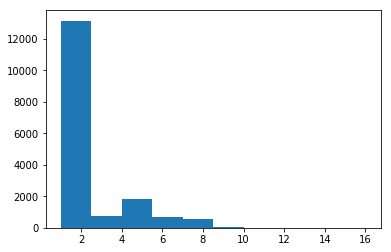

In [118]:
# import numpy as np
# import matplotlib.pyplot as plt

# plt.hist(verif_nb_max_entities['len_splitted_str_result'])
# plt.show()

In [ ]:
Ci-dessous c'est un exemple avec 5 entités :
Comment trouver que : 
    20 sachets|vert matcha|the|supreme|bio	[[pukka-the-vert-matcha-supreme-bio-20-sachets-p100327, gwz, the vert matcha supreme bio 20 sachets, 100.0, Pukka], [the-vert-matcha-supreme-20inf, ntr, the vert matcha supreme 20 sachets bio, 100.0, Pukka]]

In [ ]:
On continue avec 5 entités 

In [88]:
def extraction_five_entities(x):
    resultat = list(itertools.combinations(x,5))
    return resultat
df_extraction_variant_nb_entities['str_result_five_entities'] = df_extraction_variant_nb_entities['str_result_one_entity'].map(extraction_five_entities)

In [89]:
%%time
# MAJ pour 4 entités
dict_results_by_five_entity_temp = {}

for row in df_extraction_variant_nb_entities.itertuples():
    for each in row.str_result_five_entities:
#         print (each)
        sum_number_of_words = []
        tot = 0
        if each not in dict_results_by_five_entity_temp.keys() :
            
            for entity in each:
                
                if entity in row.liste_id[2]:   
                    temp_slug_xtitle_distrib_brand = []
                    dict_results_by_five_entity_temp[each] = []
        #             print (row.slug,"\n")  
                    temp_slug_xtitle_distrib_brand.append(row.slug)
                    temp_slug_xtitle_distrib_brand.append(row.xtitle)
                    temp_slug_xtitle_distrib_brand.append(row.liste_id[1])
                    temp_slug_xtitle_distrib_brand.append(row.brand)
                    temp_slug_xtitle_distrib_brand.append(row.liste_id[2])
        #             print ("1ère alim du dico avec la clé:", each, "avec valeur :", temp_slug_xtitle_distrib_brand,"\n")
                    # Ajout du "confidence_score"
                    tot = len(entity.split(' ')) + tot
                    sum_number_of_words.append(tot)
                    if len(each) == len(sum_number_of_words):
                        temp_slug_xtitle_distrib_brand.append(max(sum_number_of_words)/len(row.liste_id[2].split(' ')))
                        dict_results_by_five_entity_temp[each].append(temp_slug_xtitle_distrib_brand)
        
        elif each in dict_results_by_five_entity_temp.keys():
            
            for entity in each:
                
                if entity in row.liste_id[2]:  
                    temp_slug_xtitle_distrib_brand = []
                    temp_slug_xtitle_distrib_brand.append(row.slug)
                    temp_slug_xtitle_distrib_brand.append(row.xtitle)
                    temp_slug_xtitle_distrib_brand.append(row.liste_id[1])
                    temp_slug_xtitle_distrib_brand.append(row.brand)
                    temp_slug_xtitle_distrib_brand.append(row.liste_id[2])
        #             temp_slug_xtitle_distrib_brand.append(row.confidence_score)
        #             print ("Nouvelle alim dico avec la clé:", each, "avec valeur :", dict_temp[each],"\n")
                    # Ajout du "confidence_score"
                    tot = len(entity.split(' ')) + tot
                    sum_number_of_words.append(tot)
#                     if each == ('20 sachets', 'the') and row.liste_id[2] == 'the vert merveille de baies 20 sachets bio':
#                         print (row.liste_id[2],each, sum_number_of_words)
#                         print (sum_number_of_words)
#                         print (max(sum_number_of_words)/len(row.liste_id[2].split(' ')))
                    if len(each) == len(sum_number_of_words):
                        temp_slug_xtitle_distrib_brand.append(max(sum_number_of_words)/len(row.liste_id[2].split(' ')))
                        dict_results_by_five_entity_temp[each].append(temp_slug_xtitle_distrib_brand) 

CPU times: user 1.17 s, sys: 28 ms, total: 1.2 s
Wall time: 1.2 s


In [103]:
len(dict_results_by_five_entity_temp)

130193

In [90]:
%%time
dict_results_by_five_entity = {}
for k in dict_results_by_five_entity_temp.keys():
#     print (k)
    dict_results_by_five_entity[k] = []
    # boucle sur chaque produit
    for l in range(0,len(dict_results_by_five_entity_temp[k])):
        for m in range(0,len(dict_results_by_five_entity_temp[k])):
            # Si on a 2 produits de distributeurs différents et de meme marque
            if l != m and dict_results_by_five_entity_temp[k][l][2] != dict_results_by_five_entity_temp[k][m][2] and dict_results_by_five_entity_temp[k][l][3] == dict_results_by_five_entity_temp[k][m][3]:
#                 Ajout des 2 produits dans le dictionnaire
                dict_results_by_five_entity[k].append([dict_results_by_five_entity_temp[k][l],dict_results_by_five_entity_temp[k][m]])

CPU times: user 146 ms, sys: 4.02 ms, total: 150 ms
Wall time: 149 ms


In [91]:
for key in [ k for (k,v) in dict_results_by_five_entity.items() if not v ]:
    del dict_results_by_five_entity[key]

In [92]:
df_temp = pd.DataFrame.from_dict(dict_results_by_five_entity,orient='index')
df_results_by_five_entity = df_temp.stack().to_frame()
df_results_by_five_entity.rename(columns={0: 'couples'}, inplace=True)
# df_results_by_five_entity

In [108]:
# df_results_by_five_entity

couples
(panais, veau, petits, pots, pois)                 0  [[petits-pots-bebe-des-6-mois-petits-pois-panais-veau-babybio-3288131510019, Petits pots bébé dès 6 mois, petits pois panais veau Babybio, crf, Babybio, petits pots bebe 6 mois petits pois panais veau babybio, 0.5], [babybio-petits-pots-petits-pois-panais-courgette-veau-2-x-200g-p70417, Petits pots Petits pois Panais Courgette Veau - 2 x 200g, gwz, Babybio, petits pots petits pois panais courgette veau 2 x 200g, 0.5]]                                    
                                                   1  [[babybio-petits-pots-petits-pois-panais-courgette-veau-2-x-200g-p70417, Petits pots Petits pois Panais Courgette Veau - 2 x 200g, gwz, Babybio, petits pots petits pois panais courgette veau 2 x 200g, 0.5], [petits-pots-bebe-des-6-mois-petits-pois-panais-veau-babybio-3288131510019, Petits pots bébé dès 6 mois, petits pois panais veau Babybio, crf, Babybio, petits pots bebe 6 mois petits pois panais veau babybio, 0.5]]                                    
(carotte, petits, pots, 6, mois)                   0  [[petits-pots-bebe-des-6-mois-carotte-patate-ble-babybio-3288131510590, Petits pots bébé dès 6 mois, carotte patate blé BABYBIO, crf, Babybio, petits pots bebe 6 mois carotte patate ble babybio, 0.5555555555555556], [babybio-petits-pots-carotte-patate-douce-ble-6-mois-2x200g-p9660, Petits pots Carotte Patate douce Blé 6 mois 2x200g, gwz, Babybio, petits pots carotte patate douce ble 6 mois 2x200g, 0.5555555555555556]]                                    
                                                   1  [[babybio-petits-pots-carotte-patate-douce-ble-6-mois-2x200g-p9660, Petits pots Carotte Patate douce Blé 6 mois 2x200g, gwz, Babybio, petits pots carotte patate douce ble 6 mois 2x200g, 0.5555555555555556], [petits-pots-bebe-des-6-mois-carotte-patate-ble-babybio-3288131510590, Petits pots bébé dès 6 mois, carotte patate blé BABYBIO, crf, Babybio, petits pots bebe 6 mois carotte patate ble babybio, 0.5555555555555556]]                                    
(lin, chocolat, lait, gingembre, graines)          0  [[chocolat-au-lait-gingembre-graines-de-lin-perou-bio-ethiquable-3760091721600, Chocolat au lait gingembre graines de lin Pérou bio ETHIQUABLE, crf, Ethiquable, chocolat lait gingembre graines lin perou ethiquable, 0.7142857142857143], [ethiquable-chocolat-lait-gingembre-graines-de-lin-bio-100g-p83781, Chocolat lait gingembre graines de lin BIO 100g, gwz, Ethiquable, chocolat lait gingembre graines lin bio 100g, 0.7142857142857143]]                     
                                                   1  [[ethiquable-chocolat-lait-gingembre-graines-de-lin-bio-100g-p83781, Chocolat lait gingembre graines de lin BIO 100g, gwz, Ethiquable, chocolat lait gingembre graines lin bio 100g, 0.7142857142857143], [chocolat-au-lait-gingembre-graines-de-lin-perou-bio-ethiquable-3760091721600, Chocolat au lait gingembre graines de lin Pérou bio ETHIQUABLE, crf, Ethiquable, chocolat lait gingembre graines lin perou ethiquable, 0.7142857142857143]]                     
(pomme, mangue, compotes, ananas, gourdes)         0  [[compotes-en-gourdes-pomme-mangue-ananas-bio-vitabio-3288131650050, Compotes en gourdes pomme mangue ananas bio VITABIO, crf, Vitabio, compotes gourdes pomme mangue ananas vitabio, 0.8333333333333334], [kalibio-compotes-pomme-banane-mangue-ananas-x-6-gourdes-p30214, Compotes Pomme Banane Mangue Ananas x 6 Gourdes, gwz, Vitabio, compotes pomme banane mangue ananas x 6 gourdes, 0.625]]                                                                      
                                                   1  [[kalibio-compotes-pomme-banane-mangue-ananas-x-6-gourdes-p30214, Compotes Pomme Banane Mangue Ananas x 6 Gourdes, gwz, Vitabio, compotes pomme banane mangue ananas x 6 gourdes, 0.625], [compotes-en-gourdes-pomme-mangue-ananas-bio-vitabio-3288131650050, Compotes en gourdes pomme mangue ananas bio VITABIO, crf, Vitabio, compotes gourdes pomme mangue ana

In [1]:
# 6/7

0.8571428571428571

In [ ]:
On fait la restitution :
on rassemble :
- df_results_by_one_entity
- df_results_by_two_entity
- df_results_by_three_entity
- df_results_by_four_entity
- df_results_by_five_entity

In [93]:
all_results = pd.concat([df_results_by_one_entity, df_results_by_two_entity,df_results_by_three_entity,df_results_by_four_entity,df_results_by_five_entity])

In [94]:
all_results.shape

(193634, 1)

In [ ]:
On crée les colonnes :
xtitle, distributeur, URLS, brand, confidence_score

In [95]:
all_results['slug_one'] = all_results['couples'].map(lambda x: x[0][0])
all_results['slug_two'] = all_results['couples'].map(lambda x: x[1][0])

all_results['xtitle_one'] = all_results['couples'].map(lambda x: x[0][1])
all_results['xtitle_two'] = all_results['couples'].map(lambda x: x[1][1])
all_results['distributeur_one'] = all_results['couples'].map(lambda x: x[0][2])
all_results['distributeur_two'] = all_results['couples'].map(lambda x: x[1][2])
all_results['brand_one'] = all_results['couples'].map(lambda x: x[0][3])
all_results['brand_two'] = all_results['couples'].map(lambda x: x[1][3])

In [96]:
dict_slug_to_url = dict(zip(orgc_descriptions.xslug,orgc_descriptions.xurl))
def urls(x):
    resultat = []
    for each in x:
        element = []
        element.append(dict_slug_to_url[each[0]])
        resultat.append(element)
    return resultat

all_results['URLS'] = all_results['couples'].map(urls)
all_results['URL_one'] = all_results['URLS'].map(lambda x:x[0][0])
all_results['URL_two'] = all_results['URLS'].map(lambda x:x[1][0])
all_results = all_results.drop("URLS", axis =1)

In [97]:
all_results['confidence_score'] = all_results['couples'].map(lambda x: (x[0][5] + x[1][5])/2)

In [ ]:
Tri décroissant suivant "confidence_score"

In [98]:
all_results =  all_results.sort_values(['confidence_score'], ascending = False)

In [99]:
all_results

couples  \
(a, radis noir, graines, germer, noir)       0     [[germ-line-graines-a-germer-bio-radis-noir-150g-p14689, Graines à Germer Bio RADIS NOIR 150g, gwz, Germ'line, graines a germer bio radis noir 150g, 0.8571428571428571], [10275-graines-a-germer-de-radis-noir-3465511139156, Radis Noir Graines à Germer, wbe, Germ'line, radis noir graines a germer, 1.2]]                                                                                                                                                                                                                                      
                                             1     [[10275-graines-a-germer-de-radis-noir-3465511139156, Radis Noir Graines à Germer, wbe, Germ'line, radis noir graines a germer, 1.2], [germ-line-graines-a-germer-bio-radis-noir-150g-p14689, Graines à Germer Bio RADIS NOIR 150g, gwz, Germ'line, graines a germer bio radis noir 150g, 0.8571428571428571]]                                                                                                                                                                                                                                      
(250g, sesame noir)                          1     [[sesame-noir-250g, Sésame Noir - 250g, ntr, Markal, sesame noir 250g, 1.0], [markal-sesame-noir-250g-p77439, Sésame Noir - 250g, gwz, Markal, sesame noir 250g, 1.0]]                                                                                                                                                                                                                                                                                                                                                                              
(lentilles, 90g, chips, original)            1     [[chips-lentils-original-90g, Chips Lentilles Original 90g, ntr, Lima, chips lentilles original 90g, 1.0], [lima-chips-aux-lentilles-original-90g-p83002, Chips aux Lentilles Original 90g, gwz, Lima, chips lentilles original 90g, 1.0]]                                                                                                                                                                                                                                                                                                          
(a, sardines, l'huile, d'olive)              3     [[pain-de-mer-sardines-a-l-huile-d-olive-p71161, Sardines à l'huile d'olive, gwz, Pain de Mer, sardines a l'huile d'olive, 1.0], [7077-sardines-a-l-huile-d-olive-bio-8412439285156, Sardines à l'Huile d'Olive, wbe, Pain de Mer, sardines a l'huile d'olive, 1.0]]                                                                                                                                                                                                                                                                                
(500g, couscous demi-complet)                1     [[couscous-1-2-cpt-500g, Couscous Demi-complet 500g, ntr, Markal, couscous demi-complet 500g, 1.0], [markal-couscous-demi-complet-500g-p76290, Couscous Demi-complet 500g, gwz, Markal, couscous demi-complet 500g, 1.0]]                                                                                                                                                                                                                                                                                                                           
                                             0     [[markal-couscous-demi-complet-500g-p76290, Couscous Demi-complet 500g, gwz, Markal, couscous demi-complet 500g, 1.0], [couscous-1-2-cpt-500g, Couscous Demi-complet 500g, ntr, Markal, couscous demi-complet 500g, 1.0]]                                                                                                                                                                                                                         

In [ ]:
ON SAUVE les résultats (il manque encore l'exhaustivité des combinaisons dans ces résultats)
Et il n'y a pas les résultats à titres égaux

In [177]:
# %load_ext autoreload
# %autoreload

# import pandas as pd
# pd.set_option('display.max_colwidth',-1)

# data_folder = "/home/hapax94/Documents/vincent/jupyter/carrefour_bio/output"
# all_results.to_pickle(data_folder + '/all_results_BIO_with_five_entities_020319.pkl')
# all_results = pd.read_pickle(data_folder + '/all_results_BIO_with_five_entities_020319.pkl')

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [60]:
On extrait les couples de slugs pour vérifier si il y a des couples en doublons

couples  \
(sesame noir, 250g)                                 1     [[sesame-noir-250g, Sésame Noir - 250g, ntr, Markal, sesame noir 250g, 1.0], [markal-sesame-noir-250g-p77439, Sésame Noir - 250g, gwz, Markal, sesame noir 250g, 1.0]]                                                                                                                                                                                                                                                                                                 
                                                    0     [[markal-sesame-noir-250g-p77439, Sésame Noir - 250g, gwz, Markal, sesame noir 250g, 1.0], [sesame-noir-250g, Sésame Noir - 250g, ntr, Markal, sesame noir 250g, 1.0]]                                                                                                                                                                                                                                                                                                 
(20 sachets, vert matcha, the, supreme, bio)        1     [[the-vert-matcha-supreme-20inf, Thé Vert Matcha Suprême - 20 Sachets Bio, ntr, Pukka, the vert matcha supreme 20 sachets bio, 1.0], [pukka-the-vert-matcha-supreme-bio-20-sachets-p100327, Thé vert Matcha Suprême bio - 20 sachets, gwz, Pukka, the vert matcha supreme bio 20 sachets, 1.0]]                                                                                                                                                                        
                                                    0     [[pukka-the-vert-matcha-supreme-bio-20-sachets-p100327, Thé vert Matcha Suprême bio - 20 sachets, gwz, Pukka, the vert matcha supreme bio 20 sachets, 1.0], [the-vert-matcha-supreme-20inf, Thé Vert Matcha Suprême - 20 Sachets Bio, ntr, Pukka, the vert matcha supreme 20 sachets bio, 1.0]]                                                                                                                                                                        
(couscous demi-complet, 500g)                       1     [[couscous-1-2-cpt-500g, Couscous Demi-complet 500g, ntr, Markal, couscous demi-complet 500g, 1.0], [markal-couscous-demi-complet-500g-p76290, Couscous Demi-complet 500g, gwz, Markal, couscous demi-complet 500g, 1.0]]                                                                                                                                                                                                                                              
                                                    0     [[markal-couscous-demi-complet-500g-p76290, Couscous Demi-complet 500g, gwz, Markal, couscous demi-complet 500g, 1.0], [couscous-1-2-cpt-500g, Couscous Demi-complet 500g, ntr, Markal, couscous demi-complet 500g, 1.0]]                                                                                                                                                                                                                                              
(20 sachets, citron gingembre, tisane, manuka, bio) 1     [[tisane-citr-ging-manuka-20inf, Tisane Citron Gingembre Manuka - 20 Sachets Bio, ntr, Pukka, tisane citron gingembre manuka 20 sachets bio, 1.0], [pukka-tisane-citron-gingembre-et-miel-de-manuka-bio-20-sachets-p80056, Tisane Citron, Gingembre et Miel de Manuka bio - 20 sachets, gwz, Pukka, tisane citron gingembre miel manuka bio 20 sachets, 0.875]]                                                                                                        
                                                    0     [[pukka-tisane-citron-gingembre-et-miel-de-manuka-bio-20-sachets-p80056, Tisane Citron, Gingembre et Miel de Manuka bio - 20 sachets, gwz, Pukka, tisane citron gingembre miel manuka bio 20 sachets, 0.875], [tisane-citr-ging-manuka-20inf, Tisane Citron Gingembre Manuka - 20 Sachets Bio, ntr, Pukka, tisane citron gingembre manuka 20 

In [100]:
all_results.reset_index(level=0, inplace=True)

In [101]:
all_results.rename(columns={'level_0': 'id_entities'}, inplace=True)

In [102]:
all_results

,id_entities,couples,slug_one,slug_two,xtitle_one,xtitle_two,distributeur_one,distributeur_two,brand_one,brand_two,URL_one,URL_two,confidence_score
0,"(a, radis noir, graines, germer, noir)","[[germ-line-graines-a-germer-bio-radis-noir-150g-p14689, Graines à Germer Bio RADIS NOIR 150g, gwz, Germ'line, graines a germer bio radis noir 150g, 0.8571428571428571], [10275-graines-a-germer-de-radis-noir-3465511139156, Radis Noir Graines à Germer, wbe, Germ'line, radis noir graines a germer, 1.2]]",germ-line-graines-a-germer-bio-radis-noir-150g-p14689,10275-graines-a-germer-de-radis-noir-3465511139156,Graines à Germer Bio RADIS NOIR 150g,Radis Noir Graines à Germer,gwz,wbe,Germ'line,Germ'line,https://www.greenweez.com/germ-line-graines-a-germer-bio-radis-noir-150g-p14689,https://www.webecologie.com/graines-bio-graines-a-germer/10275-graines-a-germer-de-radis-noir-3465511139156.html,1.028571
1,"(a, radis noir, graines, germer, noir)","[[10275-graines-a-germer-de-radis-noir-3465511139156, Radis Noir Graines à Germer, wbe, Germ'line, radis noir graines a germer, 1.2], [germ-line-graines-a-germer-bio-radis-noir-150g-p14689, Graines à Germer Bio RADIS NOIR 150g, gwz, Germ'line, graines a germer bio radis noir 150g, 0.8571428571428571]]",10275-graines-a-germer-de-radis-noir-3465511139156,germ-line-graines-a-germer-bio-radis-noir-150g-p14689,Radis Noir Graines à Germer,Graines à Germer Bio RADIS NOIR 150g,wbe,gwz,Germ'line,Germ'line,https://www.webecologie.com/graines-bio-graines-a-germer/10275-graines-a-germer-de-radis-noir-3465511139156.html,https://www.greenweez.com/germ-line-graines-a-germer-bio-radis-noir-150g-p14689,1.028571
1,"(250g, sesame noir)","[[sesame-noir-250g, Sésame Noir - 250g, ntr, Markal, sesame noir 250g, 1.0], [markal-sesame-noir-250g-p77439, Sésame Noir - 250g, gwz, Markal, sesame noir 250g, 1.0]]",sesame-noir-250g,markal-sesame-noir-250g-p77439,Sésame Noir - 250g,Sésame Noir - 250g,ntr,gwz,Markal,Markal,https://naturalia.fr/sesame-noir-250g,https://www.greenweez.com/markal-sesame-noir-250g-p77439,1.000000
1,"(lentilles, 90g, chips, original)","[[chips-lentils-original-90g, Chips Lentilles Original 90g, ntr, Lima, chips lentilles original 90g, 1.0], [lima-chips-aux-lentilles-original-90g-p83002, Chips aux Lentilles Original 90g, gwz, Lima, chips lentilles original 90g, 1.0]]",chips-lentils-original-90g,lima-chips-aux-lentilles-original-90g-p83002,Chips Lentilles Original 90g,Chips aux Lentilles Original 90g,ntr,gwz,Lima,Lima,https://naturalia.fr/chips-lentils-original-90g,https://www.greenweez.com/lima-chips-aux-lentilles-original-90g-p83002,1.000000
3,"(a, sardines, l'huile, d'olive)","[[pain-de-mer-sardines-a-l-huile-d-olive-p71161, Sardines à l'huile d'olive, gwz, Pain de Mer, sardines a l'huile d'olive, 1.0], [7077-sardines-a-l-huile-d-olive-bio-8412439285156, Sardines à l'Huile d'Olive, wbe, Pain de Mer, sardines a l'huile d'olive, 1.0]]",pain-de-mer-sardines-a-l-huile-d-olive-p71161,7077-sardines-a-l-huile-d-olive-bio-8412439285156,Sardines à l'huile d'olive,Sardines à l'Huile d'Olive,gwz,wbe,Pain de Mer,Pain de Mer,https://www.greenweez.com/pain-de-mer-sardines-a-l-huile-d-olive-p71161,https://www.webecologie.com/conserve-plat-cuisine-bio/7077-sardines-a-l-huile-d-olive-bio-8412439285156.html,1.000000
1,"(500g, couscous demi-complet)","[[couscous-1-2-cpt-500g, Couscous Demi-complet 500g, ntr, Markal, couscous demi-complet 500g, 1.0], [markal-couscous-demi-complet-500g-p76290, Couscous Demi-complet 500g, gwz, Markal, couscous demi-complet 500g, 1.0]]",couscous-1-2-cpt-500g,markal-couscous-demi-complet-500g-p76290,Couscous Demi-complet 500g,Couscous Demi-complet 500g,ntr,gwz,Markal,Markal,https://naturalia.fr/couscous-1-2-cpt-500g,https://www.greenweez.com/markal-couscous-demi-complet-500g-p76290,1.000000
0,"(500g, couscous demi-complet)","[[markal-couscous-demi-complet-500g-p76290, Couscous Demi-complet 500g, gwz, Markal, couscous demi-complet 500g, 1.0], [couscous-1-2-cpt-500g, Couscous Demi-complet 500g, ntr, Ma

In [82]:
# all_results = all_results.drop("id_couple_slugs_1", axis =1)
# all_results = all_results.drop("id_couple_slugs_2", axis =1)

In [103]:
def list_of_slugs(df):
    temp = []
    resultat = []
    temp.append(df['slug_one'])
    temp.append(df['slug_two'])
    resultat.append(temp)
    return resultat

# def permutation_list_of_slugs(df):  
#     temp = []
#     resultat = []
#     temp.append(df['slug_two'])
#     temp.append(df['slug_one'])
#     resultat.append(temp)
#     return resultat

all_results['liste_of_slugs'] = all_results.apply(list_of_slugs, axis = 1)

In [ ]:
On extrait tous les mots contenus dans "liste_of_slugs"

In [104]:
def split_into_words(x):
    temp_0 = []
    for each in x:
        for word in x[0][0].split('-'):
            temp_0.append(word)
        for word in x[0][1].split('-'):
            temp_0.append(word)
    temp = sorted(temp_0)
    
    resultat = ''
    for each in temp:
        resultat += each
  
    return resultat
all_results['words_in_couples'] = all_results['liste_of_slugs'].map(split_into_words)

In [105]:
all_results = all_results.drop_duplicates(['words_in_couples'], keep='first')

In [106]:
all_results

,id_entities,couples,slug_one,slug_two,xtitle_one,xtitle_two,distributeur_one,distributeur_two,brand_one,brand_two,URL_one,URL_two,confidence_score,liste_of_slugs,words_in_couples
0,"(a, radis noir, graines, germer, noir)","[[germ-line-graines-a-germer-bio-radis-noir-150g-p14689, Graines à Germer Bio RADIS NOIR 150g, gwz, Germ'line, graines a germer bio radis noir 150g, 0.8571428571428571], [10275-graines-a-germer-de-radis-noir-3465511139156, Radis Noir Graines à Germer, wbe, Germ'line, radis noir graines a germer, 1.2]]",germ-line-graines-a-germer-bio-radis-noir-150g-p14689,10275-graines-a-germer-de-radis-noir-3465511139156,Graines à Germer Bio RADIS NOIR 150g,Radis Noir Graines à Germer,gwz,wbe,Germ'line,Germ'line,https://www.greenweez.com/germ-line-graines-a-germer-bio-radis-noir-150g-p14689,https://www.webecologie.com/graines-bio-graines-a-germer/10275-graines-a-germer-de-radis-noir-3465511139156.html,1.028571,"[[germ-line-graines-a-germer-bio-radis-noir-150g-p14689, 10275-graines-a-germer-de-radis-noir-3465511139156]]",10275150g3465511139156aabiodegermgermergermergrainesgraineslinenoirnoirp14689radisradis
1,"(250g, sesame noir)","[[sesame-noir-250g, Sésame Noir - 250g, ntr, Markal, sesame noir 250g, 1.0], [markal-sesame-noir-250g-p77439, Sésame Noir - 250g, gwz, Markal, sesame noir 250g, 1.0]]",sesame-noir-250g,markal-sesame-noir-250g-p77439,Sésame Noir - 250g,Sésame Noir - 250g,ntr,gwz,Markal,Markal,https://naturalia.fr/sesame-noir-250g,https://www.greenweez.com/markal-sesame-noir-250g-p77439,1.000000,"[[sesame-noir-250g, markal-sesame-noir-250g-p77439]]",250g250gmarkalnoirnoirp77439sesamesesame
1,"(lentilles, 90g, chips, original)","[[chips-lentils-original-90g, Chips Lentilles Original 90g, ntr, Lima, chips lentilles original 90g, 1.0], [lima-chips-aux-lentilles-original-90g-p83002, Chips aux Lentilles Original 90g, gwz, Lima, chips lentilles original 90g, 1.0]]",chips-lentils-original-90g,lima-chips-aux-lentilles-original-90g-p83002,Chips Lentilles Original 90g,Chips aux Lentilles Original 90g,ntr,gwz,Lima,Lima,https://naturalia.fr/chips-lentils-original-90g,https://www.greenweez.com/lima-chips-aux-lentilles-original-90g-p83002,1.000000,"[[chips-lentils-original-90g, lima-chips-aux-lentilles-original-90g-p83002]]",90g90gauxchipschipslentilleslentilslimaoriginaloriginalp83002
3,"(a, sardines, l'huile, d'olive)","[[pain-de-mer-sardines-a-l-huile-d-olive-p71161, Sardines à l'huile d'olive, gwz, Pain de Mer, sardines a l'huile d'olive, 1.0], [7077-sardines-a-l-huile-d-olive-bio-8412439285156, Sardines à l'Huile d'Olive, wbe, Pain de Mer, sardines a l'huile d'olive, 1.0]]",pain-de-mer-sardines-a-l-huile-d-olive-p71161,7077-sardines-a-l-huile-d-olive-bio-8412439285156,Sardines à l'huile d'olive,Sardines à l'Huile d'Olive,gwz,wbe,Pain de Mer,Pain de Mer,https://www.greenweez.com/pain-de-mer-sardines-a-l-huile-d-olive-p71161,https://www.webecologie.com/conserve-plat-cuisine-bio/7077-sardines-a-l-huile-d-olive-bio-8412439285156.html,1.000000,"[[pain-de-mer-sardines-a-l-huile-d-olive-p71161, 7077-sardines-a-l-huile-d-olive-bio-8412439285156]]",70778412439285156aabiodddehuilehuilellmeroliveolivep71161painsardinessardines
1,"(500g, couscous demi-complet)","[[couscous-1-2-cpt-500g, Couscous Demi-complet 500g, ntr, Markal, couscous demi-complet 500g, 1.0], [markal-couscous-demi-complet-500g-p76290, Couscous Demi-complet 500g, gwz, Markal, couscous demi-complet 500g, 1.0]]",couscous-1-2-cpt-500g,markal-couscous-demi-complet-500g-p76290,Couscous Demi-complet 500g,Couscous Demi-complet 500g,ntr,gwz,Markal,Markal,https://naturalia.fr/couscous-1-2-cpt-500g,https://www.greenweez.com/markal-couscous-demi-complet-500g-p76290,1.000000,"[[couscous-1-2-cpt-500g, markal-couscous-demi-complet-500g-p76290]]",12500g500gcompletcouscouscouscouscptdemimarkalp76290
0,"(legumes, bouillon, herbes, cube)","[[rapunzel-bouillon-cube-legumes-aux-herbes-p103093, Bouillon cube Légumes aux Herbes, gwz, Rapunzel, bouillon cube legumes herbes, 1.0], [3425-bouil

In [136]:
# all_results = all_results.set_index('id_entities')

In [107]:
# all_results = all_results.drop("slug_one", axis =1)
# all_results = all_results.drop("slug_two", axis =1)
all_results = all_results.drop("liste_of_slugs", axis =1)
all_results = all_results.drop("words_in_couples", axis =1)

In [48]:
all_results

,id_entities,couples,slug_one,slug_two,xtitle_one,xtitle_two,distributeur_one,distributeur_two,brand_one,brand_two,URL_one,URL_two,confidence_score
1,"(couscous demi-complet, 500g)","[[couscous-1-2-cpt-500g, Couscous Demi-complet 500g, ntr, Markal, couscous demi-complet 500g, 1.0], [markal-couscous-demi-complet-500g-p76290, Couscous Demi-complet 500g, gwz, Markal, couscous demi-complet 500g, 1.0]]",couscous-1-2-cpt-500g,markal-couscous-demi-complet-500g-p76290,Couscous Demi-complet 500g,Couscous Demi-complet 500g,ntr,gwz,Markal,Markal,https://naturalia.fr/couscous-1-2-cpt-500g,https://www.greenweez.com/markal-couscous-demi-complet-500g-p76290,1.000000
1,"(sesame noir, 250g)","[[sesame-noir-250g, Sésame Noir - 250g, ntr, Markal, sesame noir 250g, 1.0], [markal-sesame-noir-250g-p77439, Sésame Noir - 250g, gwz, Markal, sesame noir 250g, 1.0]]",sesame-noir-250g,markal-sesame-noir-250g-p77439,Sésame Noir - 250g,Sésame Noir - 250g,ntr,gwz,Markal,Markal,https://naturalia.fr/sesame-noir-250g,https://www.greenweez.com/markal-sesame-noir-250g-p77439,1.000000
0,"(20 sachets, vert matcha, the, supreme, bio)","[[pukka-the-vert-matcha-supreme-bio-20-sachets-p100327, Thé vert Matcha Suprême bio - 20 sachets, gwz, Pukka, the vert matcha supreme bio 20 sachets, 1.0], [the-vert-matcha-supreme-20inf, Thé Vert Matcha Suprême - 20 Sachets Bio, ntr, Pukka, the vert matcha supreme 20 sachets bio, 1.0]]",pukka-the-vert-matcha-supreme-bio-20-sachets-p100327,the-vert-matcha-supreme-20inf,Thé vert Matcha Suprême bio - 20 sachets,Thé Vert Matcha Suprême - 20 Sachets Bio,gwz,ntr,Pukka,Pukka,https://www.greenweez.com/pukka-the-vert-matcha-supreme-bio-20-sachets-p100327,https://naturalia.fr/the-vert-matcha-supreme-20inf,1.000000
0,"(20 sachets, citron gingembre, tisane, manuka, bio)","[[pukka-tisane-citron-gingembre-et-miel-de-manuka-bio-20-sachets-p80056, Tisane Citron, Gingembre et Miel de Manuka bio - 20 sachets, gwz, Pukka, tisane citron gingembre miel manuka bio 20 sachets, 0.875], [tisane-citr-ging-manuka-20inf, Tisane Citron Gingembre Manuka - 20 Sachets Bio, ntr, Pukka, tisane citron gingembre manuka 20 sachets bio, 1.0]]",pukka-tisane-citron-gingembre-et-miel-de-manuka-bio-20-sachets-p80056,tisane-citr-ging-manuka-20inf,"Tisane Citron, Gingembre et Miel de Manuka bio - 20 sachets",Tisane Citron Gingembre Manuka - 20 Sachets Bio,gwz,ntr,Pukka,Pukka,https://www.greenweez.com/pukka-tisane-citron-gingembre-et-miel-de-manuka-bio-20-sachets-p80056,https://naturalia.fr/tisane-citr-ging-manuka-20inf,0.937500
0,"(riz sauvage, vegi, mix, gingembre, soja)","[[lima-vegi-mix-gingembre-riz-sauvage-soja-250g-p83090, Végi Mix Gingembre Riz Sauvage Soja 250g, gwz, Lima, vegi mix gingembre riz sauvage soja 250g, 0.8571428571428571], [9573-vegi-mix-gingembre-riz-sauvage-et-soja-5411788046909, Vegi Mix Gingembre, Riz Sauvage et Soja, wbe, Lima, vegi mix gingembre riz sauvage soja, 1.0]]",lima-vegi-mix-gingembre-riz-sauvage-soja-250g-p83090,9573-vegi-mix-gingembre-riz-sauvage-et-soja-5411788046909,Végi Mix Gingembre Riz Sauvage Soja 250g,"Vegi Mix Gingembre, Riz Sauvage et Soja",gwz,wbe,Lima,Lima,https://www.greenweez.com/lima-vegi-mix-gingembre-riz-sauvage-soja-250g-p83090,https://www.webecologie.com/plats-cuisines/9573-vegi-mix-gingembre-riz-sauvage-et-soja-5411788046909.html,0.928571
0,"(riz chataigne, boisson, avoine, 1l)","[[bonneterre-boisson-riz-chataigne-avoine-1l-p80194, Boisson Riz Chataigne Avoine 1L, gwz, Bonneterre, boisson riz chataigne avoine 1l, 1.0], [boisson-chataigne-riz-avoin-1l, Boisson Riz Châtaigne Avoine 1l Bio, ntr, Bonneterre, boisson riz chataigne avoine 1l bio, 0.8333333333333334]]",bonneterre-boisson-riz-chataigne-avoine-1l-p80194,boisson-chataigne-riz-avoin-1l,Boisson Riz Chataigne Avoine 1L,Boisson Riz Châtaigne Avoine 1l Bio,gwz,ntr,Bonneterre,Bonneterre,https://www.greenweez.com/bonneterre-boisson-riz-chataigne-avoine-1l-p80194,https://naturalia.fr/boisson-chataigne-riz-avoin-1l,0.916667
7,"(5 cereales, 3 graines, farine)","[[8860-farin

In [ ]:
# On trie par "id_entities", "slug_one", "slug_two" et "confidence_score"
# all_results.reset_index(level=0, inplace=True)
# all_results =  all_results.sort_values(['confidence_score','id_entities'], ascending = False)

In [ ]:
On extrait la liste de tous les slugs distincts participant aux couples

In [69]:
# list(all_results['slug_one'].unique())

['sesame-noir-250g',
 'couscous-1-2-cpt-500g',
 'pukka-the-vert-matcha-supreme-bio-20-sachets-p100327',
 'pukka-tisane-citron-gingembre-et-miel-de-manuka-bio-20-sachets-p80056',
 'lima-vegi-mix-gingembre-riz-sauvage-soja-250g-p83090',
 'bonneterre-boisson-riz-chataigne-avoine-1l-p80194',
 'primeal-mescia-de-petit-epeautre-de-haute-provence-500g-p5495',
 '9530-veloute-tomate-lentilles-corail-3380380072307',
 'super-flakes-fruit-rouge-375g',
 'vitamont-cocktail-ananas-citron-vert-75cl-p79938',
 'markal-semoule-complete-de-ble-dur-fine-500g-p77410',
 '9223-tajine-aux-6-legumes-miel-3431590013380',
 '8860-farine-5-cereales-et-3-graines-500-g-3329486511204?PageSpeed=noscript',
 '3657-puree-de-sesame-blanc-tahin-3390390001747',
 'jean-herve-puree-de-sesame-blanc-700g-p48630',
 '7659-boisson-riz-chataigne-avoine-3396413712249',
 'bonneterre-boisson-riz-chataigne-avoine-200ml-p80200',
 'vitamont-pur-jus-de-legumes-lactofermente-75cl-p87580',
 'markal-farine-de-grand-epeautre-integrale-500g-p76

In [70]:
# list(all_results['slug_two'].unique())

['markal-sesame-noir-250g-p77439',
 'markal-couscous-demi-complet-500g-p76290',
 'the-vert-matcha-supreme-20inf',
 'tisane-citr-ging-manuka-20inf',
 '9573-vegi-mix-gingembre-riz-sauvage-et-soja-5411788046909',
 'boisson-chataigne-riz-avoin-1l',
 '10044-mescia-de-petit-epeautre-de-haute-provence-3380380037108',
 'primeal-veloute-tomate-lentilles-corail-1l-p68866',
 'grillon-d-or-super-flakes-fruits-rouges-375g-p23198',
 'cocktail-ananas-citron-vt-75cl',
 '3112-semoule-complete-de-ble-dur-fine-bio-3329486331208?PageSpeed=noscript',
 'danival-tajine-aux-6-legumes-miel-525g-p107922',
 'markal-farine-5-cereales-3-graines-1kg-p76338',
 'jean-herve-puree-de-sesame-blanc-350g-p26727',
 '3657-puree-de-sesame-blanc-tahin-3390390001747',
 'bonneterre-boisson-riz-chataigne-avoine-1l-p80194',
 '7659-boisson-riz-chataigne-avoine-3396413712249',
 '11164-pur-jus-legumes-lactofermente-3289196500625',
 '11388-farine-grand-epeautre-integrale-3329486521050',
 '11544-farine-grand-epeautre-integrale-3329486

In [108]:
%%time
slugs_unique_for_matching = []
for each in list(all_results['slug_one'].unique()):
    if each not in slugs_unique_for_matching:
        slugs_unique_for_matching.append(each)

CPU times: user 208 ms, sys: 7.92 ms, total: 216 ms
Wall time: 215 ms


In [109]:
%%time
for each in list(all_results['slug_two'].unique()):
    if each not in slugs_unique_for_matching:
        slugs_unique_for_matching.append(each)

CPU times: user 248 ms, sys: 0 ns, total: 248 ms
Wall time: 247 ms


In [110]:
# len(slugs_unique_for_matching)

6703

In [111]:
df_slugs_unique_for_matching = pd.DataFrame(slugs_unique_for_matching, columns = ['slugs'])

In [112]:
df_slugs_unique_for_matching.head()

,slugs
0,germ-line-graines-a-germer-bio-radis-noir-150g-p14689
1,sesame-noir-250g
2,chips-lentils-original-90g
3,pain-de-mer-sardines-a-l-huile-d-olive-p71161
4,couscous-1-2-cpt-500g


In [113]:
df_slugs_unique_for_matching.shape

(6703, 1)

In [114]:
df_slugs_unique_for_matching.rename(columns={'slugs': 'slug_one'}, inplace=True)

In [ ]:
On fait la jointure "left" entre la table des slugs et "all_results" (colonne "slug_one")
et on ramène tous les autres champs de "all_results"

In [115]:
# list(all_results)

['id_entities',
 'couples',
 'slug_one',
 'slug_two',
 'xtitle_one',
 'xtitle_two',
 'distributeur_one',
 'distributeur_two',
 'brand_one',
 'brand_two',
 'URL_one',
 'URL_two',
 'confidence_score']

In [116]:
all_results[all_results['slug_one'] == 'couscous-1-2-cpt-500g']

,id_entities,couples,slug_one,slug_two,xtitle_one,xtitle_two,distributeur_one,distributeur_two,brand_one,brand_two,URL_one,URL_two,confidence_score
1,"(500g, couscous demi-complet)","[[couscous-1-2-cpt-500g, Couscous Demi-complet 500g, ntr, Markal, couscous demi-complet 500g, 1.0], [markal-couscous-demi-complet-500g-p76290, Couscous Demi-complet 500g, gwz, Markal, couscous demi-complet 500g, 1.0]]",couscous-1-2-cpt-500g,markal-couscous-demi-complet-500g-p76290,Couscous Demi-complet 500g,Couscous Demi-complet 500g,ntr,gwz,Markal,Markal,https://naturalia.fr/couscous-1-2-cpt-500g,https://www.greenweez.com/markal-couscous-demi-complet-500g-p76290,1.000000
9544,500g,"[[couscous-1-2-cpt-500g, Couscous Demi-complet 500g, ntr, Markal, couscous demi-complet 500g, 0.3333333333333333], [markal-polenta-500g-p77253, Polenta - 500g, gwz, Markal, polenta 500g, 0.5]]",couscous-1-2-cpt-500g,markal-polenta-500g-p77253,Couscous Demi-complet 500g,Polenta - 500g,ntr,gwz,Markal,Markal,https://naturalia.fr/couscous-1-2-cpt-500g,https://www.greenweez.com/markal-polenta-500g-p77253,0.416667
9562,500g,"[[couscous-1-2-cpt-500g, Couscous Demi-complet 500g, ntr, Markal, couscous demi-complet 500g, 0.3333333333333333], [markal-semoule-de-mais-grosse-500g-p77413, Semoule de maïs Grosse - 500g, gwz, Markal, semoule grosse 500g, 0.3333333333333333]]",couscous-1-2-cpt-500g,markal-semoule-de-mais-grosse-500g-p77413,Couscous Demi-complet 500g,Semoule de maïs Grosse - 500g,ntr,gwz,Markal,Markal,https://naturalia.fr/couscous-1-2-cpt-500g,https://www.greenweez.com/markal-semoule-de-mais-grosse-500g-p77413,0.333333
9565,500g,"[[couscous-1-2-cpt-500g, Couscous Demi-complet 500g, ntr, Markal, couscous demi-complet 500g, 0.3333333333333333], [markal-flocons-d-orge-500g-p76424, Flocons d'Orge 500g, gwz, Markal, flocons d'orge 500g, 0.3333333333333333]]",couscous-1-2-cpt-500g,markal-flocons-d-orge-500g-p76424,Couscous Demi-complet 500g,Flocons d'Orge 500g,ntr,gwz,Markal,Markal,https://naturalia.fr/couscous-1-2-cpt-500g,https://www.greenweez.com/markal-flocons-d-orge-500g-p76424,0.333333
9567,500g,"[[couscous-1-2-cpt-500g, Couscous Demi-complet 500g, ntr, Markal, couscous demi-complet 500g, 0.3333333333333333], [markal-flageolets-verts-500g-p76389, Flageolets verts 500g, gwz, Markal, flageolets verts 500g, 0.3333333333333333]]",couscous-1-2-cpt-500g,markal-flageolets-verts-500g-p76389,Couscous Demi-complet 500g,Flageolets verts 500g,ntr,gwz,Markal,Markal,https://naturalia.fr/couscous-1-2-cpt-500g,https://www.greenweez.com/markal-flageolets-verts-500g-p76389,0.333333
9563,500g,"[[couscous-1-2-cpt-500g, Couscous Demi-complet 500g, ntr, Markal, couscous demi-complet 500g, 0.3333333333333333], [markal-avoine-decortiquee-500g-p76195, Avoine Décortiquée 500g, gwz, Markal, avoine decortiquee 500g, 0.3333333333333333]]",couscous-1-2-cpt-500g,markal-avoine-decortiquee-500g-p76195,Couscous Demi-complet 500g,Avoine Décortiquée 500g,ntr,gwz,Markal,Markal,https://naturalia.fr/couscous-1-2-cpt-500g,https://www.greenweez.com/markal-avoine-decortiquee-500g-p76195,0.333333
9527,500g,"[[couscous-1-2-cpt-500g, Couscous Demi-complet 500g, ntr, Markal, couscous demi-complet 500g, 0.3333333333333333], [markal-lentilles-vertes-500g-p76589, Lentilles Vertes 500g, gwz, Markal, lentilles vertes 500g, 0.3333333333333333]]",couscous-1-2-cpt-500g,markal-lentilles-vertes-500g-p76589,Couscous Demi-complet 500g,Lentilles Vertes 500g,ntr,gwz,Markal,Markal,https://naturalia.fr/couscous-1-2-cpt-500g,https://www.greenweez.com/markal-lentilles-vertes-500g-p76589,0.333333
9528,500g,"[[couscous-1-2-cpt-500g, Couscous Demi-complet 500g, ntr, Markal, couscous demi-complet 500g, 0.3333333333333333], [markal-flocons-de-sarrasin-500g-p76426, Flocons de sarrasin - 500g, gwz, Markal, flocons sarrasin 500g, 0.3333333333333333]]",couscous-1-2-cpt-500g,markal-flocons-de-sarrasin-500g-p76426,Couscous Demi-complet 500g,Flocons de sarrasin - 500g,ntr,gwz,Markal,Markal,https://naturalia.fr/couscous-1-2-cpt-500g,https://www.

In [197]:
# df_left_join_temp_slug_one =  pd.merge(df_slugs_unique_for_matching, all_results, on = "slug_one", how = "inner")

In [ ]:
On veut savoir quels sont les score max en groupant par "slug_one"

In [117]:
# df_temp_groupby_slug_one = df_left_join_temp_slug_one.groupby('slug_one')[['confidence_score']].max()
df_temp_groupby_slug_one = all_results.groupby('slug_one')[['confidence_score']].max()

In [118]:
df_temp_groupby_slug_one['slug_one'] = df_temp_groupby_slug_one.index

In [119]:
del df_temp_groupby_slug_one.index.name

In [120]:
df_temp_groupby_slug_one[df_temp_groupby_slug_one['slug_one'] == 'couscous-1-2-cpt-500g']

,confidence_score,slug_one
couscous-1-2-cpt-500g,1.0,couscous-1-2-cpt-500g


In [121]:
df_temp_groupby_slug_one = pd.merge(df_temp_groupby_slug_one,all_results[['id_entities',
 'couples',
 'slug_one',                                                                        
 'slug_two',
 'xtitle_one',
 'xtitle_two',
 'distributeur_one',
 'distributeur_two',
 'brand_one',
 'brand_two',
 'URL_one',
 'URL_two',
 'confidence_score']], on = ['slug_one','confidence_score'], how = "inner")

In [122]:
df_temp_groupby_slug_one =  df_temp_groupby_slug_one[['id_entities',
 'couples',
 'slug_one',
 'slug_two',
 'xtitle_one',
 'xtitle_two',
 'distributeur_one',
 'distributeur_two',
 'brand_one',
 'brand_two',
 'URL_one',
 'URL_two',
'confidence_score']]

In [134]:
df_temp_groupby_slug_one

,id_entities,couples,slug_one,slug_two,xtitle_one,xtitle_two,distributeur_one,distributeur_two,brand_one,brand_two,URL_one,URL_two,confidence_score
0,"(farine, t65)","[[-p68296, Farine de blé Blanche T65 bio - 1kg, gwz, Celnat, farine ble blanche t65 1kg, 0.4], [10410-farine-t65-3273120011516, Farine T65, wbe, Celnat, farine t65, 1.0]]",-p68296,10410-farine-t65-3273120011516,Farine de blé Blanche T65 bio - 1kg,Farine T65,gwz,wbe,Celnat,Celnat,https://www.greenweez.com/-p68296,https://www.webecologie.com/farine-bio-aide-a-la-patisserie/10410-farine-t65-3273120011516.html,0.700000
1,"(500g, flocons)","[[-p68323, Flocons de petit épeautre bio - 500g, gwz, Celnat, flocons petit epeautre 500g, 0.5], [flocons-soja-toastes-500g, Flocons De Soja Toastés 500g Bio, ntr, Celnat, flocons de soja toastes 500g bio, 0.3333333333333333]]",-p68323,flocons-soja-toastes-500g,Flocons de petit épeautre bio - 500g,Flocons De Soja Toastés 500g Bio,gwz,ntr,Celnat,Celnat,https://www.greenweez.com/-p68323,https://naturalia.fr/flocons-soja-toastes-500g,0.416667
2,250g,"[[-p68329, Graines de lin brun bio - 250g, gwz, Celnat, graines lin brun 250g, 0.25], [arrow-root-250g, Arrow-root 250g Bio, ntr, Celnat, arrow-root 250g bio, 0.3333333333333333]]",-p68329,arrow-root-250g,Graines de lin brun bio - 250g,Arrow-root 250g Bio,gwz,ntr,Celnat,Celnat,https://www.greenweez.com/-p68329,https://naturalia.fr/arrow-root-250g,0.291667
3,500g,"[[-p68357, Graines de courge bio - 500g, gwz, Celnat, graines courge 500g, 0.3333333333333333], [gluten-de-ble-500g, Gluten De Blé 500g Bio, ntr, Celnat, gluten de ble 500g bio, 0.2]]",-p68357,gluten-de-ble-500g,Graines de courge bio - 500g,Gluten De Blé 500g Bio,gwz,ntr,Celnat,Celnat,https://www.greenweez.com/-p68357,https://naturalia.fr/gluten-de-ble-500g,0.266667
4,500g,"[[-p68357, Graines de courge bio - 500g, gwz, Celnat, graines courge 500g, 0.3333333333333333], [flocons-cereales-500g, Petits Flocons D'avoine 500g Bio, ntr, Celnat, petits flocons d'avoine 500g bio, 0.2]]",-p68357,flocons-cereales-500g,Graines de courge bio - 500g,Petits Flocons D'avoine 500g Bio,gwz,ntr,Celnat,Celnat,https://www.greenweez.com/-p68357,https://naturalia.fr/flocons-cereales-500g,0.266667
5,"(350g, flocons)","[[-p68364, Flocons de millet bio - 350g, gwz, Celnat, flocons millet 350g, 0.6666666666666666], [flocons-chataigne-toaste-290g, Flocons De Châtaignes Toastés 350g Bio, ntr, Celnat, flocons de chataignes toastes 350g bio, 0.3333333333333333]]",-p68364,flocons-chataigne-toaste-290g,Flocons de millet bio - 350g,Flocons De Châtaignes Toastés 350g Bio,gwz,ntr,Celnat,Celnat,https://www.greenweez.com/-p68364,https://naturalia.fr/flocons-chataigne-toaste-290g,0.500000
6,"(350g, flocons)","[[-p68364, Flocons de millet bio - 350g, gwz, Celnat, flocons millet 350g, 0.6666666666666666], [flocons-pois-chiche-350g, Flocons De Pois Chiches 350g Bio, ntr, Celnat, flocons de pois chiches 350g bio, 0.3333333333333333]]",-p68364,flocons-pois-chiche-350g,Flocons de millet bio - 350g,Flocons De Pois Chiches 350g Bio,gwz,ntr,Celnat,Celnat,https://www.greenweez.com/-p68364,https://naturalia.fr/flocons-pois-chiche-350g,0.500000
7,"(350g, flocons)","[[-p68364, Flocons de millet bio - 350g, gwz, Celnat, flocons millet 350g, 0.6666666666666666], [flocons-pois-casses-350g, Flocons De Pois Cassés 350g Bio, ntr, Celnat, flocons de pois casses 350g bio, 0.3333333333333333]]",-p68364,flocons-pois-casses-350g,Flocons de millet bio - 350g,Flocons De Pois Cassés 350g Bio,gwz,ntr,Celnat,Celnat,https://www.greenweez.com/-p68364,https://naturalia.fr/flocons-pois-casses-350g,0.500000
8,farine,"[[-p68380, Farine de pois chiches bio - 500g, gwz, Celnat, farine pois chiches 500g, 0.25], [10833-farine-de-riz-complet-3273120017761, Farine de Riz Complet, wbe, Celnat, farine riz complet, 0.3333333333333333]]",-p68380,10833-farine-de-riz-complet-3273120017761,Farine de pois chiches bio - 500g,Farine de Riz Complet,gwz,wbe,Celnat,Celnat,https://www.greenweez.com/-p68380,https://www.web

In [ ]:
On fait la jointure "left" entre la table des slugs et "all_results" (colonne "slug_two")
et on ramène tous les autres champs de "all_results"

In [123]:
df_slugs_unique_for_matching.rename(columns={'slug_one': 'slug_two'}, inplace=True)

In [156]:
# df_left_join_temp_slug_two =  pd.merge(df_slugs_unique_for_matching, all_results, on = "slug_two", how = "inner")

In [124]:
df_temp_groupby_slug_two = all_results.groupby('slug_two')[['confidence_score']].max()
df_temp_groupby_slug_two['slug_two'] = df_temp_groupby_slug_two.index
del df_temp_groupby_slug_two.index.name

df_temp_groupby_slug_two = pd.merge(df_temp_groupby_slug_two,all_results[['id_entities',
 'couples',
 'slug_one',
 'slug_two',                                                                      
 'xtitle_one',
 'xtitle_two',
 'distributeur_one',
 'distributeur_two',
 'brand_one',
 'brand_two',
 'URL_one',
 'URL_two',
'confidence_score']], on = ['slug_two','confidence_score'], how = "inner")

df_temp_groupby_slug_two =  df_temp_groupby_slug_two[['id_entities',
 'couples',
 'slug_one',
 'slug_two',
 'xtitle_one',
 'xtitle_two',
 'distributeur_one',
 'distributeur_two',
 'brand_one',
 'brand_two',
 'URL_one',
 'URL_two',
 'confidence_score']]

In [68]:
df_temp_groupby_slug_two

,id_entities,couples,slug_one,slug_two,xtitle_one,xtitle_two,distributeur_one,distributeur_two,brand_one,brand_two,URL_one,URL_two,confidence_score
0,"(flocons, 500g)","[[flocons-soja-toastes-500g, Flocons De Soja Toastés 500g Bio, ntr, Celnat, flocons de soja toastes 500g bio, 0.3333333333333333], [-p68323, Flocons de petit épeautre bio - 500g, gwz, Celnat, flocons petit epeautre bio 500g, 0.4]]",flocons-soja-toastes-500g,-p68323,Flocons De Soja Toastés 500g Bio,Flocons de petit épeautre bio - 500g,ntr,gwz,Celnat,Celnat,https://naturalia.fr/flocons-soja-toastes-500g,https://www.greenweez.com/-p68323,0.366667
1,bio,"[[farine-lentilles-vertes-500g, Farine De Lentilles Vertes 500g Bio, ntr, Celnat, farine de lentilles vertes 500g bio, 0.16666666666666666], [-p68329, Graines de lin brun bio - 250g, gwz, Celnat, graines lin brun bio 250g, 0.2]]",farine-lentilles-vertes-500g,-p68329,Farine De Lentilles Vertes 500g Bio,Graines de lin brun bio - 250g,ntr,gwz,Celnat,Celnat,https://naturalia.fr/farine-lentilles-vertes-500g,https://www.greenweez.com/-p68329,0.183333
2,bio,"[[flocons-pois-chiche-350g, Flocons De Pois Chiches 350g Bio, ntr, Celnat, flocons de pois chiches 350g bio, 0.16666666666666666], [-p68329, Graines de lin brun bio - 250g, gwz, Celnat, graines lin brun bio 250g, 0.2]]",flocons-pois-chiche-350g,-p68329,Flocons De Pois Chiches 350g Bio,Graines de lin brun bio - 250g,ntr,gwz,Celnat,Celnat,https://naturalia.fr/flocons-pois-chiche-350g,https://www.greenweez.com/-p68329,0.183333
3,bio,"[[flocons-soja-toastes-500g, Flocons De Soja Toastés 500g Bio, ntr, Celnat, flocons de soja toastes 500g bio, 0.16666666666666666], [-p68329, Graines de lin brun bio - 250g, gwz, Celnat, graines lin brun bio 250g, 0.2]]",flocons-soja-toastes-500g,-p68329,Flocons De Soja Toastés 500g Bio,Graines de lin brun bio - 250g,ntr,gwz,Celnat,Celnat,https://naturalia.fr/flocons-soja-toastes-500g,https://www.greenweez.com/-p68329,0.183333
4,500g,"[[farine-lentilles-vertes-500g, Farine De Lentilles Vertes 500g Bio, ntr, Celnat, farine de lentilles vertes 500g bio, 0.16666666666666666], [-p68357, Graines de courge bio - 500g, gwz, Celnat, graines courge bio 500g, 0.25]]",farine-lentilles-vertes-500g,-p68357,Farine De Lentilles Vertes 500g Bio,Graines de courge bio - 500g,ntr,gwz,Celnat,Celnat,https://naturalia.fr/farine-lentilles-vertes-500g,https://www.greenweez.com/-p68357,0.208333
5,farine,"[[7425-farine-de-riz-blanc-3273120022079, Farine de Riz Blanc, wbe, Celnat, farine riz blanc, 0.3333333333333333], [-p68380, Farine de pois chiches bio - 500g, gwz, Celnat, farine pois chiches bio 500g, 0.2]]",7425-farine-de-riz-blanc-3273120022079,-p68380,Farine de Riz Blanc,Farine de pois chiches bio - 500g,wbe,gwz,Celnat,Celnat,https://www.webecologie.com/farine-bio-aide-a-la-patisserie/7425-farine-de-riz-blanc-3273120022079.html,https://www.greenweez.com/-p68380,0.266667
6,bio,"[[natali-potage-bio-potimarron-2-x-8-5-gr-p72131, Potage Bio Potimarron 2 x 8.5 gr, gwz, Natali, potage bio potimarron 2 x 8.5 gr, 0.14285714285714285], [10002-bio-flan-sucre-chocolat-3176800032460, Bio Flan Chocolat au Sucre Roux de Canne, wbe, Natali, bio flan chocolat sucre roux canne, 0.16666666666666666]]",natali-potage-bio-potimarron-2-x-8-5-gr-p72131,10002-bio-flan-sucre-chocolat-3176800032460,Potage Bio Potimarron 2 x 8.5 gr,Bio Flan Chocolat au Sucre Roux de Canne,gwz,wbe,Natali,Natali,https://www.greenweez.com/natali-potage-bio-potimarron-2-x-8-5-gr-p72131,https://www.webecologie.com/farine-bio-aide-a-la-patisserie/10002-bio-flan-sucre-chocolat-3176800032460.html,0.154762
7,bio,"[[nature-et-aliments-potage-bio-fenouil-2-x-8-5-gr-p12054, Potage Bio Fenouil 2 x 8.5 gr, gwz, Natali, potage bio fenouil 2 x 8.5 gr, 0.14285714285714285], [10002-bio-flan-sucre-chocolat-3176800032460, Bio Flan Chocolat au Sucre Roux de Canne, wbe, Natali, bio flan chocolat sucre roux canne, 0.16666666666666666]]",nature-et-aliments-potage-bio-fenouil-2-x-8-5-gr-p12054,10002-bio-flan-sucre-chocolat-31768

In [247]:
list(df_temp_groupby_slug_one)

['id_entities',
 'couples',
 'slug_one',
 'slug_two',
 'xtitle_one',
 'xtitle_two',
 'distributeur_one',
 'distributeur_two',
 'brand_one',
 'brand_two',
 'URL_one',
 'URL_two',
 'confidence_score']

In [125]:
df_temp_groupby_slug_one = df_temp_groupby_slug_one.sort_values(['confidence_score'], ascending = False)

In [246]:
list(df_temp_groupby_slug_two)

['id_entities',
 'couples',
 'slug_one',
 'slug_two',
 'xtitle_one',
 'xtitle_two',
 'distributeur_one',
 'distributeur_two',
 'brand_one',
 'brand_two',
 'URL_one',
 'URL_two',
 'confidence_score']

In [126]:
df_temp_groupby_slug_two = df_temp_groupby_slug_two.sort_values(['confidence_score'], ascending = False)

In [ ]:
# .apply(list).to_frame()

In [79]:
# df_temp_groupby_id_entities_slug_one = df_temp_groupby_slug_one.groupby('slug_one')['id_entities'].apply(list).to_frame()
# df_temp_groupby_id_entities_slug_one['slug_one'] = df_temp_groupby_id_entities_slug_one.index
# del df_temp_groupby_id_entities_slug_one.index.name
# df_temp_groupby_id_entities_slug_one

In [72]:
# df_temp_groupby_id_entities_slug_two = df_temp_groupby_slug_two.groupby('slug_two')['id_entities'].apply(list).to_frame()
# df_temp_groupby_id_entities_slug_two['slug_two'] = df_temp_groupby_id_entities_slug_two.index
# del df_temp_groupby_id_entities_slug_two.index.name
# df_temp_groupby_id_entities_slug_two

In [127]:
df_temp_groupby_slug_one

,id_entities,couples,slug_one,slug_two,xtitle_one,xtitle_two,distributeur_one,distributeur_two,brand_one,brand_two,URL_one,URL_two,confidence_score
5190,"(a, radis noir, graines, germer, noir)","[[germ-line-graines-a-germer-bio-radis-noir-150g-p14689, Graines à Germer Bio RADIS NOIR 150g, gwz, Germ'line, graines a germer bio radis noir 150g, 0.8571428571428571], [10275-graines-a-germer-de-radis-noir-3465511139156, Radis Noir Graines à Germer, wbe, Germ'line, radis noir graines a germer, 1.2]]",germ-line-graines-a-germer-bio-radis-noir-150g-p14689,10275-graines-a-germer-de-radis-noir-3465511139156,Graines à Germer Bio RADIS NOIR 150g,Radis Noir Graines à Germer,gwz,wbe,Germ'line,Germ'line,https://www.greenweez.com/germ-line-graines-a-germer-bio-radis-noir-150g-p14689,https://www.webecologie.com/graines-bio-graines-a-germer/10275-graines-a-germer-de-radis-noir-3465511139156.html,1.028571
8193,"(legumes, bouillon, herbes, cube)","[[rapunzel-bouillon-cube-legumes-aux-herbes-p103093, Bouillon cube Légumes aux Herbes, gwz, Rapunzel, bouillon cube legumes herbes, 1.0], [3425-bouillon-legumes-bio-aux-herbes-en-cube-4006040004608?PageSpeed=noscript, Bouillon de Légumes aux Herbes Cube, wbe, Rapunzel, bouillon legumes herbes cube, 1.0]]",rapunzel-bouillon-cube-legumes-aux-herbes-p103093,3425-bouillon-legumes-bio-aux-herbes-en-cube-4006040004608?PageSpeed=noscript,Bouillon cube Légumes aux Herbes,Bouillon de Légumes aux Herbes Cube,gwz,wbe,Rapunzel,Rapunzel,https://www.greenweez.com/rapunzel-bouillon-cube-legumes-aux-herbes-p103093,https://www.webecologie.com/epice-condiment-bio/3425-bouillon-legumes-bio-aux-herbes-en-cube-4006040004608.html?PageSpeed=noscript,1.000000
8561,"(250g, sesame noir)","[[sesame-noir-250g, Sésame Noir - 250g, ntr, Markal, sesame noir 250g, 1.0], [markal-sesame-noir-250g-p77439, Sésame Noir - 250g, gwz, Markal, sesame noir 250g, 1.0]]",sesame-noir-250g,markal-sesame-noir-250g-p77439,Sésame Noir - 250g,Sésame Noir - 250g,ntr,gwz,Markal,Markal,https://naturalia.fr/sesame-noir-250g,https://www.greenweez.com/markal-sesame-noir-250g-p77439,1.000000
7243,"(a, sardines, l'huile, d'olive)","[[pain-de-mer-sardines-a-l-huile-d-olive-p71161, Sardines à l'huile d'olive, gwz, Pain de Mer, sardines a l'huile d'olive, 1.0], [7077-sardines-a-l-huile-d-olive-bio-8412439285156, Sardines à l'Huile d'Olive, wbe, Pain de Mer, sardines a l'huile d'olive, 1.0]]",pain-de-mer-sardines-a-l-huile-d-olive-p71161,7077-sardines-a-l-huile-d-olive-bio-8412439285156,Sardines à l'huile d'olive,Sardines à l'Huile d'Olive,gwz,wbe,Pain de Mer,Pain de Mer,https://www.greenweez.com/pain-de-mer-sardines-a-l-huile-d-olive-p71161,https://www.webecologie.com/conserve-plat-cuisine-bio/7077-sardines-a-l-huile-d-olive-bio-8412439285156.html,1.000000
5441,"(riz, bebe, creme)","[[holle-creme-de-riz-pour-bebe-p6476, Crème de Riz pour bébé, gwz, Holle, creme riz bebe, 1.0], [3844-creme-de-riz-bio-pour-bebe-7640104952817, Crème de riz pour bébé, wbe, Holle, creme riz bebe, 1.0]]",holle-creme-de-riz-pour-bebe-p6476,3844-creme-de-riz-bio-pour-bebe-7640104952817,Crème de Riz pour bébé,Crème de riz pour bébé,gwz,wbe,Holle,Holle,https://www.greenweez.com/holle-creme-de-riz-pour-bebe-p6476,https://www.webecologie.com/cereales-bouillie/3844-creme-de-riz-bio-pour-bebe-7640104952817.html,1.000000
731,"(gluten, pur)","[[3008-gluten-pur-bio-500-g-3380390130400, Gluten Pur, wbe, Priméal, gluten pur, 1.0], [primeal-gluten-pur-p5735, Gluten Pur, gwz, Priméal, gluten pur, 1.0]]",3008-gluten-pur-bio-500-g-3380390130400,primeal-gluten-pur-p5735,Gluten Pur,Gluten Pur,wbe,gwz,Priméal,Priméal,https://www.webecologie.com/farine-bio-aide-a-la-patisserie/3008-gluten-pur-bio-500-g-3380390130400.html,https://www.greenweez.com/primeal-gluten-pur-p5735,1.000000
4005,"(500g, couscous demi-complet)","[[couscous-1-2-cpt-500g, Couscous Demi-complet 500g, ntr, Markal, couscous demi-complet 500g, 1.0], [markal-couscous-demi-complet-500g-p76290, Couscous Demi-complet 500g, gwz, Markal, couscous 

In [128]:
df_temp_groupby_slug_two

,id_entities,couples,slug_one,slug_two,xtitle_one,xtitle_two,distributeur_one,distributeur_two,brand_one,brand_two,URL_one,URL_two,confidence_score
91,"(a, radis noir, graines, germer, noir)","[[germ-line-graines-a-germer-bio-radis-noir-150g-p14689, Graines à Germer Bio RADIS NOIR 150g, gwz, Germ'line, graines a germer bio radis noir 150g, 0.8571428571428571], [10275-graines-a-germer-de-radis-noir-3465511139156, Radis Noir Graines à Germer, wbe, Germ'line, radis noir graines a germer, 1.2]]",germ-line-graines-a-germer-bio-radis-noir-150g-p14689,10275-graines-a-germer-de-radis-noir-3465511139156,Graines à Germer Bio RADIS NOIR 150g,Radis Noir Graines à Germer,gwz,wbe,Germ'line,Germ'line,https://www.greenweez.com/germ-line-graines-a-germer-bio-radis-noir-150g-p14689,https://www.webecologie.com/graines-bio-graines-a-germer/10275-graines-a-germer-de-radis-noir-3465511139156.html,1.028571
1167,"(riz, bebe, creme)","[[holle-creme-de-riz-pour-bebe-p6476, Crème de Riz pour bébé, gwz, Holle, creme riz bebe, 1.0], [3844-creme-de-riz-bio-pour-bebe-7640104952817, Crème de riz pour bébé, wbe, Holle, creme riz bebe, 1.0]]",holle-creme-de-riz-pour-bebe-p6476,3844-creme-de-riz-bio-pour-bebe-7640104952817,Crème de Riz pour bébé,Crème de riz pour bébé,gwz,wbe,Holle,Holle,https://www.greenweez.com/holle-creme-de-riz-pour-bebe-p6476,https://www.webecologie.com/cereales-bouillie/3844-creme-de-riz-bio-pour-bebe-7640104952817.html,1.000000
1681,"(a, sardines, l'huile, d'olive)","[[pain-de-mer-sardines-a-l-huile-d-olive-p71161, Sardines à l'huile d'olive, gwz, Pain de Mer, sardines a l'huile d'olive, 1.0], [7077-sardines-a-l-huile-d-olive-bio-8412439285156, Sardines à l'Huile d'Olive, wbe, Pain de Mer, sardines a l'huile d'olive, 1.0]]",pain-de-mer-sardines-a-l-huile-d-olive-p71161,7077-sardines-a-l-huile-d-olive-bio-8412439285156,Sardines à l'huile d'olive,Sardines à l'Huile d'Olive,gwz,wbe,Pain de Mer,Pain de Mer,https://www.greenweez.com/pain-de-mer-sardines-a-l-huile-d-olive-p71161,https://www.webecologie.com/conserve-plat-cuisine-bio/7077-sardines-a-l-huile-d-olive-bio-8412439285156.html,1.000000
6648,"(500g, couscous demi-complet)","[[couscous-1-2-cpt-500g, Couscous Demi-complet 500g, ntr, Markal, couscous demi-complet 500g, 1.0], [markal-couscous-demi-complet-500g-p76290, Couscous Demi-complet 500g, gwz, Markal, couscous demi-complet 500g, 1.0]]",couscous-1-2-cpt-500g,markal-couscous-demi-complet-500g-p76290,Couscous Demi-complet 500g,Couscous Demi-complet 500g,ntr,gwz,Markal,Markal,https://naturalia.fr/couscous-1-2-cpt-500g,https://www.greenweez.com/markal-couscous-demi-complet-500g-p76290,1.000000
6322,"(lentilles, 90g, chips, original)","[[chips-lentils-original-90g, Chips Lentilles Original 90g, ntr, Lima, chips lentilles original 90g, 1.0], [lima-chips-aux-lentilles-original-90g-p83002, Chips aux Lentilles Original 90g, gwz, Lima, chips lentilles original 90g, 1.0]]",chips-lentils-original-90g,lima-chips-aux-lentilles-original-90g-p83002,Chips Lentilles Original 90g,Chips aux Lentilles Original 90g,ntr,gwz,Lima,Lima,https://naturalia.fr/chips-lentils-original-90g,https://www.greenweez.com/lima-chips-aux-lentilles-original-90g-p83002,1.000000
951,"(legumes, bouillon, herbes, cube)","[[rapunzel-bouillon-cube-legumes-aux-herbes-p103093, Bouillon cube Légumes aux Herbes, gwz, Rapunzel, bouillon cube legumes herbes, 1.0], [3425-bouillon-legumes-bio-aux-herbes-en-cube-4006040004608?PageSpeed=noscript, Bouillon de Légumes aux Herbes Cube, wbe, Rapunzel, bouillon legumes herbes cube, 1.0]]",rapunzel-bouillon-cube-legumes-aux-herbes-p103093,3425-bouillon-legumes-bio-aux-herbes-en-cube-4006040004608?PageSpeed=noscript,Bouillon cube Légumes aux Herbes,Bouillon de Légumes aux Herbes Cube,gwz,wbe,Rapunzel,Rapunzel,https://www.greenweez.com/rapunzel-bouillon-cube-legumes-aux-herbes-p103093,https://www.webecologie.com/epice-condiment-bio/3425-bouillon-legumes-bio-aux-herbes-en-cube-4006040004608.html?PageSpeed=noscript,1.000000
6906,"(250g, sesame noir)

In [ ]:
On extrait tous les slugs en commun entre la colonne "slug_one" et "slug_two"

In [129]:
len(list(df_temp_groupby_slug_one['slug_one'].unique()))

5997

In [130]:
len(list(df_temp_groupby_slug_two['slug_two'].unique()))

5987

In [131]:
%%time
slugs_in_common = []
for slug_one in list(df_temp_groupby_slug_one['slug_one'].unique()):
    for slug_two in list(df_temp_groupby_slug_two['slug_two'].unique()):
        if slug_one == slug_two:
            slugs_in_common.append(slug_one)

CPU times: user 10.7 s, sys: 19 µs, total: 10.7 s
Wall time: 10.7 s


In [132]:
len(slugs_in_common)

5281

In [81]:
# slugs_in_common

['couscous-1-2-cpt-500g',
 'sesame-noir-250g',
 'pukka-the-vert-matcha-supreme-bio-20-sachets-p100327',
 'pukka-tisane-citron-gingembre-et-miel-de-manuka-bio-20-sachets-p80056',
 'bonneterre-boisson-riz-chataigne-avoine-1l-p80194',
 '8860-farine-5-cereales-et-3-graines-500-g-3329486511204?PageSpeed=noscript',
 'super-flakes-fruit-rouge-375g',
 '9530-veloute-tomate-lentilles-corail-3380380072307',
 '9223-tajine-aux-6-legumes-miel-3431590013380',
 'markal-semoule-complete-de-ble-dur-fine-500g-p77410',
 'vitamont-cocktail-ananas-citron-vert-75cl-p79938',
 '3657-puree-de-sesame-blanc-tahin-3390390001747',
 'destination-sucre-de-canne-roux-en-morceaux-500g-p19870',
 'flocons-5-cereales-500g',
 '2810-chocolat-noir-oranges-confites-3396410024185',
 'bonneterre-chocolat-noir-citron-gingembre-100gr-p80121',
 '6865-chocolat-blanc-fruits-rouges-3396413709331',
 '7659-boisson-riz-chataigne-avoine-3396413712249',
 'markal-farine-de-grand-epeautre-integrale-500g-p76360',
 'raviolis-legumes-360g',
 '

In [133]:
df_temp_groupby_slug_one[df_temp_groupby_slug_one['slug_one'] == 'bonneterre-chocolat-noir-citron-gingembre-100gr-p80121']

,id_entities,couples,slug_one,slug_two,xtitle_one,xtitle_two,distributeur_one,distributeur_two,brand_one,brand_two,URL_one,URL_two,confidence_score


In [83]:
df_temp_groupby_slug_one[df_temp_groupby_slug_one['slug_two'] == 'bonneterre-chocolat-noir-citron-gingembre-100gr-p80121']

,id_entities,couples,slug_one,slug_two,xtitle_one,xtitle_two,distributeur_one,distributeur_two,brand_one,brand_two,URL_one,URL_two,confidence_score
223,chocolat noir,"[[2801-chocolat-noir-perou-3396411232008, Chocolat Noir Pérou, wbe, Bonneterre, chocolat noir perou, 0.6666666666666666], [bonneterre-chocolat-noir-citron-gingembre-100gr-p80121, Chocolat Noir Citron Gingembre 100gr, gwz, Bonneterre, chocolat noir citron gingembre 100gr, 0.4]]",2801-chocolat-noir-perou-3396411232008,bonneterre-chocolat-noir-citron-gingembre-100gr-p80121,Chocolat Noir Pérou,Chocolat Noir Citron Gingembre 100gr,wbe,gwz,Bonneterre,Bonneterre,https://www.webecologie.com/chocolat-bio/2801-chocolat-noir-perou-3396411232008.html,https://www.greenweez.com/bonneterre-chocolat-noir-citron-gingembre-100gr-p80121,0.533333
516,chocolat noir,"[[5955-tartelettes-au-chocolat-noir-3396413710092, Tartelettes au Chocolat Noir, wbe, Bonneterre, tartelettes chocolat noir, 0.6666666666666666], [bonneterre-chocolat-noir-citron-gingembre-100gr-p80121, Chocolat Noir Citron Gingembre 100gr, gwz, Bonneterre, chocolat noir citron gingembre 100gr, 0.4]]",5955-tartelettes-au-chocolat-noir-3396413710092,bonneterre-chocolat-noir-citron-gingembre-100gr-p80121,Tartelettes au Chocolat Noir,Chocolat Noir Citron Gingembre 100gr,wbe,gwz,Bonneterre,Bonneterre,https://www.webecologie.com/biscuit-bio/5955-tartelettes-au-chocolat-noir-3396413710092.html,https://www.greenweez.com/bonneterre-chocolat-noir-citron-gingembre-100gr-p80121,0.533333
777,citron gingembre,"[[9800-petits-sables-citron-gingembre-3396413705029, Petits Sablés Citron Gingembre, wbe, Bonneterre, petits sables citron gingembre, 0.5], [bonneterre-chocolat-noir-citron-gingembre-100gr-p80121, Chocolat Noir Citron Gingembre 100gr, gwz, Bonneterre, chocolat noir citron gingembre 100gr, 0.4]]",9800-petits-sables-citron-gingembre-3396413705029,bonneterre-chocolat-noir-citron-gingembre-100gr-p80121,Petits Sablés Citron Gingembre,Chocolat Noir Citron Gingembre 100gr,wbe,gwz,Bonneterre,Bonneterre,https://www.webecologie.com/biscuit-bio/9800-petits-sables-citron-gingembre-3396413705029.html,https://www.greenweez.com/bonneterre-chocolat-noir-citron-gingembre-100gr-p80121,0.450000


In [144]:
df_temp_groupby_slug_one[df_temp_groupby_slug_one['slug_one'] == 'danival-lentilles-aux-petits-legumes-525g-p107935']

,id_entities,couples,slug_one,slug_two,xtitle_one,xtitle_two,distributeur_one,distributeur_two,brand_one,brand_two,URL_one,URL_two,confidence_score
4125,"(lentilles, petits legumes)","[[danival-lentilles-aux-petits-legumes-525g-p107935, Lentilles aux petits légumes 525g, gwz, Danival, lentilles petits legumes 525g, 0.75], [3751-lentilles-petits-legumes-bio-3431590000229, Lentilles aux Petits Légumes, wbe, Danival, lentilles petits legumes, 1.0]]",danival-lentilles-aux-petits-legumes-525g-p107935,3751-lentilles-petits-legumes-bio-3431590000229,Lentilles aux petits légumes 525g,Lentilles aux Petits Légumes,gwz,wbe,Danival,Danival,https://www.greenweez.com/danival-lentilles-aux-petits-legumes-525g-p107935,https://www.webecologie.com/conserve-plat-cuisine-bio/3751-lentilles-petits-legumes-bio-3431590000229.html,0.875


In [134]:
df_temp_groupby_slug_one[df_temp_groupby_slug_one['slug_two'] == 'danival-lentilles-aux-petits-legumes-525g-p107935']

,id_entities,couples,slug_one,slug_two,xtitle_one,xtitle_two,distributeur_one,distributeur_two,brand_one,brand_two,URL_one,URL_two,confidence_score
6040,"(lentilles, petits legumes, 525g)","[[lentilles-pt-legum-525g, Lentilles Aux Petits Légumes 525g Bio, ntr, Danival, lentilles aux petits legumes 525g bio, 0.6666666666666666], [danival-lentilles-aux-petits-legumes-525g-p107935, Lentilles aux petits légumes 525g, gwz, Danival, lentilles petits legumes 525g, 1.0]]",lentilles-pt-legum-525g,danival-lentilles-aux-petits-legumes-525g-p107935,Lentilles Aux Petits Légumes 525g Bio,Lentilles aux petits légumes 525g,ntr,gwz,Danival,Danival,https://naturalia.fr/lentilles-pt-legum-525g,https://www.greenweez.com/danival-lentilles-aux-petits-legumes-525g-p107935,0.833333


In [ ]:
On crée un dataframe en sélectionnant dans "df_temp_groupby_slug_one"
en utilisant la colonne "slug_one" tous couples avec "slug_one" in slugs_in_common
On crée un dataframe en sélectionnant dans "df_temp_groupby_slug_two"
en utilisant la colonne "slug_two" tous couples avec "slug_two" in slugs_in_common
On renomme les colonnes du 2ème dataframe : "slug_one" en "slug_two" et "slug_two" en "slug_one"

In [135]:
df_temp_groupby_slug_one.shape

(9439, 13)

In [136]:
df_temp_1 = df_temp_groupby_slug_one[df_temp_groupby_slug_one['slug_one'].isin(slugs_in_common)]

In [93]:
df_temp_1

,id_entities,couples,slug_one,slug_two,xtitle_one,xtitle_two,distributeur_one,distributeur_two,brand_one,brand_two,URL_one,URL_two,confidence_score
1426,"(couscous demi-complet, 500g)","[[couscous-1-2-cpt-500g, Couscous Demi-complet 500g, ntr, Markal, couscous demi-complet 500g, 1.0], [markal-couscous-demi-complet-500g-p76290, Couscous Demi-complet 500g, gwz, Markal, couscous demi-complet 500g, 1.0]]",couscous-1-2-cpt-500g,markal-couscous-demi-complet-500g-p76290,Couscous Demi-complet 500g,Couscous Demi-complet 500g,ntr,gwz,Markal,Markal,https://naturalia.fr/couscous-1-2-cpt-500g,https://www.greenweez.com/markal-couscous-demi-complet-500g-p76290,1.000000
2335,"(20 sachets, vert matcha, the, supreme, bio)","[[pukka-the-vert-matcha-supreme-bio-20-sachets-p100327, Thé vert Matcha Suprême bio - 20 sachets, gwz, Pukka, the vert matcha supreme bio 20 sachets, 1.0], [the-vert-matcha-supreme-20inf, Thé Vert Matcha Suprême - 20 Sachets Bio, ntr, Pukka, the vert matcha supreme 20 sachets bio, 1.0]]",pukka-the-vert-matcha-supreme-bio-20-sachets-p100327,the-vert-matcha-supreme-20inf,Thé vert Matcha Suprême bio - 20 sachets,Thé Vert Matcha Suprême - 20 Sachets Bio,gwz,ntr,Pukka,Pukka,https://www.greenweez.com/pukka-the-vert-matcha-supreme-bio-20-sachets-p100327,https://naturalia.fr/the-vert-matcha-supreme-20inf,1.000000
2577,"(sesame noir, 250g)","[[sesame-noir-250g, Sésame Noir - 250g, ntr, Markal, sesame noir 250g, 1.0], [markal-sesame-noir-250g-p77439, Sésame Noir - 250g, gwz, Markal, sesame noir 250g, 1.0]]",sesame-noir-250g,markal-sesame-noir-250g-p77439,Sésame Noir - 250g,Sésame Noir - 250g,ntr,gwz,Markal,Markal,https://naturalia.fr/sesame-noir-250g,https://www.greenweez.com/markal-sesame-noir-250g-p77439,1.000000
2366,"(20 sachets, citron gingembre, tisane, manuka, bio)","[[pukka-tisane-citron-gingembre-et-miel-de-manuka-bio-20-sachets-p80056, Tisane Citron, Gingembre et Miel de Manuka bio - 20 sachets, gwz, Pukka, tisane citron gingembre miel manuka bio 20 sachets, 0.875], [tisane-citr-ging-manuka-20inf, Tisane Citron Gingembre Manuka - 20 Sachets Bio, ntr, Pukka, tisane citron gingembre manuka 20 sachets bio, 1.0]]",pukka-tisane-citron-gingembre-et-miel-de-manuka-bio-20-sachets-p80056,tisane-citr-ging-manuka-20inf,"Tisane Citron, Gingembre et Miel de Manuka bio - 20 sachets",Tisane Citron Gingembre Manuka - 20 Sachets Bio,gwz,ntr,Pukka,Pukka,https://www.greenweez.com/pukka-tisane-citron-gingembre-et-miel-de-manuka-bio-20-sachets-p80056,https://naturalia.fr/tisane-citr-ging-manuka-20inf,0.937500
2725,"(citron vert, cocktail, ananas, 75cl)","[[vitamont-cocktail-ananas-citron-vert-75cl-p79938, Cocktail Ananas Citron Vert 75cl, gwz, Vitamont, cocktail ananas citron vert 75cl, 1.0], [cocktail-ananas-citron-vt-75cl, Cocktail Ananas Citron Vert 75cl Bio, ntr, Vitamont, cocktail ananas citron vert 75cl bio, 0.8333333333333334]]",vitamont-cocktail-ananas-citron-vert-75cl-p79938,cocktail-ananas-citron-vt-75cl,Cocktail Ananas Citron Vert 75cl,Cocktail Ananas Citron Vert 75cl Bio,gwz,ntr,Vitamont,Vitamont,https://www.greenweez.com/vitamont-cocktail-ananas-citron-vert-75cl-p79938,https://naturalia.fr/cocktail-ananas-citron-vt-75cl,0.916667
2092,"(ble dur, semoule complete, fine)","[[markal-semoule-complete-de-ble-dur-fine-500g-p77410, Semoule complète de blé dur Fine 500g, gwz, Markal, semoule complete ble dur fine 500g, 0.8333333333333334], [3112-semoule-complete-de-ble-dur-fine-bio-3329486331208?PageSpeed=noscript, Semoule Complète de Blé Dur Fine, wbe, Markal, semoule complete ble dur fine, 1.0]]",markal-semoule-complete-de-ble-dur-fine-500g-p77410,3112-semoule-complete-de-ble-dur-fine-bio-3329486331208?PageSpeed=noscript,Semoule complète de blé dur Fine 500g,Semoule Complète de Blé Dur Fine,gwz,wbe,Markal,Markal,https://www.greenweez.com/markal-semoule-complete-de-ble-dur-fine-500g-p77410,https://www.webecologie.com/cereales-bio/3112-semoule-complete-de-ble-dur-fine-bio-3329486331208.html?PageSpeed=noscript,0.916667
659,"(5 cereales, 3 gra

In [137]:
df_temp_2 = df_temp_groupby_slug_two[df_temp_groupby_slug_two['slug_two'].isin(slugs_in_common)]

In [97]:
df_temp_2.head()

,id_entities,couples,slug_one,slug_two,xtitle_one,xtitle_two,distributeur_one,distributeur_two,brand_one,brand_two,URL_one,URL_two,confidence_score
2683,"(20 sachets, vert matcha, the, supreme, bio)","[[pukka-the-vert-matcha-supreme-bio-20-sachets-p100327, Thé vert Matcha Suprême bio - 20 sachets, gwz, Pukka, the vert matcha supreme bio 20 sachets, 1.0], [the-vert-matcha-supreme-20inf, Thé Vert Matcha Suprême - 20 Sachets Bio, ntr, Pukka, the vert matcha supreme 20 sachets bio, 1.0]]",pukka-the-vert-matcha-supreme-bio-20-sachets-p100327,the-vert-matcha-supreme-20inf,Thé vert Matcha Suprême bio - 20 sachets,Thé Vert Matcha Suprême - 20 Sachets Bio,gwz,ntr,Pukka,Pukka,https://www.greenweez.com/pukka-the-vert-matcha-supreme-bio-20-sachets-p100327,https://naturalia.fr/the-vert-matcha-supreme-20inf,1.000000
2054,"(couscous demi-complet, 500g)","[[couscous-1-2-cpt-500g, Couscous Demi-complet 500g, ntr, Markal, couscous demi-complet 500g, 1.0], [markal-couscous-demi-complet-500g-p76290, Couscous Demi-complet 500g, gwz, Markal, couscous demi-complet 500g, 1.0]]",couscous-1-2-cpt-500g,markal-couscous-demi-complet-500g-p76290,Couscous Demi-complet 500g,Couscous Demi-complet 500g,ntr,gwz,Markal,Markal,https://naturalia.fr/couscous-1-2-cpt-500g,https://www.greenweez.com/markal-couscous-demi-complet-500g-p76290,1.000000
2698,"(20 sachets, citron gingembre, tisane, manuka, bio)","[[pukka-tisane-citron-gingembre-et-miel-de-manuka-bio-20-sachets-p80056, Tisane Citron, Gingembre et Miel de Manuka bio - 20 sachets, gwz, Pukka, tisane citron gingembre miel manuka bio 20 sachets, 0.875], [tisane-citr-ging-manuka-20inf, Tisane Citron Gingembre Manuka - 20 Sachets Bio, ntr, Pukka, tisane citron gingembre manuka 20 sachets bio, 1.0]]",pukka-tisane-citron-gingembre-et-miel-de-manuka-bio-20-sachets-p80056,tisane-citr-ging-manuka-20inf,"Tisane Citron, Gingembre et Miel de Manuka bio - 20 sachets",Tisane Citron Gingembre Manuka - 20 Sachets Bio,gwz,ntr,Pukka,Pukka,https://www.greenweez.com/pukka-tisane-citron-gingembre-et-miel-de-manuka-bio-20-sachets-p80056,https://naturalia.fr/tisane-citr-ging-manuka-20inf,0.937500
2324,"(lentilles corail, veloute tomate, &)","[[9530-veloute-tomate-lentilles-corail-3380380072307, Velouté Tomate & Lentilles Corail, wbe, Priméal, veloute tomate & lentilles corail, 1.0], [primeal-veloute-tomate-lentilles-corail-1l-p68866, Velouté Tomate & Lentilles Corail 1L, gwz, Priméal, veloute tomate & lentilles corail 1l, 0.8333333333333334]]",9530-veloute-tomate-lentilles-corail-3380380072307,primeal-veloute-tomate-lentilles-corail-1l-p68866,Velouté Tomate & Lentilles Corail,Velouté Tomate & Lentilles Corail 1L,wbe,gwz,Priméal,Priméal,https://www.webecologie.com/soupe-bio/9530-veloute-tomate-lentilles-corail-3380380072307.html,https://www.greenweez.com/primeal-veloute-tomate-lentilles-corail-1l-p68866,0.916667
1505,"(6 legumes, tajine, &, miel)","[[9223-tajine-aux-6-legumes-miel-3431590013380, Tajine aux 6 Légumes & Miel, wbe, Danival, tajine 6 legumes & miel, 1.0], [danival-tajine-aux-6-legumes-miel-525g-p107922, Tajine aux 6 légumes & Miel 525g, gwz, Danival, tajine 6 legumes & miel 525g, 0.8333333333333334]]",9223-tajine-aux-6-legumes-miel-3431590013380,danival-tajine-aux-6-legumes-miel-525g-p107922,Tajine aux 6 Légumes & Miel,Tajine aux 6 légumes & Miel 525g,wbe,gwz,Danival,Danival,https://www.webecologie.com/conserve-plat-cuisine-bio/9223-tajine-aux-6-legumes-miel-3431590013380.html,https://www.greenweez.com/danival-tajine-aux-6-legumes-miel-525g-p107922,0.916667


In [138]:
df_temp_2.rename(columns={'xslug': 'slug'}, inplace=True)

In [139]:
df_temp_2['slug_one_copy'] = df_temp_2['slug_one']
df_temp_2['slug_two_copy'] = df_temp_2['slug_two']

/home/hapax94/.pyenv/versions/my_env_new/lib/python3.6/site-packages/ipykernel/__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/home/hapax94/.pyenv/versions/my_env_new/lib/python3.6/site-packages/ipykernel/__main__.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  from ipykernel import kernelapp as app


In [140]:
df_temp_2 = df_temp_2.drop("slug_one", axis =1)
df_temp_2.rename(columns={'slug_one_copy': 'slug_one'}, inplace=True)
df_temp_2 = df_temp_2.drop("slug_two", axis =1)
df_temp_2.rename(columns={'slug_two_copy': 'slug_two'}, inplace=True)

In [183]:
# def make_clickable(val):
#     # target _blank to open new window
#     return '<a target="_blank" href="{}">{}</a>'.format(val, val)

In [ ]:
On rassemble les dataframes "df_temp_1" et "df_temp_2df_temp_groupby_slug_one"

In [103]:
df_temp_1

,id_entities,couples,slug_one,slug_two,xtitle_one,xtitle_two,distributeur_one,distributeur_two,brand_one,brand_two,URL_one,URL_two,confidence_score
1426,"(couscous demi-complet, 500g)","[[couscous-1-2-cpt-500g, Couscous Demi-complet 500g, ntr, Markal, couscous demi-complet 500g, 1.0], [markal-couscous-demi-complet-500g-p76290, Couscous Demi-complet 500g, gwz, Markal, couscous demi-complet 500g, 1.0]]",couscous-1-2-cpt-500g,markal-couscous-demi-complet-500g-p76290,Couscous Demi-complet 500g,Couscous Demi-complet 500g,ntr,gwz,Markal,Markal,https://naturalia.fr/couscous-1-2-cpt-500g,https://www.greenweez.com/markal-couscous-demi-complet-500g-p76290,1.000000
2335,"(20 sachets, vert matcha, the, supreme, bio)","[[pukka-the-vert-matcha-supreme-bio-20-sachets-p100327, Thé vert Matcha Suprême bio - 20 sachets, gwz, Pukka, the vert matcha supreme bio 20 sachets, 1.0], [the-vert-matcha-supreme-20inf, Thé Vert Matcha Suprême - 20 Sachets Bio, ntr, Pukka, the vert matcha supreme 20 sachets bio, 1.0]]",pukka-the-vert-matcha-supreme-bio-20-sachets-p100327,the-vert-matcha-supreme-20inf,Thé vert Matcha Suprême bio - 20 sachets,Thé Vert Matcha Suprême - 20 Sachets Bio,gwz,ntr,Pukka,Pukka,https://www.greenweez.com/pukka-the-vert-matcha-supreme-bio-20-sachets-p100327,https://naturalia.fr/the-vert-matcha-supreme-20inf,1.000000
2577,"(sesame noir, 250g)","[[sesame-noir-250g, Sésame Noir - 250g, ntr, Markal, sesame noir 250g, 1.0], [markal-sesame-noir-250g-p77439, Sésame Noir - 250g, gwz, Markal, sesame noir 250g, 1.0]]",sesame-noir-250g,markal-sesame-noir-250g-p77439,Sésame Noir - 250g,Sésame Noir - 250g,ntr,gwz,Markal,Markal,https://naturalia.fr/sesame-noir-250g,https://www.greenweez.com/markal-sesame-noir-250g-p77439,1.000000
2366,"(20 sachets, citron gingembre, tisane, manuka, bio)","[[pukka-tisane-citron-gingembre-et-miel-de-manuka-bio-20-sachets-p80056, Tisane Citron, Gingembre et Miel de Manuka bio - 20 sachets, gwz, Pukka, tisane citron gingembre miel manuka bio 20 sachets, 0.875], [tisane-citr-ging-manuka-20inf, Tisane Citron Gingembre Manuka - 20 Sachets Bio, ntr, Pukka, tisane citron gingembre manuka 20 sachets bio, 1.0]]",pukka-tisane-citron-gingembre-et-miel-de-manuka-bio-20-sachets-p80056,tisane-citr-ging-manuka-20inf,"Tisane Citron, Gingembre et Miel de Manuka bio - 20 sachets",Tisane Citron Gingembre Manuka - 20 Sachets Bio,gwz,ntr,Pukka,Pukka,https://www.greenweez.com/pukka-tisane-citron-gingembre-et-miel-de-manuka-bio-20-sachets-p80056,https://naturalia.fr/tisane-citr-ging-manuka-20inf,0.937500
2725,"(citron vert, cocktail, ananas, 75cl)","[[vitamont-cocktail-ananas-citron-vert-75cl-p79938, Cocktail Ananas Citron Vert 75cl, gwz, Vitamont, cocktail ananas citron vert 75cl, 1.0], [cocktail-ananas-citron-vt-75cl, Cocktail Ananas Citron Vert 75cl Bio, ntr, Vitamont, cocktail ananas citron vert 75cl bio, 0.8333333333333334]]",vitamont-cocktail-ananas-citron-vert-75cl-p79938,cocktail-ananas-citron-vt-75cl,Cocktail Ananas Citron Vert 75cl,Cocktail Ananas Citron Vert 75cl Bio,gwz,ntr,Vitamont,Vitamont,https://www.greenweez.com/vitamont-cocktail-ananas-citron-vert-75cl-p79938,https://naturalia.fr/cocktail-ananas-citron-vt-75cl,0.916667
2092,"(ble dur, semoule complete, fine)","[[markal-semoule-complete-de-ble-dur-fine-500g-p77410, Semoule complète de blé dur Fine 500g, gwz, Markal, semoule complete ble dur fine 500g, 0.8333333333333334], [3112-semoule-complete-de-ble-dur-fine-bio-3329486331208?PageSpeed=noscript, Semoule Complète de Blé Dur Fine, wbe, Markal, semoule complete ble dur fine, 1.0]]",markal-semoule-complete-de-ble-dur-fine-500g-p77410,3112-semoule-complete-de-ble-dur-fine-bio-3329486331208?PageSpeed=noscript,Semoule complète de blé dur Fine 500g,Semoule Complète de Blé Dur Fine,gwz,wbe,Markal,Markal,https://www.greenweez.com/markal-semoule-complete-de-ble-dur-fine-500g-p77410,https://www.webecologie.com/cereales-bio/3112-semoule-complete-de-ble-dur-fine-bio-3329486331208.html?PageSpeed=noscript,0.916667
659,"(5 cereales, 3 gra

In [105]:
list(df_temp_1)

['id_entities',
 'couples',
 'slug_one',
 'slug_two',
 'xtitle_one',
 'xtitle_two',
 'distributeur_one',
 'distributeur_two',
 'brand_one',
 'brand_two',
 'URL_one',
 'URL_two',
 'confidence_score']

In [141]:
df_temp_2 = df_temp_2[['id_entities',
 'couples',
 'slug_one',
 'slug_two',
 'xtitle_one',
 'xtitle_two',
 'distributeur_one',
 'distributeur_two',
 'brand_one',
 'brand_two',
 'URL_one',
 'URL_two',
 'confidence_score']]

In [142]:
df_temp_to_remove_max = pd.concat([df_temp_1,df_temp_2])

In [154]:
df_temp_to_remove_max

,id_entities,couples,slug_one,slug_two,xtitle_one,xtitle_two,distributeur_one,distributeur_two,brand_one,brand_two,URL_one,URL_two,confidence_score
5190,"(a, radis noir, graines, germer, noir)","[[germ-line-graines-a-germer-bio-radis-noir-150g-p14689, Graines à Germer Bio RADIS NOIR 150g, gwz, Germ'line, graines a germer bio radis noir 150g, 0.8571428571428571], [10275-graines-a-germer-de-radis-noir-3465511139156, Radis Noir Graines à Germer, wbe, Germ'line, radis noir graines a germer, 1.2]]",germ-line-graines-a-germer-bio-radis-noir-150g-p14689,10275-graines-a-germer-de-radis-noir-3465511139156,Graines à Germer Bio RADIS NOIR 150g,Radis Noir Graines à Germer,gwz,wbe,Germ'line,Germ'line,https://www.greenweez.com/germ-line-graines-a-germer-bio-radis-noir-150g-p14689,https://www.webecologie.com/graines-bio-graines-a-germer/10275-graines-a-germer-de-radis-noir-3465511139156.html,1.028571
8193,"(legumes, bouillon, herbes, cube)","[[rapunzel-bouillon-cube-legumes-aux-herbes-p103093, Bouillon cube Légumes aux Herbes, gwz, Rapunzel, bouillon cube legumes herbes, 1.0], [3425-bouillon-legumes-bio-aux-herbes-en-cube-4006040004608?PageSpeed=noscript, Bouillon de Légumes aux Herbes Cube, wbe, Rapunzel, bouillon legumes herbes cube, 1.0]]",rapunzel-bouillon-cube-legumes-aux-herbes-p103093,3425-bouillon-legumes-bio-aux-herbes-en-cube-4006040004608?PageSpeed=noscript,Bouillon cube Légumes aux Herbes,Bouillon de Légumes aux Herbes Cube,gwz,wbe,Rapunzel,Rapunzel,https://www.greenweez.com/rapunzel-bouillon-cube-legumes-aux-herbes-p103093,https://www.webecologie.com/epice-condiment-bio/3425-bouillon-legumes-bio-aux-herbes-en-cube-4006040004608.html?PageSpeed=noscript,1.000000
8561,"(250g, sesame noir)","[[sesame-noir-250g, Sésame Noir - 250g, ntr, Markal, sesame noir 250g, 1.0], [markal-sesame-noir-250g-p77439, Sésame Noir - 250g, gwz, Markal, sesame noir 250g, 1.0]]",sesame-noir-250g,markal-sesame-noir-250g-p77439,Sésame Noir - 250g,Sésame Noir - 250g,ntr,gwz,Markal,Markal,https://naturalia.fr/sesame-noir-250g,https://www.greenweez.com/markal-sesame-noir-250g-p77439,1.000000
7243,"(a, sardines, l'huile, d'olive)","[[pain-de-mer-sardines-a-l-huile-d-olive-p71161, Sardines à l'huile d'olive, gwz, Pain de Mer, sardines a l'huile d'olive, 1.0], [7077-sardines-a-l-huile-d-olive-bio-8412439285156, Sardines à l'Huile d'Olive, wbe, Pain de Mer, sardines a l'huile d'olive, 1.0]]",pain-de-mer-sardines-a-l-huile-d-olive-p71161,7077-sardines-a-l-huile-d-olive-bio-8412439285156,Sardines à l'huile d'olive,Sardines à l'Huile d'Olive,gwz,wbe,Pain de Mer,Pain de Mer,https://www.greenweez.com/pain-de-mer-sardines-a-l-huile-d-olive-p71161,https://www.webecologie.com/conserve-plat-cuisine-bio/7077-sardines-a-l-huile-d-olive-bio-8412439285156.html,1.000000
5441,"(riz, bebe, creme)","[[holle-creme-de-riz-pour-bebe-p6476, Crème de Riz pour bébé, gwz, Holle, creme riz bebe, 1.0], [3844-creme-de-riz-bio-pour-bebe-7640104952817, Crème de riz pour bébé, wbe, Holle, creme riz bebe, 1.0]]",holle-creme-de-riz-pour-bebe-p6476,3844-creme-de-riz-bio-pour-bebe-7640104952817,Crème de Riz pour bébé,Crème de riz pour bébé,gwz,wbe,Holle,Holle,https://www.greenweez.com/holle-creme-de-riz-pour-bebe-p6476,https://www.webecologie.com/cereales-bouillie/3844-creme-de-riz-bio-pour-bebe-7640104952817.html,1.000000
731,"(gluten, pur)","[[3008-gluten-pur-bio-500-g-3380390130400, Gluten Pur, wbe, Priméal, gluten pur, 1.0], [primeal-gluten-pur-p5735, Gluten Pur, gwz, Priméal, gluten pur, 1.0]]",3008-gluten-pur-bio-500-g-3380390130400,primeal-gluten-pur-p5735,Gluten Pur,Gluten Pur,wbe,gwz,Priméal,Priméal,https://www.webecologie.com/farine-bio-aide-a-la-patisserie/3008-gluten-pur-bio-500-g-3380390130400.html,https://www.greenweez.com/primeal-gluten-pur-p5735,1.000000
4005,"(500g, couscous demi-complet)","[[couscous-1-2-cpt-500g, Couscous Demi-complet 500g, ntr, Markal, couscous demi-complet 500g, 1.0], [markal-couscous-demi-complet-500g-p76290, Couscous Demi-complet 500g, gwz, Markal, couscous 

In [143]:
df_temp_to_remove_max = df_temp_to_remove_max.sort_values(['slug_one','confidence_score'], ascending = False)

In [156]:
df_temp_to_remove_max

,id_entities,couples,slug_one,slug_two,xtitle_one,xtitle_two,distributeur_one,distributeur_two,brand_one,brand_two,URL_one,URL_two,confidence_score
9438,"(vert, citron, gingembre, the)","[[yogi-tea-the-vert-gingembre-citron-17-sachets-p23575, Thé Vert Gingembre Citron 17 sachets, gwz, Yogi Tea, the vert gingembre citron 17 sachets, 0.6666666666666666], [8732-yogi-tea-the-vert-gingembre-citron-4012824402027, Yogi Tea Thé Vert Gingembre Citron, wbe, Yogi Tea, yogi tea the vert gingembre citron, 0.6666666666666666]]",yogi-tea-the-vert-gingembre-citron-17-sachets-p23575,8732-yogi-tea-the-vert-gingembre-citron-4012824402027,Thé Vert Gingembre Citron 17 sachets,Yogi Tea Thé Vert Gingembre Citron,gwz,wbe,Yogi Tea,Yogi Tea,https://www.greenweez.com/yogi-tea-the-vert-gingembre-citron-17-sachets-p23575,https://www.webecologie.com/the-vert/8732-yogi-tea-the-vert-gingembre-citron-4012824402027.html,0.666667
2121,"(vert, citron, gingembre, the)","[[yogi-tea-the-vert-gingembre-citron-17-sachets-p23575, Thé Vert Gingembre Citron 17 sachets, gwz, Yogi Tea, the vert gingembre citron 17 sachets, 0.6666666666666666], [8732-yogi-tea-the-vert-gingembre-citron-4012824402027, Yogi Tea Thé Vert Gingembre Citron, wbe, Yogi Tea, yogi tea the vert gingembre citron, 0.6666666666666666]]",yogi-tea-the-vert-gingembre-citron-17-sachets-p23575,8732-yogi-tea-the-vert-gingembre-citron-4012824402027,Thé Vert Gingembre Citron 17 sachets,Yogi Tea Thé Vert Gingembre Citron,gwz,wbe,Yogi Tea,Yogi Tea,https://www.greenweez.com/yogi-tea-the-vert-gingembre-citron-17-sachets-p23575,https://www.webecologie.com/the-vert/8732-yogi-tea-the-vert-gingembre-citron-4012824402027.html,0.666667
1572,"(citron, gingembre)","[[yogi-tea-the-vert-gingembre-citron-17-sachets-p23575, Thé Vert Gingembre Citron 17 sachets, gwz, Yogi Tea, the vert gingembre citron 17 sachets, 0.3333333333333333], [6476-yogi-tea-gingembre-citron-4012824402720, Yogi Tea Gingembre Citron, wbe, Yogi Tea, yogi tea gingembre citron, 0.5]]",yogi-tea-the-vert-gingembre-citron-17-sachets-p23575,6476-yogi-tea-gingembre-citron-4012824402720,Thé Vert Gingembre Citron 17 sachets,Yogi Tea Gingembre Citron,gwz,wbe,Yogi Tea,Yogi Tea,https://www.greenweez.com/yogi-tea-the-vert-gingembre-citron-17-sachets-p23575,https://www.webecologie.com/yogi-tea/6476-yogi-tea-gingembre-citron-4012824402720.html,0.416667
480,citron,"[[yogi-tea-the-vert-gingembre-citron-17-sachets-p23575, Thé Vert Gingembre Citron 17 sachets, gwz, Yogi Tea, the vert gingembre citron 17 sachets, 0.16666666666666666], [11432-yogi-tea-cold-spearmint-citron-4012824600317, Yogi Tea Cold Spearmint Citron, wbe, Yogi Tea, yogi tea cold spearmint citron, 0.2]]",yogi-tea-the-vert-gingembre-citron-17-sachets-p23575,11432-yogi-tea-cold-spearmint-citron-4012824600317,Thé Vert Gingembre Citron 17 sachets,Yogi Tea Cold Spearmint Citron,gwz,wbe,Yogi Tea,Yogi Tea,https://www.greenweez.com/yogi-tea-the-vert-gingembre-citron-17-sachets-p23575,https://www.webecologie.com/yogi-tea/11432-yogi-tea-cold-spearmint-citron-4012824600317.html,0.183333
2331,vert,"[[yogi-tea-the-vert-gingembre-citron-17-sachets-p23575, Thé Vert Gingembre Citron 17 sachets, gwz, Yogi Tea, the vert gingembre citron 17 sachets, 0.16666666666666666], [9412-yogi-tea-energy-du-the-vert-4012824402799, Yogi Tea Energy du Thé Vert, wbe, Yogi Tea, yogi tea energy the vert, 0.2]]",yogi-tea-the-vert-gingembre-citron-17-sachets-p23575,9412-yogi-tea-energy-du-the-vert-4012824402799,Thé Vert Gingembre Citron 17 sachets,Yogi Tea Energy du Thé Vert,gwz,wbe,Yogi Tea,Yogi Tea,https://www.greenweez.com/yogi-tea-the-vert-gingembre-citron-17-sachets-p23575,https://www.webecologie.com/the-vert/9412-yogi-tea-energy-du-the-vert-4012824402799.html,0.183333
9437,"(vert, jasmin, the)","[[yogi-tea-the-vert-au-jasmin-17-sachets-p23606, Thé Vert au Jasmin 17 sachets, gwz, Yogi Tea, the vert jasmin 17 sachets, 0.6], [9915-the-vert-au-jasmin-4012824401983, Yogi Tea Thé Vert au Jasmin, wbe, Yogi Tea, yogi tea the vert jasmin, 0.6]]",yo

In [127]:
# test = df_temp_to_remove_max.groupby('slug_one')['confidence_score'].apply(list).to_frame()
# test

,confidence_score
slug_one,
-p68323,"[0.26666666666666666, 0.26666666666666666, 0.26666666666666666]"
-p68329,[0.17142857142857143]
-p68357,[0.20833333333333331]
-p68380,"[0.3666666666666667, 0.3666666666666667]"
10002-bio-flan-sucre-chocolat-3176800032460,"[0.18333333333333335, 0.18333333333333335, 0.18333333333333335, 0.15476190476190477]"
10037-farine-de-millet-brun-3760087360684,[0.22916666666666666]
10048-farine-complete-d-epeautre-3380380053276,[0.8]
10049-millet-3380380055249,[0.5625]
10159-huile-de-coco-400ml-vierge-3445020105569,[0.5]


In [144]:
df_slugs_one_with_max = df_temp_to_remove_max.groupby('slug_one')['confidence_score'].max().to_frame()

In [145]:
df_slugs_one_with_max['slug_one'] = df_slugs_one_with_max.index

In [146]:
del df_slugs_one_with_max.index.name

In [ ]:
Enfin extrait les lignes ayant pour chaque "slug_one", une valeur max du "confidence_score"

In [147]:
df_temp_to_remove_max.shape

(17088, 13)

In [148]:
df_couples_with_max_confidence_score = pd.merge(df_temp_to_remove_max, df_slugs_one_with_max, on = ['slug_one', 'confidence_score'], how = "inner")

In [149]:
df_couples_with_max_confidence_score.shape

(12083, 13)

In [150]:
df_couples_with_max_confidence_score

,id_entities,couples,slug_one,slug_two,xtitle_one,xtitle_two,distributeur_one,distributeur_two,brand_one,brand_two,URL_one,URL_two,confidence_score
0,"(vert, citron, gingembre, the)","[[yogi-tea-the-vert-gingembre-citron-17-sachets-p23575, Thé Vert Gingembre Citron 17 sachets, gwz, Yogi Tea, the vert gingembre citron 17 sachets, 0.6666666666666666], [8732-yogi-tea-the-vert-gingembre-citron-4012824402027, Yogi Tea Thé Vert Gingembre Citron, wbe, Yogi Tea, yogi tea the vert gingembre citron, 0.6666666666666666]]",yogi-tea-the-vert-gingembre-citron-17-sachets-p23575,8732-yogi-tea-the-vert-gingembre-citron-4012824402027,Thé Vert Gingembre Citron 17 sachets,Yogi Tea Thé Vert Gingembre Citron,gwz,wbe,Yogi Tea,Yogi Tea,https://www.greenweez.com/yogi-tea-the-vert-gingembre-citron-17-sachets-p23575,https://www.webecologie.com/the-vert/8732-yogi-tea-the-vert-gingembre-citron-4012824402027.html,0.666667
1,"(vert, citron, gingembre, the)","[[yogi-tea-the-vert-gingembre-citron-17-sachets-p23575, Thé Vert Gingembre Citron 17 sachets, gwz, Yogi Tea, the vert gingembre citron 17 sachets, 0.6666666666666666], [8732-yogi-tea-the-vert-gingembre-citron-4012824402027, Yogi Tea Thé Vert Gingembre Citron, wbe, Yogi Tea, yogi tea the vert gingembre citron, 0.6666666666666666]]",yogi-tea-the-vert-gingembre-citron-17-sachets-p23575,8732-yogi-tea-the-vert-gingembre-citron-4012824402027,Thé Vert Gingembre Citron 17 sachets,Yogi Tea Thé Vert Gingembre Citron,gwz,wbe,Yogi Tea,Yogi Tea,https://www.greenweez.com/yogi-tea-the-vert-gingembre-citron-17-sachets-p23575,https://www.webecologie.com/the-vert/8732-yogi-tea-the-vert-gingembre-citron-4012824402027.html,0.666667
2,"(vert, jasmin, the)","[[yogi-tea-the-vert-au-jasmin-17-sachets-p23606, Thé Vert au Jasmin 17 sachets, gwz, Yogi Tea, the vert jasmin 17 sachets, 0.6], [9915-the-vert-au-jasmin-4012824401983, Yogi Tea Thé Vert au Jasmin, wbe, Yogi Tea, yogi tea the vert jasmin, 0.6]]",yogi-tea-the-vert-au-jasmin-17-sachets-p23606,9915-the-vert-au-jasmin-4012824401983,Thé Vert au Jasmin 17 sachets,Yogi Tea Thé Vert au Jasmin,gwz,wbe,Yogi Tea,Yogi Tea,https://www.greenweez.com/yogi-tea-the-vert-au-jasmin-17-sachets-p23606,https://www.webecologie.com/the-vert/9915-the-vert-au-jasmin-4012824401983.html,0.600000
3,"(vert, jasmin, the)","[[yogi-tea-the-vert-au-jasmin-17-sachets-p23606, Thé Vert au Jasmin 17 sachets, gwz, Yogi Tea, the vert jasmin 17 sachets, 0.6], [9915-the-vert-au-jasmin-4012824401983, Yogi Tea Thé Vert au Jasmin, wbe, Yogi Tea, yogi tea the vert jasmin, 0.6]]",yogi-tea-the-vert-au-jasmin-17-sachets-p23606,9915-the-vert-au-jasmin-4012824401983,Thé Vert au Jasmin 17 sachets,Yogi Tea Thé Vert au Jasmin,gwz,wbe,Yogi Tea,Yogi Tea,https://www.greenweez.com/yogi-tea-the-vert-au-jasmin-17-sachets-p23606,https://www.webecologie.com/the-vert/9915-the-vert-au-jasmin-4012824401983.html,0.600000
4,energie,"[[yogi-tea-the-noir-energie-positive-hibiscus-canneberges-17-sachets-p42631, Thé noir Energie Positive Hibiscus Canneberges 17 sachets, gwz, Yogi Tea, the noir energie positive hibiscus canneberges 17 sachets, 0.125], [8730-yogi-tea-energie-feminine-4012824401655, Yogi Tea Energie Féminine, wbe, Yogi Tea, yogi tea energie feminine, 0.25]]",yogi-tea-the-noir-energie-positive-hibiscus-canneberges-17-sachets-p42631,8730-yogi-tea-energie-feminine-4012824401655,Thé noir Energie Positive Hibiscus Canneberges 17 sachets,Yogi Tea Energie Féminine,gwz,wbe,Yogi Tea,Yogi Tea,https://www.greenweez.com/yogi-tea-the-noir-energie-positive-hibiscus-canneberges-17-sachets-p42631,https://www.webecologie.com/yogi-tea/8730-yogi-tea-energie-feminine-4012824401655.html,0.187500
5,chai,"[[yogi-tea-the-noir-chai-assam-x-17-sachets-p69109, Thé Noir Chaï Assam x 17 sachets, gwz, Yogi Tea, the noir chai assam x 17 sachets, 0.14285714285714285], [11120-yogi-tea-curcuma-chai-4012824404137, Yogi Tea Chaï Curcuma, wbe, Yogi Tea, yogi tea chai curcuma, 0.25]]",yogi-tea-the-noir-chai-assam-x-17-sachets-p69109,11120-yogi-tea-curcuma-chai-401

In [144]:
# verif = df_couples_with_max_confidence_score.groupby('slug_one')['confidence_score'].apply(list).to_frame()
# verif
# C'est OK 

,confidence_score
slug_one,
-p68323,"[0.26666666666666666, 0.26666666666666666, 0.26666666666666666]"
-p68329,[0.17142857142857143]
-p68357,[0.20833333333333331]
-p68380,"[0.3666666666666667, 0.3666666666666667]"
10002-bio-flan-sucre-chocolat-3176800032460,"[0.18333333333333335, 0.18333333333333335, 0.18333333333333335]"
10037-farine-de-millet-brun-3760087360684,[0.22916666666666666]
10048-farine-complete-d-epeautre-3380380053276,[0.8]
10049-millet-3380380055249,[0.5625]
10159-huile-de-coco-400ml-vierge-3445020105569,[0.5]


In [ ]:
Resultat final:
    - ceux qui sont dans "df_temp_groupby_slug_one" + "df_temp_groupby_slug_two"
      et qui ne sont pas dans "slugs_in_common"
    - UNION ceux qui sont dans "df_couples_with_max_confidence_score"

In [145]:
df_temp_groupby_slug_one

,id_entities,couples,slug_one,slug_two,xtitle_one,xtitle_two,distributeur_one,distributeur_two,brand_one,brand_two,URL_one,URL_two,confidence_score
1426,"(couscous demi-complet, 500g)","[[couscous-1-2-cpt-500g, Couscous Demi-complet 500g, ntr, Markal, couscous demi-complet 500g, 1.0], [markal-couscous-demi-complet-500g-p76290, Couscous Demi-complet 500g, gwz, Markal, couscous demi-complet 500g, 1.0]]",couscous-1-2-cpt-500g,markal-couscous-demi-complet-500g-p76290,Couscous Demi-complet 500g,Couscous Demi-complet 500g,ntr,gwz,Markal,Markal,https://naturalia.fr/couscous-1-2-cpt-500g,https://www.greenweez.com/markal-couscous-demi-complet-500g-p76290,1.000000
2335,"(20 sachets, vert matcha, the, supreme, bio)","[[pukka-the-vert-matcha-supreme-bio-20-sachets-p100327, Thé vert Matcha Suprême bio - 20 sachets, gwz, Pukka, the vert matcha supreme bio 20 sachets, 1.0], [the-vert-matcha-supreme-20inf, Thé Vert Matcha Suprême - 20 Sachets Bio, ntr, Pukka, the vert matcha supreme 20 sachets bio, 1.0]]",pukka-the-vert-matcha-supreme-bio-20-sachets-p100327,the-vert-matcha-supreme-20inf,Thé vert Matcha Suprême bio - 20 sachets,Thé Vert Matcha Suprême - 20 Sachets Bio,gwz,ntr,Pukka,Pukka,https://www.greenweez.com/pukka-the-vert-matcha-supreme-bio-20-sachets-p100327,https://naturalia.fr/the-vert-matcha-supreme-20inf,1.000000
2577,"(sesame noir, 250g)","[[sesame-noir-250g, Sésame Noir - 250g, ntr, Markal, sesame noir 250g, 1.0], [markal-sesame-noir-250g-p77439, Sésame Noir - 250g, gwz, Markal, sesame noir 250g, 1.0]]",sesame-noir-250g,markal-sesame-noir-250g-p77439,Sésame Noir - 250g,Sésame Noir - 250g,ntr,gwz,Markal,Markal,https://naturalia.fr/sesame-noir-250g,https://www.greenweez.com/markal-sesame-noir-250g-p77439,1.000000
2366,"(20 sachets, citron gingembre, tisane, manuka, bio)","[[pukka-tisane-citron-gingembre-et-miel-de-manuka-bio-20-sachets-p80056, Tisane Citron, Gingembre et Miel de Manuka bio - 20 sachets, gwz, Pukka, tisane citron gingembre miel manuka bio 20 sachets, 0.875], [tisane-citr-ging-manuka-20inf, Tisane Citron Gingembre Manuka - 20 Sachets Bio, ntr, Pukka, tisane citron gingembre manuka 20 sachets bio, 1.0]]",pukka-tisane-citron-gingembre-et-miel-de-manuka-bio-20-sachets-p80056,tisane-citr-ging-manuka-20inf,"Tisane Citron, Gingembre et Miel de Manuka bio - 20 sachets",Tisane Citron Gingembre Manuka - 20 Sachets Bio,gwz,ntr,Pukka,Pukka,https://www.greenweez.com/pukka-tisane-citron-gingembre-et-miel-de-manuka-bio-20-sachets-p80056,https://naturalia.fr/tisane-citr-ging-manuka-20inf,0.937500
2028,"(riz sauvage, vegi, mix, gingembre, soja)","[[lima-vegi-mix-gingembre-riz-sauvage-soja-250g-p83090, Végi Mix Gingembre Riz Sauvage Soja 250g, gwz, Lima, vegi mix gingembre riz sauvage soja 250g, 0.8571428571428571], [9573-vegi-mix-gingembre-riz-sauvage-et-soja-5411788046909, Vegi Mix Gingembre, Riz Sauvage et Soja, wbe, Lima, vegi mix gingembre riz sauvage soja, 1.0]]",lima-vegi-mix-gingembre-riz-sauvage-soja-250g-p83090,9573-vegi-mix-gingembre-riz-sauvage-et-soja-5411788046909,Végi Mix Gingembre Riz Sauvage Soja 250g,"Vegi Mix Gingembre, Riz Sauvage et Soja",gwz,wbe,Lima,Lima,https://www.greenweez.com/lima-vegi-mix-gingembre-riz-sauvage-soja-250g-p83090,https://www.webecologie.com/plats-cuisines/9573-vegi-mix-gingembre-riz-sauvage-et-soja-5411788046909.html,0.928571
2725,"(citron vert, cocktail, ananas, 75cl)","[[vitamont-cocktail-ananas-citron-vert-75cl-p79938, Cocktail Ananas Citron Vert 75cl, gwz, Vitamont, cocktail ananas citron vert 75cl, 1.0], [cocktail-ananas-citron-vt-75cl, Cocktail Ananas Citron Vert 75cl Bio, ntr, Vitamont, cocktail ananas citron vert 75cl bio, 0.8333333333333334]]",vitamont-cocktail-ananas-citron-vert-75cl-p79938,cocktail-ananas-citron-vt-75cl,Cocktail Ananas Citron Vert 75cl,Cocktail Ananas Citron Vert 75cl Bio,gwz,ntr,Vitamont,Vitamont,https://www.greenweez.com/vitamont-cocktail-ananas-citron-vert-75cl-p79938,https://naturalia.fr/cocktail-ananas-citron-vt-75cl,0.916667
2092,"(ble dur, semoule complete, f

In [146]:
df_temp_groupby_slug_two

,id_entities,couples,slug_one,slug_two,xtitle_one,xtitle_two,distributeur_one,distributeur_two,brand_one,brand_two,URL_one,URL_two,confidence_score
1426,"(couscous demi-complet, 500g)","[[couscous-1-2-cpt-500g, Couscous Demi-complet 500g, ntr, Markal, couscous demi-complet 500g, 1.0], [markal-couscous-demi-complet-500g-p76290, Couscous Demi-complet 500g, gwz, Markal, couscous demi-complet 500g, 1.0]]",couscous-1-2-cpt-500g,markal-couscous-demi-complet-500g-p76290,Couscous Demi-complet 500g,Couscous Demi-complet 500g,ntr,gwz,Markal,Markal,https://naturalia.fr/couscous-1-2-cpt-500g,https://www.greenweez.com/markal-couscous-demi-complet-500g-p76290,1.000000
2335,"(20 sachets, vert matcha, the, supreme, bio)","[[pukka-the-vert-matcha-supreme-bio-20-sachets-p100327, Thé vert Matcha Suprême bio - 20 sachets, gwz, Pukka, the vert matcha supreme bio 20 sachets, 1.0], [the-vert-matcha-supreme-20inf, Thé Vert Matcha Suprême - 20 Sachets Bio, ntr, Pukka, the vert matcha supreme 20 sachets bio, 1.0]]",pukka-the-vert-matcha-supreme-bio-20-sachets-p100327,the-vert-matcha-supreme-20inf,Thé vert Matcha Suprême bio - 20 sachets,Thé Vert Matcha Suprême - 20 Sachets Bio,gwz,ntr,Pukka,Pukka,https://www.greenweez.com/pukka-the-vert-matcha-supreme-bio-20-sachets-p100327,https://naturalia.fr/the-vert-matcha-supreme-20inf,1.000000
2577,"(sesame noir, 250g)","[[sesame-noir-250g, Sésame Noir - 250g, ntr, Markal, sesame noir 250g, 1.0], [markal-sesame-noir-250g-p77439, Sésame Noir - 250g, gwz, Markal, sesame noir 250g, 1.0]]",sesame-noir-250g,markal-sesame-noir-250g-p77439,Sésame Noir - 250g,Sésame Noir - 250g,ntr,gwz,Markal,Markal,https://naturalia.fr/sesame-noir-250g,https://www.greenweez.com/markal-sesame-noir-250g-p77439,1.000000
2366,"(20 sachets, citron gingembre, tisane, manuka, bio)","[[pukka-tisane-citron-gingembre-et-miel-de-manuka-bio-20-sachets-p80056, Tisane Citron, Gingembre et Miel de Manuka bio - 20 sachets, gwz, Pukka, tisane citron gingembre miel manuka bio 20 sachets, 0.875], [tisane-citr-ging-manuka-20inf, Tisane Citron Gingembre Manuka - 20 Sachets Bio, ntr, Pukka, tisane citron gingembre manuka 20 sachets bio, 1.0]]",pukka-tisane-citron-gingembre-et-miel-de-manuka-bio-20-sachets-p80056,tisane-citr-ging-manuka-20inf,"Tisane Citron, Gingembre et Miel de Manuka bio - 20 sachets",Tisane Citron Gingembre Manuka - 20 Sachets Bio,gwz,ntr,Pukka,Pukka,https://www.greenweez.com/pukka-tisane-citron-gingembre-et-miel-de-manuka-bio-20-sachets-p80056,https://naturalia.fr/tisane-citr-ging-manuka-20inf,0.937500
2028,"(riz sauvage, vegi, mix, gingembre, soja)","[[lima-vegi-mix-gingembre-riz-sauvage-soja-250g-p83090, Végi Mix Gingembre Riz Sauvage Soja 250g, gwz, Lima, vegi mix gingembre riz sauvage soja 250g, 0.8571428571428571], [9573-vegi-mix-gingembre-riz-sauvage-et-soja-5411788046909, Vegi Mix Gingembre, Riz Sauvage et Soja, wbe, Lima, vegi mix gingembre riz sauvage soja, 1.0]]",lima-vegi-mix-gingembre-riz-sauvage-soja-250g-p83090,9573-vegi-mix-gingembre-riz-sauvage-et-soja-5411788046909,Végi Mix Gingembre Riz Sauvage Soja 250g,"Vegi Mix Gingembre, Riz Sauvage et Soja",gwz,wbe,Lima,Lima,https://www.greenweez.com/lima-vegi-mix-gingembre-riz-sauvage-soja-250g-p83090,https://www.webecologie.com/plats-cuisines/9573-vegi-mix-gingembre-riz-sauvage-et-soja-5411788046909.html,0.928571
2725,"(citron vert, cocktail, ananas, 75cl)","[[vitamont-cocktail-ananas-citron-vert-75cl-p79938, Cocktail Ananas Citron Vert 75cl, gwz, Vitamont, cocktail ananas citron vert 75cl, 1.0], [cocktail-ananas-citron-vt-75cl, Cocktail Ananas Citron Vert 75cl Bio, ntr, Vitamont, cocktail ananas citron vert 75cl bio, 0.8333333333333334]]",vitamont-cocktail-ananas-citron-vert-75cl-p79938,cocktail-ananas-citron-vt-75cl,Cocktail Ananas Citron Vert 75cl,Cocktail Ananas Citron Vert 75cl Bio,gwz,ntr,Vitamont,Vitamont,https://www.greenweez.com/vitamont-cocktail-ananas-citron-vert-75cl-p79938,https://naturalia.fr/cocktail-ananas-citron-vt-75cl,0.916667
2092,"(ble dur, semoule complete, f

In [151]:
df_temp_all = pd.concat([df_temp_groupby_slug_one,df_temp_groupby_slug_two])

In [152]:
df_temp_all_not_slugs_in_common = df_temp_all[df_temp_all['slug_one'].isin(slugs_in_common) == False]

In [153]:
df_temp_all_not_slugs_in_common

,id_entities,couples,slug_one,slug_two,xtitle_one,xtitle_two,distributeur_one,distributeur_two,brand_one,brand_two,URL_one,URL_two,confidence_score
2067,"(a, poudre, lever)","[[9075-poudre-a-lever-3176800001282, Poudre à Lever, wbe, Natali, poudre a lever, 1.0], [nature-et-aliments-levure-bio-2x7grammes-p11992, Poudre à lever 2x7grammes, gwz, Natali, poudre a lever 2x7grammes, 0.75]]",9075-poudre-a-lever-3176800001282,nature-et-aliments-levure-bio-2x7grammes-p11992,Poudre à Lever,Poudre à lever 2x7grammes,wbe,gwz,Natali,Natali,https://www.webecologie.com/farine-bio-aide-a-la-patisserie/9075-poudre-a-lever-3176800001282.html,https://www.greenweez.com/nature-et-aliments-levure-bio-2x7grammes-p11992,0.875000
6367,"(reglisse, 56g, lacet)","[[makulaku-lacet-de-reglisse-56g-p81744, Lacet de réglisse 56g, gwz, Makulaku, lacet reglisse 56g, 1.0], [lacet-reglisse-56g, Lacet Réglisse 56g Bio, ntr, Makulaku, lacet reglisse 56g bio, 0.75]]",makulaku-lacet-de-reglisse-56g-p81744,lacet-reglisse-56g,Lacet de réglisse 56g,Lacet Réglisse 56g Bio,gwz,ntr,Makulaku,Makulaku,https://www.greenweez.com/makulaku-lacet-de-reglisse-56g-p81744,https://naturalia.fr/lacet-reglisse-56g,0.875000
1019,"(pois, casses, jardiniere)","[[3760-pois-casses-jardiniere-3760052230509, Pois Cassés Jardinière, wbe, Karine & Jeff, pois casses jardiniere, 1.0], [karine-jeff-pois-casses-jardiniere-380g-p75077, Pois cassés jardinière - 380g, gwz, Karine & Jeff, pois casses jardiniere 380g, 0.75]]",3760-pois-casses-jardiniere-3760052230509,karine-jeff-pois-casses-jardiniere-380g-p75077,Pois Cassés Jardinière,Pois cassés jardinière - 380g,wbe,gwz,Karine & Jeff,Karine & Jeff,https://www.webecologie.com/conserve-plat-cuisine-bio/3760-pois-casses-jardiniere-3760052230509.html,https://www.greenweez.com/karine-jeff-pois-casses-jardiniere-380g-p75077,0.875000
765,riz thai blanc,"[[3109-riz-thai-blanc-bio-3329485531203, Riz Thaï Blanc, wbe, Markal, riz thai blanc, 1.0], [markal-riz-thai-blanc-500g-p77385, Riz thaï blanc - 500g, gwz, Markal, riz thai blanc 500g, 0.75]]",3109-riz-thai-blanc-bio-3329485531203,markal-riz-thai-blanc-500g-p77385,Riz Thaï Blanc,Riz thaï blanc - 500g,wbe,gwz,Markal,Markal,https://www.webecologie.com/riz-bio/3109-riz-thai-blanc-bio-3329485531203.html,https://www.greenweez.com/markal-riz-thai-blanc-500g-p77385,0.875000
1565,riz melange sauvage,"[[6981-riz-melange-sauvage-3329485470014, Riz Mélange Sauvage, wbe, Markal, riz melange sauvage, 1.0], [markal-riz-melange-sauvage-500gr-p87281, Riz mélange sauvage 500gr, gwz, Markal, riz melange sauvage 500gr, 0.75]]",6981-riz-melange-sauvage-3329485470014,markal-riz-melange-sauvage-500gr-p87281,Riz Mélange Sauvage,Riz mélange sauvage 500gr,wbe,gwz,Markal,Markal,https://www.webecologie.com/riz-bio/6981-riz-melange-sauvage-3329485470014.html,https://www.greenweez.com/markal-riz-melange-sauvage-500gr-p87281,0.875000
759,riz thai complet,"[[3103-riz-thai-complet-bio-3329485541202, Riz Thaï Complet, wbe, Markal, riz thai complet, 1.0], [markal-riz-thai-complet-500g-p77389, Riz thaï complet - 500g, gwz, Markal, riz thai complet 500g, 0.75]]",3103-riz-thai-complet-bio-3329485541202,markal-riz-thai-complet-500g-p77389,Riz Thaï Complet,Riz thaï complet - 500g,wbe,gwz,Markal,Markal,https://www.webecologie.com/riz-bio/3103-riz-thai-complet-bio-3329485541202.html,https://www.greenweez.com/markal-riz-thai-complet-500g-p77389,0.875000
6512,"(pomme, terre, fecule)","[[markal-fecule-pomme-de-terre-500gr-p87128, Fécule pomme de terre 500gr, gwz, Markal, fecule pomme terre 500gr, 0.75], [9179-fecule-de-pomme-de-terre-500-g-3329486985005, Fécule de Pomme de Terre, wbe, Markal, fecule pomme terre, 1.0]]",markal-fecule-pomme-de-terre-500gr-p87128,9179-fecule-de-pomme-de-terre-500-g-3329486985005,Fécule pomme de terre 500gr,Fécule de Pomme de Terre,gwz,wbe,Markal,Markal,https://www.greenweez.com/markal-fecule-pomme-de-terre-500gr-p87128,https://www.webecologie.com/sauces/9179-fecule-de-pomme-de-terre-500-g-3329486985005.html,0.875000
755

In [154]:
df_temp_all_not_slugs_in_common = df_temp_all_not_slugs_in_common[df_temp_all_not_slugs_in_common['slug_two'].isin(slugs_in_common) == False]

In [155]:
df_temp_all_not_slugs_in_common

,id_entities,couples,slug_one,slug_two,xtitle_one,xtitle_two,distributeur_one,distributeur_two,brand_one,brand_two,URL_one,URL_two,confidence_score
1565,riz melange sauvage,"[[6981-riz-melange-sauvage-3329485470014, Riz Mélange Sauvage, wbe, Markal, riz melange sauvage, 1.0], [markal-riz-melange-sauvage-500gr-p87281, Riz mélange sauvage 500gr, gwz, Markal, riz melange sauvage 500gr, 0.75]]",6981-riz-melange-sauvage-3329485470014,markal-riz-melange-sauvage-500gr-p87281,Riz Mélange Sauvage,Riz mélange sauvage 500gr,wbe,gwz,Markal,Markal,https://www.webecologie.com/riz-bio/6981-riz-melange-sauvage-3329485470014.html,https://www.greenweez.com/markal-riz-melange-sauvage-500gr-p87281,0.875000
8969,"(2x100g, tofu basilic)","[[tossolia-tofu-basilic-2x100g-p97073, Tofu basilic 2x100g, gwz, Tossolia, tofu basilic 2x100g, 1.0], [tofu-basilic-2x100g, Tofu Basilic 2x100g Bio, ntr, Tossolia, tofu basilic 2x100g bio, 0.75]]",tossolia-tofu-basilic-2x100g-p97073,tofu-basilic-2x100g,Tofu basilic 2x100g,Tofu Basilic 2x100g Bio,gwz,ntr,Tossolia,Tossolia,https://www.greenweez.com/tossolia-tofu-basilic-2x100g-p97073,https://naturalia.fr/tofu-basilic-2x100g,0.875000
5651,"(poudre, caroube)","[[jean-herve-poudre-de-caroube-330g-p73222, Poudre de caroube 330g, gwz, Jean Hervé, poudre caroube 330g, 0.6666666666666666], [3744-poudre-de-caroube-bio-3390390003185, Poudre de Caroube, wbe, Jean Hervé, poudre caroube, 1.0]]",jean-herve-poudre-de-caroube-330g-p73222,3744-poudre-de-caroube-bio-3390390003185,Poudre de caroube 330g,Poudre de Caroube,gwz,wbe,Jean Hervé,Jean Hervé,https://www.greenweez.com/jean-herve-poudre-de-caroube-330g-p73222,https://www.webecologie.com/farine-bio-aide-a-la-patisserie/3744-poudre-de-caroube-bio-3390390003185.html,0.833333
7059,"(myrtille, 16g)","[[myrtille-16g, Myrtille 16g, ntr, Organica, myrtille 16g, 1.0], [organica-myrtille-deshydratee-16g-p83268, Myrtille déshydratée 16g, gwz, Organica, myrtille deshydratee 16g, 0.6666666666666666]]",myrtille-16g,organica-myrtille-deshydratee-16g-p83268,Myrtille 16g,Myrtille déshydratée 16g,ntr,gwz,Organica,Organica,https://naturalia.fr/myrtille-16g,https://www.greenweez.com/organica-myrtille-deshydratee-16g-p83268,0.833333
5008,"(100g, chicoree)","[[favrichon-chicoree-100g-p69134, Chicorée - 100g, gwz, Favrichon, chicoree 100g, 1.0], [chicoree-100g, Chicorée 100g Bio, ntr, Favrichon, chicoree 100g bio, 0.6666666666666666]]",favrichon-chicoree-100g-p69134,chicoree-100g,Chicorée - 100g,Chicorée 100g Bio,gwz,ntr,Favrichon,Favrichon,https://www.greenweez.com/favrichon-chicoree-100g-p69134,https://naturalia.fr/chicoree-100g,0.833333
5525,"(fonds, d'artichauts)","[[ibo-fonds-d-artichauts-280gr-p81556, Fonds d'artichauts 280gr, gwz, Ibo!, fonds d'artichauts 280gr, 0.6666666666666666], [11340-fonds-d-artichauts-3609060000752, Fonds d'Artichauts, wbe, Ibo!, fonds d'artichauts, 1.0]]",ibo-fonds-d-artichauts-280gr-p81556,11340-fonds-d-artichauts-3609060000752,Fonds d'artichauts 280gr,Fonds d'Artichauts,gwz,wbe,Ibo!,Ibo!,https://www.greenweez.com/ibo-fonds-d-artichauts-280gr-p81556,https://www.webecologie.com/aperitif-bio/11340-fonds-d-artichauts-3609060000752.html,0.833333
2045,"(fins, haricots verts extra)","[[9043-haricots-verts-extra-fins-3700477609191, Haricots Verts Extra Fins, wbe, Priméal, haricots verts extra fins, 1.0], [primeal-haricots-verts-extra-fins-bio-660g-p42241, Haricots verts extra fins Bio 660g, gwz, Priméal, haricots verts extra fins bio 660g, 0.6666666666666666]]",9043-haricots-verts-extra-fins-3700477609191,primeal-haricots-verts-extra-fins-bio-660g-p42241,Haricots Verts Extra Fins,Haricots verts extra fins Bio 660g,wbe,gwz,Priméal,Priméal,https://www.webecologie.com/conserve-plat-cuisine-bio/9043-haricots-verts-extra-fins-3700477609191.html,https://www.greenweez.com/primeal-haricots-verts-extra-fins-bio-660g-p42241,0.833333
5009,"(200g, chicoree)","[[favrichon-chicoree-200g-p69138, Chicorée - 200g, gwz, Favrichon, chicoree 200g, 1.0], [chicoree-200g, Chicorée 200g Bio, ntr, 

In [165]:
# df_resultat_final = pd.concat([df_couples_with_max_confidence_score,df_temp_all_not_slugs_in_common])
# df_resultat_final
df_resultat_final = pd.concat([df_couples_with_max_confidence_score,df_temp_all_not_slugs_in_common])

In [166]:
# df_resultat_final = df_resultat_final.sort_values(['slug_one','confidence_score'], ascending = False)
# df_resultat_final = df_resultat_final.sort_values(['confidence_score','slug_one'], ascending = False)
df_resultat_final = df_resultat_final.sort_values(['confidence_score','slug_one'], ascending = False)

In [167]:
df_resultat_final.sort_values(['slug_one','slug_two'], ascending = False)

,id_entities,couples,slug_one,slug_two,xtitle_one,xtitle_two,distributeur_one,distributeur_two,brand_one,brand_two,URL_one,URL_two,confidence_score
0,"(vert, citron, gingembre, the)","[[yogi-tea-the-vert-gingembre-citron-17-sachets-p23575, Thé Vert Gingembre Citron 17 sachets, gwz, Yogi Tea, the vert gingembre citron 17 sachets, 0.6666666666666666], [8732-yogi-tea-the-vert-gingembre-citron-4012824402027, Yogi Tea Thé Vert Gingembre Citron, wbe, Yogi Tea, yogi tea the vert gingembre citron, 0.6666666666666666]]",yogi-tea-the-vert-gingembre-citron-17-sachets-p23575,8732-yogi-tea-the-vert-gingembre-citron-4012824402027,Thé Vert Gingembre Citron 17 sachets,Yogi Tea Thé Vert Gingembre Citron,gwz,wbe,Yogi Tea,Yogi Tea,https://www.greenweez.com/yogi-tea-the-vert-gingembre-citron-17-sachets-p23575,https://www.webecologie.com/the-vert/8732-yogi-tea-the-vert-gingembre-citron-4012824402027.html,0.666667
1,"(vert, citron, gingembre, the)","[[yogi-tea-the-vert-gingembre-citron-17-sachets-p23575, Thé Vert Gingembre Citron 17 sachets, gwz, Yogi Tea, the vert gingembre citron 17 sachets, 0.6666666666666666], [8732-yogi-tea-the-vert-gingembre-citron-4012824402027, Yogi Tea Thé Vert Gingembre Citron, wbe, Yogi Tea, yogi tea the vert gingembre citron, 0.6666666666666666]]",yogi-tea-the-vert-gingembre-citron-17-sachets-p23575,8732-yogi-tea-the-vert-gingembre-citron-4012824402027,Thé Vert Gingembre Citron 17 sachets,Yogi Tea Thé Vert Gingembre Citron,gwz,wbe,Yogi Tea,Yogi Tea,https://www.greenweez.com/yogi-tea-the-vert-gingembre-citron-17-sachets-p23575,https://www.webecologie.com/the-vert/8732-yogi-tea-the-vert-gingembre-citron-4012824402027.html,0.666667
2,"(vert, jasmin, the)","[[yogi-tea-the-vert-au-jasmin-17-sachets-p23606, Thé Vert au Jasmin 17 sachets, gwz, Yogi Tea, the vert jasmin 17 sachets, 0.6], [9915-the-vert-au-jasmin-4012824401983, Yogi Tea Thé Vert au Jasmin, wbe, Yogi Tea, yogi tea the vert jasmin, 0.6]]",yogi-tea-the-vert-au-jasmin-17-sachets-p23606,9915-the-vert-au-jasmin-4012824401983,Thé Vert au Jasmin 17 sachets,Yogi Tea Thé Vert au Jasmin,gwz,wbe,Yogi Tea,Yogi Tea,https://www.greenweez.com/yogi-tea-the-vert-au-jasmin-17-sachets-p23606,https://www.webecologie.com/the-vert/9915-the-vert-au-jasmin-4012824401983.html,0.600000
3,"(vert, jasmin, the)","[[yogi-tea-the-vert-au-jasmin-17-sachets-p23606, Thé Vert au Jasmin 17 sachets, gwz, Yogi Tea, the vert jasmin 17 sachets, 0.6], [9915-the-vert-au-jasmin-4012824401983, Yogi Tea Thé Vert au Jasmin, wbe, Yogi Tea, yogi tea the vert jasmin, 0.6]]",yogi-tea-the-vert-au-jasmin-17-sachets-p23606,9915-the-vert-au-jasmin-4012824401983,Thé Vert au Jasmin 17 sachets,Yogi Tea Thé Vert au Jasmin,gwz,wbe,Yogi Tea,Yogi Tea,https://www.greenweez.com/yogi-tea-the-vert-au-jasmin-17-sachets-p23606,https://www.webecologie.com/the-vert/9915-the-vert-au-jasmin-4012824401983.html,0.600000
4,energie,"[[yogi-tea-the-noir-energie-positive-hibiscus-canneberges-17-sachets-p42631, Thé noir Energie Positive Hibiscus Canneberges 17 sachets, gwz, Yogi Tea, the noir energie positive hibiscus canneberges 17 sachets, 0.125], [8730-yogi-tea-energie-feminine-4012824401655, Yogi Tea Energie Féminine, wbe, Yogi Tea, yogi tea energie feminine, 0.25]]",yogi-tea-the-noir-energie-positive-hibiscus-canneberges-17-sachets-p42631,8730-yogi-tea-energie-feminine-4012824401655,Thé noir Energie Positive Hibiscus Canneberges 17 sachets,Yogi Tea Energie Féminine,gwz,wbe,Yogi Tea,Yogi Tea,https://www.greenweez.com/yogi-tea-the-noir-energie-positive-hibiscus-canneberges-17-sachets-p42631,https://www.webecologie.com/yogi-tea/8730-yogi-tea-energie-feminine-4012824401655.html,0.187500
5,chai,"[[yogi-tea-the-noir-chai-assam-x-17-sachets-p69109, Thé Noir Chaï Assam x 17 sachets, gwz, Yogi Tea, the noir chai assam x 17 sachets, 0.14285714285714285], [11120-yogi-tea-curcuma-chai-4012824404137, Yogi Tea Chaï Curcuma, wbe, Yogi Tea, yogi tea chai curcuma, 0.25]]",yogi-tea-the-noir-chai-assam-x-17-sachets-p69109,11120-yogi-tea-curcuma-chai-401

In [ ]:
ATTENTION : IL Y A DES DOUBLONS A NOUVEAU
On dédoublonne par "slug_one","slug_two"

In [168]:
df_resultat_final = df_resultat_final.drop_duplicates(subset=["slug_one","slug_two"], keep='first')

In [169]:
df_resultat_final

,id_entities,couples,slug_one,slug_two,xtitle_one,xtitle_two,distributeur_one,distributeur_two,brand_one,brand_two,URL_one,URL_two,confidence_score
5338,"(a, radis noir, graines, germer, noir)","[[germ-line-graines-a-germer-bio-radis-noir-150g-p14689, Graines à Germer Bio RADIS NOIR 150g, gwz, Germ'line, graines a germer bio radis noir 150g, 0.8571428571428571], [10275-graines-a-germer-de-radis-noir-3465511139156, Radis Noir Graines à Germer, wbe, Germ'line, radis noir graines a germer, 1.2]]",germ-line-graines-a-germer-bio-radis-noir-150g-p14689,10275-graines-a-germer-de-radis-noir-3465511139156,Graines à Germer Bio RADIS NOIR 150g,Radis Noir Graines à Germer,gwz,wbe,Germ'line,Germ'line,https://www.greenweez.com/germ-line-graines-a-germer-bio-radis-noir-150g-p14689,https://www.webecologie.com/graines-bio-graines-a-germer/10275-graines-a-germer-de-radis-noir-3465511139156.html,1.028571
1124,"(250g, sesame noir)","[[sesame-noir-250g, Sésame Noir - 250g, ntr, Markal, sesame noir 250g, 1.0], [markal-sesame-noir-250g-p77439, Sésame Noir - 250g, gwz, Markal, sesame noir 250g, 1.0]]",sesame-noir-250g,markal-sesame-noir-250g-p77439,Sésame Noir - 250g,Sésame Noir - 250g,ntr,gwz,Markal,Markal,https://naturalia.fr/sesame-noir-250g,https://www.greenweez.com/markal-sesame-noir-250g-p77439,1.000000
1580,"(legumes, bouillon, herbes, cube)","[[rapunzel-bouillon-cube-legumes-aux-herbes-p103093, Bouillon cube Légumes aux Herbes, gwz, Rapunzel, bouillon cube legumes herbes, 1.0], [3425-bouillon-legumes-bio-aux-herbes-en-cube-4006040004608?PageSpeed=noscript, Bouillon de Légumes aux Herbes Cube, wbe, Rapunzel, bouillon legumes herbes cube, 1.0]]",rapunzel-bouillon-cube-legumes-aux-herbes-p103093,3425-bouillon-legumes-bio-aux-herbes-en-cube-4006040004608?PageSpeed=noscript,Bouillon cube Légumes aux Herbes,Bouillon de Légumes aux Herbes Cube,gwz,wbe,Rapunzel,Rapunzel,https://www.greenweez.com/rapunzel-bouillon-cube-legumes-aux-herbes-p103093,https://www.webecologie.com/epice-condiment-bio/3425-bouillon-legumes-bio-aux-herbes-en-cube-4006040004608.html?PageSpeed=noscript,1.000000
2773,"(a, sardines, l'huile, d'olive)","[[pain-de-mer-sardines-a-l-huile-d-olive-p71161, Sardines à l'huile d'olive, gwz, Pain de Mer, sardines a l'huile d'olive, 1.0], [7077-sardines-a-l-huile-d-olive-bio-8412439285156, Sardines à l'Huile d'Olive, wbe, Pain de Mer, sardines a l'huile d'olive, 1.0]]",pain-de-mer-sardines-a-l-huile-d-olive-p71161,7077-sardines-a-l-huile-d-olive-bio-8412439285156,Sardines à l'huile d'olive,Sardines à l'Huile d'Olive,gwz,wbe,Pain de Mer,Pain de Mer,https://www.greenweez.com/pain-de-mer-sardines-a-l-huile-d-olive-p71161,https://www.webecologie.com/conserve-plat-cuisine-bio/7077-sardines-a-l-huile-d-olive-bio-8412439285156.html,1.000000
5030,"(riz, bebe, creme)","[[holle-creme-de-riz-pour-bebe-p6476, Crème de Riz pour bébé, gwz, Holle, creme riz bebe, 1.0], [3844-creme-de-riz-bio-pour-bebe-7640104952817, Crème de riz pour bébé, wbe, Holle, creme riz bebe, 1.0]]",holle-creme-de-riz-pour-bebe-p6476,3844-creme-de-riz-bio-pour-bebe-7640104952817,Crème de Riz pour bébé,Crème de riz pour bébé,gwz,wbe,Holle,Holle,https://www.greenweez.com/holle-creme-de-riz-pour-bebe-p6476,https://www.webecologie.com/cereales-bouillie/3844-creme-de-riz-bio-pour-bebe-7640104952817.html,1.000000
6800,"(500g, couscous demi-complet)","[[couscous-1-2-cpt-500g, Couscous Demi-complet 500g, ntr, Markal, couscous demi-complet 500g, 1.0], [markal-couscous-demi-complet-500g-p76290, Couscous Demi-complet 500g, gwz, Markal, couscous demi-complet 500g, 1.0]]",couscous-1-2-cpt-500g,markal-couscous-demi-complet-500g-p76290,Couscous Demi-complet 500g,Couscous Demi-complet 500g,ntr,gwz,Markal,Markal,https://naturalia.fr/couscous-1-2-cpt-500g,https://www.greenweez.com/markal-couscous-demi-complet-500g-p76290,1.000000
7336,"(lentilles, 90g, chips, original)","[[chips-lentils-original-90g, Chips Lentilles Original 90g, ntr, Lima, chips lentilles original 90g, 1.0], [lima-chips-aux-lentill

In [ ]:
SAUVEGARDE EXCEL et .pkl

In [170]:
data_folder = "/home/hapax94/Documents/vincent/jupyter/carrefour_bio/output"
df_resultat_final.to_excel(data_folder + '/df_resultat_final_without_titles_equal_060319_matin.xlsx')
df_resultat_final.to_pickle(data_folder + '/df_resultat_final_without_titles_equal_060319_matin.pkl')

In [1]:
# test = all_results
# test.style.format({'URL_one': make_clickable})
# test.style.format({'URL_two': make_clickable})

In [ ]:
#---------------------------- ANCIEN CODE CI-DESSOUS -----------------------------------------------#

In [ ]:
Ci-dessous, c'est un résultat sans utiliser l'information "contenance" des produits<br>
- qui est des fois renseignée dans la colonne "xsubtitle" de certains distributeurs
- ou des fois est renseignée dans la colonne "xsubtitle" mais il s'agit plutot d'une description avec plein d'infos
- ou des fois cette contenance est renseignée non pas dans la colonne "xsubtitle" mais dans une colonne "xcustom"

In [ ]:
On pourrait donc mieux matcher les produits BIO, grace à la contenance des produits<br>
à condtion d'avoir cette contenance renseignée proprement pour tous les produits.

In [ ]:
NB) La colonne "confidence_score" se base sur le fait que les entités trouvées par le chunking<br>
restituées dans la colonne "str_result", permettent de mapper à hauteur de x %, les titres des produits.
Pour chaque ensemble de produits qui matchent, on fait ensuite la moyenne de ces scores<br>
pour obtenir un "confidence_score" de matching.

In [ ]:
On peut aussi utiliser les prix:<br>
On peut définir un seuil de différence entre les 2 prix d'un couple de produits<br>
<br>
Exemple : <br>
Si différence = 30 % du prix le plus bas alors écarter ces couples<br>
Ce seuil peut varier suivant si le prix est très bas, assez bas, assez élevé ou très élevé:<br>
on peut utiliser des quartiles pour les prix de tous les produits BIO<br>
Par exemple :
- Si 2 prix ne sont pas compris dans le meme quartile le plus bas :
    appliquer "Si différence >= 20 % du prix le plus bas alors écarter ces couples"
    avec le prix le plus bas qui appartient au 1er quartile
- Si 2 prix sont compris dans le meme quartile assez bas :
    appliquer "Si différence >= 30 % du prix le plus bas alors écarter ces couples"
    avec le prix le plus bas qui appartient au 2ème quartile
- Si 2 prix sont compris dans le meme quartile assez élevé :
    appliquer "Si différence >= 35 % du prix assez élevé alors écarter ces couples"
    avec le prix le plus bas qui appartient au 3ème quartile
- Si 2 prix sont compris dans le meme quartile très élevé :
    appliquer "Si différence >= 40 % du prix très élevé alors écarter ces couples"
    avec le prix le plus bas qui appartient au 4ème quartile

In [ ]:
****************************************************************************************************
**** On peut aussi compléter les résultats grace aux produits qui ont des titres nettoyés égaux ****
****************************************************************************************************

In [220]:
list(title_et_ngrams)

['slug',
 'distributeur',
 'xdescription',
 'title_without_stopwords',
 'title_without_stopwords_new',
 'title_without_year',
 'title_without_year_for_words_title',
 'words_title',
 'words_title_cleansed']

In [221]:
list(orgc_descriptions)

['xid',
 'xtitle',
 'xbrand',
 'xbreadcrumb',
 'xsubtitle',
 'xdescription',
 'xslug',
 'ximg',
 'xmeta_title',
 'xmeta_description',
 'xmeta_keywords',
 'xapi',
 'xweb',
 'xcrawled_at',
 'xurl',
 'xru',
 'distributeur',
 'title_new',
 'title_without_stopwords',
 'title_splitted_uppercase',
 'title_splitted_guillemets',
 'title_splitted']

In [193]:
# 04/02/2019 : ajout de "str_result" suivant les titres égaux
import re

df_temp_bis = title_et_ngrams[['slug','distributeur','title_without_stopwords_new']]

On récupère : 'xtitle', 'xurl','xbrand' grace au dataframe "orgc_descriptions"

In [194]:
temp_xtitle_xurl_xbrand =  orgc_descriptions[['xslug','xtitle', 'xurl','xbrand']]
temp_xtitle_xurl_xbrand.rename(columns={'xslug': 'slug'}, inplace=True)

In [195]:
df_temp_bis = pd.merge(df_temp_bis,temp_xtitle_xurl_xbrand, on = "slug", how = "inner")

In [196]:
df_temp_bis = df_temp_bis.fillna("NA")

In [197]:
df_temp_bis

,slug,distributeur,title_without_stopwords_new,xtitle,xurl,xbrand
0,fromage-bio-frais-carrefour-bio-3245413442420,crf,fromage bio frais carrefour bio,Fromage bio frais CARREFOUR BIO,https://www.carrefour.fr/p/fromage-bio-frais-carrefour-bio-3245413442420,Carrefour Bio
1,yaourts-bio-nature-carrefour-bio-3245413442338,crf,yaourts bio nature carrefour bio,Yaourts bio nature CARREFOUR BIO,https://www.carrefour.fr/p/yaourts-bio-nature-carrefour-bio-3245413442338,Carrefour Bio
2,cafe-bio-equilibre-carrefour-bio-3560070712786,crf,cafe bio equilibre carrefour bio,Café bio équilibré CARREFOUR BIO,https://www.carrefour.fr/p/cafe-bio-equilibre-carrefour-bio-3560070712786,Carrefour Bio
3,pain-bio-cereales-carrefour-bio-3523680347823,crf,pain bio cereales carrefour bio,Pain bio céréales CARREFOUR BIO,https://www.carrefour.fr/p/pain-bio-cereales-carrefour-bio-3523680347823,Carrefour Bio
4,croissant-bio-3276550592037,crf,croissant bio,Croissant bio,https://www.carrefour.fr/p/croissant-bio-3276550592037,Carrefour Bio
5,fromage-bio-frais-carrefour-bio-3560070542611,crf,fromage bio frais carrefour bio,Fromage bio frais CARREFOUR BIO,https://www.carrefour.fr/p/fromage-bio-frais-carrefour-bio-3560070542611,Carrefour Bio
6,fromage-bio-feta-carrefour-bio-3560070530595,crf,fromage bio feta carrefour bio,Fromage bio féta CARREFOUR BIO,https://www.carrefour.fr/p/fromage-bio-feta-carrefour-bio-3560070530595,Carrefour Bio
7,origan-bio-deshydrate-carrefour-bio-5400101260658,crf,origan bio deshydrate carrefour bio,Origan bio déshydraté CARREFOUR BIO,https://www.carrefour.fr/p/origan-bio-deshydrate-carrefour-bio-5400101260658,Carrefour Bio
8,yaourts-bio-vanille-carrefour-bio-3560070936847,crf,yaourts bio vanille carrefour bio,Yaourts bio vanille Carrefour Bio,https://www.carrefour.fr/p/yaourts-bio-vanille-carrefour-bio-3560070936847,Carrefour Bio
9,pates-bio-spaghetti-carrefour-bio-3270190127833,crf,pates bio spaghetti carrefour bio,Pâtes bio Spaghetti CARREFOUR BIO,https://www.carrefour.fr/p/pates-bio-spaghetti-carrefour-bio-3270190127833,Carrefour Bio


In [198]:
# Sortir les lignes en doublons suivant "title"
unique_titles = df_temp_bis['title_without_stopwords_new'].unique().tolist()

In [199]:
%%time
liste_duptitles = []
for title in unique_titles:
    count_title = 0
    for row in df_temp_bis.itertuples():
        if title in row.title_without_stopwords_new:
            count_title += 1
        if count_title == 2:
            liste_duptitles.append(title) 

CPU times: user 5min 14s, sys: 34.4 ms, total: 5min 14s
Wall time: 5min 14s


In [ ]:
# JE SUIS LA

In [75]:
list(df_temp_bis)

['slug',
 'distributeur',
 'title_without_stopwords_new',
 'xtitle',
 'xurl',
 'xbrand']

In [200]:
# Mise en évidence de produits identiques avec distributeurs différents
df_same_titles = df_temp_bis[df_temp_bis['title_without_stopwords_new'].isin(list(set(liste_duptitles)))].sort_values(['title_without_stopwords_new','distributeur'])[['slug','xtitle','title_without_stopwords_new','distributeur','xurl','xbrand']]
df_temp = pd.merge(df_same_titles,df_same_titles, how = "inner", on = "title_without_stopwords_new")

In [78]:
# sqs

In [201]:
df_resultat_bis = df_temp[df_temp['distributeur_x'] != df_temp['distributeur_y']]

In [202]:
df_resultat_bis

,slug_x,xtitle_x,title_without_stopwords_new,distributeur_x,xurl_x,xbrand_x,slug_y,xtitle_y,distributeur_y,xurl_y,xbrand_y
2,prosain-7-pates-de-fruits-assorties-p69279,7 Pâtes de Fruits Assorties,7 pates fruits assorties,gwz,https://www.greenweez.com/prosain-7-pates-de-fruits-assorties-p69279,ProSain,8136-7-pates-de-fruits-assorties-3335880002637?PageSpeed=noscript,7 pâtes de fruits assorties,wbe,https://www.webecologie.com/confiserie-bio/8136-7-pates-de-fruits-assorties-3335880002637.html?PageSpeed=noscript,Prosain
3,8136-7-pates-de-fruits-assorties-3335880002637?PageSpeed=noscript,7 pâtes de fruits assorties,7 pates fruits assorties,wbe,https://www.webecologie.com/confiserie-bio/8136-7-pates-de-fruits-assorties-3335880002637.html?PageSpeed=noscript,Prosain,prosain-7-pates-de-fruits-assorties-p69279,7 Pâtes de Fruits Assorties,gwz,https://www.greenweez.com/prosain-7-pates-de-fruits-assorties-p69279,ProSain
144,joannusmollen-bioburger-aux-legumes-p72643,Bioburger aux legumes,bioburger legumes,gwz,https://www.greenweez.com/joannusmollen-bioburger-aux-legumes-p72643,Joannusmollen,3081-bioburger-aux-legumes-8713445070522,Bioburger aux Légumes,wbe,https://www.webecologie.com/conserve-plat-cuisine-bio/3081-bioburger-aux-legumes-8713445070522.html,Joannusmolen
145,3081-bioburger-aux-legumes-8713445070522,Bioburger aux Légumes,bioburger legumes,wbe,https://www.webecologie.com/conserve-plat-cuisine-bio/3081-bioburger-aux-legumes-8713445070522.html,Joannusmolen,joannusmollen-bioburger-aux-legumes-p72643,Bioburger aux legumes,gwz,https://www.greenweez.com/joannusmollen-bioburger-aux-legumes-p72643,Joannusmollen
419,lima-chips-aux-lentilles-original-90g-p83002,Chips aux Lentilles Original 90g,chips lentilles original 90g,gwz,https://www.greenweez.com/lima-chips-aux-lentilles-original-90g-p83002,Lima,chips-lentils-original-90g,Chips Lentilles Original 90g,ntr,https://naturalia.fr/chips-lentils-original-90g,Lima
420,chips-lentils-original-90g,Chips Lentilles Original 90g,chips lentilles original 90g,ntr,https://naturalia.fr/chips-lentils-original-90g,Lima,lima-chips-aux-lentilles-original-90g-p83002,Chips aux Lentilles Original 90g,gwz,https://www.greenweez.com/lima-chips-aux-lentilles-original-90g-p83002,Lima
445,saveurs-nature-chocolat-au-lait-100g-p89890,Chocolat au lait - 100g,chocolat lait 100g,gwz,https://www.greenweez.com/saveurs-nature-chocolat-au-lait-100g-p89890,Saveurs & Nature,chocolat-lait-100g,Chocolat Lait 100g,ntr,https://naturalia.fr/chocolat-lait-100g,Rapunzel
446,chocolat-lait-100g,Chocolat Lait 100g,chocolat lait 100g,ntr,https://naturalia.fr/chocolat-lait-100g,Rapunzel,saveurs-nature-chocolat-au-lait-100g-p89890,Chocolat au lait - 100g,gwz,https://www.greenweez.com/saveurs-nature-chocolat-au-lait-100g-p89890,Saveurs & Nature
449,rapunzel-chocolat-au-lait-100g-bio-p78816,Chocolat au lait 100g BIO,chocolat lait 100g bio,gwz,https://www.greenweez.com/rapunzel-chocolat-au-lait-100g-bio-p78816,Rapunzel,chocolat-lait-100g-2137713,Chocolat Lait 100g Bio,ntr,https://naturalia.fr/chocolat-lait-100g-2137713,Vivani
450,chocolat-lait-100g-2137713,Chocolat Lait 100g Bio,chocolat lait 100g bio,ntr,https://naturalia.fr/chocolat-lait-100g-2137713,Vivani,rapunzel-chocolat-au-lait-100g-bio-p78816,Chocolat au lait 100g BIO,gwz,https://www.greenweez.com/rapunzel-chocolat-au-lait-100g-bio-p78816,Rapunzel


In [58]:
# df_resultat_bis = df_resultat_bis.drop_duplicates(subset=['title_without_stopwords_new'], keep='first')

In [203]:
df_resultat_bis = df_resultat_bis[df_resultat_bis['xbrand_x'] == df_resultat_bis['xbrand_y']]

*** Résultats à utiliser : Résultats avec "brand" + "URL" : ***

In [204]:
df_resultat_bis

,slug_x,xtitle_x,title_without_stopwords_new,distributeur_x,xurl_x,xbrand_x,slug_y,xtitle_y,distributeur_y,xurl_y,xbrand_y
419,lima-chips-aux-lentilles-original-90g-p83002,Chips aux Lentilles Original 90g,chips lentilles original 90g,gwz,https://www.greenweez.com/lima-chips-aux-lentilles-original-90g-p83002,Lima,chips-lentils-original-90g,Chips Lentilles Original 90g,ntr,https://naturalia.fr/chips-lentils-original-90g,Lima
420,chips-lentils-original-90g,Chips Lentilles Original 90g,chips lentilles original 90g,ntr,https://naturalia.fr/chips-lentils-original-90g,Lima,lima-chips-aux-lentilles-original-90g-p83002,Chips aux Lentilles Original 90g,gwz,https://www.greenweez.com/lima-chips-aux-lentilles-original-90g-p83002,Lima
663,markal-couscous-demi-complet-500g-p76290,Couscous Demi-complet 500g,couscous demi-complet 500g,gwz,https://www.greenweez.com/markal-couscous-demi-complet-500g-p76290,Markal,couscous-1-2-cpt-500g,Couscous Demi-complet 500g,ntr,https://naturalia.fr/couscous-1-2-cpt-500g,Markal
664,couscous-1-2-cpt-500g,Couscous Demi-complet 500g,couscous demi-complet 500g,ntr,https://naturalia.fr/couscous-1-2-cpt-500g,Markal,markal-couscous-demi-complet-500g-p76290,Couscous Demi-complet 500g,gwz,https://www.greenweez.com/markal-couscous-demi-complet-500g-p76290,Markal
703,holle-creme-de-riz-pour-bebe-p6476,Crème de Riz pour bébé,creme riz bebe,gwz,https://www.greenweez.com/holle-creme-de-riz-pour-bebe-p6476,Holle,3844-creme-de-riz-bio-pour-bebe-7640104952817,Crème de riz pour bébé,wbe,https://www.webecologie.com/cereales-bouillie/3844-creme-de-riz-bio-pour-bebe-7640104952817.html,Holle
704,3844-creme-de-riz-bio-pour-bebe-7640104952817,Crème de riz pour bébé,creme riz bebe,wbe,https://www.webecologie.com/cereales-bouillie/3844-creme-de-riz-bio-pour-bebe-7640104952817.html,Holle,holle-creme-de-riz-pour-bebe-p6476,Crème de Riz pour bébé,gwz,https://www.greenweez.com/holle-creme-de-riz-pour-bebe-p6476,Holle
1003,primeal-gluten-pur-p5735,Gluten Pur,gluten pur,gwz,https://www.greenweez.com/primeal-gluten-pur-p5735,Priméal,3008-gluten-pur-bio-500-g-3380390130400,Gluten Pur,wbe,https://www.webecologie.com/farine-bio-aide-a-la-patisserie/3008-gluten-pur-bio-500-g-3380390130400.html,Priméal
1004,3008-gluten-pur-bio-500-g-3380390130400,Gluten Pur,gluten pur,wbe,https://www.webecologie.com/farine-bio-aide-a-la-patisserie/3008-gluten-pur-bio-500-g-3380390130400.html,Priméal,primeal-gluten-pur-p5735,Gluten Pur,gwz,https://www.greenweez.com/primeal-gluten-pur-p5735,Priméal
2231,primeal-preparation-moelleux-a-l-epeautre-p5790,Préparation Moelleux à l'épeautre,preparation moelleux a l'epeautre,gwz,https://www.greenweez.com/primeal-preparation-moelleux-a-l-epeautre-p5790,Priméal,7965-preparation-pour-moelleux-a-l-epeautre-3380380057748?PageSpeed=noscript,Préparation pour moelleux à l'épeautre,wbe,https://www.webecologie.com/farine-bio-aide-a-la-patisserie/7965-preparation-pour-moelleux-a-l-epeautre-3380380057748.html?PageSpeed=noscript,Priméal
2232,7965-preparation-pour-moelleux-a-l-epeautre-3380380057748?PageSpeed=noscript,Préparation pour moelleux à l'épeautre,preparation moelleux a l'epeautre,wbe,https://www.webecologie.com/farine-bio-aide-a-la-patisserie/7965-preparation-pour-moelleux-a-l-epeautre-3380380057748.html?PageSpeed=noscript,Priméal,primeal-preparation-moelleux-a-l-epeautre-p5790,Préparation Moelleux à l'épeautre,gwz,https://www.greenweez.com/primeal-preparation-moelleux-a-l-epeautre-p5790,Priméal


In [10]:
%load_ext autoreload
%autoreload

import pandas as pd
pd.set_option('display.max_colwidth',-1)

data_folder = "/home/hapax94/Documents/vincent/jupyter/carrefour_bio/output"
# df_resultat_bis.to_pickle(data_folder + '/df_resultat_bis_equal_titles_270219.pkl')
# df_resultat_bis = pd.read_pickle(data_folder + '/df_resultat_bis_equal_titles_270219.pkl')

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [ ]:
On met :
    - la colonne "title_without_stopwords_new" en index
    - on crée la colonne de la forme [[slug,distributeur,brand,xtitle]]
    - on renomme les colonnes title,distributeur, brand, URL
    - enfin on crée la colonne "score" égale à 1
Puis on concatène les résultats
Puis export vers Excel

In [56]:
# all_results.index.name

In [205]:
df_resultat_bis = df_resultat_bis.set_index('title_without_stopwords_new')

In [206]:
del df_resultat_bis.index.name

In [207]:
df_resultat_bis.head()

,slug_x,xtitle_x,distributeur_x,xurl_x,xbrand_x,slug_y,xtitle_y,distributeur_y,xurl_y,xbrand_y
chips lentilles original 90g,lima-chips-aux-lentilles-original-90g-p83002,Chips aux Lentilles Original 90g,gwz,https://www.greenweez.com/lima-chips-aux-lentilles-original-90g-p83002,Lima,chips-lentils-original-90g,Chips Lentilles Original 90g,ntr,https://naturalia.fr/chips-lentils-original-90g,Lima
chips lentilles original 90g,chips-lentils-original-90g,Chips Lentilles Original 90g,ntr,https://naturalia.fr/chips-lentils-original-90g,Lima,lima-chips-aux-lentilles-original-90g-p83002,Chips aux Lentilles Original 90g,gwz,https://www.greenweez.com/lima-chips-aux-lentilles-original-90g-p83002,Lima
couscous demi-complet 500g,markal-couscous-demi-complet-500g-p76290,Couscous Demi-complet 500g,gwz,https://www.greenweez.com/markal-couscous-demi-complet-500g-p76290,Markal,couscous-1-2-cpt-500g,Couscous Demi-complet 500g,ntr,https://naturalia.fr/couscous-1-2-cpt-500g,Markal
couscous demi-complet 500g,couscous-1-2-cpt-500g,Couscous Demi-complet 500g,ntr,https://naturalia.fr/couscous-1-2-cpt-500g,Markal,markal-couscous-demi-complet-500g-p76290,Couscous Demi-complet 500g,gwz,https://www.greenweez.com/markal-couscous-demi-complet-500g-p76290,Markal
creme riz bebe,holle-creme-de-riz-pour-bebe-p6476,Crème de Riz pour bébé,gwz,https://www.greenweez.com/holle-creme-de-riz-pour-bebe-p6476,Holle,3844-creme-de-riz-bio-pour-bebe-7640104952817,Crème de riz pour bébé,wbe,https://www.webecologie.com/cereales-bouillie/3844-creme-de-riz-bio-pour-bebe-7640104952817.html,Holle


In [208]:
# [[slug,distributeur,brand,xtitle]]
def create_couples(df):
    
    couples = []
    temp_1 = []
    temp_1.append(df['slug_x'])
    temp_1.append(df['distributeur_x'])
    temp_1.append(df['xbrand_x'])
    temp_1.append(df['xtitle_x'])
    temp_1.append('1.0')
    
    temp_2 = []
    temp_2.append(df['slug_y'])
    temp_2.append(df['distributeur_y'])
    temp_2.append(df['xbrand_y'])
    temp_2.append(df['xtitle_y'])
    temp_2.append('1.0')
    
    couples.append(temp_1)
    couples.append(temp_2)
    
    return couples
df_resultat_bis['couples'] = df_resultat_bis.apply(create_couples, axis = 1)

In [23]:
df_resultat_bis

,slug_x,xtitle_x,distributeur_x,xurl_x,xbrand_x,slug_y,xtitle_y,distributeur_y,xurl_y,xbrand_y,couples
chips lentilles original 90g,lima-chips-aux-lentilles-original-90g-p83002,Chips aux Lentilles Original 90g,gwz,https://www.greenweez.com/lima-chips-aux-lentilles-original-90g-p83002,Lima,chips-lentils-original-90g,Chips Lentilles Original 90g,ntr,https://naturalia.fr/chips-lentils-original-90g,Lima,"[[lima-chips-aux-lentilles-original-90g-p83002, gwz, Lima, Chips aux Lentilles Original 90g, 1.0], [chips-lentils-original-90g, ntr, Lima, Chips Lentilles Original 90g, 1.0]]"
chips lentilles original 90g,chips-lentils-original-90g,Chips Lentilles Original 90g,ntr,https://naturalia.fr/chips-lentils-original-90g,Lima,lima-chips-aux-lentilles-original-90g-p83002,Chips aux Lentilles Original 90g,gwz,https://www.greenweez.com/lima-chips-aux-lentilles-original-90g-p83002,Lima,"[[chips-lentils-original-90g, ntr, Lima, Chips Lentilles Original 90g, 1.0], [lima-chips-aux-lentilles-original-90g-p83002, gwz, Lima, Chips aux Lentilles Original 90g, 1.0]]"
couscous demi-complet 500g,markal-couscous-demi-complet-500g-p76290,Couscous Demi-complet 500g,gwz,https://www.greenweez.com/markal-couscous-demi-complet-500g-p76290,Markal,couscous-1-2-cpt-500g,Couscous Demi-complet 500g,ntr,https://naturalia.fr/couscous-1-2-cpt-500g,Markal,"[[markal-couscous-demi-complet-500g-p76290, gwz, Markal, Couscous Demi-complet 500g, 1.0], [couscous-1-2-cpt-500g, ntr, Markal, Couscous Demi-complet 500g, 1.0]]"
couscous demi-complet 500g,couscous-1-2-cpt-500g,Couscous Demi-complet 500g,ntr,https://naturalia.fr/couscous-1-2-cpt-500g,Markal,markal-couscous-demi-complet-500g-p76290,Couscous Demi-complet 500g,gwz,https://www.greenweez.com/markal-couscous-demi-complet-500g-p76290,Markal,"[[couscous-1-2-cpt-500g, ntr, Markal, Couscous Demi-complet 500g, 1.0], [markal-couscous-demi-complet-500g-p76290, gwz, Markal, Couscous Demi-complet 500g, 1.0]]"
creme riz bebe,holle-creme-de-riz-pour-bebe-p6476,Crème de Riz pour bébé,gwz,https://www.greenweez.com/holle-creme-de-riz-pour-bebe-p6476,Holle,3844-creme-de-riz-bio-pour-bebe-7640104952817,Crème de riz pour bébé,wbe,https://www.webecologie.com/cereales-bouillie/3844-creme-de-riz-bio-pour-bebe-7640104952817.html,Holle,"[[holle-creme-de-riz-pour-bebe-p6476, gwz, Holle, Crème de Riz pour bébé, 1.0], [3844-creme-de-riz-bio-pour-bebe-7640104952817, wbe, Holle, Crème de riz pour bébé, 1.0]]"
creme riz bebe,3844-creme-de-riz-bio-pour-bebe-7640104952817,Crème de riz pour bébé,wbe,https://www.webecologie.com/cereales-bouillie/3844-creme-de-riz-bio-pour-bebe-7640104952817.html,Holle,holle-creme-de-riz-pour-bebe-p6476,Crème de Riz pour bébé,gwz,https://www.greenweez.com/holle-creme-de-riz-pour-bebe-p6476,Holle,"[[3844-creme-de-riz-bio-pour-bebe-7640104952817, wbe, Holle, Crème de riz pour bébé, 1.0], [holle-creme-de-riz-pour-bebe-p6476, gwz, Holle, Crème de Riz pour bébé, 1.0]]"
gluten pur,primeal-gluten-pur-p5735,Gluten Pur,gwz,https://www.greenweez.com/primeal-gluten-pur-p5735,Priméal,3008-gluten-pur-bio-500-g-3380390130400,Gluten Pur,wbe,https://www.webecologie.com/farine-bio-aide-a-la-patisserie/3008-gluten-pur-bio-500-g-3380390130400.html,Priméal,"[[primeal-gluten-pur-p5735, gwz, Priméal, Gluten Pur, 1.0], [3008-gluten-pur-bio-500-g-3380390130400, wbe, Priméal, Gluten Pur, 1.0]]"
gluten pur,3008-gluten-pur-bio-500-g-3380390130400,Gluten Pur,wbe,https://www.webecologie.com/farine-bio-aide-a-la-patisserie/3008-gluten-pur-bio-500-g-3380390130400.html,Priméal,primeal-gluten-pur-p5735,Gluten Pur,gwz,https://www.greenweez.com/primeal-gluten-pur-p5735,Priméal,"[[3008-gluten-pur-bio-500-g-3380390130400, wbe, Priméal, Gluten Pur, 1.0], [primeal-gluten-pur-p5735, gwz, Priméal, Gluten Pur, 1.0]]"
preparation moelleux a l'epeautre,primeal-preparation-moelleux-a-l-epeautre-p5790,Préparation Moelleux à l'épeautre,gwz,https://www.greenweez.com/primeal-preparation-moelleux-a-l-epeautre-p5790,Priméal,7965-preparation-pour-moelleux-a-l-epeautre-33803

In [24]:
list(df_resultat_bis)

['slug_x',
 'xtitle_x',
 'distributeur_x',
 'xurl_x',
 'xbrand_x',
 'slug_y',
 'xtitle_y',
 'distributeur_y',
 'xurl_y',
 'xbrand_y',
 'couples']

In [ ]:
on renomme les colonnes title,distributeur, brand, URL
en xtitle_one	xtitle_two	distributeur_one	distributeur_two	brand_one	brand_two	URL_one	

In [209]:
df_resultat_bis.rename(columns={'xtitle_x': 'xtitle_one'}, inplace=True)
df_resultat_bis.rename(columns={'xtitle_y': 'xtitle_two'}, inplace=True)
df_resultat_bis.rename(columns={'distributeur_x': 'distributeur_one'}, inplace=True)
df_resultat_bis.rename(columns={'distributeur_y': 'distributeur_two'}, inplace=True)
df_resultat_bis.rename(columns={'xbrand_x': 'brand_one'}, inplace=True)
df_resultat_bis.rename(columns={'xbrand_y': 'brand_two'}, inplace=True)
df_resultat_bis.rename(columns={'xurl_x': 'URL_one'}, inplace=True)
df_resultat_bis.rename(columns={'xurl_y': 'URL_two'}, inplace=True)

In [210]:
df_resultat_bis = df_resultat_bis[['couples','xtitle_one','xtitle_two','distributeur_one','distributeur_two','brand_one','brand_two','URL_one','URL_two']]

In [ ]:
ATTENTION les lignes sont doublonnées

In [211]:
df_resultat_bis

,couples,xtitle_one,xtitle_two,distributeur_one,distributeur_two,brand_one,brand_two,URL_one,URL_two
chips lentilles original 90g,"[[lima-chips-aux-lentilles-original-90g-p83002, gwz, Lima, Chips aux Lentilles Original 90g, 1.0], [chips-lentils-original-90g, ntr, Lima, Chips Lentilles Original 90g, 1.0]]",Chips aux Lentilles Original 90g,Chips Lentilles Original 90g,gwz,ntr,Lima,Lima,https://www.greenweez.com/lima-chips-aux-lentilles-original-90g-p83002,https://naturalia.fr/chips-lentils-original-90g
chips lentilles original 90g,"[[chips-lentils-original-90g, ntr, Lima, Chips Lentilles Original 90g, 1.0], [lima-chips-aux-lentilles-original-90g-p83002, gwz, Lima, Chips aux Lentilles Original 90g, 1.0]]",Chips Lentilles Original 90g,Chips aux Lentilles Original 90g,ntr,gwz,Lima,Lima,https://naturalia.fr/chips-lentils-original-90g,https://www.greenweez.com/lima-chips-aux-lentilles-original-90g-p83002
couscous demi-complet 500g,"[[markal-couscous-demi-complet-500g-p76290, gwz, Markal, Couscous Demi-complet 500g, 1.0], [couscous-1-2-cpt-500g, ntr, Markal, Couscous Demi-complet 500g, 1.0]]",Couscous Demi-complet 500g,Couscous Demi-complet 500g,gwz,ntr,Markal,Markal,https://www.greenweez.com/markal-couscous-demi-complet-500g-p76290,https://naturalia.fr/couscous-1-2-cpt-500g
couscous demi-complet 500g,"[[couscous-1-2-cpt-500g, ntr, Markal, Couscous Demi-complet 500g, 1.0], [markal-couscous-demi-complet-500g-p76290, gwz, Markal, Couscous Demi-complet 500g, 1.0]]",Couscous Demi-complet 500g,Couscous Demi-complet 500g,ntr,gwz,Markal,Markal,https://naturalia.fr/couscous-1-2-cpt-500g,https://www.greenweez.com/markal-couscous-demi-complet-500g-p76290
creme riz bebe,"[[holle-creme-de-riz-pour-bebe-p6476, gwz, Holle, Crème de Riz pour bébé, 1.0], [3844-creme-de-riz-bio-pour-bebe-7640104952817, wbe, Holle, Crème de riz pour bébé, 1.0]]",Crème de Riz pour bébé,Crème de riz pour bébé,gwz,wbe,Holle,Holle,https://www.greenweez.com/holle-creme-de-riz-pour-bebe-p6476,https://www.webecologie.com/cereales-bouillie/3844-creme-de-riz-bio-pour-bebe-7640104952817.html
creme riz bebe,"[[3844-creme-de-riz-bio-pour-bebe-7640104952817, wbe, Holle, Crème de riz pour bébé, 1.0], [holle-creme-de-riz-pour-bebe-p6476, gwz, Holle, Crème de Riz pour bébé, 1.0]]",Crème de riz pour bébé,Crème de Riz pour bébé,wbe,gwz,Holle,Holle,https://www.webecologie.com/cereales-bouillie/3844-creme-de-riz-bio-pour-bebe-7640104952817.html,https://www.greenweez.com/holle-creme-de-riz-pour-bebe-p6476
gluten pur,"[[primeal-gluten-pur-p5735, gwz, Priméal, Gluten Pur, 1.0], [3008-gluten-pur-bio-500-g-3380390130400, wbe, Priméal, Gluten Pur, 1.0]]",Gluten Pur,Gluten Pur,gwz,wbe,Priméal,Priméal,https://www.greenweez.com/primeal-gluten-pur-p5735,https://www.webecologie.com/farine-bio-aide-a-la-patisserie/3008-gluten-pur-bio-500-g-3380390130400.html
gluten pur,"[[3008-gluten-pur-bio-500-g-3380390130400, wbe, Priméal, Gluten Pur, 1.0], [primeal-gluten-pur-p5735, gwz, Priméal, Gluten Pur, 1.0]]",Gluten Pur,Gluten Pur,wbe,gwz,Priméal,Priméal,https://www.webecologie.com/farine-bio-aide-a-la-patisserie/3008-gluten-pur-bio-500-g-3380390130400.html,https://www.greenweez.com/primeal-gluten-pur-p5735
preparation moelleux a l'epeautre,"[[primeal-preparation-moelleux-a-l-epeautre-p5790, gwz, Priméal, Préparation Moelleux à l'épeautre, 1.0], [7965-preparation-pour-moelleux-a-l-epeautre-3380380057748?PageSpeed=noscript, wbe, Priméal, Préparation pour moelleux à l'épeautre, 1.0]]",Préparation Moelleux à l'épeautre,Préparation pour moelleux à l'épeautre,gwz,wbe,Priméal,Priméal,https://www.greenweez.com/primeal-preparation-moelleux-a-l-epeautre-p5790,https://www.webecologie.com/farine-bio-aide-a-la-patisserie/7965-preparation-pour-moelleux-a-l-epeautre-3380380057748.html?PageSpeed=noscript
preparation moelleux a l'epeautre,"[[7965-preparation-pour-moelleux-a-l-epeautre-3380380057748?PageSpeed=noscript, wbe, Priméal, Préparation pour moelleux à l'épeautre, 1.0], [primeal-preparation-moelleux-a-l-epeautre-p57

In [ ]:
On dédoublonne suivant l'index

In [212]:
df_resultat_bis = df_resultat_bis[~df_resultat_bis.index.duplicated(keep='first')]

In [213]:
df_resultat_bis

,couples,xtitle_one,xtitle_two,distributeur_one,distributeur_two,brand_one,brand_two,URL_one,URL_two
chips lentilles original 90g,"[[lima-chips-aux-lentilles-original-90g-p83002, gwz, Lima, Chips aux Lentilles Original 90g, 1.0], [chips-lentils-original-90g, ntr, Lima, Chips Lentilles Original 90g, 1.0]]",Chips aux Lentilles Original 90g,Chips Lentilles Original 90g,gwz,ntr,Lima,Lima,https://www.greenweez.com/lima-chips-aux-lentilles-original-90g-p83002,https://naturalia.fr/chips-lentils-original-90g
couscous demi-complet 500g,"[[markal-couscous-demi-complet-500g-p76290, gwz, Markal, Couscous Demi-complet 500g, 1.0], [couscous-1-2-cpt-500g, ntr, Markal, Couscous Demi-complet 500g, 1.0]]",Couscous Demi-complet 500g,Couscous Demi-complet 500g,gwz,ntr,Markal,Markal,https://www.greenweez.com/markal-couscous-demi-complet-500g-p76290,https://naturalia.fr/couscous-1-2-cpt-500g
creme riz bebe,"[[holle-creme-de-riz-pour-bebe-p6476, gwz, Holle, Crème de Riz pour bébé, 1.0], [3844-creme-de-riz-bio-pour-bebe-7640104952817, wbe, Holle, Crème de riz pour bébé, 1.0]]",Crème de Riz pour bébé,Crème de riz pour bébé,gwz,wbe,Holle,Holle,https://www.greenweez.com/holle-creme-de-riz-pour-bebe-p6476,https://www.webecologie.com/cereales-bouillie/3844-creme-de-riz-bio-pour-bebe-7640104952817.html
gluten pur,"[[primeal-gluten-pur-p5735, gwz, Priméal, Gluten Pur, 1.0], [3008-gluten-pur-bio-500-g-3380390130400, wbe, Priméal, Gluten Pur, 1.0]]",Gluten Pur,Gluten Pur,gwz,wbe,Priméal,Priméal,https://www.greenweez.com/primeal-gluten-pur-p5735,https://www.webecologie.com/farine-bio-aide-a-la-patisserie/3008-gluten-pur-bio-500-g-3380390130400.html
preparation moelleux a l'epeautre,"[[primeal-preparation-moelleux-a-l-epeautre-p5790, gwz, Priméal, Préparation Moelleux à l'épeautre, 1.0], [7965-preparation-pour-moelleux-a-l-epeautre-3380380057748?PageSpeed=noscript, wbe, Priméal, Préparation pour moelleux à l'épeautre, 1.0]]",Préparation Moelleux à l'épeautre,Préparation pour moelleux à l'épeautre,gwz,wbe,Priméal,Priméal,https://www.greenweez.com/primeal-preparation-moelleux-a-l-epeautre-p5790,https://www.webecologie.com/farine-bio-aide-a-la-patisserie/7965-preparation-pour-moelleux-a-l-epeautre-3380380057748.html?PageSpeed=noscript
sardines a l'huile d'olive,"[[pain-de-mer-sardines-a-l-huile-d-olive-p71161, gwz, Pain de Mer, Sardines à l'huile d'olive, 1.0], [7077-sardines-a-l-huile-d-olive-bio-8412439285156, wbe, Pain de Mer, Sardines à l'Huile d'Olive, 1.0]]",Sardines à l'huile d'olive,Sardines à l'Huile d'Olive,gwz,wbe,Pain de Mer,Pain de Mer,https://www.greenweez.com/pain-de-mer-sardines-a-l-huile-d-olive-p71161,https://www.webecologie.com/conserve-plat-cuisine-bio/7077-sardines-a-l-huile-d-olive-bio-8412439285156.html
sesame noir 250g,"[[markal-sesame-noir-250g-p77439, gwz, Markal, Sésame Noir - 250g, 1.0], [sesame-noir-250g, ntr, Markal, Sésame Noir - 250g, 1.0]]",Sésame Noir - 250g,Sésame Noir - 250g,gwz,ntr,Markal,Markal,https://www.greenweez.com/markal-sesame-noir-250g-p77439,https://naturalia.fr/sesame-noir-250g


In [ ]:
Ajout de la colonne "confidence_score"

In [214]:
df_resultat_bis['confidence_score'] = 1

/home/hapax94/.pyenv/versions/my_env_new/lib/python3.6/site-packages/ipykernel/__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


In [162]:
df_resultat_bis

,couples,xtitle_one,xtitle_two,distributeur_one,distributeur_two,brand_one,brand_two,URL_one,URL_two,confidence_score
chips lentilles original 90g,"[[lima-chips-aux-lentilles-original-90g-p83002, gwz, Lima, Chips aux Lentilles Original 90g, 1.0], [chips-lentils-original-90g, ntr, Lima, Chips Lentilles Original 90g, 1.0]]",Chips aux Lentilles Original 90g,Chips Lentilles Original 90g,gwz,ntr,Lima,Lima,https://www.greenweez.com/lima-chips-aux-lentilles-original-90g-p83002,https://naturalia.fr/chips-lentils-original-90g,1
couscous demi-complet 500g,"[[markal-couscous-demi-complet-500g-p76290, gwz, Markal, Couscous Demi-complet 500g, 1.0], [couscous-1-2-cpt-500g, ntr, Markal, Couscous Demi-complet 500g, 1.0]]",Couscous Demi-complet 500g,Couscous Demi-complet 500g,gwz,ntr,Markal,Markal,https://www.greenweez.com/markal-couscous-demi-complet-500g-p76290,https://naturalia.fr/couscous-1-2-cpt-500g,1
creme riz bebe,"[[holle-creme-de-riz-pour-bebe-p6476, gwz, Holle, Crème de Riz pour bébé, 1.0], [3844-creme-de-riz-bio-pour-bebe-7640104952817, wbe, Holle, Crème de riz pour bébé, 1.0]]",Crème de Riz pour bébé,Crème de riz pour bébé,gwz,wbe,Holle,Holle,https://www.greenweez.com/holle-creme-de-riz-pour-bebe-p6476,https://www.webecologie.com/cereales-bouillie/3844-creme-de-riz-bio-pour-bebe-7640104952817.html,1
gluten pur,"[[primeal-gluten-pur-p5735, gwz, Priméal, Gluten Pur, 1.0], [3008-gluten-pur-bio-500-g-3380390130400, wbe, Priméal, Gluten Pur, 1.0]]",Gluten Pur,Gluten Pur,gwz,wbe,Priméal,Priméal,https://www.greenweez.com/primeal-gluten-pur-p5735,https://www.webecologie.com/farine-bio-aide-a-la-patisserie/3008-gluten-pur-bio-500-g-3380390130400.html,1
preparation moelleux a l'epeautre,"[[primeal-preparation-moelleux-a-l-epeautre-p5790, gwz, Priméal, Préparation Moelleux à l'épeautre, 1.0], [7965-preparation-pour-moelleux-a-l-epeautre-3380380057748?PageSpeed=noscript, wbe, Priméal, Préparation pour moelleux à l'épeautre, 1.0]]",Préparation Moelleux à l'épeautre,Préparation pour moelleux à l'épeautre,gwz,wbe,Priméal,Priméal,https://www.greenweez.com/primeal-preparation-moelleux-a-l-epeautre-p5790,https://www.webecologie.com/farine-bio-aide-a-la-patisserie/7965-preparation-pour-moelleux-a-l-epeautre-3380380057748.html?PageSpeed=noscript,1
sardines a l'huile d'olive,"[[pain-de-mer-sardines-a-l-huile-d-olive-p71161, gwz, Pain de Mer, Sardines à l'huile d'olive, 1.0], [7077-sardines-a-l-huile-d-olive-bio-8412439285156, wbe, Pain de Mer, Sardines à l'Huile d'Olive, 1.0]]",Sardines à l'huile d'olive,Sardines à l'Huile d'Olive,gwz,wbe,Pain de Mer,Pain de Mer,https://www.greenweez.com/pain-de-mer-sardines-a-l-huile-d-olive-p71161,https://www.webecologie.com/conserve-plat-cuisine-bio/7077-sardines-a-l-huile-d-olive-bio-8412439285156.html,1
sesame noir 250g,"[[markal-sesame-noir-250g-p77439, gwz, Markal, Sésame Noir - 250g, 1.0], [sesame-noir-250g, ntr, Markal, Sésame Noir - 250g, 1.0]]",Sésame Noir - 250g,Sésame Noir - 250g,gwz,ntr,Markal,Markal,https://www.greenweez.com/markal-sesame-noir-250g-p77439,https://naturalia.fr/sesame-noir-250g,1


In [ ]:
On concatène les résultats

In [215]:
all_results.shape

(77043, 10)

In [216]:
df_resultat_bis.shape

(7, 10)

In [217]:
all_results_final = pd.concat([all_results, df_resultat_bis])

In [218]:
all_results_final.shape

(77050, 10)

In [ ]:
Tri décroissant suivant "confidence_score"

In [219]:
all_results_final =  all_results_final.sort_values(['confidence_score'], ascending = False)

In [220]:
all_results_final

,couples,xtitle_one,xtitle_two,distributeur_one,distributeur_two,brand_one,brand_two,URL_one,URL_two,confidence_score
"(250g, sesame noir)","[[sesame-noir-250g, Sésame Noir - 250g, ntr, Markal, sesame noir 250g, 1.0], [markal-sesame-noir-250g-p77439, Sésame Noir - 250g, gwz, Markal, sesame noir 250g, 1.0]]",Sésame Noir - 250g,Sésame Noir - 250g,ntr,gwz,Markal,Markal,https://naturalia.fr/sesame-noir-250g,https://www.greenweez.com/markal-sesame-noir-250g-p77439,1.000000
"(bio, 20 sachets, tisane, purifier)","[[tisane-purifier-20inf, Tisane Purifier - 20 Sachets Bio, ntr, Pukka, tisane purifier 20 sachets bio, 1.0], [pukka-tisane-purifier-bio-20-sachets-p100320, Tisane Purifier bio - 20 sachets, gwz, Pukka, tisane purifier bio 20 sachets, 1.0]]",Tisane Purifier - 20 Sachets Bio,Tisane Purifier bio - 20 sachets,ntr,gwz,Pukka,Pukka,https://naturalia.fr/tisane-purifier-20inf,https://www.greenweez.com/pukka-tisane-purifier-bio-20-sachets-p100320,1.000000
sardines a l'huile d'olive,"[[pain-de-mer-sardines-a-l-huile-d-olive-p71161, gwz, Pain de Mer, Sardines à l'huile d'olive, 1.0], [7077-sardines-a-l-huile-d-olive-bio-8412439285156, wbe, Pain de Mer, Sardines à l'Huile d'Olive, 1.0]]",Sardines à l'huile d'olive,Sardines à l'Huile d'Olive,gwz,wbe,Pain de Mer,Pain de Mer,https://www.greenweez.com/pain-de-mer-sardines-a-l-huile-d-olive-p71161,https://www.webecologie.com/conserve-plat-cuisine-bio/7077-sardines-a-l-huile-d-olive-bio-8412439285156.html,1.000000
preparation moelleux a l'epeautre,"[[primeal-preparation-moelleux-a-l-epeautre-p5790, gwz, Priméal, Préparation Moelleux à l'épeautre, 1.0], [7965-preparation-pour-moelleux-a-l-epeautre-3380380057748?PageSpeed=noscript, wbe, Priméal, Préparation pour moelleux à l'épeautre, 1.0]]",Préparation Moelleux à l'épeautre,Préparation pour moelleux à l'épeautre,gwz,wbe,Priméal,Priméal,https://www.greenweez.com/primeal-preparation-moelleux-a-l-epeautre-p5790,https://www.webecologie.com/farine-bio-aide-a-la-patisserie/7965-preparation-pour-moelleux-a-l-epeautre-3380380057748.html?PageSpeed=noscript,1.000000
gluten pur,"[[primeal-gluten-pur-p5735, gwz, Priméal, Gluten Pur, 1.0], [3008-gluten-pur-bio-500-g-3380390130400, wbe, Priméal, Gluten Pur, 1.0]]",Gluten Pur,Gluten Pur,gwz,wbe,Priméal,Priméal,https://www.greenweez.com/primeal-gluten-pur-p5735,https://www.webecologie.com/farine-bio-aide-a-la-patisserie/3008-gluten-pur-bio-500-g-3380390130400.html,1.000000
creme riz bebe,"[[holle-creme-de-riz-pour-bebe-p6476, gwz, Holle, Crème de Riz pour bébé, 1.0], [3844-creme-de-riz-bio-pour-bebe-7640104952817, wbe, Holle, Crème de riz pour bébé, 1.0]]",Crème de Riz pour bébé,Crème de riz pour bébé,gwz,wbe,Holle,Holle,https://www.greenweez.com/holle-creme-de-riz-pour-bebe-p6476,https://www.webecologie.com/cereales-bouillie/3844-creme-de-riz-bio-pour-bebe-7640104952817.html,1.000000
couscous demi-complet 500g,"[[markal-couscous-demi-complet-500g-p76290, gwz, Markal, Couscous Demi-complet 500g, 1.0], [couscous-1-2-cpt-500g, ntr, Markal, Couscous Demi-complet 500g, 1.0]]",Couscous Demi-complet 500g,Couscous Demi-complet 500g,gwz,ntr,Markal,Markal,https://www.greenweez.com/markal-couscous-demi-complet-500g-p76290,https://naturalia.fr/couscous-1-2-cpt-500g,1.000000
chips lentilles original 90g,"[[lima-chips-aux-lentilles-original-90g-p83002, gwz, Lima, Chips aux Lentilles Original 90g, 1.0], [chips-lentils-original-90g, ntr, Lima, Chips Lentilles Original 90g, 1.0]]",Chips aux Lentilles Original 90g,Chips Lentilles Original 90g,gwz,ntr,Lima,Lima,https://www.greenweez.com/lima-chips-aux-lentilles-original-90g-p83002,https://naturalia.fr/chips-lentils-original-90g,1.000000
"(lentilles, 90g, chips, original)","[[chips-lentils-original-90g, Chips Lentilles Original 90g, ntr, Lima, chips lentilles original 90g, 1.0], [lima-chips-aux-lentilles-original-90g-p83002, Chips aux Lentilles Original 90g, gwz, Lima, chips lentilles original 90g, 1.0]]",Chips Lentilles Original 90g,Chips aux Lentilles Original 90g,ntr,gwz,Lima

In [ ]:
*******************************************************************
**** Export vers Excel : résultat envoyé à Hervé le 28/02/2019 ****
*******************************************************************

In [ ]:
# all_results_final.to_excel(data_folder + '/all_results_BIO_with_exhaust_and_titles_equal_280219.xlsx')
all_results_final.to_excel(data_folder + '/all_results_BIO_with_exhaust_and_titles_equal_020319.xlsx')

In [ ]:
Comment trouver si un nouveau produit matche ?
- Minhash lsh = on peut utiliser les fcts "minhash lsh" (cf idée de Serge, lancer d'abord sur un array de 0 à 100)
- ou marque + prix